In [1]:
!pip install nltk

In [2]:
import pandas as pd
import numpy as np

import matplotlib.colors as mcolors
from matplotlib import pyplot as plt
%matplotlib inline

from wordcloud import WordCloud

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# t-SNE and Bokeh vis
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models

# Progress bar
import tqdm

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import pprint
pp = pprint.PrettyPrinter(indent=4)

In [3]:
LTC_BINARY = '../data/ltc_matrices/ltc_matrix_binary_mm4.tsv'

ltc_patients = pd.read_csv(LTC_BINARY, sep = '\t')

ltc_patients.head(5)


,patient_id,dermatitis,erectile_dysfunction,OA,pri_skin,skin_ulcer,female_genital_prolapse,fracture_hip,obesity,spondylosis,...,cerebral_palsy,pri_mesothelioma,pri_brain,thala,sick_sinus,ADHD,juv_arth,downs,entero_arthro,SARS_CoV2
0,1000059,1,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1000062,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,1000077,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1000124,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1000146,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
len(ltc_patients['patient_id'].unique())

143168

In [4]:
list_of_patients = []

patients = ltc_patients['patient_id'].unique()
ltcs = ltc_patients.drop('patient_id', axis = 1)
index = 0

# Iterate through patients
for patient in patients:
    
    # Start with empty list of LTCs for each patient
    patient_ltcs = []
    
    # Iterate through each LTC for patient
    for ltc in ltcs:
        
        # Check if patient has LTC
        if ltc_patients.at[index, ltc] == 1:
            
            # If LTC present, add to list of patient LTCs
            patient_ltcs.append(ltc)   
    
    # Add list of patient LTCs to list of patients        
    list_of_patients.append(patient_ltcs)
    
    # Increment index by 1
    index+=1

In [6]:
all_len = 0

for text in list_of_patients:
    all_len += len(text)
    
avg_len = all_len/len(list_of_patients)

print("All words: {n}".format(n=all_len))
print("Average LTCs per patient: {n}".format(n=avg_len))
print("Maximum amount of LTCs: {n}".format(n= max(len(x) for x in list_of_patients)))
print("Patients in corpus: {l}".format(l=len(list_of_patients)))
print("Example of patient record:\n {n}".format(n=list_of_patients[1]))


All words: 1104514
Average LTCs per patient: 7.714810572194904
Maximum amount of LTCs: 37
Patients in corpus: 143168
Example of patient record:
 ['female_genital_prolapse', 'fracture_hip', 'obesity', 'spondylosis', 'type_2_diabetes', 'unspecified_rare_diabetes', 'urine_incont']


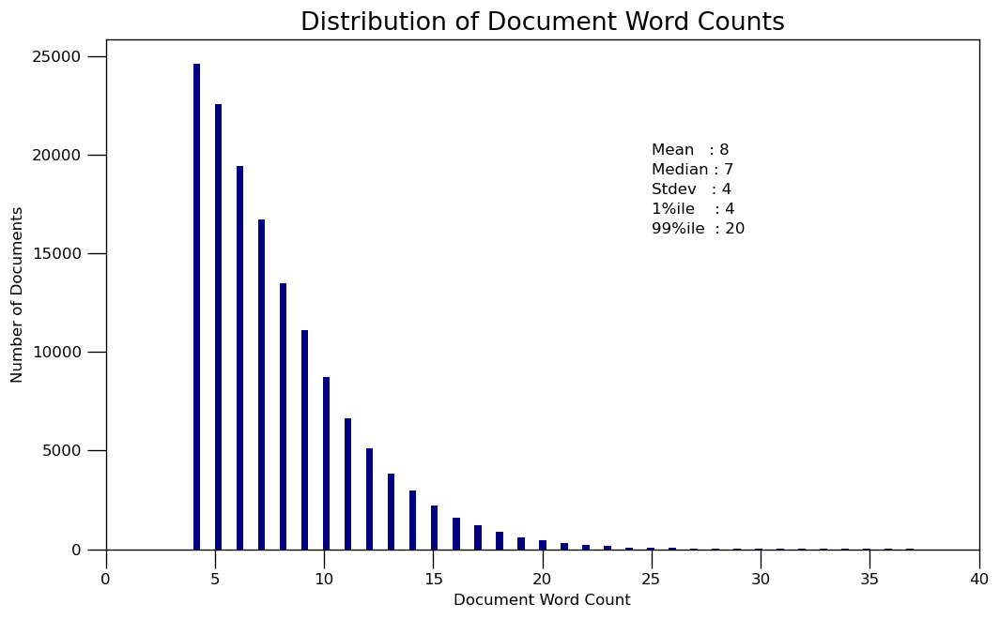

In [7]:
doc_lens = [len(d) for d in list_of_patients]

# Plot
plt.figure(figsize=(10,6), dpi=120)
plt.hist(doc_lens, bins = 100, color='navy')
plt.text(25, 20000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(25,  19000, "Median : " + str(round(np.median(doc_lens))))
plt.text(25,  18000, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(25,  17000, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(25,  16000, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 40), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=12)
plt.xticks(np.linspace(0,40,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=16))
plt.show()

In [5]:
id2word = corpora.Dictionary(list_of_patients)

corpus = []
for text in list_of_patients:
    new = id2word.doc2bow(text)
    corpus.append(new)

In [6]:
print(corpus[202][0:10])
print(id2word[202])

[(14, 1), (18, 1), (22, 1), (61, 1), (144, 1)]
SARS_CoV2


In [7]:
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=4,
                                           workers=3,
                                           random_state=1,
                                           chunksize=500,
                                           passes=10,
                                           alpha="asymmetric",
                                           eta=0.6)

# Note: num_topics attempted: 20, 15, 10, 5, 6, 4

In [11]:
# Compute Coherence Score
# Baseline Coherence Score with 4 topics, alpha = symmetric, eta = None: 0.3880742386
baseline = 0.3880742386

coherence_model_lda = CoherenceModel(model=lda_model, texts=list_of_patients, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

print("{n:0.2f}% Improvement".format(n=(coherence_lda*100/baseline)-100))


Coherence Score:  0.4534145307290916
16.84% Improvement


In [12]:
def lda_hyperparameter_tuning(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k,
                                           workers=3,
                                           random_state=100,
                                           chunksize=500,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=list_of_patients, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [12]:
grid = {}fwrq
grid['Validation_Set'] = {}

# Topics range
min_topics = 4
max_topics = 16
step_size = 2
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [# gensim.utils.ClippedCorpus(corpus, num_of_docs*0.25), 
               # gensim.utils.ClippedCorpus(corpus, num_of_docs*0.5), 
               gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['75% Corpus', '100% Corpus']
model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

if 1 == 1:
    pbar = tqdm.tqdm(total=540)
    
    # iterate through validation corpuses: 2
    for i in range(len(corpus_sets)):
        # iterate through number of topics: 7
        for k in topics_range:
            # iterate through alpha values: 5
            for a in alpha:
                # iterare through beta values: 4
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = lda_hyperparameter_tuning(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)
    pbar.close()

 67%|█████████████████████████████████████████████████▎                        | 360/540 [11:38:14<5:49:07, 116.37s/it]


In [13]:
model_tuning = pd.read_csv('lda_tuning_results.csv')

model_tuning.head()

,Validation_Set,Topics,Alpha,Beta,Coherence
0,75% Corpus,4,0.01,0.01,0.388121
1,75% Corpus,4,0.01,0.31,0.391315
2,75% Corpus,4,0.01,0.61,0.388686
3,75% Corpus,4,0.01,0.9099999999999999,0.387155
4,75% Corpus,4,0.01,symmetric,0.388121


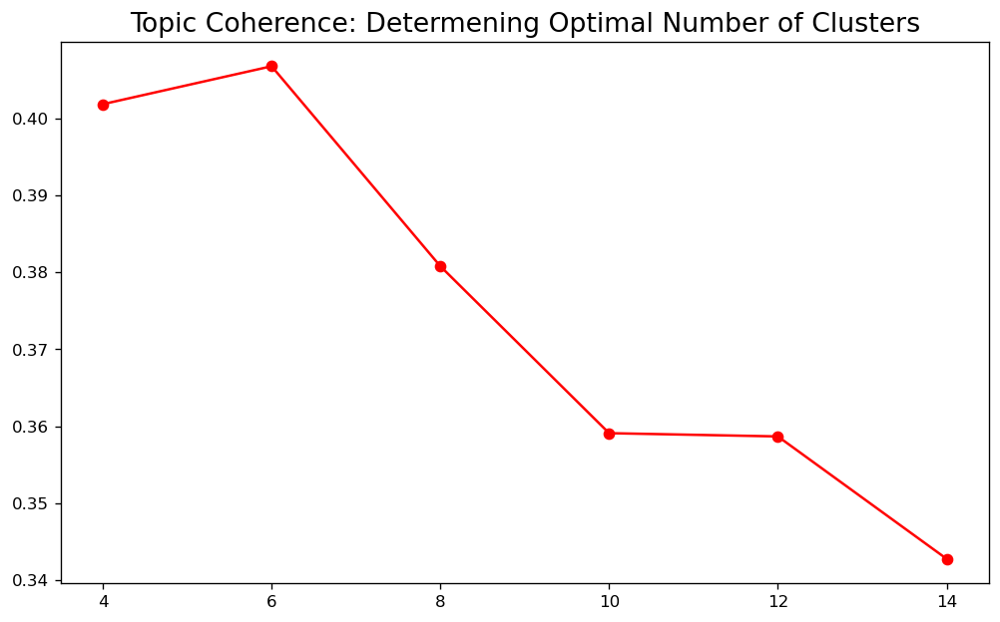

In [38]:
model_tuning.sort_values(axis=0, by=['Topics'], ascending=False, inplace=True)

filtered_model_tuning = model_tuning[(model_tuning['Alpha'] == '0.61') 
                    & (model_tuning['Beta'] == '0.31')
                    & (model_tuning['Validation_Set'] == '100% Corpus')]

x = filtered_model_tuning['Topics']
y = filtered_model_tuning['Coherence']

plt.figure(figsize=(10,6), dpi=120)
plt.plot(x, y, color='red', marker='o')

plt.title('Topic Coherence: Determening Optimal Number of Clusters', fontdict=dict(size=16))
plt.show()

In [15]:
top_hyperp = model_tuning[(model_tuning['Topics']==4) & (model_tuning['Validation_Set']=='100% Corpus')]
top_hyperp.sort_values(axis=0, by=['Coherence'], ascending=False, inplace=True)
top_hyperp.head()

G:\anacondapy3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,Validation_Set,Topics,Alpha,Beta,Coherence
207,100% Corpus,4,asymmetric,0.61,0.444272
209,100% Corpus,4,asymmetric,symmetric,0.442410
205,100% Corpus,4,asymmetric,0.01,0.441819
206,100% Corpus,4,asymmetric,0.31,0.441680
208,100% Corpus,4,asymmetric,0.9099999999999999,0.440264


In [15]:
pp.pprint(lda_model.print_topics())

[   (   0,
        '0.072*"dermatitis" + 0.067*"enthesopathy" + 0.056*"OA" + '
        '0.053*"allergic_rhinitis" + 0.051*"sinusitis" + 0.047*"hypertension" '
        '+ 0.039*"GORD" + 0.036*"asthma" + 0.033*"hearing_loss" + '
        '0.027*"depression"'),
    (   1,
        '0.139*"anxiety_phobia" + 0.132*"depression" + 0.084*"PTSD" + '
        '0.070*"menorrhagia" + 0.045*"migraine" + 0.045*"cin_cervical" + '
        '0.042*"somatoform" + 0.038*"enthesopathy" + '
        '0.031*"irritable_bowel_syndrome" + 0.027*"obesity"'),
    (   2,
        '0.144*"type_2_diabetes" + 0.121*"obesity" + 0.094*"hypertension" + '
        '0.089*"unspecified_rare_diabetes" + 0.063*"diab_eye" + '
        '0.044*"erectile_dysfunction" + 0.032*"cholelithiasis" + 0.030*"CHD" + '
        '0.028*"NAFLD_NASH" + 0.028*"sleep_apnoea"'),
    (   3,
        '0.093*"hypertension" + 0.080*"CHD" + 0.076*"erectile_dysfunction" + '
        '0.062*"BPH" + 0.061*"gout" + 0.054*"atrial_fibrilation" + '
        '0.049*"c

In [8]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis

G:\anacondapy3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.202689 -0.124903       1        1  54.272882
1     -0.212995  0.274148       2        1  19.615747
3      0.154001 -0.263935       3        1  14.193210
2      0.261683  0.114689       4        1  11.918161, topic_info=               Term          Freq         Total Category  logprob  loglift
66   anxiety_phobia  30137.000000  30137.000000  Default  30.0000  30.0000
9   type_2_diabetes  18925.000000  18925.000000  Default  29.0000  29.0000
27       depression  47864.000000  47864.000000  Default  28.0000  28.0000
7           obesity  21785.000000  21785.000000  Default  27.0000  27.0000
22     hypertension  56343.000000  56343.000000  Default  26.0000  26.0000
..              ...           ...           ...      ...      ...      ...
0                OA   2535.575754  42070.638220   Topic4  -3.9496  -0.6818
24          thyroid   1525.473252  18094.387937   Topic4  -4.4577  -0.3462
18     enthesopathy   2250.698807  56265.820918   Topic4  -4.0688  -1.0917
61     urolithiasis    857.093697   5282.968651   Topic4  -5.0343   0.3084
41             COPD    792.926865   6646.927590   Topic4  -5.1121   0.0009

[222 rows x 6 columns], token_table=      Topic      Freq               Term
term                                    
198       1  0.011875               ADHD
198       2  0.653138               ADHD
198       3  0.308756               ADHD
198       4  0.023750               ADHD
128       1  0.000866                BAD
...     ...       ...                ...
50        4  0.422476  vitb12_deficiency
135       1  0.994512           vitiligo
135       2  0.002706           vitiligo
135       3  0.001353           vitiligo
135       4  0.001353           vitiligo

[616 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 4, 3])

In [37]:
x=lda_model.show_topics(num_topics=4, num_words=50, formatted=False)
topics_words = [(tp[0], [wd[0] for wd in tp[1]]) for tp in x]

#Below Code Prints Topics and Words
for topic,words in topics_words:
    pp.pprint(str(topic)+ "::"+ str(words)+ ":: length: {n}".format(n=len(words)))
print()

# #Below Code Prints Only Words 
# for topic,words in topics_words:
#     pp.pprint(" ".join(words))

("0::['dermatitis', 'enthesopathy', 'OA', 'allergic_rhinitis', 'sinusitis', "
 "'hypertension', 'GORD', 'asthma', 'hearing_loss', 'depression', "
 "'spondylosis', 'gastritis_duodenitis', 'oesoph_ulc', 'venous_lymphatic', "
 "'oth_anaemia', 'seb_derm', 'skin_ulcer', 'thyroid', 'diverticular', "
 "'constipation_read', 'tinnitus', 'osteoporosis', 'intervert_disc', "
 "'iron_deficiency_anaemia', 'urticaria', 'irritable_bowel_syndrome', "
 "'migraine', 'pri_skin', 'alcohol_depend', 'rosacea', 'psoriasis', "
 "'urine_incont', 'periph_neuro', 'CKD', 'ulcer_peptic', 'COPD', 'glaucoma', "
 "'nasal_polyp', 'venous_thromb', 'RhA', 'vitb12_deficiency', 'urolithiasis', "
 "'neuro_bladder', 'lichen_planus', 'pri_melanoma', 'meniere', 'PMR', "
 "'bronchiectasis', 'ulc_colitis', 'hyper_nasal_turbs']:: length: 50")
("1::['anxiety_phobia', 'depression', 'PTSD', 'menorrhagia', 'migraine', "
 "'female_genital_prolapse', 'cin_cervical', 'somatoform', 'enthesopathy', "
 "'urine_incont', 'irritable_bowel_syn

In [17]:
def find_dominant_topics(ldamodel=None, corpus=corpus, texts=list_of_patients):
    
    dom_topics = pd.DataFrame()

    # Get main topic for each patient
    for i, row_list in enumerate(ldamodel[corpus]):
        
        if ldamodel.per_word_topics:
            row = row_list[0]
        else:
            row = row_list
        #print(row)
        
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each patient
        for j, (topic_num, prop_topic) in enumerate(row):
            
            # If dominant topic
            if j == 0:
                
                wp = ldamodel.show_topic(topic_num)
                
                topic_keywords = ", ".join([word for word, prop in wp])
                
                dom_topics = dom_topics.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
                
    dom_topics.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original patient record to the end of the output
    contents = pd.Series(texts)
    dom_topics = pd.concat([dom_topics, contents], axis=1)
    
    return dom_topics


temp = find_dominant_topics(ldamodel=lda_model, corpus=corpus, texts=list_of_patients)

# Format
dominant_patient_topics = temp.reset_index()
dominant_patient_topics.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
dominant_patient_topics.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.6453,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[dermatitis, erectile_dysfunction, OA, pri_ski..."
1,1,2.0,0.3839,"type_2_diabetes, obesity, hypertension, unspec...","[female_genital_prolapse, fracture_hip, obesit..."
2,2,3.0,0.6678,"hypertension, CHD, erectile_dysfunction, BPH, ...","[pri_skin, allergic_rhinitis, atrial_fibrilati..."
3,3,0.0,0.5828,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[OA, enthesopathy, hypertension, thyroid, cons..."
4,4,3.0,0.6484,"hypertension, CHD, erectile_dysfunction, BPH, ...","[OA, pri_skin, enthesopathy, CCD]"
5,5,0.0,0.8749,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[allergic_rhinitis, enthesopathy, hypertension..."
6,6,2.0,0.6909,"type_2_diabetes, obesity, hypertension, unspec...","[erectile_dysfunction, type_2_diabetes, allerg..."
7,7,2.0,0.5279,"type_2_diabetes, obesity, hypertension, unspec...","[erectile_dysfunction, pri_skin, type_2_diabet..."
8,8,0.0,0.6782,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[dermatitis, type_2_diabetes, enthesopathy, hy..."
9,9,0.0,0.5421,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[OA, allergic_rhinitis, menorrhagia, asthma, f..."


In [25]:
dominant_patient_topics.head(20)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.6453,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[dermatitis, erectile_dysfunction, OA, pri_ski..."
1,1,2.0,0.3839,"type_2_diabetes, obesity, hypertension, unspec...","[female_genital_prolapse, fracture_hip, obesit..."
2,2,3.0,0.6678,"hypertension, CHD, erectile_dysfunction, BPH, ...","[pri_skin, allergic_rhinitis, atrial_fibrilati..."
3,3,0.0,0.5828,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[OA, enthesopathy, hypertension, thyroid, cons..."
4,4,3.0,0.6484,"hypertension, CHD, erectile_dysfunction, BPH, ...","[OA, pri_skin, enthesopathy, CCD]"
5,5,0.0,0.8749,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[allergic_rhinitis, enthesopathy, hypertension..."
6,6,2.0,0.6909,"type_2_diabetes, obesity, hypertension, unspec...","[erectile_dysfunction, type_2_diabetes, allerg..."
7,7,2.0,0.5279,"type_2_diabetes, obesity, hypertension, unspec...","[erectile_dysfunction, pri_skin, type_2_diabet..."
8,8,0.0,0.6782,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[dermatitis, type_2_diabetes, enthesopathy, hy..."
9,9,0.0,0.5421,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[OA, allergic_rhinitis, menorrhagia, asthma, f..."


In [27]:

pp.pprint(dominant_patient_topics.loc[0, 'Keywords'])
pp.pprint(dominant_patient_topics.loc[17, 'Keywords'])
pp.pprint(dominant_patient_topics.loc[1, 'Keywords'])
pp.pprint(dominant_patient_topics.loc[2, 'Keywords'])


('dermatitis, enthesopathy, OA, allergic_rhinitis, sinusitis, hypertension, '
 'GORD, asthma, hearing_loss, depression')
('anxiety_phobia, depression, PTSD, menorrhagia, migraine, '
 'female_genital_prolapse, cin_cervical, somatoform, enthesopathy, '
 'urine_incont')
('type_2_diabetes, obesity, hypertension, unspecified_rare_diabetes, diab_eye, '
 'erectile_dysfunction, CHD, cholelithiasis, NAFLD_NASH, sleep_apnoea')
('hypertension, CHD, erectile_dysfunction, BPH, gout, atrial_fibrilation, '
 'cerebrovascular_dz, CKD, enthesopathy, OA')


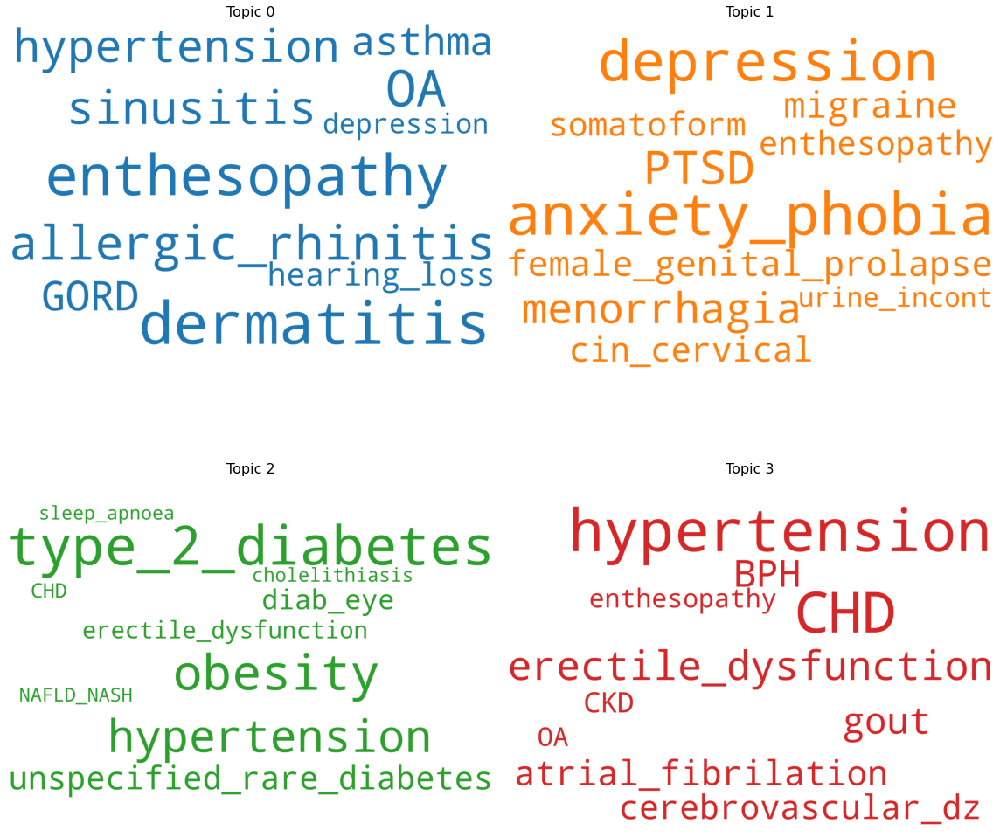

In [18]:
# Wordcloud of Top N LTCs for each topic

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(16,16), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()
cloud.to_file("../images/Optimized 4 Topics WordCloud.png")

In [85]:
test1 = lda_model[corpus]
for topic in test1:
    print(topic)

[(0, 0.63382083), (1, 0.043616418), (2, 0.032889202), (3, 0.28967354)]
[(0, 0.5466236), (1, 0.034309823), (2, 0.39953342), (3, 0.01953317)]
[(0, 0.2018773), (1, 0.017524308), (2, 0.10172625), (3, 0.67887217)]
[(0, 0.62290907), (1, 0.33772382), (2, 0.021956202), (3, 0.017410962)]
[(0, 0.14805104), (1, 0.053073846), (2, 0.03920535), (3, 0.7596698)]
[(0, 0.8752433), (1, 0.053750645), (2, 0.03968098), (3, 0.03132508)]
[(0, 0.24790597), (1, 0.03716084), (2, 0.6925593), (3, 0.022373894)]
[(0, 0.052005846), (1, 0.032493856), (2, 0.529572), (3, 0.3859283)]
[(0, 0.6664143), (1, 0.026455123), (2, 0.2914848), (3, 0.01564582)]
[(0, 0.55655575), (1, 0.38487312), (2, 0.032556448), (3, 0.026014728)]
[(0, 0.80104667), (1, 0.16370305), (2, 0.019593142), (3, 0.015657144)]
[(0, 0.47634026), (1, 0.13096428), (2, 0.12799904), (3, 0.26469642)]
[(0, 0.5461078), (1, 0.30545625), (2, 0.1328055), (3, 0.015630422)]
[(0, 0.12875158), (1, 0.020134112), (2, 0.5890379), (3, 0.2620764)]
[(0, 0.06625922), (1, 0.043477

[(0, 0.09564255), (1, 0.83414096), (2, 0.039000828), (3, 0.031215698)]
[(0, 0.5304158), (1, 0.04407323), (2, 0.3992019), (3, 0.026309047)]
[(0, 0.2431785), (1, 0.6843984), (2, 0.040800285), (3, 0.031622753)]
[(0, 0.49537548), (1, 0.023008073), (2, 0.23002157), (3, 0.2515949)]
[(0, 0.89745486), (1, 0.043620262), (2, 0.032844625), (3, 0.026080258)]
[(0, 0.40428197), (1, 0.4165544), (2, 0.16348507), (3, 0.015678545)]
[(0, 0.6099125), (1, 0.34624508), (2, 0.024351154), (3, 0.019491242)]
[(0, 0.57195425), (1, 0.055310477), (2, 0.34140742), (3, 0.0313278)]
[(0, 0.4686826), (1, 0.49895117), (2, 0.01817799), (3, 0.014188247)]
[(0, 0.51544106), (1, 0.413248), (2, 0.039814837), (3, 0.031496074)]
[(0, 0.63649565), (1, 0.29306796), (2, 0.039145913), (3, 0.031290464)]
[(0, 0.6505327), (1, 0.03293836), (2, 0.024893025), (3, 0.2916359)]
[(0, 0.58422124), (1, 0.023053972), (2, 0.19398813), (3, 0.19873668)]
[(0, 0.87644345), (1, 0.053190388), (2, 0.039112866), (3, 0.031253345)]
[(0, 0.3542152), (1, 0.6

[(0, 0.8009412), (1, 0.029436022), (2, 0.1522648), (3, 0.017357906)]
[(0, 0.12410921), (1, 0.58414495), (2, 0.03902123), (3, 0.25272468)]
[(0, 0.9121528), (1, 0.03765958), (2, 0.027857466), (3, 0.022330148)]
[(0, 0.45161194), (1, 0.50942564), (2, 0.021645637), (3, 0.017316755)]
[(0, 0.91182363), (1, 0.037655428), (2, 0.02818431), (3, 0.022336643)]
[(0, 0.87611914), (1, 0.05343446), (2, 0.039179865), (3, 0.03126652)]
[(0, 0.646996), (1, 0.032864496), (2, 0.024827816), (3, 0.29531166)]
[(0, 0.60818475), (1, 0.054162182), (2, 0.038997915), (3, 0.29865518)]
[(0, 0.696718), (1, 0.038349997), (2, 0.028033582), (3, 0.23689842)]
[(0, 0.5774279), (1, 0.038254622), (2, 0.028375063), (3, 0.3559424)]
[(0, 0.5130825), (1, 0.4282668), (2, 0.032644846), (3, 0.02600586)]
[(0, 0.6680021), (1, 0.30832142), (2, 0.013208734), (3, 0.010467701)]
[(0, 0.7387094), (1, 0.21075377), (2, 0.02818148), (3, 0.022355394)]
[(0, 0.6956769), (1, 0.037954133), (2, 0.027915508), (3, 0.23845345)]
[(0, 0.067255154), (1, 0.

[(0, 0.86588097), (1, 0.11210877), (2, 0.012222181)]
[(0, 0.5795482), (1, 0.015963783), (2, 0.3952637)]
[(0, 0.93149805), (1, 0.028953925), (2, 0.022074098), (3, 0.01747394)]
[(0, 0.83813494), (1, 0.13258363), (2, 0.016275804), (3, 0.01300562)]
[(0, 0.75548714), (1, 0.037555184), (2, 0.028046297), (3, 0.17891137)]
[(0, 0.8955848), (1, 0.045504622), (2, 0.032832626), (3, 0.026077928)]
[(0, 0.5803246), (1, 0.04454518), (2, 0.033156708), (3, 0.34197348)]
[(0, 0.7362426), (1, 0.234349), (2, 0.016391845), (3, 0.013016575)]
[(0, 0.071074665), (1, 0.6169246), (2, 0.033197254), (3, 0.27880344)]
[(0, 0.33937836), (1, 0.6095445), (2, 0.028813291), (3, 0.02226381)]
[(0, 0.36079013), (1, 0.021869747), (2, 0.016353298), (3, 0.60098684)]
[(0, 0.13091718), (1, 0.053528864), (2, 0.49246877), (3, 0.3230852)]
[(0, 0.6716386), (1, 0.058224842), (2, 0.039756034), (3, 0.23038056)]
[(0, 0.4539874), (1, 0.035486676), (2, 0.49093536), (3, 0.019590592)]
[(0, 0.66089153), (1, 0.3095551), (2, 0.016499434), (3, 0

[(0, 0.44313556), (1, 0.51760095), (2, 0.021924451), (3, 0.017339012)]
[(0, 0.87765557), (1, 0.05202657), (2, 0.039047018), (3, 0.031270884)]
[(0, 0.38788778), (1, 0.043888886), (2, 0.033051174), (3, 0.5351721)]
[(0, 0.4801704), (1, 0.054042876), (2, 0.43452978), (3, 0.031256966)]
[(0, 0.64335775), (1, 0.043958433), (2, 0.033140704), (3, 0.27954313)]
[(0, 0.06626696), (1, 0.043477263), (2, 0.86424017), (3, 0.026015617)]
[(0, 0.47759807), (1, 0.4522675), (2, 0.038965277), (3, 0.031169187)]
[(0, 0.4257048), (1, 0.21824384), (2, 0.01979752), (3, 0.33625382)]
[(0, 0.89710486), (1, 0.043786522), (2, 0.0330063), (3, 0.026102306)]
[(0, 0.7217682), (1, 0.044663947), (2, 0.20756447), (3, 0.026003359)]
[(0, 0.55794764), (1, 0.4165751), (2, 0.01432987), (3, 0.011147407)]
[(0, 0.72125006), (1, 0.028901402), (2, 0.02180225), (3, 0.22804625)]
[(0, 0.9371229), (1, 0.027630022), (2, 0.01957835), (3, 0.015668694)]
[(0, 0.2942784), (1, 0.03302188), (2, 0.024734192), (3, 0.64796555)]
[(0, 0.49435517), (1

[(0, 0.87730217), (1, 0.052564632), (2, 0.038963076), (3, 0.03117016)]
[(0, 0.0794015), (1, 0.46583724), (2, 0.423591), (3, 0.03117023)]
[(0, 0.24282244), (1, 0.5507868), (2, 0.028494166), (3, 0.17789657)]
[(0, 0.33834812), (1, 0.016484065), (2, 0.18772656), (3, 0.45744127)]
[(0, 0.30468848), (1, 0.3450263), (2, 0.3346696), (3, 0.01561563)]
[(0, 0.5165021), (1, 0.44450524), (2, 0.021664675), (3, 0.017328035)]
[(0, 0.43136021), (1, 0.12230208), (2, 0.01780312), (3, 0.42853454)]
[(0, 0.68467844), (1, 0.02954692), (2, 0.26830405), (3, 0.017470578)]
[(0, 0.8749286), (1, 0.053792514), (2, 0.03982925), (3, 0.03144964)]
[(0, 0.5591419), (1, 0.053268433), (2, 0.039042637), (3, 0.34854698)]
[(0, 0.7079686), (1, 0.25686803), (2, 0.019547686), (3, 0.015615706)]
[(0, 0.81561214), (1, 0.02405322), (2, 0.017842455), (3, 0.1424922)]
[(0, 0.07576203), (1, 0.037341155), (2, 0.028063985), (3, 0.85883284)]
[(0, 0.44939762), (1, 0.14004241), (2, 0.16890483), (3, 0.2416551)]
[(0, 0.17895484), (1, 0.1290576

[(0, 0.6214173), (1, 0.052883953), (2, 0.038966395), (3, 0.28673232)]
[(0, 0.30135095), (1, 0.05279838), (2, 0.6143785), (3, 0.03147217)]
[(0, 0.8969922), (1, 0.04414353), (2, 0.032659043), (3, 0.026205244)]
[(0, 0.43553114), (1, 0.32957113), (2, 0.21926793), (3, 0.015629794)]
[(0, 0.5531203), (1, 0.35325837), (2, 0.08321551), (3, 0.010405757)]
[(0, 0.4823495), (1, 0.21087074), (2, 0.028736439), (3, 0.27804336)]
[(0, 0.37517428), (1, 0.58084977), (2, 0.024439713), (3, 0.019536257)]
[(0, 0.38224542), (1, 0.57380235), (2, 0.024439355), (3, 0.019512901)]
[(0, 0.71825093), (1, 0.04074724), (2, 0.028002365), (3, 0.21299943)]
[(0, 0.57829165), (1, 0.38147682), (2, 0.022824977), (3, 0.017406601)]
[(0, 0.609334), (1, 0.23332858), (2, 0.022024577), (3, 0.13531284)]
[(0, 0.9112807), (1, 0.037814017), (2, 0.028434394), (3, 0.022470908)]
[(0, 0.8970505), (1, 0.043810263), (2, 0.03294927), (3, 0.026189953)]
[(0, 0.7069087), (1, 0.2344787), (2, 0.032582354), (3, 0.026030257)]
[(0, 0.31038138), (1, 0

[(0, 0.51210636), (1, 0.036176275), (2, 0.0245908), (3, 0.42712662)]
[(0, 0.70926714), (1, 0.047946215), (2, 0.032514572), (3, 0.21027207)]
[(0, 0.9114337), (1, 0.037589684), (2, 0.028504528), (3, 0.022472093)]
[(0, 0.8761489), (1, 0.05354596), (2, 0.03909299), (3, 0.031212226)]
[(0, 0.5136356), (1, 0.14406914), (2, 0.22628696), (3, 0.116008356)]
[(0, 0.9120475), (1, 0.037459094), (2, 0.028219434), (3, 0.022273945)]
[(0, 0.87726283), (1, 0.05249026), (2, 0.03904108), (3, 0.031205812)]
[(0, 0.54089403), (1, 0.4088803), (2, 0.027932195), (3, 0.022293486)]
[(0, 0.42267498), (1, 0.50655067), (2, 0.03937771), (3, 0.031396624)]
[(0, 0.099482514), (1, 0.3813629), (2, 0.03293318), (3, 0.48622146)]
[(0, 0.55764246), (1, 0.41675556), (2, 0.014465731), (3, 0.011136284)]
[(0, 0.70501983), (1, 0.2630491), (2, 0.0177411), (3, 0.014189979)]
[(0, 0.35368133), (1, 0.58776104), (2, 0.032525595), (3, 0.02603199)]
[(0, 0.42281142), (1, 0.09082918), (2, 0.024644313), (3, 0.4617151)]
[(0, 0.4227749), (1, 0.

[(0, 0.5616247), (1, 0.36812782), (2, 0.03903547), (3, 0.031211972)]
[(0, 0.91046107), (1, 0.03894263), (2, 0.028173042), (3, 0.02242326)]
[(0, 0.79004717), (1, 0.025762549), (2, 0.16997787), (3, 0.014212367)]
[(0, 0.7845701), (1, 0.028991504), (2, 0.021836791), (3, 0.16460158)]
[(0, 0.28050342), (1, 0.0333379), (2, 0.024589147), (3, 0.66156954)]
[(0, 0.70242316), (1, 0.026364014), (2, 0.019579094), (3, 0.2516337)]
[(0, 0.5307042), (1, 0.026281718), (2, 0.019659588), (3, 0.42335448)]
[(0, 0.04088872), (1, 0.026096063), (2, 0.57406646), (3, 0.3589488)]
[(0, 0.079971224), (1, 0.052234616), (2, 0.836272), (3, 0.0315222)]
[(0, 0.5701178), (1, 0.057068396), (2, 0.34148782), (3, 0.031326074)]
[(0, 0.8972849), (1, 0.0438705), (2, 0.032847844), (3, 0.025996672)]
[(0, 0.6447023), (1, 0.3226351), (2, 0.018486317), (3, 0.014176248)]
[(0, 0.39528874), (1, 0.5608238), (2, 0.024370985), (3, 0.019516489)]
[(0, 0.87543154), (1, 0.053523485), (2, 0.039714716), (3, 0.03133024)]
[(0, 0.42022288), (1, 0.5

[(0, 0.2934101), (1, 0.029802619), (2, 0.021992708), (3, 0.6547946)]
[(0, 0.9305153), (1, 0.030215831), (2, 0.021856828), (3, 0.017412065)]
[(0, 0.0701909), (1, 0.043348595), (2, 0.2361154), (3, 0.65034515)]
[(0, 0.92317617), (1, 0.03278115), (2, 0.024434177), (3, 0.019608488)]
[(0, 0.68991876), (1, 0.26613018), (2, 0.02445251), (3, 0.019498555)]
[(0, 0.77483636), (1, 0.181225), (2, 0.02441311), (3, 0.0195255)]
[(0, 0.63721937), (1, 0.13011812), (2, 0.21965167), (3, 0.013010823)]
[(0, 0.46124327), (1, 0.48002878), (2, 0.032723166), (3, 0.026004767)]
[(0, 0.6763285), (1, 0.28850535), (2, 0.019546939), (3, 0.015619248)]
[(0, 0.6155813), (1, 0.0218472), (2, 0.34947643), (3, 0.013095109)]
[(0, 0.7762727), (1, 0.031414468), (2, 0.022157654), (3, 0.17015523)]
[(0, 0.418444), (1, 0.5308783), (2, 0.028297607), (3, 0.02238012)]
[(0, 0.5022552), (1, 0.44750154), (2, 0.027930558), (3, 0.022312695)]
[(0, 0.6205522), (1, 0.30844876), (2, 0.0396574), (3, 0.031341642)]
[(0, 0.0794661), (1, 0.4766738)

[(0, 0.91953105), (1, 0.036246557), (2, 0.024663102), (3, 0.019559272)]
[(0, 0.7127452), (1, 0.015093394), (2, 0.09951929), (3, 0.17264211)]
[(0, 0.765748), (1, 0.19006345), (2, 0.024640663), (3, 0.019547896)]
[(0, 0.64727336), (1, 0.033959914), (2, 0.024636926), (3, 0.29412976)]
[(0, 0.09550734), (1, 0.84558487), (2, 0.0328959), (3, 0.026011836)]
[(0, 0.14478768), (1, 0.026810903), (2, 0.3651587), (3, 0.46324268)]
[(0, 0.86942595), (1, 0.059420124), (2, 0.039743904), (3, 0.03140998)]
[(0, 0.09712288), (1, 0.6906837), (2, 0.039998185), (3, 0.17219524)]
[(0, 0.5306316), (1, 0.300228), (2, 0.01955537), (3, 0.14958502)]
[(0, 0.87699777), (1, 0.05284908), (2, 0.038963318), (3, 0.031189874)]
[(0, 0.8941056), (1, 0.047253534), (2, 0.032591745), (3, 0.026049117)]
[(0, 0.51275337), (1, 0.41710687), (2, 0.038970772), (3, 0.031168988)]
[(0, 0.46818626), (1, 0.030646417), (2, 0.020227473), (3, 0.48093984)]
[(0, 0.63955736), (1, 0.021848937), (2, 0.01643621), (3, 0.3221575)]
[(0, 0.39782968), (1, 

[(0, 0.53762174), (1, 0.029254995), (2, 0.021913977), (3, 0.41120932)]
[(0, 0.6413602), (1, 0.31832427), (2, 0.022936463), (3, 0.017379008)]
[(0, 0.5201822), (1, 0.4082692), (2, 0.04037945), (3, 0.031169187)]
[(0, 0.22937131), (1, 0.34363768), (2, 0.011556665), (3, 0.4154343)]
[(0, 0.5939599), (1, 0.032727007), (2, 0.025053749), (3, 0.34825927)]
[(0, 0.59547836), (1, 0.044364486), (2, 0.032729488), (3, 0.32742763)]
[(0, 0.87457764), (1, 0.053923998), (2, 0.040017385), (3, 0.031480983)]
[(0, 0.33369017), (1, 0.5961163), (2, 0.039021134), (3, 0.031172384)]
[(0, 0.61450386), (1, 0.026913952), (2, 0.01954267), (3, 0.3390395)]
[(0, 0.7044166), (1, 0.26027313), (2, 0.019667365), (3, 0.01564296)]
[(0, 0.818408), (1, 0.021956375), (2, 0.016341634), (3, 0.14329396)]
[(0, 0.43201286), (1, 0.544536), (2, 0.013046386), (3, 0.010404729)]
[(0, 0.348168), (1, 0.6066211), (2, 0.025612704), (3, 0.019598253)]
[(0, 0.08083228), (1, 0.2566138), (2, 0.03944681), (3, 0.62310714)]
[(0, 0.65864867), (1, 0.053

[(0, 0.25310254), (1, 0.043370474), (2, 0.03278559), (3, 0.67074144)]
[(0, 0.56975013), (1, 0.029213855), (2, 0.38357666), (3, 0.01745933)]
[(0, 0.91069925), (1, 0.03840715), (2, 0.02843421), (3, 0.022459392)]
[(0, 0.39128423), (1, 0.04381174), (2, 0.032868553), (3, 0.53203547)]
[(0, 0.71461743), (1, 0.2602144), (2, 0.014001596), (3, 0.011166582)]
[(0, 0.8770797), (1, 0.052555207), (2, 0.03910104), (3, 0.03126397)]
[(0, 0.59287477), (1, 0.17505506), (2, 0.21904397), (3, 0.013026264)]
[(0, 0.61359614), (1, 0.043792833), (2, 0.032800797), (3, 0.30981025)]
[(0, 0.49155262), (1, 0.05280028), (2, 0.039429218), (3, 0.41621792)]
[(0, 0.69329536), (1, 0.029786896), (2, 0.021740323), (3, 0.25517738)]
[(0, 0.34280038), (1, 0.14449221), (2, 0.019638723), (3, 0.49306867)]
[(0, 0.30626777), (1, 0.026479557), (2, 0.23134221), (3, 0.43591043)]
[(0, 0.3224189), (1, 0.03435562), (2, 0.34597117), (3, 0.2972543)]
[(0, 0.78615403), (1, 0.16937602), (2, 0.024813954), (3, 0.019656006)]
[(0, 0.7258415), (1, 

[(0, 0.56287426), (1, 0.015305394), (2, 0.07571447), (3, 0.34610596)]
[(0, 0.60699946), (1, 0.022015616), (2, 0.35792133), (3, 0.013063568)]
[(0, 0.42928794), (1, 0.2429165), (2, 0.31910947)]
[(0, 0.58201826), (1, 0.22468112), (2, 0.024473416), (3, 0.16882722)]
[(0, 0.37042597), (1, 0.570868), (2, 0.032731302), (3, 0.025974663)]
[(0, 0.65133584), (1, 0.30465198), (2, 0.024512842), (3, 0.019499348)]
[(0, 0.8788688), (1, 0.015189762), (2, 0.01088808), (3, 0.095053315)]
[(0, 0.8764226), (1, 0.05274811), (2, 0.039450783), (3, 0.031378467)]
[(0, 0.24470115), (1, 0.7163237), (2, 0.021658206), (3, 0.017316965)]
[(0, 0.5642309), (1, 0.30973512), (2, 0.015079793), (3, 0.11095414)]
[(0, 0.6070826), (1, 0.34904584), (2, 0.024376325), (3, 0.01949526)]
[(0, 0.69923306), (1, 0.27128726), (2, 0.016428927), (3, 0.013050793)]
[(0, 0.17804466), (1, 0.3819266), (2, 0.420548), (3, 0.019480713)]
[(0, 0.58053625), (1, 0.044641502), (2, 0.3486803), (3, 0.02614197)]
[(0, 0.8934788), (1, 0.048016887), (2, 0.03

[(0, 0.3942443), (1, 0.3201424), (2, 0.019555518), (3, 0.2660578)]
[(0, 0.082369216), (1, 0.8474626), (2, 0.03896304), (3, 0.031205133)]
[(0, 0.7490564), (1, 0.038683448), (2, 0.02799708), (3, 0.1842631)]
[(0, 0.45362687), (1, 0.2216275), (2, 0.30729434), (3, 0.017451284)]
[(0, 0.056625713), (1, 0.030218922), (2, 0.14947301), (3, 0.76368237)]
[(0, 0.39153352), (1, 0.033471942), (2, 0.20649932), (3, 0.3684952)]
[(0, 0.67706406), (1, 0.2644915), (2, 0.032468606), (3, 0.025975864)]
[(0, 0.6652726), (1, 0.29528093), (2, 0.022123693), (3, 0.017322775)]
[(0, 0.36404896), (1, 0.5918208), (2, 0.024583124), (3, 0.019547107)]
[(0, 0.8974551), (1, 0.043383937), (2, 0.03298292), (3, 0.026178066)]
[(0, 0.9223691), (1, 0.03375601), (2, 0.024381362), (3, 0.019493463)]
[(0, 0.074972294), (1, 0.37771806), (2, 0.521267), (3, 0.02604264)]
[(0, 0.92287964), (1, 0.033176053), (2, 0.024421398), (3, 0.019522948)]
[(0, 0.9230039), (1, 0.03288081), (2, 0.02455393), (3, 0.019561348)]
[(0, 0.6444777), (1, 0.2845

[(0, 0.87638795), (1, 0.05317287), (2, 0.0391512), (3, 0.031287972)]
[(0, 0.56906587), (1, 0.046704214), (2, 0.35804564), (3, 0.02618426)]
[(0, 0.86772203), (1, 0.017433451), (2, 0.10440955), (3, 0.010434957)]
[(0, 0.05099114), (1, 0.18869519), (2, 0.23569387), (3, 0.5246198)]
[(0, 0.43343034), (1, 0.52755487), (2, 0.021698037), (3, 0.017316734)]
[(0, 0.540566), (1, 0.040290054), (2, 0.0280471), (3, 0.3910968)]
[(0, 0.87543726), (1, 0.053599462), (2, 0.039515387), (3, 0.03144791)]
[(0, 0.62740314), (1, 0.3406841), (2, 0.017737605), (3, 0.014175183)]
[(0, 0.040371906), (1, 0.025990184), (2, 0.37855098), (3, 0.555087)]
[(0, 0.8170947), (1, 0.1594696), (2, 0.013026279), (3, 0.010409449)]
[(0, 0.45233598), (1, 0.5119275), (2, 0.020086335), (3, 0.015650159)]
[(0, 0.43452775), (1, 0.4963507), (3, 0.060009487)]
[(0, 0.22114487), (1, 0.033627603), (2, 0.21733244), (3, 0.5278951)]
[(0, 0.5142218), (1, 0.052705016), (2, 0.40175655), (3, 0.031316675)]
[(0, 0.7423569), (1, 0.22255443), (2, 0.01950

[(0, 0.57761484), (1, 0.040864673), (2, 0.027910862), (3, 0.35360965)]
[(0, 0.7061397), (1, 0.25437993), (2, 0.022062942), (3, 0.017417423)]
[(0, 0.74505514), (1, 0.11139171), (2, 0.13478538)]
[(0, 0.7229402), (1, 0.22661485), (2, 0.028105954), (3, 0.022338966)]
[(0, 0.90926665), (1, 0.040510837), (2, 0.027943408), (3, 0.022279132)]
[(0, 0.6793085), (1, 0.045032024), (2, 0.24962723), (3, 0.02603227)]
[(0, 0.2940487), (1, 0.036476772), (2, 0.024650699), (3, 0.64482385)]
[(0, 0.30489352), (1, 0.2854739), (2, 0.039443444), (3, 0.37018913)]
[(0, 0.8770807), (1, 0.05248309), (2, 0.039023977), (3, 0.031412262)]
[(0, 0.70056736), (1, 0.039130345), (2, 0.028060535), (3, 0.23224178)]
[(0, 0.08724019), (1, 0.052027993), (2, 0.039412923), (3, 0.82131886)]
[(0, 0.7104691), (1, 0.04602615), (2, 0.032514956), (3, 0.21098976)]
[(0, 0.52197164), (1, 0.40782446), (2, 0.03903481), (3, 0.031169107)]
[(0, 0.29213268), (1, 0.63575286), (2, 0.040945265), (3, 0.031169211)]
[(0, 0.45606047), (1, 0.2153636), (

[(0, 0.6063665), (1, 0.024198012), (2, 0.14871752), (3, 0.22071795)]
[(0, 0.5180022), (1, 0.44301316), (2, 0.021667475), (3, 0.0173172)]
[(0, 0.86898255), (1, 0.060706664), (2, 0.039140634), (3, 0.031170195)]
[(0, 0.74632275), (1, 0.033397734), (2, 0.20072167), (3, 0.019557869)]
[(0, 0.8502427), (1, 0.02221716), (2, 0.016308332), (3, 0.11123183)]
[(0, 0.8515019), (1, 0.02082361), (2, 0.115643986), (3, 0.0120305745)]
[(0, 0.93629426), (1, 0.02845003), (2, 0.019639134), (3, 0.015616588)]
[(0, 0.7896208), (1, 0.17842853), (2, 0.017760523), (3, 0.014190156)]
[(0, 0.9117525), (1, 0.03776556), (2, 0.028126156), (3, 0.022355774)]
[(0, 0.751903), (1, 0.22403055), (2, 0.013659668), (3, 0.010406733)]
[(0, 0.51926893), (1, 0.43051276), (2, 0.027899234), (3, 0.02231907)]
[(0, 0.6805579), (1, 0.16563478), (2, 0.019843994), (3, 0.13396332)]
[(0, 0.06726083), (1, 0.043557834), (2, 0.5902871), (3, 0.29889423)]
[(0, 0.063044444), (1, 0.62851053), (2, 0.028424859), (3, 0.28002015)]
[(0, 0.6261417), (1, 

[(0, 0.53759557), (1, 0.41848332), (2, 0.02442463), (3, 0.019496465)]
[(0, 0.40484744), (1, 0.25171062), (2, 0.02168416), (3, 0.32175773)]
[(0, 0.58437175), (1, 0.37174597), (2, 0.024400996), (3, 0.019481327)]
[(0, 0.613097), (1, 0.037456878), (2, 0.028371958), (3, 0.32107413)]
[(0, 0.41692033), (1, 0.52453196), (2, 0.032521833), (3, 0.026025888)]
[(0, 0.5895778), (1, 0.36027327), (2, 0.02783082), (3, 0.02231813)]
[(0, 0.87633884), (1, 0.052450802), (2, 0.03983198), (3, 0.031378355)]
[(0, 0.6088554), (1, 0.3516394), (2, 0.02214859), (3, 0.017356563)]
[(0, 0.63219875), (1, 0.029287236), (2, 0.022027763), (3, 0.31648624)]
[(0, 0.07855166), (1, 0.8629808), (2, 0.03249339), (3, 0.025974104)]
[(0, 0.6906507), (1, 0.03774608), (2, 0.02792858), (3, 0.24367465)]
[(0, 0.6692054), (1, 0.037378404), (2, 0.02847998), (3, 0.26493624)]
[(0, 0.8749465), (1, 0.054501172), (2, 0.039302293), (3, 0.031250093)]
[(0, 0.7935614), (1, 0.035544988), (2, 0.15139078), (3, 0.01950284)]
[(0, 0.3308763), (1, 0.037

[(0, 0.65839905), (1, 0.28282684), (2, 0.032741778), (3, 0.026032332)]
[(0, 0.74503356), (1, 0.032813706), (2, 0.02474838), (3, 0.1974044)]
[(0, 0.920855), (1, 0.034879148), (2, 0.02470839), (3, 0.019557461)]
[(0, 0.71195525), (1, 0.22907905), (2, 0.032871377), (3, 0.026094297)]
[(0, 0.7699984), (1, 0.15908383), (2, 0.039626114), (3, 0.03129168)]
[(0, 0.74701375), (1, 0.021938669), (2, 0.21793708), (3, 0.013110512)]
[(0, 0.08743745), (1, 0.037367743), (2, 0.028128562), (3, 0.8470663)]
[(0, 0.3659379), (1, 0.57506603), (2, 0.03298424), (3, 0.026011815)]
[(0, 0.080141276), (1, 0.84843737), (2, 0.040252395), (3, 0.031168947)]
[(0, 0.72688067), (1, 0.046942513), (2, 0.032469314), (3, 0.19370753)]
[(0, 0.67942953), (1, 0.26199684), (2, 0.03251745), (3, 0.026056185)]
[(0, 0.7114215), (1, 0.038037755), (2, 0.22819486), (3, 0.022345869)]
[(0, 0.6382253), (1, 0.3226841), (2, 0.021723842), (3, 0.017366786)]
[(0, 0.33594674), (1, 0.6403648), (2, 0.013288886), (3, 0.010399544)]
[(0, 0.276136), (1,

[(0, 0.9308532), (1, 0.029977445), (2, 0.021779569), (3, 0.017389746)]
[(0, 0.09550161), (1, 0.84562725), (2, 0.032808844), (3, 0.026062291)]
[(0, 0.51541406), (1, 0.04523451), (2, 0.41305152), (3, 0.026299901)]
[(0, 0.15726773), (1, 0.24068548), (2, 0.027978433), (3, 0.57406837)]
[(0, 0.5149848), (1, 0.4454649), (2, 0.02214577), (3, 0.017404512)]
[(0, 0.9120033), (1, 0.037672244), (2, 0.028002946), (3, 0.02232153)]
[(0, 0.86710507), (1, 0.06236062), (2, 0.0392297), (3, 0.031304587)]
[(0, 0.4171274), (1, 0.5124835), (2, 0.039138976), (3, 0.03125016)]
[(0, 0.05576882), (1, 0.029618712), (2, 0.021831637), (3, 0.89278084)]
[(0, 0.438297), (1, 0.0386362), (2, 0.50075895), (3, 0.022307813)]
[(0, 0.06811834), (1, 0.034213748), (2, 0.47408658), (3, 0.42358133)]
[(0, 0.2954624), (1, 0.24035405), (2, 0.033155154), (3, 0.4310284)]
[(0, 0.7307031), (1, 0.122264124), (2, 0.01310957), (3, 0.13392322)]
[(0, 0.80734694), (1, 0.02460884), (2, 0.017828988), (3, 0.15021525)]
[(0, 0.7469337), (1, 0.03765

[(0, 0.8976267), (1, 0.043869227), (2, 0.03250813), (3, 0.02599596)]
[(0, 0.25732788), (1, 0.29202014), (2, 0.11349219), (3, 0.33715978)]
[(0, 0.6491121), (1, 0.29210806), (2, 0.032687), (3, 0.026092852)]
[(0, 0.044294763), (1, 0.14405382), (2, 0.79427975), (3, 0.017371703)]
[(0, 0.89608526), (1, 0.045363795), (2, 0.032546956), (3, 0.026003962)]
[(0, 0.41877067), (1, 0.45937532), (2, 0.015000221), (3, 0.10685382)]
[(0, 0.10137193), (1, 0.8485143), (2, 0.027848465), (3, 0.022265311)]
[(0, 0.41388348), (1, 0.5275856), (2, 0.03255671), (3, 0.025974201)]
[(0, 0.67639506), (1, 0.18846732), (2, 0.12586883)]
[(0, 0.3818765), (1, 0.5678213), (2, 0.028038552), (3, 0.022263648)]
[(0, 0.6695253), (1, 0.14135963), (2, 0.019624185), (3, 0.16949087)]
[(0, 0.75549453), (1, 0.02511946), (2, 0.017861301), (3, 0.20152467)]
[(0, 0.6381021), (1, 0.31176162), (2, 0.02787193), (3, 0.02226433)]
[(0, 0.54302365), (1, 0.122125156), (2, 0.32617572)]
[(0, 0.47242492), (1, 0.26411757), (2, 0.019967701), (3, 0.243

[(0, 0.47354034), (1, 0.05618428), (2, 0.43910375), (3, 0.031171596)]
[(0, 0.63638324), (1, 0.2930573), (2, 0.039146192), (3, 0.0314133)]
[(0, 0.9119827), (1, 0.037905976), (2, 0.02784774), (3, 0.022263577)]
[(0, 0.40236834), (1, 0.54747134), (2, 0.027874233), (3, 0.022286072)]
[(0, 0.30231473), (1, 0.053340487), (2, 0.03896474), (3, 0.6053801)]
[(0, 0.75010085), (1, 0.20572126), (2, 0.024631755), (3, 0.019546116)]
[(0, 0.90817434), (1, 0.0405542), (2, 0.028792651), (3, 0.02247884)]
[(0, 0.5620022), (1, 0.2577552), (2, 0.16459839), (3, 0.015644254)]
[(0, 0.60343254), (1, 0.10156746), (2, 0.015103426), (3, 0.27989656)]
[(0, 0.93155545), (1, 0.02923745), (2, 0.021815468), (3, 0.017391633)]
[(0, 0.6657916), (1, 0.033967633), (2, 0.2805173), (3, 0.019723458)]
[(0, 0.3355111), (1, 0.36652362), (2, 0.017961217), (3, 0.28000405)]
[(0, 0.8091109), (1, 0.026284544), (2, 0.14897972), (3, 0.015624886)]
[(0, 0.30721667), (1, 0.24093707), (2, 0.0326457), (3, 0.41920054)]
[(0, 0.36978048), (1, 0.559

[(0, 0.82085127), (1, 0.14002709), (2, 0.021804433), (3, 0.017317215)]
[(0, 0.52387035), (1, 0.038086127), (2, 0.4155258), (3, 0.022517724)]
[(0, 0.140061), (1, 0.59018767), (2, 0.2566577), (3, 0.013093637)]
[(0, 0.81551373), (1, 0.027957901), (2, 0.14091398), (3, 0.015614425)]
[(0, 0.28178126), (1, 0.6590148), (2, 0.033190228), (3, 0.026013684)]
[(0, 0.7505784), (1, 0.19874606), (2, 0.028325187), (3, 0.022350308)]
[(0, 0.93844277), (1, 0.026130367), (2, 0.019724648), (3, 0.015702177)]
[(0, 0.7970773), (1, 0.034929715), (2, 0.14849561), (3, 0.019497368)]
[(0, 0.22693321), (1, 0.7340397), (2, 0.021670384), (3, 0.017356673)]
[(0, 0.07347714), (1, 0.571568), (2, 0.0285458), (3, 0.32640904)]
[(0, 0.14030312), (1, 0.6519539), (2, 0.028514262), (3, 0.17922874)]
[(0, 0.6145772), (1, 0.19136791), (2, 0.027855355), (3, 0.16619955)]
[(0, 0.043882698), (1, 0.5421117), (2, 0.018533736), (3, 0.39547187)]
[(0, 0.5227415), (1, 0.029756298), (2, 0.43009603), (3, 0.01740613)]
[(0, 0.54490757), (1, 0.28

[(0, 0.87725574), (1, 0.05224844), (2, 0.039182473), (3, 0.031313337)]
[(0, 0.31533083), (1, 0.41452628), (2, 0.039463054), (3, 0.23067982)]
[(0, 0.46631202), (1, 0.48351622), (2, 0.02786553), (3, 0.022306219)]
[(0, 0.5443905), (1, 0.045153145), (2, 0.3843107), (3, 0.026145702)]
[(0, 0.3341994), (1, 0.1822937), (2, 0.34284374), (3, 0.14066316)]
[(0, 0.8741713), (1, 0.055469133), (2, 0.039101526), (3, 0.03125798)]
[(0, 0.04267972), (1, 0.3894119), (2, 0.44638014), (3, 0.12152826)]
[(0, 0.9113301), (1, 0.038133223), (2, 0.028145911), (3, 0.022390801)]
[(0, 0.300618), (1, 0.39835486), (2, 0.016832905), (3, 0.28419423)]
[(0, 0.35237828), (1, 0.3480515), (2, 0.017060721), (3, 0.2825095)]
[(0, 0.3994134), (1, 0.015445471), (2, 0.47524288), (3, 0.1098982)]
[(0, 0.41082537), (1, 0.5304671), (2, 0.032528665), (3, 0.026178844)]
[(0, 0.30396116), (1, 0.65164113), (2, 0.024804141), (3, 0.019593578)]
[(0, 0.34814218), (1, 0.025835594), (2, 0.19598536), (3, 0.43003684)]
[(0, 0.352387), (1, 0.0433509

[(0, 0.09477452), (1, 0.4803335), (2, 0.3987745), (3, 0.026117453)]
[(0, 0.79490936), (1, 0.035992578), (2, 0.024425535), (3, 0.14467254)]
[(0, 0.4583431), (1, 0.48998708), (2, 0.02937191), (3, 0.022297952)]
[(0, 0.35981455), (1, 0.23139164), (2, 0.4001087)]
[(0, 0.654382), (1, 0.316347), (2, 0.016271679), (3, 0.012999289)]
[(0, 0.8678604), (1, 0.0617366), (2, 0.039200988), (3, 0.031202074)]
[(0, 0.2608662), (1, 0.037509114), (2, 0.028391376), (3, 0.67323333)]
[(0, 0.52064675), (1, 0.4354934), (2, 0.024378566), (3, 0.019481286)]
[(0, 0.34106976), (1, 0.04546099), (2, 0.03275056), (3, 0.5807187)]
[(0, 0.5555525), (1, 0.053186383), (2, 0.039050747), (3, 0.35221037)]
[(0, 0.088752575), (1, 0.04637261), (2, 0.22995916), (3, 0.63491565)]
[(0, 0.79937845), (1, 0.02654991), (2, 0.019649394), (3, 0.15442221)]
[(0, 0.635038), (1, 0.023928335), (2, 0.017948411), (3, 0.3230852)]
[(0, 0.115046114), (1, 0.82648647), (2, 0.03246899), (3, 0.025998423)]
[(0, 0.2144715), (1, 0.13722807), (2, 0.42886913

[(0, 0.812796), (1, 0.15197426), (2, 0.019599156), (3, 0.01563061)]
[(0, 0.8778902), (1, 0.051952135), (2, 0.038968287), (3, 0.031189347)]
[(0, 0.54306066), (1, 0.040855013), (2, 0.027915003), (3, 0.38816926)]
[(0, 0.76894253), (1, 0.029669642), (2, 0.022019777), (3, 0.17936805)]
[(0, 0.62486863), (1, 0.023905156), (2, 0.33694226), (3, 0.014283957)]
[(0, 0.8738005), (1, 0.055913966), (2, 0.03911454), (3, 0.031170962)]
[(0, 0.36600283), (1, 0.3749011), (2, 0.23953335), (3, 0.019562723)]
[(0, 0.41691172), (1, 0.03195391), (2, 0.5337386), (3, 0.017395731)]
[(0, 0.33187783), (1, 0.26933512), (2, 0.3791631), (3, 0.019623963)]
[(0, 0.9111882), (1, 0.03776522), (2, 0.028540991), (3, 0.022505607)]
[(0, 0.19262564), (1, 0.0330569), (2, 0.02445956), (3, 0.7498579)]
[(0, 0.6971379), (1, 0.02153346), (2, 0.18004298), (3, 0.101285726)]
[(0, 0.06506811), (1, 0.567662), (2, 0.022554157), (3, 0.3447157)]
[(0, 0.41198176), (1, 0.053753253), (2, 0.03990098), (3, 0.494364)]
[(0, 0.1091698), (1, 0.3534933

[(0, 0.45180786), (1, 0.47796905), (2, 0.03896201), (3, 0.03126105)]
[(0, 0.6212865), (1, 0.34618333), (2, 0.018338272), (3, 0.0141918855)]
[(0, 0.566212), (1, 0.033298776), (2, 0.38090503), (3, 0.019584227)]
[(0, 0.07289297), (1, 0.41408667), (2, 0.3201426), (3, 0.19287774)]
[(0, 0.47632733), (1, 0.27566418), (2, 0.22562602), (3, 0.022382494)]
[(0, 0.4230562), (1, 0.52679884), (2, 0.027864046), (3, 0.022280924)]
[(0, 0.752288), (1, 0.21846524), (2, 0.01624499), (3, 0.013001832)]
[(0, 0.9221085), (1, 0.034014925), (2, 0.024355011), (3, 0.019521633)]
[(0, 0.5623163), (1, 0.3789521), (2, 0.03273021), (3, 0.026001358)]
[(0, 0.608524), (1, 0.23253271), (2, 0.1394182), (3, 0.019525101)]
[(0, 0.78042156), (1, 0.18448089), (2, 0.019496746), (3, 0.015600754)]
[(0, 0.71309906), (1, 0.13884637), (2, 0.019863501), (3, 0.12819104)]
[(0, 0.89689356), (1, 0.04453461), (2, 0.032510042), (3, 0.02606178)]
[(0, 0.18685555), (1, 0.026362767), (2, 0.77112937), (3, 0.01565236)]
[(0, 0.0644278), (1, 0.03733

[(0, 0.3218795), (1, 0.03274276), (2, 0.62569654), (3, 0.019681226)]
[(0, 0.61609536), (1, 0.038251717), (2, 0.028221957), (3, 0.3174309)]
[(0, 0.2226133), (1, 0.052151754), (2, 0.039785206), (3, 0.6854497)]
[(0, 0.5065965), (1, 0.30680758), (2, 0.16918014), (3, 0.017415762)]
[(0, 0.5486081), (1, 0.29745245), (2, 0.016418047), (3, 0.1375214)]
[(0, 0.5995729), (1, 0.22494337), (2, 0.079839274), (3, 0.095644414)]
[(0, 0.83314174), (1, 0.13974363), (2, 0.015073052), (3, 0.012041557)]
[(0, 0.81187177), (1, 0.015716942), (2, 0.16316266)]
[(0, 0.43493253), (1, 0.12711398), (2, 0.0196724), (3, 0.4182811)]
[(0, 0.89612174), (1, 0.044838183), (2, 0.032919113), (3, 0.026120964)]
[(0, 0.90871745), (1, 0.040685456), (2, 0.02822342), (3, 0.022373687)]
[(0, 0.86593074), (1, 0.06362128), (2, 0.039277676), (3, 0.03117027)]
[(0, 0.6777413), (1, 0.28703037), (2, 0.01958923), (3, 0.01563911)]
[(0, 0.64900833), (1, 0.31884593), (2, 0.017961549), (3, 0.01418415)]
[(0, 0.87331426), (1, 0.056319844), (2, 0.0

[(0, 0.65005016), (1, 0.27978435), (2, 0.0389618), (3, 0.031203693)]
[(0, 0.5108884), (1, 0.4303079), (2, 0.032709405), (3, 0.026094344)]
[(0, 0.30036205), (1, 0.42940962), (2, 0.03956068), (3, 0.23066765)]
[(0, 0.67939746), (1, 0.02027675), (2, 0.0151901), (3, 0.2851357)]
[(0, 0.17166573), (1, 0.29703704), (2, 0.5156791), (3, 0.015618109)]
[(0, 0.60514224), (1, 0.24698278), (3, 0.1380953)]
[(0, 0.56908995), (1, 0.38077682), (2, 0.027869614), (3, 0.022263614)]
[(0, 0.43062827), (1, 0.54232913), (2, 0.015003295), (3, 0.012039327)]
[(0, 0.7344184), (1, 0.033133827), (2, 0.21287654), (3, 0.019571224)]
[(0, 0.9524358), (1, 0.020289311), (2, 0.0152091), (3, 0.012065815)]
[(0, 0.65373385), (1, 0.03761959), (2, 0.2863533), (3, 0.022293268)]
[(0, 0.6305213), (1, 0.028169235), (2, 0.32559007), (3, 0.01571937)]
[(0, 0.91181415), (1, 0.037731163), (2, 0.028086448), (3, 0.022368195)]
[(0, 0.80557245), (1, 0.02731268), (2, 0.15144676), (3, 0.01566807)]
[(0, 0.9112843), (1, 0.03796105), (2, 0.028310

[(0, 0.07607275), (1, 0.87346745), (2, 0.02813415), (3, 0.022325631)]
[(0, 0.8937562), (1, 0.047309685), (2, 0.032831654), (3, 0.026102433)]
[(0, 0.74969244), (1, 0.033125922), (2, 0.024525497), (3, 0.19265617)]
[(0, 0.3781216), (1, 0.033143483), (2, 0.5691677), (3, 0.019567229)]
[(0, 0.33998862), (1, 0.50614685), (2, 0.13652523), (3, 0.017339317)]
[(0, 0.46050364), (1, 0.5143767), (2, 0.013967449), (3, 0.011152174)]
[(0, 0.2604202), (1, 0.05264246), (2, 0.39462894), (3, 0.29230842)]
[(0, 0.6773831), (1, 0.25217476), (2, 0.039055414), (3, 0.031386703)]
[(0, 0.63251644), (1, 0.3382153), (2, 0.016257882), (3, 0.013010383)]
[(0, 0.56988955), (1, 0.39796963), (2, 0.01786998), (3, 0.014270827)]
[(0, 0.35291493), (1, 0.13169259), (2, 0.03309931), (3, 0.4822932)]
[(0, 0.9379481), (1, 0.026573306), (2, 0.019775957), (3, 0.015702637)]
[(0, 0.08011701), (1, 0.8697517), (2, 0.027848883), (3, 0.022282468)]
[(0, 0.383107), (1, 0.052760724), (2, 0.04018601), (3, 0.5239463)]
[(0, 0.06554498), (1, 0.0

[(0, 0.6876806), (1, 0.026986197), (2, 0.13994876), (3, 0.14538449)]
[(0, 0.8680186), (1, 0.06157696), (2, 0.03920109), (3, 0.031203335)]
[(0, 0.61240315), (1, 0.02976537), (2, 0.022008492), (3, 0.335823)]
[(0, 0.27839217), (1, 0.15463775), (2, 0.022041539), (3, 0.54492855)]
[(0, 0.8947147), (1, 0.045680884), (2, 0.033521295), (3, 0.026083093)]
[(0, 0.7192289), (1, 0.019407965), (2, 0.25018132), (3, 0.011181836)]
[(0, 0.92273086), (1, 0.032993667), (2, 0.02465557), (3, 0.019619904)]
[(0, 0.06822077), (1, 0.043340355), (2, 0.8624199), (3, 0.026019014)]
[(0, 0.48681155), (1, 0.03782904), (2, 0.02802793), (3, 0.44733146)]
[(0, 0.63592803), (1, 0.2936387), (2, 0.03896369), (3, 0.03146956)]
[(0, 0.28932256), (1, 0.029449256), (2, 0.24903369), (3, 0.43219453)]
[(0, 0.460369), (1, 0.49508902), (2, 0.024910342), (3, 0.019631658)]
[(0, 0.57656765), (1, 0.3882493), (2, 0.019583408), (3, 0.015599701)]
[(0, 0.19681802), (1, 0.032810234), (2, 0.025206506), (3, 0.7451652)]
[(0, 0.36752245), (1, 0.02

[(0, 0.87554723), (1, 0.052445505), (2, 0.040387705), (3, 0.031619567)]
[(0, 0.41204992), (1, 0.04505964), (2, 0.5167915), (3, 0.026098939)]
[(0, 0.6933655), (1, 0.038186077), (2, 0.028305111), (3, 0.2401433)]
[(0, 0.17764719), (1, 0.20271184), (2, 0.6039653), (3, 0.015675714)]
[(0, 0.8744425), (1, 0.05539024), (2, 0.03899824), (3, 0.031168992)]
[(0, 0.628185), (1, 0.01764071), (2, 0.21874803), (3, 0.1354263)]
[(0, 0.5446279), (1, 0.420258), (2, 0.01951237), (3, 0.015601766)]
[(0, 0.63732), (1, 0.29254782), (2, 0.038961686), (3, 0.031170487)]
[(0, 0.6841016), (1, 0.043616407), (2, 0.03267285), (3, 0.23960917)]
[(0, 0.19049121), (1, 0.026744034), (2, 0.0196221), (3, 0.7631426)]
[(0, 0.86563253), (1, 0.063117534), (2, 0.03991919), (3, 0.031330768)]
[(0, 0.66180474), (1, 0.27892828), (2, 0.032952506), (3, 0.0263145)]
[(0, 0.6733512), (1, 0.026111549), (2, 0.019867392), (3, 0.28066984)]
[(0, 0.6045703), (1, 0.09330162), (2, 0.012309276), (3, 0.2898188)]
[(0, 0.9123607), (1, 0.037151527), (

[(0, 0.7688889), (1, 0.03986123), (2, 0.16898558), (3, 0.022264346)]
[(0, 0.5996492), (1, 0.36793688), (2, 0.01813812), (3, 0.014275805)]
[(0, 0.51914126), (1, 0.2648694), (2, 0.014205572), (3, 0.20178378)]
[(0, 0.52859986), (1, 0.17225957), (2, 0.08098036), (3, 0.21816015)]
[(0, 0.4052035), (1, 0.216638), (2, 0.36080626), (3, 0.017352216)]
[(0, 0.44078055), (2, 0.18040107), (3, 0.3702971)]
[(0, 0.43972337), (1, 0.27683067), (2, 0.26611573), (3, 0.017330265)]
[(0, 0.082682475), (1, 0.3631444), (2, 0.039371267), (3, 0.5148018)]
[(0, 0.62563026), (1, 0.33901983), (2, 0.019706132), (3, 0.015643772)]
[(0, 0.83218825), (1, 0.023930302), (2, 0.12965094), (3, 0.014230536)]
[(0, 0.6008198), (1, 0.36986873), (2, 0.01631794), (3, 0.012993482)]
[(0, 0.7370483), (1, 0.032226507), (2, 0.021872547), (3, 0.20885263)]
[(0, 0.6705253), (1, 0.28496605), (2, 0.025027202), (3, 0.01948144)]
[(0, 0.5368048), (1, 0.038083784), (2, 0.028339397), (3, 0.39677197)]
[(0, 0.61207837), (1, 0.02390956), (2, 0.123902

[(0, 0.57759345), (1, 0.39898446), (2, 0.013016308), (3, 0.010405809)]
[(0, 0.43843916), (1, 0.5394146), (2, 0.012391631)]
[(0, 0.580867), (1, 0.043587655), (2, 0.03257424), (3, 0.34297112)]
[(0, 0.3315335), (1, 0.26137018), (3, 0.39753735)]
[(0, 0.4759967), (1, 0.053086866), (2, 0.23966993), (3, 0.23124652)]
[(0, 0.30066532), (1, 0.05195306), (2, 0.039166246), (3, 0.60821533)]
[(0, 0.806277), (1, 0.02427199), (2, 0.15522401), (3, 0.014227031)]
[(0, 0.73669904), (1, 0.032743555), (2, 0.02471678), (3, 0.2058406)]
[(0, 0.5694465), (1, 0.021758087), (2, 0.21451446), (3, 0.19428094)]
[(0, 0.09435493), (1, 0.052648026), (2, 0.37321824), (3, 0.47977883)]
[(0, 0.51150155), (1, 0.024496462), (2, 0.017890666), (3, 0.44611138)]
[(0, 0.080185674), (1, 0.546738), (2, 0.3419071), (3, 0.031169178)]
[(0, 0.08857321), (1, 0.86124), (2, 0.027896468), (3, 0.022290282)]
[(0, 0.7064288), (1, 0.24937248), (2, 0.024645815), (3, 0.019552909)]
[(0, 0.084028535), (1, 0.052675415), (2, 0.3469898), (3, 0.5163062

[(0, 0.8973987), (1, 0.044095024), (2, 0.03250928), (3, 0.025997005)]
[(0, 0.26241356), (1, 0.21975368), (2, 0.5003595), (3, 0.017473303)]
[(0, 0.87647486), (1, 0.052718908), (2, 0.039450612), (3, 0.031355675)]
[(0, 0.3879156), (1, 0.5619004), (2, 0.027897742), (3, 0.02228628)]
[(0, 0.08000679), (1, 0.051949274), (2, 0.039161436), (3, 0.82888246)]
[(0, 0.46246064), (1, 0.22587045), (2, 0.216444), (3, 0.095224954)]
[(0, 0.426902), (1, 0.13420597), (2, 0.01966833), (3, 0.41922376)]
[(0, 0.031397942), (1, 0.49788848), (2, 0.014165554), (3, 0.45654804)]
[(0, 0.91180265), (1, 0.037852366), (2, 0.027968554), (3, 0.022376422)]
[(0, 0.60153526), (1, 0.015415068), (2, 0.011603938), (3, 0.37144572)]
[(0, 0.5599014), (1, 0.38135153), (2, 0.032744776), (3, 0.026002299)]
[(0, 0.6226134), (1, 0.34530458), (2, 0.017861973), (3, 0.014220056)]
[(0, 0.21677294), (1, 0.5410191), (2, 0.028215181), (3, 0.21399279)]
[(0, 0.6966582), (1, 0.27312496), (2, 0.01720556), (3, 0.013011282)]
[(0, 0.6951206), (1, 0.

[(0, 0.71550065), (1, 0.24918264), (2, 0.019676117), (3, 0.015640529)]
[(0, 0.57261163), (1, 0.38816807), (2, 0.021852657), (3, 0.017367667)]
[(0, 0.06598528), (1, 0.21957658), (2, 0.2790109), (3, 0.43542725)]
[(0, 0.55440414), (1, 0.39546567), (2, 0.027865792), (3, 0.022264391)]
[(0, 0.057372026), (1, 0.89878285), (2, 0.024364427), (3, 0.019480674)]
[(0, 0.4655409), (1, 0.46367666), (2, 0.039541394), (3, 0.031241024)]
[(0, 0.54020345), (1, 0.09138649), (2, 0.26592493), (3, 0.102485105)]
[(0, 0.8768994), (1, 0.052950554), (2, 0.038961396), (3, 0.031188617)]
[(0, 0.87227714), (1, 0.0208445), (2, 0.015386911), (3, 0.09149142)]
[(0, 0.922891), (1, 0.032964274), (2, 0.024609234), (3, 0.019535476)]
[(0, 0.8761013), (1, 0.052934363), (2, 0.039513588), (3, 0.031450763)]
[(0, 0.7104194), (1, 0.038652904), (2, 0.22859502), (3, 0.02233261)]
[(0, 0.32329825), (1, 0.044299558), (2, 0.032671273), (3, 0.5997309)]
[(0, 0.6298558), (1, 0.044864967), (2, 0.2991782), (3, 0.026100988)]
[(0, 0.77787966), 

[(0, 0.91164297), (1, 0.03784453), (2, 0.028174344), (3, 0.022338128)]
[(0, 0.67400795), (1, 0.26745033), (2, 0.032563552), (3, 0.025978155)]
[(0, 0.6230296), (1, 0.03297405), (2, 0.32448944), (3, 0.019506905)]
[(0, 0.70994157), (1, 0.2315828), (2, 0.032499604), (3, 0.02597599)]
[(0, 0.8728971), (1, 0.0568469), (2, 0.039053045), (3, 0.031203007)]
[(0, 0.05294902), (1, 0.036706872), (2, 0.65556854), (3, 0.25477555)]
[(0, 0.2503962), (1, 0.043345988), (2, 0.6801515), (3, 0.026106305)]
[(0, 0.5031686), (1, 0.21432342), (2, 0.26938486), (3, 0.013123123)]
[(0, 0.58537537), (1, 0.37533122), (2, 0.02190541), (3, 0.017388007)]
[(0, 0.22816384), (1, 0.018894255), (2, 0.49724755), (3, 0.25569436)]
[(0, 0.8081216), (1, 0.09231667), (2, 0.08980469)]
[(0, 0.9222839), (1, 0.033780646), (2, 0.024401553), (3, 0.019533886)]
[(0, 0.53412753), (1, 0.40730533), (2, 0.032469317), (3, 0.026097853)]
[(0, 0.5216707), (1, 0.2675464), (2, 0.20395213)]
[(0, 0.060229257), (1, 0.3408789), (2, 0.02818058), (3, 0.57

[(0, 0.5722809), (1, 0.03759352), (2, 0.027831899), (3, 0.36229372)]
[(0, 0.37484393), (1, 0.023991155), (2, 0.37546334), (3, 0.22570156)]
[(0, 0.5434911), (1, 0.027863434), (2, 0.019624671), (3, 0.40902072)]
[(0, 0.050408944), (1, 0.54453105), (2, 0.02538577), (3, 0.37967426)]
[(0, 0.40773466), (1, 0.020691011), (2, 0.14440602), (3, 0.4271683)]
[(0, 0.27459005), (1, 0.016605278), (2, 0.32094204), (3, 0.38786262)]
[(0, 0.93166846), (1, 0.029063627), (2, 0.021917608), (3, 0.017350266)]
[(0, 0.7263164), (1, 0.044209633), (2, 0.2034497), (3, 0.026024325)]
[(0, 0.21334547), (1, 0.03323228), (2, 0.28366813), (3, 0.46975413)]
[(0, 0.8776413), (1, 0.05222495), (2, 0.03896347), (3, 0.03117024)]
[(0, 0.5028781), (1, 0.022242108), (2, 0.13936241), (3, 0.33551735)]
[(0, 0.60842174), (1, 0.33308062), (2, 0.03252347), (3, 0.025974156)]
[(0, 0.538853), (1, 0.02729386), (2, 0.4181525), (3, 0.015700571)]
[(0, 0.8771389), (1, 0.05248136), (2, 0.039124236), (3, 0.031255536)]
[(0, 0.4654816), (1, 0.37540

[(0, 0.87685454), (1, 0.05288301), (2, 0.039020546), (3, 0.031241883)]
[(0, 0.9227922), (1, 0.033060085), (2, 0.024588926), (3, 0.019558802)]
[(0, 0.5519278), (1, 0.26035696), (2, 0.0195399), (3, 0.16817534)]
[(0, 0.46144843), (1, 0.50322884), (2, 0.019644272), (3, 0.01567842)]
[(0, 0.9428404), (1, 0.02506594), (2, 0.01788919), (3, 0.014204499)]
[(0, 0.5437631), (1, 0.38582692), (2, 0.038963597), (3, 0.031446345)]
[(0, 0.5397016), (1, 0.38990194), (2, 0.03918566), (3, 0.031210857)]
[(0, 0.6630918), (1, 0.26577896), (2, 0.039746433), (3, 0.031382825)]
[(0, 0.7753443), (1, 0.02656329), (2, 0.019639062), (3, 0.17845336)]
[(0, 0.6005589), (1, 0.044294305), (2, 0.028182818), (3, 0.32696402)]
[(0, 0.69116247), (1, 0.037660833), (2, 0.027991498), (3, 0.24318524)]
[(0, 0.52187663), (1, 0.13474366), (2, 0.19579028), (3, 0.1475894)]
[(0, 0.40058264), (1, 0.52909607), (2, 0.039105542), (3, 0.031215759)]
[(0, 0.90796685), (1, 0.041446596), (2, 0.028224137), (3, 0.02236245)]
[(0, 0.9116533), (1, 0.

[(0, 0.8770285), (1, 0.05208993), (2, 0.039485827), (3, 0.031395707)]
[(0, 0.07888041), (1, 0.5248806), (2, 0.37662083), (3, 0.019618135)]
[(0, 0.34127605), (1, 0.031546693), (2, 0.4811523), (3, 0.14602497)]
[(0, 0.57432884), (1, 0.39043897), (2, 0.019609991), (3, 0.015622188)]
[(0, 0.58135164), (1, 0.3057893), (2, 0.10635436)]
[(0, 0.89805365), (1, 0.043295916), (2, 0.032513622), (3, 0.026136782)]
[(0, 0.6265605), (1, 0.019429762), (2, 0.10902446), (3, 0.24498527)]
[(0, 0.483344), (1, 0.33613017), (2, 0.021692649), (3, 0.15883322)]
[(0, 0.3541624), (1, 0.053652406), (2, 0.039329942), (3, 0.55285525)]
[(0, 0.46311915), (1, 0.50763184), (2, 0.016255185), (3, 0.012993805)]
[(0, 0.93763435), (1, 0.027110394), (2, 0.01962338), (3, 0.015631914)]
[(0, 0.5887373), (1, 0.18186627), (2, 0.024550727), (3, 0.20484565)]
[(0, 0.2941449), (1, 0.05283121), (2, 0.039350703), (3, 0.6136732)]
[(0, 0.9104089), (1, 0.039009616), (2, 0.028161608), (3, 0.022419903)]
[(0, 0.8973012), (1, 0.044168923), (2, 0.

[(0, 0.89742893), (1, 0.043383498), (2, 0.032897156), (3, 0.026290389)]
[(0, 0.4361327), (1, 0.38685608), (2, 0.01627179), (3, 0.16073938)]
[(0, 0.5476327), (1, 0.31093293), (2, 0.017880103), (3, 0.12355426)]
[(0, 0.7022304), (1, 0.26527926), (2, 0.018187886), (3, 0.014302469)]
[(0, 0.6734432), (1, 0.019442655), (2, 0.1353803), (3, 0.17173384)]
[(0, 0.28943124), (1, 0.26622096), (2, 0.1482212), (3, 0.2961266)]
[(0, 0.5990027), (1, 0.20683235), (2, 0.02452262), (3, 0.16964227)]
[(0, 0.42884552), (1, 0.2755983), (2, 0.28438926), (3, 0.011166975)]
[(0, 0.49611586), (1, 0.037534248), (2, 0.024888225), (3, 0.44146165)]
[(0, 0.06635787), (1, 0.043529633), (2, 0.6639522), (3, 0.2261603)]
[(0, 0.67000157), (1, 0.3103419), (2, 0.010944997)]
[(0, 0.27738503), (1, 0.043868102), (2, 0.032741714), (3, 0.6460052)]
[(0, 0.64835376), (1, 0.05259881), (2, 0.039035153), (3, 0.26001224)]
[(0, 0.5377123), (1, 0.41204062), (2, 0.02798282), (3, 0.02226431)]
[(0, 0.090957634), (1, 0.053906377), (2, 0.8239040

[(0, 0.31981122), (1, 0.4089299), (2, 0.2581359), (3, 0.0131229805)]
[(0, 0.5839275), (1, 0.39049906), (2, 0.014426164), (3, 0.011147265)]
[(0, 0.3191916), (1, 0.025242675), (2, 0.39043623), (3, 0.26512948)]
[(0, 0.36570606), (1, 0.032470267), (2, 0.326239), (3, 0.27558467)]
[(0, 0.92321116), (1, 0.032779325), (2, 0.024485668), (3, 0.019523874)]
[(0, 0.9093928), (1, 0.03983819), (2, 0.028342918), (3, 0.022426145)]
[(0, 0.07130785), (1, 0.43824217), (2, 0.03308583), (3, 0.45736414)]
[(0, 0.5955182), (1, 0.34524503), (2, 0.03300107), (3, 0.026235763)]
[(0, 0.9234017), (1, 0.032708604), (2, 0.024364328), (3, 0.019525308)]
[(0, 0.8033955), (1, 0.02700988), (2, 0.019581292), (3, 0.15001331)]
[(0, 0.34198454), (1, 0.58660007), (2, 0.040235657), (3, 0.031179724)]
[(0, 0.8973299), (1, 0.04333821), (2, 0.033054415), (3, 0.026277434)]
[(0, 0.6622277), (1, 0.27881497), (2, 0.032905728), (3, 0.026051614)]
[(0, 0.5351334), (1, 0.43765056), (2, 0.015169873), (3, 0.012046147)]
[(0, 0.09457015), (1, 0

[(0, 0.07996781), (1, 0.8497776), (2, 0.03908546), (3, 0.031169163)]
[(0, 0.17994528), (1, 0.78073233), (2, 0.021863082), (3, 0.017459298)]
[(0, 0.7717502), (1, 0.015832523), (2, 0.011621127), (3, 0.20079608)]
[(0, 0.4450958), (1, 0.037813045), (2, 0.028130261), (3, 0.48896092)]
[(0, 0.52321583), (1, 0.023722894), (2, 0.017862089), (3, 0.43519914)]
[(0, 0.4392556), (1, 0.19898099), (2, 0.016440379), (3, 0.34532303)]
[(0, 0.27168426), (1, 0.45232058), (2, 0.038963895), (3, 0.23703131)]
[(0, 0.17825858), (1, 0.18491551), (2, 0.62255055), (3, 0.014275335)]
[(0, 0.14744058), (1, 0.024432905), (2, 0.017853279), (3, 0.8102733)]
[(0, 0.5400354), (1, 0.018843519), (2, 0.014011893), (3, 0.42710918)]
[(0, 0.112170406), (1, 0.4227094), (2, 0.039366312), (3, 0.42575383)]
[(0, 0.3320541), (1, 0.34851208), (2, 0.2969795), (3, 0.02245434)]
[(0, 0.25105485), (1, 0.044770036), (2, 0.6780945), (3, 0.02608064)]
[(0, 0.41567293), (1, 0.17368974), (2, 0.024524719), (3, 0.38611263)]
[(0, 0.68169945), (1, 0.

[(0, 0.39813623), (1, 0.03754923), (2, 0.028110636), (3, 0.5362039)]
[(0, 0.74079436), (1, 0.017615024), (2, 0.013294475), (3, 0.22829609)]
[(0, 0.26993582), (1, 0.03787045), (2, 0.028083198), (3, 0.66411054)]
[(0, 0.5437964), (1, 0.32536846), (2, 0.118827246), (3, 0.012007836)]
[(0, 0.80202365), (1, 0.040645983), (2, 0.028668262), (3, 0.12866208)]
[(0, 0.9119885), (1, 0.03765422), (2, 0.028076055), (3, 0.022281215)]
[(0, 0.67772204), (1, 0.25213772), (2, 0.038970966), (3, 0.031169346)]
[(0, 0.9120389), (1, 0.037820153), (2, 0.027829714), (3, 0.022311224)]
[(0, 0.8755693), (1, 0.053559136), (2, 0.039567757), (3, 0.031303797)]
[(0, 0.8954544), (1, 0.04500307), (2, 0.03335225), (3, 0.026190273)]
[(0, 0.086639896), (1, 0.8535654), (2, 0.033817902), (3, 0.02597677)]
[(0, 0.7684466), (1, 0.029554646), (2, 0.021990405), (3, 0.1800083)]
[(0, 0.77590215), (1, 0.19600043), (2, 0.016085416), (3, 0.012012025)]
[(0, 0.42877585), (1, 0.043858524), (2, 0.032901723), (3, 0.4944639)]
[(0, 0.39813015),

[(0, 0.3347982), (1, 0.22289798), (2, 0.028186776), (3, 0.41411704)]
[(0, 0.5296352), (1, 0.42648986), (2, 0.024392515), (3, 0.019482423)]
[(0, 0.8767729), (1, 0.052422535), (2, 0.0394503), (3, 0.03135428)]
[(0, 0.89802796), (1, 0.04348313), (2, 0.032472003), (3, 0.02601693)]
[(0, 0.65746284), (1, 0.3153314), (2, 0.015152749), (3, 0.01205295)]
[(0, 0.7107554), (1, 0.0446446), (2, 0.03365912), (3, 0.21094088)]
[(0, 0.69215584), (1, 0.04733233), (2, 0.03302401), (3, 0.22748786)]
[(0, 0.56280994), (1, 0.37746334), (2, 0.033424325), (3, 0.026302362)]
[(0, 0.87582916), (1, 0.053326797), (2, 0.03951607), (3, 0.031327963)]
[(0, 0.5965936), (1, 0.3321717), (2, 0.039855696), (3, 0.03137895)]
[(0, 0.06233489), (1, 0.038401596), (2, 0.21399361), (3, 0.6852699)]
[(0, 0.08136638), (1, 0.21643555), (2, 0.032725956), (3, 0.6694721)]
[(0, 0.8062644), (1, 0.025149366), (2, 0.018080156), (3, 0.15050608)]
[(0, 0.8161122), (1, 0.15192991), (2, 0.017752454), (3, 0.014205432)]
[(0, 0.9425772), (1, 0.0252130

[(0, 0.6468992), (1, 0.029534215), (2, 0.3062027), (3, 0.017363833)]
[(0, 0.56935376), (1, 0.38050094), (2, 0.027865663), (3, 0.022279644)]
[(0, 0.6648387), (1, 0.17874661), (2, 0.14440991), (3, 0.012004787)]
[(0, 0.4367779), (1, 0.3701898), (2, 0.028276648), (3, 0.1647557)]
[(0, 0.4551053), (1, 0.28681073), (2, 0.24826674)]
[(0, 0.6243696), (1, 0.029332554), (2, 0.022000305), (3, 0.32429752)]
[(0, 0.702402), (1, 0.16286844), (2, 0.016586917), (3, 0.118142694)]
[(0, 0.5068221), (1, 0.01708934), (2, 0.4668417)]
[(0, 0.27054283), (1, 0.670684), (2, 0.032652404), (3, 0.02612082)]
[(0, 0.42301115), (1, 0.39279383), (2, 0.012189691), (3, 0.17200536)]
[(0, 0.06407693), (1, 0.49886808), (2, 0.42278698), (3, 0.014268057)]
[(0, 0.082589276), (1, 0.043811813), (2, 0.84746605), (3, 0.026132891)]
[(0, 0.40121874), (1, 0.5480442), (2, 0.028434228), (3, 0.02230278)]
[(0, 0.80380756), (1, 0.164059), (2, 0.017924193), (3, 0.014209233)]
[(0, 0.91119623), (1, 0.038338047), (2, 0.028080976), (3, 0.022384

[(0, 0.5455117), (1, 0.22035106), (2, 0.21463807), (3, 0.019499168)]
[(0, 0.27379164), (1, 0.021963174), (2, 0.5657039), (3, 0.13854124)]
[(0, 0.10567394), (1, 0.045034222), (2, 0.032857344), (3, 0.81643444)]
[(0, 0.7827818), (1, 0.1098905), (2, 0.098125994)]
[(0, 0.7575648), (1, 0.03758382), (2, 0.027941791), (3, 0.1769096)]
[(0, 0.05701652), (1, 0.037336253), (2, 0.8833067), (3, 0.022340577)]
[(0, 0.44218597), (1, 0.29815054), (2, 0.23364218), (3, 0.0260213)]
[(0, 0.04401604), (1, 0.26206234), (2, 0.01979089), (3, 0.6741308)]
[(0, 0.9482097), (1, 0.022294393), (2, 0.016436271), (3, 0.013059587)]
[(0, 0.05340756), (1, 0.02922718), (2, 0.021799138), (3, 0.8955661)]
[(0, 0.10400859), (1, 0.53509164), (2, 0.33849135), (3, 0.022408435)]
[(0, 0.5728039), (1, 0.37700084), (2, 0.02790052), (3, 0.022294689)]
[(0, 0.39897674), (1, 0.28444096), (2, 0.30735838)]
[(0, 0.09289768), (1, 0.03735525), (2, 0.40114063), (3, 0.46860647)]
[(0, 0.31129915), (1, 0.6178353), (2, 0.03969639), (3, 0.031169139

[(0, 0.4702308), (1, 0.29277396), (2, 0.024436897), (3, 0.21255833)]
[(0, 0.6373102), (1, 0.032949466), (2, 0.31012994), (3, 0.01961036)]
[(0, 0.24185336), (1, 0.7070561), (2, 0.028760822), (3, 0.022329709)]
[(0, 0.59578484), (1, 0.052716568), (2, 0.03913557), (3, 0.312363)]
[(0, 0.44999343), (1, 0.0448099), (2, 0.03271392), (3, 0.4724828)]
[(0, 0.5407439), (1, 0.40076438), (2, 0.032516435), (3, 0.025975315)]
[(0, 0.13010022), (1, 0.25429285), (2, 0.35703927), (3, 0.25856766)]
[(0, 0.14112324), (1, 0.13237238), (2, 0.7144805), (3, 0.012023866)]
[(0, 0.5590083), (1, 0.21306242), (2, 0.017867843), (3, 0.21006149)]
[(0, 0.38513175), (1, 0.21466684), (2, 0.039895434), (3, 0.360306)]
[(0, 0.08017496), (1, 0.0528214), (2, 0.57909447), (3, 0.28790912)]
[(0, 0.5050382), (1, 0.029093226), (2, 0.02191298), (3, 0.4439556)]
[(0, 0.47366515), (1, 0.40303093), (2, 0.10585032), (3, 0.017453648)]
[(0, 0.45104048), (1, 0.50464654), (2, 0.024702542), (3, 0.01961046)]
[(0, 0.054946017), (1, 0.029773803),

[(0, 0.67780834), (1, 0.2520583), (2, 0.038964253), (3, 0.031169103)]
[(0, 0.48369634), (1, 0.052150123), (2, 0.03944657), (3, 0.424707)]
[(0, 0.70378506), (1, 0.13505596), (2, 0.013121272), (3, 0.1480377)]
[(0, 0.5411669), (1, 0.4086022), (2, 0.027928116), (3, 0.022302773)]
[(0, 0.47168636), (1, 0.4963344), (2, 0.017774295), (3, 0.014204939)]
[(0, 0.7287793), (1, 0.024115443), (2, 0.23279458), (3, 0.014310665)]
[(0, 0.49679607), (1, 0.12226088), (2, 0.016464982), (3, 0.3644781)]
[(0, 0.43296164), (1, 0.26680222), (2, 0.024587369), (3, 0.27564877)]
[(0, 0.0841687), (1, 0.45865652), (2, 0.03960878), (3, 0.41756597)]
[(0, 0.8752051), (1, 0.054437764), (2, 0.03915403), (3, 0.031203091)]
[(0, 0.94415706), (1, 0.023756528), (2, 0.017840303), (3, 0.014246069)]
[(0, 0.7117014), (1, 0.038676023), (2, 0.02836676), (3, 0.22125581)]
[(0, 0.7322661), (1, 0.23253435), (2, 0.019527934), (3, 0.0156716)]
[(0, 0.68141437), (1, 0.28650388), (2, 0.017873073), (3, 0.014208693)]
[(0, 0.86313707), (1, 0.066

[(0, 0.07050327), (1, 0.87872887), (2, 0.028454853), (3, 0.02231302)]
[(0, 0.87956214), (1, 0.09973791), (2, 0.011512479)]
[(0, 0.8761699), (1, 0.052086875), (2, 0.040452734), (3, 0.03129048)]
[(0, 0.40331212), (1, 0.54653347), (2, 0.02786839), (3, 0.022286063)]
[(0, 0.6728106), (1, 0.29445824), (2, 0.018549751), (3, 0.014181363)]
[(0, 0.6563231), (1, 0.28436884), (2, 0.03304019), (3, 0.02626789)]
[(0, 0.6982592), (1, 0.20204039), (2, 0.09101656)]
[(0, 0.89579725), (1, 0.045699086), (2, 0.03250691), (3, 0.025996746)]
[(0, 0.93155766), (1, 0.029218124), (2, 0.021797368), (3, 0.017426845)]
[(0, 0.10495278), (1, 0.24353947), (2, 0.6202518), (3, 0.031256046)]
[(0, 0.04782564), (1, 0.60050315), (2, 0.017995933), (3, 0.33367527)]
[(0, 0.876711), (1, 0.053064547), (2, 0.03902038), (3, 0.031204056)]
[(0, 0.55875814), (1, 0.2612679), (2, 0.012726304), (3, 0.16724762)]
[(0, 0.4623852), (1, 0.5079395), (2, 0.016657978), (3, 0.013017295)]
[(0, 0.6976701), (1, 0.0990835), (2, 0.010989234), (3, 0.19

[(0, 0.37353745), (1, 0.55613303), (2, 0.039160535), (3, 0.031169003)]
[(0, 0.702111), (1, 0.2624493), (2, 0.01975223), (3, 0.01568749)]
[(0, 0.7020114), (1, 0.2722907), (2, 0.014527611), (3, 0.011170241)]
[(0, 0.51352954), (1, 0.26496276), (2, 0.022111585), (3, 0.19939609)]
[(0, 0.59529465), (1, 0.3686521), (2, 0.020339824), (3, 0.015713397)]
[(0, 0.30515808), (1, 0.6446572), (2, 0.027919471), (3, 0.022265263)]
[(0, 0.5056149), (1, 0.4359418), (2, 0.032467887), (3, 0.02597543)]
[(0, 0.47123474), (1, 0.31019065), (2, 0.0218569), (3, 0.19671775)]
[(0, 0.63458145), (1, 0.31526098), (2, 0.02789316), (3, 0.022264382)]
[(0, 0.56140924), (1, 0.032736227), (2, 0.024525972), (3, 0.38132855)]
[(0, 0.4212439), (1, 0.5284072), (2, 0.028085217), (3, 0.02226367)]
[(0, 0.06245358), (1, 0.03711479), (2, 0.40941033), (3, 0.49102134)]
[(0, 0.041638043), (1, 0.6280465), (2, 0.3191298), (3, 0.011185622)]
[(0, 0.40643656), (1, 0.4540399), (2, 0.12650903), (3, 0.013014534)]
[(0, 0.43450138), (1, 0.03355270

[(0, 0.6601891), (1, 0.29591483), (2, 0.02435288), (3, 0.01954321)]
[(0, 0.57850087), (1, 0.052064616), (2, 0.039442513), (3, 0.329992)]
[(0, 0.45723405), (1, 0.49138826), (2, 0.029093403), (3, 0.022284277)]
[(0, 0.7261969), (1, 0.24986629), (2, 0.0135369385), (3, 0.010399875)]
[(0, 0.61781716), (1, 0.3119073), (2, 0.038977727), (3, 0.031297784)]
[(0, 0.7206833), (1, 0.0432969), (2, 0.03259592), (3, 0.20342389)]
[(0, 0.52371895), (1, 0.43243188), (2, 0.024354529), (3, 0.019494612)]
[(0, 0.78115606), (1, 0.17479132), (2, 0.024528196), (3, 0.019524409)]
[(0, 0.10462302), (1, 0.052450024), (2, 0.8113929), (3, 0.031534072)]
[(0, 0.72625244), (1, 0.22981866), (2, 0.02441074), (3, 0.019518211)]
[(0, 0.4819438), (1, 0.054258604), (2, 0.039444864), (3, 0.42435274)]
[(0, 0.9118599), (1, 0.03770285), (2, 0.028037969), (3, 0.022399262)]
[(0, 0.055928174), (1, 0.029594801), (2, 0.19042166), (3, 0.7240553)]
[(0, 0.31730062), (1, 0.029172957), (2, 0.47057346), (3, 0.18295297)]
[(0, 0.4524414), (1, 0

[(0, 0.42498767), (1, 0.055941895), (2, 0.48775715), (3, 0.031313244)]
[(0, 0.9430572), (1, 0.024995537), (2, 0.017763196), (3, 0.01418414)]
[(0, 0.6652996), (1, 0.31386915), (2, 0.011614881)]
[(0, 0.39780504), (1, 0.22282805), (2, 0.02488774), (3, 0.35447922)]
[(0, 0.6247368), (1, 0.3361459), (2, 0.021768838), (3, 0.01734849)]
[(0, 0.51996094), (1, 0.044871602), (2, 0.03284124), (3, 0.40232626)]
[(0, 0.47064564), (1, 0.3652126), (2, 0.018176785), (3, 0.14596504)]
[(0, 0.60573184), (1, 0.037460744), (2, 0.33444276), (3, 0.022364652)]
[(0, 0.2842458), (1, 0.43152156), (2, 0.2669008), (3, 0.017331813)]
[(0, 0.3345535), (1, 0.02405888), (2, 0.491912), (3, 0.1494756)]
[(0, 0.33953324), (1, 0.018746551), (2, 0.20306703), (3, 0.4386532)]
[(0, 0.4842723), (1, 0.44525087), (2, 0.03919389), (3, 0.031282913)]
[(0, 0.03928173), (1, 0.93355995), (2, 0.015157048), (3, 0.012001236)]
[(0, 0.7444511), (1, 0.20529954), (2, 0.027901812), (3, 0.022347508)]
[(0, 0.60848), (1, 0.030116318), (2, 0.022227252

[(0, 0.47338971), (1, 0.21055968), (2, 0.10533027), (3, 0.21072033)]
[(0, 0.6834338), (1, 0.26525906), (2, 0.028763829), (3, 0.022543365)]
[(0, 0.38356692), (1, 0.039055273), (2, 0.028341662), (3, 0.54903615)]
[(0, 0.70941883), (1, 0.23200804), (2, 0.032567676), (3, 0.026005391)]
[(0, 0.84453017), (1, 0.016168386), (2, 0.13063332)]
[(0, 0.80553305), (1, 0.02651369), (2, 0.15232247), (3, 0.01563082)]
[(0, 0.7938441), (1, 0.030157207), (2, 0.15861957), (3, 0.017379127)]
[(0, 0.51339644), (1, 0.4541858), (2, 0.018223748), (3, 0.014194027)]
[(0, 0.41500345), (1, 0.534454), (2, 0.027987069), (3, 0.022555465)]
[(0, 0.9229649), (1, 0.032731723), (2, 0.024687394), (3, 0.019616015)]
[(0, 0.5994402), (1, 0.37852642), (2, 0.012266565)]
[(0, 0.34762904), (1, 0.034120988), (2, 0.5986321), (3, 0.019617893)]
[(0, 0.7168918), (1, 0.038190864), (2, 0.028002433), (3, 0.21691486)]
[(0, 0.6746719), (1, 0.28111884), (2, 0.02462475), (3, 0.019584568)]
[(0, 0.62304187), (1, 0.018966807), (2, 0.34680852), (3,

[(0, 0.3729776), (1, 0.02378188), (2, 0.19572847), (3, 0.407512)]
[(0, 0.87018067), (1, 0.05950808), (2, 0.039140854), (3, 0.031170394)]
[(0, 0.4905195), (1, 0.43801787), (2, 0.039948236), (3, 0.031514432)]
[(0, 0.5867911), (1, 0.04673929), (2, 0.34039903), (3, 0.026070569)]
[(0, 0.79184455), (1, 0.033474516), (2, 0.15500908), (3, 0.019671882)]
[(0, 0.4209893), (1, 0.053123973), (2, 0.039120723), (3, 0.486766)]
[(0, 0.6565222), (1, 0.27325758), (2, 0.03896762), (3, 0.03125255)]
[(0, 0.87705106), (1, 0.052088693), (2, 0.03944882), (3, 0.03141144)]
[(0, 0.64630055), (1, 0.053031404), (2, 0.039078962), (3, 0.26158905)]
[(0, 0.81372464), (1, 0.02933025), (2, 0.13962124), (3, 0.01732386)]
[(0, 0.29154715), (1, 0.03793213), (2, 0.028030766), (3, 0.64248997)]
[(0, 0.25070018), (1, 0.67699116), (2, 0.04074113), (3, 0.031567562)]
[(0, 0.095242456), (1, 0.45050612), (2, 0.039053008), (3, 0.4151984)]
[(0, 0.93178576), (1, 0.029027276), (2, 0.0217926), (3, 0.017394314)]
[(0, 0.7397192), (1, 0.0314

[(0, 0.07793869), (1, 0.029506054), (2, 0.02187211), (3, 0.8706831)]
[(0, 0.92311144), (1, 0.03301536), (2, 0.024371957), (3, 0.019501187)]
[(0, 0.5191544), (1, 0.45741764), (2, 0.013024158), (3, 0.010403771)]
[(0, 0.06597519), (1, 0.6943873), (2, 0.028715655), (3, 0.21092187)]
[(0, 0.7868253), (1, 0.17375259), (2, 0.022085194), (3, 0.017336896)]
[(0, 0.30876017), (1, 0.6402753), (2, 0.028526954), (3, 0.022437634)]
[(0, 0.59633374), (1, 0.22350247), (2, 0.03247272), (3, 0.14769107)]
[(0, 0.25412256), (1, 0.7069054), (2, 0.021645783), (3, 0.017326219)]
[(0, 0.08014142), (1, 0.84843147), (2, 0.040258225), (3, 0.031168941)]
[(0, 0.37716934), (1, 0.5934049), (2, 0.016438557), (3, 0.012987221)]
[(0, 0.8535749), (1, 0.12124912), (2, 0.014005252), (3, 0.011170767)]
[(0, 0.080141544), (1, 0.84968996), (2, 0.038999677), (3, 0.031168884)]
[(0, 0.67823315), (1, 0.041353248), (2, 0.028484065), (3, 0.25192952)]
[(0, 0.7345263), (1, 0.23354352), (2, 0.01774306), (3, 0.014187178)]
[(0, 0.93136936), (

[(0, 0.77248245), (1, 0.031192759), (2, 0.17893443), (3, 0.017390382)]
[(0, 0.9098659), (1, 0.039699394), (2, 0.02809604), (3, 0.02233863)]
[(0, 0.2791184), (1, 0.6707642), (2, 0.027853511), (3, 0.022263888)]
[(0, 0.7679094), (1, 0.18796083), (2, 0.02457713), (3, 0.019552631)]
[(0, 0.87672484), (1, 0.05293311), (2, 0.039102826), (3, 0.031239187)]
[(0, 0.32308298), (1, 0.0519539), (2, 0.2775172), (3, 0.34744588)]
[(0, 0.9363842), (1, 0.028159762), (2, 0.019786108), (3, 0.015669962)]
[(0, 0.504659), (1, 0.43676713), (2, 0.032571446), (3, 0.026002388)]
[(0, 0.78209764), (1, 0.1786216), (2, 0.021882057), (3, 0.017398687)]
[(0, 0.87495893), (1, 0.05420925), (2, 0.039468497), (3, 0.03136334)]
[(0, 0.06625871), (1, 0.043336574), (2, 0.86431384), (3, 0.026090832)]
[(0, 0.40086734), (1, 0.026669508), (2, 0.018004945), (3, 0.5544582)]
[(0, 0.61180806), (1, 0.3491585), (2, 0.021695351), (3, 0.017338116)]
[(0, 0.6260824), (1, 0.3297405), (2, 0.024593474), (3, 0.019583646)]
[(0, 0.9110957), (1, 0.0

[(0, 0.68812853), (1, 0.27270287), (2, 0.021751218), (3, 0.017417321)]
[(0, 0.6661673), (1, 0.061705887), (2, 0.039250687), (3, 0.23287615)]
[(0, 0.15805592), (1, 0.28935045), (2, 0.016393922), (3, 0.5361997)]
[(0, 0.6272864), (1, 0.3336018), (2, 0.021703115), (3, 0.017408717)]
[(0, 0.83933187), (1, 0.13367209), (2, 0.015002022), (3, 0.011994071)]
[(0, 0.2752998), (1, 0.14234851), (2, 0.41074765), (3, 0.17160402)]
[(0, 0.875108), (1, 0.05372099), (2, 0.039751258), (3, 0.031419706)]
[(0, 0.044643715), (1, 0.029010743), (2, 0.9089709), (3, 0.017374681)]
[(0, 0.34719485), (1, 0.04900783), (2, 0.27246222), (3, 0.33133507)]
[(0, 0.87708914), (1, 0.052565783), (2, 0.03910623), (3, 0.031238804)]
[(0, 0.795515), (1, 0.03525552), (2, 0.024939505), (3, 0.14428996)]
[(0, 0.6260461), (1, 0.34887293), (2, 0.013934455), (3, 0.011146501)]
[(0, 0.7740058), (1, 0.021566356), (2, 0.19225124), (3, 0.012176596)]
[(0, 0.05239047), (1, 0.9037083), (2, 0.024400547), (3, 0.019500697)]
[(0, 0.87345934), (1, 0.

[(0, 0.52838963), (1, 0.028983433), (2, 0.02188852), (3, 0.4207384)]
[(0, 0.56909174), (1, 0.019035155), (2, 0.400691), (3, 0.011182115)]
[(0, 0.71460885), (1, 0.22685352), (2, 0.032472223), (3, 0.026065381)]
[(0, 0.08518241), (1, 0.05202132), (2, 0.039642494), (3, 0.82315373)]
[(0, 0.67663884), (1, 0.021071086), (2, 0.015151638), (3, 0.2871385)]
[(0, 0.29206204), (1, 0.6377564), (2, 0.039012425), (3, 0.031169083)]
[(0, 0.3018272), (1, 0.65427554), (2, 0.024399515), (3, 0.019497769)]
[(0, 0.6321021), (1, 0.07400101), (2, 0.12068138), (3, 0.17321551)]
[(0, 0.94272083), (1, 0.024937008), (2, 0.018114561), (3, 0.014227625)]
[(0, 0.15521921), (1, 0.02443125), (2, 0.48742208), (3, 0.33292747)]
[(0, 0.48083284), (1, 0.043360427), (2, 0.032650743), (3, 0.443156)]
[(0, 0.070286766), (1, 0.037683226), (2, 0.028114704), (3, 0.8639153)]
[(0, 0.03357342), (1, 0.3344114), (2, 0.6190223), (3, 0.012992896)]
[(0, 0.61131126), (1, 0.36323398), (2, 0.014305426), (3, 0.01114935)]
[(0, 0.8774457), (1, 0.0

[(0, 0.4138687), (1, 0.51600105), (2, 0.0389613), (3, 0.031168977)]
[(0, 0.64843416), (1, 0.030529449), (2, 0.021818273), (3, 0.2992181)]
[(0, 0.27319545), (1, 0.051954143), (2, 0.64368135), (3, 0.031169107)]
[(0, 0.9090227), (1, 0.04018063), (2, 0.028529394), (3, 0.022267323)]
[(0, 0.87598467), (1, 0.053772464), (2, 0.039020568), (3, 0.031222235)]
[(0, 0.6731468), (1, 0.01898429), (2, 0.12678255), (3, 0.18108633)]
[(0, 0.057196073), (1, 0.037138913), (2, 0.8833727), (3, 0.022292333)]
[(0, 0.8766462), (1, 0.052909892), (2, 0.039101016), (3, 0.031342827)]
[(0, 0.66654044), (1, 0.04272967), (2, 0.26842466), (3, 0.022305274)]
[(0, 0.6383187), (1, 0.3226117), (2, 0.021719802), (3, 0.017349776)]
[(0, 0.45500463), (1, 0.026003243), (2, 0.5032972), (3, 0.015694926)]
[(0, 0.34433323), (1, 0.6166336), (2, 0.021687243), (3, 0.017345868)]
[(0, 0.81445813), (1, 0.1463941), (2, 0.021793734), (3, 0.017353978)]
[(0, 0.8928325), (1, 0.04846309), (2, 0.03262681), (3, 0.02607756)]
[(0, 0.750565), (1, 0.

[(0, 0.8791269), (1, 0.0149046155), (2, 0.010972768), (3, 0.094995685)]
[(0, 0.6201592), (1, 0.3357128), (2, 0.02458008), (3, 0.019547964)]
[(0, 0.080351636), (1, 0.052748885), (2, 0.29756635), (3, 0.56933314)]
[(0, 0.60807365), (1, 0.019994335), (2, 0.01418535), (3, 0.35774666)]
[(0, 0.8745002), (1, 0.018804628), (2, 0.013930718), (3, 0.0927644)]
[(0, 0.8667322), (1, 0.06221217), (2, 0.03972769), (3, 0.031328004)]
[(0, 0.9215057), (1, 0.034582373), (2, 0.024372479), (3, 0.019539457)]
[(0, 0.13260174), (1, 0.52545583), (2, 0.310701), (3, 0.03124139)]
[(0, 0.33905658), (1, 0.21050008), (2, 0.01790145), (3, 0.43254194)]
[(0, 0.0513472), (1, 0.44765574), (2, 0.37098792), (3, 0.13000919)]
[(0, 0.6455636), (1, 0.024347216), (2, 0.016523853), (3, 0.31356537)]
[(0, 0.80582494), (1, 0.1620489), (2, 0.017886352), (3, 0.014239805)]
[(0, 0.58858144), (1, 0.35288084), (2, 0.03251622), (3, 0.026021512)]
[(0, 0.49363208), (1, 0.016724773), (2, 0.47983804)]
[(0, 0.8959072), (1, 0.045244273), (2, 0.03

[(0, 0.60676736), (1, 0.33478993), (2, 0.03246829), (3, 0.02597443)]
[(0, 0.37104127), (1, 0.5837983), (2, 0.025585005), (3, 0.019575395)]
[(0, 0.32348377), (1, 0.022167455), (2, 0.016316745), (3, 0.6380321)]
[(0, 0.7696996), (1, 0.033012945), (2, 0.024432098), (3, 0.17285542)]
[(0, 0.2771566), (1, 0.6527078), (2, 0.038964733), (3, 0.031170873)]
[(0, 0.2585762), (1, 0.02706198), (2, 0.16777556), (3, 0.5465863)]
[(0, 0.6727556), (1, 0.28800312), (2, 0.021851948), (3, 0.017389322)]
[(0, 0.3886644), (1, 0.55203176), (2, 0.033193327), (3, 0.026110495)]
[(0, 0.49809), (1, 0.43115225), (2, 0.039514195), (3, 0.031243488)]
[(0, 0.7464876), (1, 0.22158067), (2, 0.017728012), (3, 0.014203673)]
[(0, 0.43104333), (1, 0.51042634), (2, 0.03252465), (3, 0.026005736)]
[(0, 0.3035252), (1, 0.369021), (2, 0.024588479), (3, 0.30286533)]
[(0, 0.44923538), (1, 0.48032653), (2, 0.03917494), (3, 0.03126315)]
[(0, 0.06590026), (1, 0.36616504), (2, 0.02180078), (3, 0.54613394)]
[(0, 0.8957739), (1, 0.045762636

[(0, 0.11260285), (1, 0.052217964), (2, 0.80374694), (3, 0.031432234)]
[(0, 0.815465), (1, 0.03019159), (2, 0.13698354), (3, 0.017359931)]
[(0, 0.6923995), (1, 0.25738877), (2, 0.027905742), (3, 0.02230596)]
[(0, 0.8956349), (1, 0.04584609), (2, 0.032520648), (3, 0.02599833)]
[(0, 0.86805916), (1, 0.06088539), (2, 0.039729055), (3, 0.031326395)]
[(0, 0.64634454), (1, 0.309566), (2, 0.024466453), (3, 0.019623013)]
[(0, 0.55587775), (1, 0.26652324), (2, 0.160254), (3, 0.017345034)]
[(0, 0.6229641), (1, 0.21912086), (2, 0.14487459), (3, 0.013040486)]
[(0, 0.570953), (1, 0.032630663), (2, 0.024589332), (3, 0.37182704)]
[(0, 0.16116056), (1, 0.5321459), (2, 0.033051915), (3, 0.27364168)]
[(0, 0.80637866), (1, 0.16830342), (2, 0.014116877), (3, 0.011201017)]
[(0, 0.7670082), (1, 0.19775057), (2, 0.019603508), (3, 0.015637742)]
[(0, 0.67466307), (1, 0.05378876), (2, 0.039336964), (3, 0.23221119)]
[(0, 0.21946108), (1, 0.45032695), (2, 0.039850194), (3, 0.2903618)]
[(0, 0.5325671), (1, 0.43532

[(0, 0.77515805), (1, 0.19281572), (2, 0.017849663), (3, 0.014176619)]
[(0, 0.43410882), (1, 0.53661656), (2, 0.016275646), (3, 0.012998989)]
[(0, 0.59980243), (1, 0.3682413), (2, 0.01774628), (3, 0.014209972)]
[(0, 0.6082672), (1, 0.3732131), (2, 0.010279365)]
[(0, 0.4949759), (1, 0.3631462), (2, 0.019516507), (3, 0.122361444)]
[(0, 0.563777), (1, 0.15966856), (2, 0.01657454), (3, 0.25997984)]
[(0, 0.91213715), (1, 0.037422232), (2, 0.028104108), (3, 0.022336481)]
[(0, 0.677509), (1, 0.2521201), (2, 0.0392017), (3, 0.031169202)]
[(0, 0.72632504), (1, 0.21491641), (2, 0.032744296), (3, 0.026014253)]
[(0, 0.87379766), (1, 0.056045085), (2, 0.038965583), (3, 0.03119162)]
[(0, 0.61461276), (1, 0.3552439), (2, 0.017093884), (3, 0.013049505)]
[(0, 0.91181445), (1, 0.037620567), (2, 0.028210156), (3, 0.022354878)]
[(0, 0.5829199), (1, 0.17682707), (2, 0.024389636), (3, 0.21586344)]
[(0, 0.23352824), (1, 0.3467318), (2, 0.032710247), (3, 0.3870297)]
[(0, 0.0614241), (1, 0.69398826), (2, 0.024

[(0, 0.52714413), (1, 0.35020974), (2, 0.096629515), (3, 0.026016654)]
[(0, 0.71154785), (1, 0.044103034), (2, 0.21837491), (3, 0.025974244)]
[(0, 0.41762576), (1, 0.055069774), (2, 0.039504983), (3, 0.4877995)]
[(0, 0.7952838), (1, 0.030796964), (2, 0.15657255), (3, 0.017346716)]
[(0, 0.8211296), (1, 0.14362037), (2, 0.019618213), (3, 0.01563178)]
[(0, 0.53941715), (1, 0.16644652), (2, 0.20179623), (3, 0.09234013)]
[(0, 0.6430544), (1, 0.28614154), (2, 0.03947835), (3, 0.031325713)]
[(0, 0.49940544), (1, 0.23105189), (2, 0.2564386), (3, 0.0131040355)]
[(0, 0.4417372), (1, 0.5143564), (2, 0.024396623), (3, 0.019509826)]
[(0, 0.6443366), (1, 0.031456407), (2, 0.021718515), (3, 0.3024885)]
[(0, 0.63411677), (1, 0.15371808), (2, 0.019632189), (3, 0.19253299)]
[(0, 0.92099726), (1, 0.035093714), (2, 0.024381118), (3, 0.019527892)]
[(0, 0.04904266), (1, 0.8041106), (2, 0.12939212), (3, 0.017454581)]
[(0, 0.23095137), (1, 0.033627313), (2, 0.25474957), (3, 0.48067173)]
[(0, 0.06862025), (1, 

[(0, 0.5795635), (1, 0.033879917), (2, 0.36702064), (3, 0.019535955)]
[(0, 0.60009414), (1, 0.033959083), (2, 0.024815204), (3, 0.3411316)]
[(0, 0.65112907), (1, 0.3254583), (2, 0.013013083), (3, 0.010399573)]
[(0, 0.043839946), (1, 0.13998173), (2, 0.44531775), (3, 0.37086058)]
[(0, 0.3915029), (1, 0.53836596), (2, 0.03896147), (3, 0.031169625)]
[(0, 0.8961334), (1, 0.044775818), (2, 0.032988306), (3, 0.026102435)]
[(0, 0.09623971), (1, 0.24546677), (2, 0.039648935), (3, 0.61864454)]
[(0, 0.82078236), (1, 0.15222557), (2, 0.015001053), (3, 0.011991038)]
[(0, 0.8467467), (1, 0.12809445), (2, 0.013994142), (3, 0.011164684)]
[(0, 0.41400328), (1, 0.42193794), (2, 0.016594417), (3, 0.14746435)]
[(0, 0.62474203), (1, 0.34805772), (2, 0.015155325), (3, 0.012044863)]
[(0, 0.76960933), (1, 0.18635559), (2, 0.024489732), (3, 0.01954531)]
[(0, 0.53348184), (1, 0.44127035), (2, 0.014044113), (3, 0.011203712)]
[(0, 0.47964978), (1, 0.026439881), (2, 0.019698266), (3, 0.47421205)]
[(0, 0.92246914)

[(0, 0.35764918), (1, 0.17281446), (2, 0.44991803), (3, 0.019618321)]
[(0, 0.68406725), (1, 0.018313194), (2, 0.013194563), (3, 0.28442493)]
[(0, 0.26464665), (1, 0.68517554), (2, 0.02787219), (3, 0.022305652)]
[(0, 0.09901614), (1, 0.053040057), (2, 0.27060458), (3, 0.57733923)]
[(0, 0.679849), (1, 0.28094378), (2, 0.021831099), (3, 0.017376151)]
[(0, 0.5450276), (1, 0.4040924), (2, 0.028583385), (3, 0.022296611)]
[(0, 0.4219952), (1, 0.038843792), (2, 0.17613599), (3, 0.36302507)]
[(0, 0.23412688), (1, 0.39781195), (2, 0.017865736), (3, 0.3501954)]
[(0, 0.27784544), (1, 0.05215389), (2, 0.038983196), (3, 0.63101745)]
[(0, 0.6620575), (1, 0.32119423)]
[(0, 0.21740963), (1, 0.7434059), (2, 0.021817362), (3, 0.017367097)]
[(0, 0.41230053), (1, 0.27239498), (2, 0.28921968), (3, 0.026084814)]
[(0, 0.17583597), (1, 0.14166042), (2, 0.022276971), (3, 0.66022664)]
[(0, 0.45941406), (1, 0.018780068), (2, 0.20907313), (3, 0.31273273)]
[(0, 0.89636266), (1, 0.04471421), (2, 0.03278499), (3, 0.0

[(0, 0.078737035), (1, 0.85109353), (2, 0.039000206), (3, 0.031169236)]
[(0, 0.6832362), (1, 0.28161177), (2, 0.01954141), (3, 0.015610631)]
[(0, 0.3863226), (1, 0.037841335), (2, 0.5534974), (3, 0.022338731)]
[(0, 0.35135978), (1, 0.57719), (2, 0.040029984), (3, 0.03142024)]
[(0, 0.5659424), (1, 0.052405883), (2, 0.039133947), (3, 0.34251776)]
[(0, 0.57029146), (1, 0.051956374), (2, 0.039332017), (3, 0.33842012)]
[(0, 0.8318001), (1, 0.020117791), (2, 0.015261278), (3, 0.13282086)]
[(0, 0.6422149), (1, 0.32262206), (2, 0.019562308), (3, 0.015600677)]
[(0, 0.38348338), (1, 0.2541646), (2, 0.024595713), (3, 0.3377563)]
[(0, 0.8759109), (1, 0.052451342), (2, 0.040290456), (3, 0.03134735)]
[(0, 0.17779605), (1, 0.033691693), (2, 0.7688274), (3, 0.019684862)]
[(0, 0.46554026), (1, 0.46425804), (2, 0.039030798), (3, 0.031170959)]
[(0, 0.48070645), (1, 0.028445952), (2, 0.4752199), (3, 0.015627716)]
[(0, 0.06850643), (1, 0.1189004), (2, 0.31714502), (3, 0.49544817)]
[(0, 0.549819), (1, 0.391

[(0, 0.7673889), (1, 0.017638318), (2, 0.11885721), (3, 0.09611561)]
[(0, 0.08286294), (1, 0.037766352), (2, 0.59688073), (3, 0.28248996)]
[(0, 0.32489926), (1, 0.21739504), (3, 0.44789225)]
[(0, 0.46526474), (1, 0.21123669), (2, 0.3092658), (3, 0.014232802)]
[(0, 0.6543761), (1, 0.27533308), (2, 0.039070476), (3, 0.031220388)]
[(0, 0.3900765), (1, 0.052675426), (2, 0.03920956), (3, 0.5180385)]
[(0, 0.6025711), (1, 0.033631794), (2, 0.024532458), (3, 0.33926466)]
[(0, 0.47861022), (1, 0.4976375), (2, 0.013303159), (3, 0.010449138)]
[(0, 0.9529005), (1, 0.020083997), (2, 0.014998629), (3, 0.012016867)]
[(0, 0.39911202), (1, 0.3683216), (2, 0.2168674), (3, 0.015698958)]
[(0, 0.59627026), (1, 0.03286382), (2, 0.024736578), (3, 0.34612933)]
[(0, 0.89525205), (1, 0.04607631), (2, 0.032651268), (3, 0.026020385)]
[(0, 0.06950225), (1, 0.8719451), (2, 0.0325786), (3, 0.025974106)]
[(0, 0.80309236), (1, 0.015442213), (2, 0.098554865), (3, 0.08291053)]
[(0, 0.87757665), (1, 0.052273978), (2, 0.0

[(0, 0.6049276), (1, 0.037200827), (2, 0.20044102), (3, 0.15743051)]
[(0, 0.57125634), (1, 0.37837532), (2, 0.02803923), (3, 0.022329073)]
[(0, 0.46279487), (1, 0.48652992), (2, 0.028329965), (3, 0.022345215)]
[(0, 0.14056715), (1, 0.022032542), (2, 0.48772457), (3, 0.34967571)]
[(0, 0.8970179), (1, 0.04389944), (2, 0.032931615), (3, 0.026151065)]
[(0, 0.7927604), (1, 0.030696854), (2, 0.021707345), (3, 0.1548354)]
[(0, 0.4086067), (1, 0.03418353), (2, 0.022131147), (3, 0.53507864)]
[(0, 0.59872365), (1, 0.026417397), (2, 0.35917667), (3, 0.015682273)]
[(0, 0.4305072), (1, 0.029114362), (2, 0.5229365), (3, 0.01744193)]
[(0, 0.5906392), (1, 0.33806983), (2, 0.039815452), (3, 0.03147555)]
[(0, 0.7821287), (1, 0.020007433), (2, 0.18580498), (3, 0.012058907)]
[(0, 0.2937799), (1, 0.03857069), (2, 0.29988348), (3, 0.36776587)]
[(0, 0.5807167), (1, 0.37991086), (2, 0.021886803), (3, 0.01748566)]
[(0, 0.10014857), (1, 0.05338317), (2, 0.039513446), (3, 0.80695486)]
[(0, 0.9124999), (1, 0.0373

[(0, 0.6160171), (1, 0.1075887), (2, 0.01405884), (3, 0.2623354)]
[(0, 0.87003374), (1, 0.059555277), (2, 0.039139412), (3, 0.031271584)]
[(0, 0.53408307), (1, 0.0217355), (2, 0.016388113), (3, 0.42779335)]
[(0, 0.06372068), (1, 0.043001343), (2, 0.8709221), (3, 0.02235588)]
[(0, 0.3149303), (1, 0.63418376), (2, 0.028475614), (3, 0.022410292)]
[(0, 0.11236978), (1, 0.21740903), (2, 0.039155513), (3, 0.63106567)]
[(0, 0.07027835), (1, 0.043338433), (2, 0.032873314), (3, 0.8535099)]
[(0, 0.4734456), (1, 0.052651096), (2, 0.44272968), (3, 0.031173652)]
[(0, 0.07996485), (1, 0.849905), (2, 0.038961235), (3, 0.031168949)]
[(0, 0.8689574), (1, 0.060733676), (2, 0.03913871), (3, 0.031170184)]
[(0, 0.9361742), (1, 0.028505672), (2, 0.019682173), (3, 0.015637962)]
[(0, 0.4889025), (1, 0.023446215), (2, 0.36292624), (3, 0.12472506)]
[(0, 0.604049), (1, 0.3774597), (2, 0.010281714)]
[(0, 0.15744458), (1, 0.44216502), (2, 0.018142696), (3, 0.38224772)]
[(0, 0.39407298), (1, 0.4640679), (2, 0.01505

[(0, 0.8736044), (1, 0.055615384), (2, 0.03948948), (3, 0.03129066)]
[(0, 0.762858), (1, 0.025245449), (2, 0.19765942), (3, 0.014237129)]
[(0, 0.8765544), (1, 0.053275425), (2, 0.038965516), (3, 0.031204646)]
[(0, 0.66337615), (1, 0.034295026), (2, 0.15592016), (3, 0.14640862)]
[(0, 0.05275274), (1, 0.029227467), (2, 0.021813557), (3, 0.89620626)]
[(0, 0.3080484), (1, 0.34259558), (2, 0.33185792), (3, 0.017498106)]
[(0, 0.22579244), (1, 0.032523807), (2, 0.7220538), (3, 0.01962998)]
[(0, 0.6440103), (1, 0.05195364), (2, 0.27254847), (3, 0.031487625)]
[(0, 0.6118428), (1, 0.3296484), (2, 0.032472484), (3, 0.026036318)]
[(0, 0.7619714), (1, 0.037305564), (2, 0.17843811), (3, 0.022284891)]
[(0, 0.31420103), (1, 0.05203701), (2, 0.039266326), (3, 0.59449565)]
[(0, 0.05933067), (1, 0.2946261), (2, 0.6339951), (3, 0.012048181)]
[(0, 0.27666157), (1, 0.6648078), (2, 0.03246882), (3, 0.026061803)]
[(0, 0.7855428), (1, 0.18239869), (2, 0.017842215), (3, 0.014216324)]
[(0, 0.35089096), (1, 0.326

[(0, 0.42524225), (1, 0.043700907), (2, 0.5049), (3, 0.026156869)]
[(0, 0.7990255), (1, 0.1617912), (2, 0.021798536), (3, 0.017384734)]
[(0, 0.92301667), (1, 0.032926537), (2, 0.024533307), (3, 0.019523498)]
[(0, 0.89543325), (1, 0.04590774), (2, 0.032593712), (3, 0.026065325)]
[(0, 0.36352044), (1, 0.5964756), (2, 0.022637367), (3, 0.017366586)]
[(0, 0.53469753), (1, 0.04737687), (2, 0.39158964), (3, 0.026335957)]
[(0, 0.51366), (1, 0.023402646), (2, 0.44990575), (3, 0.013031607)]
[(0, 0.8944596), (1, 0.046444125), (2, 0.03312164), (3, 0.025974644)]
[(0, 0.49485844), (1, 0.19265153), (2, 0.017902303), (3, 0.2945877)]
[(0, 0.355314), (1, 0.31627092), (2, 0.31717297), (3, 0.011242113)]
[(0, 0.34775594), (1, 0.6202792), (2, 0.017771432), (3, 0.01419338)]
[(0, 0.09363086), (1, 0.05204021), (2, 0.39694914), (3, 0.4573798)]
[(0, 0.6699648), (1, 0.029610379), (2, 0.021910219), (3, 0.2785146)]
[(0, 0.3731794), (1, 0.5560724), (2, 0.039579093), (3, 0.031169051)]
[(0, 0.71578103), (1, 0.0329021

[(0, 0.1242869), (1, 0.8171371), (2, 0.032562282), (3, 0.026013706)]
[(0, 0.06696824), (1, 0.043338064), (2, 0.03282554), (3, 0.85686815)]
[(0, 0.70659715), (1, 0.02623618), (2, 0.019813083), (3, 0.24735366)]
[(0, 0.36837745), (1, 0.573179), (2, 0.032467894), (3, 0.025975697)]
[(0, 0.7214156), (1, 0.043575477), (2, 0.03259133), (3, 0.20241757)]
[(0, 0.51572627), (1, 0.058167238), (2, 0.039226767), (3, 0.38687974)]
[(0, 0.4530395), (1, 0.042088814), (2, 0.48251036), (3, 0.022361344)]
[(0, 0.08624165), (1, 0.034779947), (2, 0.3183575), (3, 0.5606209)]
[(0, 0.56471354), (1, 0.3763458), (2, 0.03279029), (3, 0.02615033)]
[(0, 0.8936552), (1, 0.047688343), (2, 0.03259112), (3, 0.026065342)]
[(0, 0.14867184), (1, 0.05625014), (2, 0.5321427), (3, 0.26293534)]
[(0, 0.3484302), (1, 0.02204721), (2, 0.15247205), (3, 0.47705057)]
[(0, 0.3446329), (1, 0.58361953), (2, 0.040241733), (3, 0.031505868)]
[(0, 0.43366754), (1, 0.029035173), (2, 0.5198937), (3, 0.017403556)]
[(0, 0.74772227), (1, 0.212979

[(0, 0.25513044), (1, 0.18367888), (2, 0.02463928), (3, 0.53655136)]
[(0, 0.62285614), (1, 0.032777913), (2, 0.024586521), (3, 0.3197794)]
[(0, 0.73192304), (1, 0.022384286), (2, 0.016370742), (3, 0.22932191)]
[(0, 0.6188889), (1, 0.052036252), (2, 0.03943575), (3, 0.2896391)]
[(0, 0.7479286), (1, 0.027970003), (2, 0.01981081), (3, 0.20429057)]
[(0, 0.060232684), (1, 0.14858939), (2, 0.55211717), (3, 0.23906071)]
[(0, 0.41682363), (1, 0.021770881), (2, 0.016346173), (3, 0.5450593)]
[(0, 0.36849436), (1, 0.30263335), (2, 0.30278268), (3, 0.026089627)]
[(0, 0.6264364), (1, 0.020556372), (2, 0.14131296), (3, 0.21169427)]
[(0, 0.06527381), (1, 0.03714189), (2, 0.536638), (3, 0.36094624)]
[(0, 0.635462), (1, 0.24230859), (2, 0.014228991), (3, 0.10800042)]
[(0, 0.68200105), (1, 0.027815564), (2, 0.13754761), (3, 0.15263574)]
[(0, 0.35387832), (1, 0.22260049), (2, 0.401257), (3, 0.022264145)]
[(0, 0.35402405), (1, 0.026405206), (2, 0.3882271), (3, 0.2313436)]
[(0, 0.48034832), (1, 0.029045302

[(0, 0.4806877), (1, 0.054370772), (2, 0.43364564), (3, 0.03129586)]
[(0, 0.61119753), (1, 0.31788617), (2, 0.03972285), (3, 0.031193452)]
[(0, 0.5230413), (1, 0.03764013), (2, 0.4169326), (3, 0.022385992)]
[(0, 0.25855142), (1, 0.012873348), (2, 0.49117345), (3, 0.23740183)]
[(0, 0.6929887), (1, 0.24840918), (2, 0.032512818), (3, 0.02608932)]
[(0, 0.5897154), (1, 0.36639184), (2, 0.024398627), (3, 0.019494116)]
[(0, 0.59715855), (1, 0.19239739), (2, 0.027881598), (3, 0.1825625)]
[(0, 0.7594031), (1, 0.19667113), (2, 0.024408406), (3, 0.019517336)]
[(0, 0.8963926), (1, 0.044933055), (2, 0.032667503), (3, 0.02600691)]
[(0, 0.6626161), (1, 0.27829927), (2, 0.033001848), (3, 0.026082812)]
[(0, 0.2859625), (1, 0.66930807), (2, 0.02504028), (3, 0.019689128)]
[(0, 0.049952906), (1, 0.44470295), (2, 0.018133415), (3, 0.48721075)]
[(0, 0.6162534), (1, 0.052531015), (2, 0.0390582), (3, 0.29215738)]
[(0, 0.108456485), (1, 0.82107717), (2, 0.039240383), (3, 0.031225964)]
[(0, 0.04322712), (1, 0.8

[(0, 0.74918526), (1, 0.20649926), (2, 0.02469776), (3, 0.019617692)]
[(0, 0.100306876), (1, 0.38802555), (2, 0.028030962), (3, 0.48363656)]
[(0, 0.6263765), (1, 0.052666318), (2, 0.039373115), (3, 0.28158402)]
[(0, 0.72171915), (1, 0.02121655), (2, 0.015163764), (3, 0.24190056)]
[(0, 0.25346497), (1, 0.21274668), (2, 0.2913781), (3, 0.24241023)]
[(0, 0.38957214), (1, 0.011574661), (2, 0.30008465), (3, 0.29876858)]
[(0, 0.7994286), (1, 0.096263684), (2, 0.09388184), (3, 0.010425937)]
[(0, 0.8350396), (1, 0.1298704), (2, 0.019483153), (3, 0.015606899)]
[(0, 0.92292196), (1, 0.033050764), (2, 0.024478687), (3, 0.019548608)]
[(0, 0.9113783), (1, 0.03842962), (2, 0.027895119), (3, 0.022296926)]
[(0, 0.78018874), (1, 0.14937536), (2, 0.039266907), (3, 0.031169007)]
[(0, 0.8751795), (1, 0.05393666), (2, 0.039448176), (3, 0.031435657)]
[(0, 0.6708465), (1, 0.17103247), (2, 0.016477682), (3, 0.14164326)]
[(0, 0.6950611), (1, 0.24639441), (2, 0.032474704), (3, 0.026069837)]
[(0, 0.53696305), (1

[(0, 0.78643906), (1, 0.026509736), (2, 0.17138709), (3, 0.015664153)]
[(0, 0.039440423), (1, 0.023986652), (2, 0.5710225), (3, 0.3655504)]
[(0, 0.544379), (1, 0.2741964), (2, 0.17165312)]
[(0, 0.47880027), (1, 0.45106918), (2, 0.038961496), (3, 0.031169072)]
[(0, 0.7180538), (1, 0.15874074), (2, 0.017744357), (3, 0.10546106)]
[(0, 0.6138389), (1, 0.36545226), (2, 0.011513061)]
[(0, 0.7525518), (1, 0.029513713), (2, 0.021829993), (3, 0.1961045)]
[(0, 0.6003771), (1, 0.037701372), (2, 0.028007837), (3, 0.3339137)]
[(0, 0.66332763), (1, 0.052636124), (2, 0.25282472), (3, 0.031211527)]
[(0, 0.43473774), (1, 0.026190087), (2, 0.37055597), (3, 0.16851617)]
[(0, 0.08419864), (1, 0.8572475), (2, 0.03257972), (3, 0.025974162)]
[(0, 0.8118481), (1, 0.15619108), (2, 0.017752236), (3, 0.014208537)]
[(0, 0.57102835), (1, 0.04427989), (2, 0.032959122), (3, 0.35173258)]
[(0, 0.3395447), (1, 0.62109643), (2, 0.021995502), (3, 0.017363414)]
[(0, 0.9316068), (1, 0.02920241), (2, 0.021782849), (3, 0.017

[(0, 0.05186811), (1, 0.44964227), (2, 0.48105675), (3, 0.017432865)]
[(0, 0.70958453), (1, 0.23179664), (2, 0.032591294), (3, 0.026027545)]
[(0, 0.92254996), (1, 0.03292497), (2, 0.024876686), (3, 0.01964835)]
[(0, 0.35453305), (1, 0.5864434), (2, 0.032954823), (3, 0.026068725)]
[(0, 0.7745217), (1, 0.122950085), (2, 0.013016577), (3, 0.0895116)]
[(0, 0.093563765), (1, 0.1811465), (2, 0.6993154), (3, 0.025974352)]
[(0, 0.27427173), (1, 0.68176067), (2, 0.024453152), (3, 0.019514486)]
[(0, 0.46716094), (1, 0.053843673), (2, 0.039129622), (3, 0.4398657)]
[(0, 0.63818944), (1, 0.028967911), (2, 0.14873365), (3, 0.18410896)]
[(0, 0.60900754), (1, 0.045206886), (2, 0.03318609), (3, 0.31259945)]
[(0, 0.6435656), (1, 0.057044033), (2, 0.2681689), (3, 0.031221475)]
[(0, 0.5267609), (1, 0.19168055), (2, 0.016588174), (3, 0.2649704)]
[(0, 0.5312835), (1, 0.03169373), (2, 0.41969222), (3, 0.017330563)]
[(0, 0.22874862), (1, 0.03120793), (2, 0.7270007), (3, 0.013042807)]
[(0, 0.7520639), (1, 0.21

[(0, 0.37754938), (1, 0.031339116), (2, 0.5737763), (3, 0.017335208)]
[(0, 0.69319034), (1, 0.2619448), (2, 0.02537493), (3, 0.019489957)]
[(0, 0.5742499), (1, 0.043727797), (2, 0.032786347), (3, 0.34923592)]
[(0, 0.489252), (1, 0.022876028), (2, 0.47480792), (3, 0.013064087)]
[(0, 0.04222198), (1, 0.3838483), (2, 0.017998941), (3, 0.55593073)]
[(0, 0.37256932), (1, 0.18787721), (2, 0.012311724), (3, 0.42724174)]
[(0, 0.068616174), (1, 0.87291664), (2, 0.032493096), (3, 0.025974097)]
[(0, 0.19873747), (1, 0.032887585), (2, 0.024431616), (3, 0.74394333)]
[(0, 0.061742414), (1, 0.7450271), (2, 0.028424796), (3, 0.16480564)]
[(0, 0.48499414), (1, 0.013676446), (2, 0.10121025), (3, 0.40011916)]
[(0, 0.909266), (1, 0.04023945), (2, 0.028095458), (3, 0.022399113)]
[(0, 0.58605903), (1, 0.045474175), (2, 0.032929182), (3, 0.3355376)]
[(0, 0.53187144), (1, 0.02203003), (2, 0.016411196), (3, 0.42968735)]
[(0, 0.8734452), (1, 0.05633194), (2, 0.03902085), (3, 0.031201983)]
[(0, 0.33651027), (1, 

[(0, 0.8082674), (1, 0.1525125), (2, 0.021812389), (3, 0.017407686)]
[(0, 0.11938823), (1, 0.016547425), (2, 0.4129852), (3, 0.45107913)]
[(0, 0.11702893), (1, 0.30325082), (2, 0.55349183), (3, 0.026228413)]
[(0, 0.521221), (1, 0.4436582), (2, 0.01953252), (3, 0.015588301)]
[(0, 0.32769227), (1, 0.3707887), (2, 0.29279903)]
[(0, 0.5213159), (1, 0.03019031), (2, 0.431061), (3, 0.017432772)]
[(0, 0.8948026), (1, 0.046754964), (2, 0.032468144), (3, 0.025974354)]
[(0, 0.3981243), (1, 0.543433), (2, 0.032468364), (3, 0.025974294)]
[(0, 0.87509716), (1, 0.054590747), (2, 0.039045658), (3, 0.031266466)]
[(0, 0.48729587), (1, 0.018540088), (2, 0.24179435), (3, 0.2523697)]
[(0, 0.89720297), (1, 0.043792006), (2, 0.032887533), (3, 0.026117487)]
[(0, 0.74179137), (1, 0.033345763), (2, 0.024495311), (3, 0.20036753)]
[(0, 0.8757734), (1, 0.05236756), (2, 0.04046125), (3, 0.0313978)]
[(0, 0.6980858), (1, 0.03274444), (2, 0.024531163), (3, 0.24463864)]
[(0, 0.17273745), (1, 0.033395078), (2, 0.171076

[(0, 0.5699301), (1, 0.39472386), (2, 0.019549096), (3, 0.015796924)]
[(0, 0.34205964), (1, 0.6137425), (2, 0.024631038), (3, 0.019566834)]
[(0, 0.5547608), (1, 0.40615225), (2, 0.021758644), (3, 0.017328348)]
[(0, 0.39721546), (1, 0.044178918), (2, 0.5324791), (3, 0.026126506)]
[(0, 0.91153306), (1, 0.037362494), (2, 0.028591916), (3, 0.022512492)]
[(0, 0.5595789), (1, 0.396074), (2, 0.024744436), (3, 0.019602701)]
[(0, 0.78730595), (1, 0.03059972), (2, 0.021762356), (3, 0.16033195)]
[(0, 0.79190487), (1, 0.02634528), (2, 0.019768573), (3, 0.16198131)]
[(0, 0.58405787), (1, 0.38076457), (2, 0.019579478), (3, 0.015598094)]
[(0, 0.6731569), (1, 0.2683289), (2, 0.032513596), (3, 0.026000565)]
[(0, 0.57789606), (1, 0.24092093), (2, 0.013933881), (3, 0.16724914)]
[(0, 0.07991191), (1, 0.25174773), (2, 0.03920128), (3, 0.62913907)]
[(0, 0.42921767), (1, 0.51227), (2, 0.032511484), (3, 0.026000898)]
[(0, 0.6910012), (1, 0.04348268), (2, 0.23931327), (3, 0.026202898)]
[(0, 0.6545915), (1, 0.0

[(0, 0.19264257), (1, 0.019972507), (2, 0.39325583), (3, 0.3941291)]
[(0, 0.55163777), (1, 0.03336383), (2, 0.024589442), (3, 0.39040896)]
[(0, 0.5781001), (1, 0.370534), (2, 0.028995251), (3, 0.022370636)]
[(0, 0.89735824), (1, 0.043735746), (2, 0.032829106), (3, 0.026076945)]
[(0, 0.44202083), (1, 0.024198014), (2, 0.22664995), (3, 0.30713123)]
[(0, 0.6778005), (1, 0.25203925), (2, 0.0389641), (3, 0.031196207)]
[(0, 0.65722495), (1, 0.032928526), (2, 0.29015154), (3, 0.019694934)]
[(0, 0.47844574), (1, 0.45142236), (2, 0.038962364), (3, 0.031169532)]
[(0, 0.42245254), (1, 0.50741446), (2, 0.038961712), (3, 0.031171264)]
[(0, 0.52809423), (1, 0.42793253), (2, 0.024455355), (3, 0.019517919)]
[(0, 0.045420818), (1, 0.66614234), (2, 0.021674868), (3, 0.26676196)]
[(0, 0.7797034), (1, 0.19830938), (2, 0.012227238)]
[(0, 0.90768117), (1, 0.04172017), (2, 0.028252523), (3, 0.022346152)]
[(0, 0.59850085), (1, 0.029036513), (2, 0.022022806), (3, 0.35043976)]
[(0, 0.6447578), (1, 0.14570317), 

[(0, 0.4385882), (1, 0.5292868), (2, 0.01792043), (3, 0.0142046)]
[(0, 0.08765745), (1, 0.044369318), (2, 0.033426974), (3, 0.83454627)]
[(0, 0.31427416), (1, 0.05203695), (2, 0.039266072), (3, 0.5944229)]
[(0, 0.89294857), (1, 0.04828737), (2, 0.032697827), (3, 0.026066227)]
[(0, 0.5311968), (1, 0.44363382), (2, 0.0140013965), (3, 0.011168032)]
[(0, 0.6287735), (1, 0.088868715), (2, 0.0122771), (3, 0.27008066)]
[(0, 0.49696147), (1, 0.44369468), (2, 0.03320144), (3, 0.026142426)]
[(0, 0.07996988), (1, 0.052018877), (2, 0.83666253), (3, 0.031348772)]
[(0, 0.44708985), (1, 0.50253445), (2, 0.027945122), (3, 0.022430511)]
[(0, 0.16034399), (1, 0.029633202), (2, 0.47230238), (3, 0.33772036)]
[(0, 0.9114825), (1, 0.03800773), (2, 0.028104432), (3, 0.022405323)]
[(0, 0.07900519), (1, 0.5337628), (2, 0.36496505), (3, 0.022266973)]
[(0, 0.5930327), (1, 0.18564922), (2, 0.019488325), (3, 0.2018297)]
[(0, 0.5374328), (1, 0.43543607), (2, 0.015104532), (3, 0.01202663)]
[(0, 0.7184634), (1, 0.046

[(0, 0.43207535), (1, 0.261076), (2, 0.039173696), (3, 0.26767498)]
[(0, 0.55961025), (1, 0.01857172), (2, 0.32311282), (3, 0.09870523)]
[(0, 0.5922229), (1, 0.032896288), (2, 0.02441133), (3, 0.35046944)]
[(0, 0.91193604), (1, 0.037172463), (2, 0.02856161), (3, 0.022329897)]
[(0, 0.35980952), (1, 0.5698819), (2, 0.039035004), (3, 0.03127354)]
[(0, 0.08644594), (1, 0.47098747), (2, 0.033126052), (3, 0.40944052)]
[(0, 0.876994), (1, 0.052781966), (2, 0.039020814), (3, 0.031203186)]
[(0, 0.4313227), (1, 0.15962118), (2, 0.25409445), (3, 0.15496169)]
[(0, 0.8908336), (1, 0.050463457), (2, 0.03268237), (3, 0.026020618)]
[(0, 0.14101535), (1, 0.21002346), (2, 0.032707285), (3, 0.6162539)]
[(0, 0.76916665), (1, 0.03811217), (2, 0.17035988), (3, 0.022361275)]
[(0, 0.12873963), (1, 0.6179567), (2, 0.22701834), (3, 0.02628535)]
[(0, 0.3993225), (1, 0.47024298), (2, 0.11928269), (3, 0.01115185)]
[(0, 0.42337474), (1, 0.11485722), (2, 0.32585543), (3, 0.13591258)]
[(0, 0.35122854), (1, 0.32001427

[(0, 0.070461154), (1, 0.19032745), (2, 0.028154088), (3, 0.7110573)]
[(0, 0.24975137), (1, 0.68004054), (2, 0.03896348), (3, 0.031244582)]
[(0, 0.8977339), (1, 0.04364629), (2, 0.032511488), (3, 0.02610831)]
[(0, 0.87497175), (1, 0.054804835), (2, 0.039020497), (3, 0.031202903)]
[(0, 0.38133273), (1, 0.56833684), (2, 0.028013173), (3, 0.022317287)]
[(0, 0.72779113), (1, 0.02930423), (2, 0.01976627), (3, 0.22313836)]
[(0, 0.4035624), (1, 0.5769299), (2, 0.010837971)]
[(0, 0.6456505), (1, 0.04487072), (2, 0.2834082), (3, 0.026070544)]
[(0, 0.6221654), (1, 0.14358231), (2, 0.019540975), (3, 0.21471131)]
[(0, 0.16256693), (1, 0.029075373), (2, 0.02166213), (3, 0.7866956)]
[(0, 0.6989407), (1, 0.021877253), (2, 0.016337585), (3, 0.26284447)]
[(0, 0.26619923), (1, 0.67511076), (2, 0.032652505), (3, 0.026037455)]
[(0, 0.5395326), (1, 0.2204405), (2, 0.028250312), (3, 0.21177657)]
[(0, 0.6861282), (1, 0.1566561), (2, 0.13974708), (3, 0.017468572)]
[(0, 0.6767705), (1, 0.05308797), (2, 0.23897

[(0, 0.7977821), (1, 0.016371343), (2, 0.012515226), (3, 0.17333132)]
[(0, 0.89694977), (1, 0.043693326), (2, 0.033105325), (3, 0.026251595)]
[(0, 0.55665565), (1, 0.37307057), (2, 0.03903584), (3, 0.031237975)]
[(0, 0.4741046), (1, 0.49349472), (2, 0.018194217), (3, 0.014206447)]
[(0, 0.7461049), (1, 0.038983274), (2, 0.19261645), (3, 0.022295358)]
[(0, 0.58358353), (1, 0.026183391), (2, 0.019807328), (3, 0.3704258)]
[(0, 0.651616), (1, 0.049095955), (2, 0.032609988), (3, 0.26667807)]
[(0, 0.42434108), (1, 0.51653147), (2, 0.033092923), (3, 0.026034513)]
[(0, 0.72619843), (1, 0.22986434), (2, 0.02441029), (3, 0.019526893)]
[(0, 0.31570113), (1, 0.08458037), (2, 0.012288364), (3, 0.5874302)]
[(0, 0.44193327), (1, 0.5308994), (2, 0.015129329), (3, 0.012037943)]
[(0, 0.33407775), (1, 0.038272083), (2, 0.028040964), (3, 0.5996092)]
[(0, 0.71319854), (1, 0.038430475), (2, 0.22588515), (3, 0.02248585)]
[(0, 0.39736983), (1, 0.030042421), (2, 0.019703964), (3, 0.55288374)]
[(0, 0.61557096), 

[(0, 0.54247004), (1, 0.44277036)]
[(0, 0.91173065), (1, 0.038120203), (2, 0.027867788), (3, 0.02228139)]
[(0, 0.91151667), (1, 0.03831319), (2, 0.027867928), (3, 0.022302164)]
[(0, 0.603087), (1, 0.36949465), (2, 0.015386057), (3, 0.0120322965)]
[(0, 0.25413868), (1, 0.7186273), (2, 0.015223817), (3, 0.01201026)]
[(0, 0.61128), (1, 0.15730795), (2, 0.016497355), (3, 0.21491463)]
[(0, 0.91236895), (1, 0.03749084), (2, 0.027860656), (3, 0.022279596)]
[(0, 0.8971247), (1, 0.04396858), (2, 0.03282968), (3, 0.026077036)]
[(0, 0.6963058), (1, 0.25233743), (2, 0.0290711), (3, 0.022285625)]
[(0, 0.6674074), (1, 0.2886131), (2, 0.02448241), (3, 0.0194971)]
[(0, 0.73391426), (1, 0.24078485), (2, 0.014151005), (3, 0.011149861)]
[(0, 0.3411983), (1, 0.30125144), (2, 0.014047958), (3, 0.3435023)]
[(0, 0.80031574), (1, 0.17450206), (2, 0.014008805), (3, 0.011173459)]
[(0, 0.2505626), (1, 0.0151092), (2, 0.6245775), (3, 0.10975071)]
[(0, 0.5718465), (1, 0.35788417), (2, 0.038969122), (3, 0.03130023)

[(0, 0.574777), (1, 0.2912729), (2, 0.11974964), (3, 0.014200475)]
[(0, 0.10126242), (1, 0.44989073), (2, 0.024574503), (3, 0.4242723)]
[(0, 0.8924376), (1, 0.048429333), (2, 0.033030078), (3, 0.026102986)]
[(0, 0.67768764), (1, 0.25213206), (2, 0.03901124), (3, 0.031169062)]
[(0, 0.4653944), (1, 0.5138825), (2, 0.011539727)]
[(0, 0.811788), (1, 0.16745311), (2, 0.011557984)]
[(0, 0.315799), (1, 0.017605882), (2, 0.38986328), (3, 0.27673185)]
[(0, 0.91173476), (1, 0.037696082), (2, 0.027995141), (3, 0.02257402)]
[(0, 0.89697576), (1, 0.04381278), (2, 0.033097576), (3, 0.026113896)]
[(0, 0.08829587), (1, 0.053371698), (2, 0.039502896), (3, 0.8188295)]
[(0, 0.61468214), (1, 0.31506693), (2, 0.039040543), (3, 0.031210372)]
[(0, 0.9528739), (1, 0.020025201), (2, 0.015056222), (3, 0.012044639)]
[(0, 0.60338646), (1, 0.03749164), (2, 0.028129691), (3, 0.33099225)]
[(0, 0.67879707), (1, 0.037606735), (2, 0.028069144), (3, 0.25552705)]
[(0, 0.2714543), (1, 0.6700153), (2, 0.032556087), (3, 0.0

[(0, 0.24616817), (1, 0.709893), (2, 0.024399841), (3, 0.019539027)]
[(0, 0.43159306), (1, 0.040302083), (2, 0.028325584), (3, 0.49977925)]
[(0, 0.534806), (1, 0.12563877), (2, 0.012394958), (3, 0.32716024)]
[(0, 0.4268924), (1, 0.41827294), (2, 0.019965738), (3, 0.13486893)]
[(0, 0.7292021), (1, 0.037430145), (2, 0.027991075), (3, 0.20537665)]
[(0, 0.87728643), (1, 0.052561365), (2, 0.03896174), (3, 0.031190464)]
[(0, 0.41573983), (1, 0.052487884), (2, 0.5005028), (3, 0.031269487)]
[(0, 0.44884032), (1, 0.11506594), (2, 0.013998257), (3, 0.42209545)]
[(0, 0.57539505), (1, 0.05405107), (2, 0.339287), (3, 0.03126688)]
[(0, 0.5410189), (1, 0.044580933), (2, 0.033158064), (3, 0.38124204)]
[(0, 0.7606962), (1, 0.02944251), (2, 0.022040822), (3, 0.18782048)]
[(0, 0.51287985), (1, 0.0397183), (2, 0.2429104), (3, 0.20449144)]
[(0, 0.7037283), (1, 0.23728475), (2, 0.0328737), (3, 0.026113262)]
[(0, 0.89358795), (1, 0.047339305), (2, 0.03283634), (3, 0.026236353)]
[(0, 0.7855959), (1, 0.1824403

[(0, 0.61505574), (1, 0.31470034), (2, 0.03903337), (3, 0.031210518)]
[(0, 0.61156434), (1, 0.32999143), (2, 0.032468647), (3, 0.025975572)]
[(0, 0.8677108), (1, 0.061321624), (2, 0.039654993), (3, 0.031312518)]
[(0, 0.5088583), (1, 0.033397384), (2, 0.23718204), (3, 0.2205622)]
[(0, 0.67248464), (1, 0.20972699), (2, 0.104792334), (3, 0.012995998)]
[(0, 0.9300048), (1, 0.03076189), (2, 0.021845307), (3, 0.017388036)]
[(0, 0.92899036), (1, 0.031974364), (2, 0.021696799), (3, 0.017338414)]
[(0, 0.7082414), (1, 0.25272495), (2, 0.02168283), (3, 0.017350843)]
[(0, 0.8977507), (1, 0.043593574), (2, 0.032567475), (3, 0.026088262)]
[(0, 0.37068358), (1, 0.15834557), (2, 0.45667017), (3, 0.014300666)]
[(0, 0.7348468), (1, 0.038243536), (2, 0.20451154), (3, 0.022398187)]
[(0, 0.6818327), (1, 0.039444186), (2, 0.256391), (3, 0.02233215)]
[(0, 0.3705142), (1, 0.026782285), (2, 0.44855678), (3, 0.15414673)]
[(0, 0.6633151), (1, 0.05263601), (2, 0.25283745), (3, 0.031211387)]
[(0, 0.896856), (1, 0.

[(0, 0.6339598), (1, 0.12978677), (2, 0.013123916), (3, 0.22312953)]
[(0, 0.26036605), (1, 0.052969825), (2, 0.039205916), (3, 0.6474582)]
[(0, 0.63984793), (1, 0.01669286), (2, 0.3336845)]
[(0, 0.65576965), (1, 0.31907532), (2, 0.01398702), (3, 0.011167988)]
[(0, 0.5960484), (1, 0.05271829), (2, 0.039465923), (3, 0.3117674)]
[(0, 0.5859863), (1, 0.35488102), (2, 0.033009145), (3, 0.026123505)]
[(0, 0.9110151), (1, 0.03825479), (2, 0.028310213), (3, 0.022419872)]
[(0, 0.62415534), (1, 0.024375338), (2, 0.016497253), (3, 0.33497205)]
[(0, 0.61371183), (1, 0.09057939), (2, 0.28524664), (3, 0.010462147)]
[(0, 0.89656675), (1, 0.043724623), (2, 0.0333732), (3, 0.02633542)]
[(0, 0.42545432), (1, 0.035245094), (2, 0.024659358), (3, 0.5146412)]
[(0, 0.24189211), (1, 0.03369844), (2, 0.17557976), (3, 0.5488297)]
[(0, 0.87730426), (1, 0.052562494), (2, 0.038963072), (3, 0.031170156)]
[(0, 0.27742606), (1, 0.04340005), (2, 0.032872424), (3, 0.64630145)]
[(0, 0.38568208), (1, 0.36739075), (2, 0.0

[(0, 0.5569725), (1, 0.27441967), (2, 0.14261074), (3, 0.025997138)]
[(0, 0.40178543), (1, 0.029115578), (2, 0.55172044), (3, 0.017378507)]
[(0, 0.47053266), (1, 0.037920315), (2, 0.028243361), (3, 0.4633037)]
[(0, 0.6939993), (1, 0.037607376), (2, 0.24600992), (3, 0.022383384)]
[(0, 0.14455886), (1, 0.40507776), (2, 0.43085453), (3, 0.019508857)]
[(0, 0.2954904), (1, 0.6333435), (2, 0.039939746), (3, 0.031226346)]
[(0, 0.676898), (1, 0.052584536), (2, 0.039527204), (3, 0.23099029)]
[(0, 0.255868), (1, 0.7122444), (2, 0.017719751), (3, 0.014167878)]
[(0, 0.5411538), (1, 0.414697), (2, 0.024555257), (3, 0.01959397)]
[(0, 0.25090232), (1, 0.04358075), (2, 0.24316467), (3, 0.46235222)]
[(0, 0.9287256), (1, 0.03209143), (2, 0.021826385), (3, 0.017356632)]
[(0, 0.4949474), (1, 0.18622553), (2, 0.31229436)]
[(0, 0.55360895), (1, 0.39606377), (2, 0.02796214), (3, 0.022365171)]
[(0, 0.21324646), (1, 0.037865456), (2, 0.028116638), (3, 0.7207715)]
[(0, 0.8769076), (1, 0.052812748), (2, 0.039041

[(0, 0.43043557), (1, 0.5443271), (2, 0.014074699), (3, 0.011162618)]
[(0, 0.66257584), (1, 0.16842546), (2, 0.1494545), (3, 0.019544179)]
[(0, 0.32978743), (1, 0.25562233), (2, 0.3949883), (3, 0.019601922)]
[(0, 0.40231314), (1, 0.022760883), (2, 0.5619124), (3, 0.013013581)]
[(0, 0.49725288), (1, 0.44424886), (2, 0.032522805), (3, 0.025975462)]
[(0, 0.5595491), (1, 0.026110765), (2, 0.39865664), (3, 0.015683448)]
[(0, 0.31945953), (1, 0.6098508), (2, 0.039520614), (3, 0.031169057)]
[(0, 0.94365096), (1, 0.024247823), (2, 0.01786479), (3, 0.0142363915)]
[(0, 0.7495045), (1, 0.20635627), (2, 0.024580136), (3, 0.019559102)]
[(0, 0.56570077), (1, 0.027273465), (2, 0.17517827), (3, 0.23184751)]
[(0, 0.08623714), (1, 0.0525625), (2, 0.42824376), (3, 0.4329566)]
[(0, 0.67450255), (1, 0.056351326), (2, 0.23795219), (3, 0.031193977)]
[(0, 0.7068672), (1, 0.23400849), (2, 0.033004377), (3, 0.026119903)]
[(0, 0.49228987), (1, 0.48232654), (2, 0.01423522), (3, 0.011148352)]
[(0, 0.55351156), (1,

[(0, 0.65800977), (1, 0.2915165), (2, 0.028090741), (3, 0.022382986)]
[(0, 0.49016854), (1, 0.47467238), (2, 0.019539632), (3, 0.015619414)]
[(0, 0.6814848), (1, 0.25996265), (2, 0.032518476), (3, 0.026034039)]
[(0, 0.073359415), (1, 0.04336912), (2, 0.032693937), (3, 0.85057753)]
[(0, 0.8771281), (1, 0.052588474), (2, 0.038993277), (3, 0.03129013)]
[(0, 0.7006487), (1, 0.026387526), (2, 0.25726232), (3, 0.015701467)]
[(0, 0.100286126), (1, 0.054227922), (2, 0.36437503), (3, 0.4811109)]
[(0, 0.5672185), (1, 0.39325964), (2, 0.02206682), (3, 0.017455008)]
[(0, 0.39900133), (1, 0.32651523), (2, 0.017711168), (3, 0.25677225)]
[(0, 0.5327923), (1, 0.054523394), (2, 0.38137043), (3, 0.031313796)]
[(0, 0.76839155), (1, 0.18768606), (2, 0.024375908), (3, 0.0195465)]
[(0, 0.38200632), (1, 0.2959507), (2, 0.31163174), (3, 0.010411244)]
[(0, 0.26282623), (1, 0.6931157), (2, 0.024527585), (3, 0.01953046)]
[(0, 0.31242082), (1, 0.028342305), (2, 0.019502124), (3, 0.6397348)]
[(0, 0.5692715), (1, 0

[(0, 0.7264723), (1, 0.22332685), (2, 0.027883237), (3, 0.022317613)]
[(0, 0.8731592), (1, 0.056592733), (2, 0.039020963), (3, 0.031227062)]
[(0, 0.48079482), (1, 0.2059514), (2, 0.14607872), (3, 0.16717511)]
[(0, 0.7858933), (1, 0.02935174), (2, 0.021844398), (3, 0.16291057)]
[(0, 0.9115514), (1, 0.037673164), (2, 0.028340958), (3, 0.022434458)]
[(0, 0.6814404), (1, 0.049971122), (2, 0.24256597), (3, 0.02602254)]
[(0, 0.63025045), (1, 0.31118995), (2, 0.03256761), (3, 0.025991978)]
[(0, 0.5193129), (1, 0.27386633), (2, 0.19938417)]
[(0, 0.92264146), (1, 0.033116344), (2, 0.02467616), (3, 0.019566024)]
[(0, 0.4796738), (1, 0.040567376), (2, 0.45743096), (3, 0.02232787)]
[(0, 0.543399), (1, 0.02129345), (2, 0.4232974), (3, 0.012010107)]
[(0, 0.556283), (1, 0.40460297), (2, 0.021781184), (3, 0.017332919)]
[(0, 0.05664959), (1, 0.037140995), (2, 0.3694719), (3, 0.5367375)]
[(0, 0.5603731), (1, 0.037370637), (2, 0.028105713), (3, 0.37415057)]
[(0, 0.44995132), (1, 0.43542117), (2, 0.101639

[(0, 0.87550396), (1, 0.054363657), (2, 0.03896163), (3, 0.031170707)]
[(0, 0.16225787), (1, 0.25769335), (2, 0.039469995), (3, 0.5405788)]
[(0, 0.61503035), (1, 0.31472602), (2, 0.039033186), (3, 0.031210408)]
[(0, 0.48153588), (1, 0.19997434), (2, 0.028420717), (3, 0.29006907)]
[(0, 0.15723819), (1, 0.026603581), (2, 0.60524553), (3, 0.21091273)]
[(0, 0.536701), (1, 0.032738436), (2, 0.02450328), (3, 0.40605724)]
[(0, 0.72318435), (1, 0.030052317), (2, 0.2293076), (3, 0.01745568)]
[(0, 0.044033486), (1, 0.4143014), (2, 0.017845202), (3, 0.5238199)]
[(0, 0.4993956), (1, 0.041152403), (2, 0.20893808), (3, 0.25051394)]
[(0, 0.40354562), (1, 0.026143668), (2, 0.01963758), (3, 0.55067307)]
[(0, 0.896353), (1, 0.044697568), (2, 0.03288204), (3, 0.02606736)]
[(0, 0.6564657), (1, 0.27328625), (2, 0.03896777), (3, 0.031280294)]
[(0, 0.6430907), (1, 0.31768847), (2, 0.021847513), (3, 0.017373346)]
[(0, 0.62231755), (1, 0.04375513), (2, 0.03279661), (3, 0.3011307)]
[(0, 0.74360275), (1, 0.10841

[(0, 0.46952802), (1, 0.039262764), (2, 0.027980685), (3, 0.4632285)]
[(0, 0.763994), (1, 0.021071982), (2, 0.0150990905), (3, 0.19983499)]
[(0, 0.75582814), (1, 0.20001072), (2, 0.024584198), (3, 0.019576892)]
[(0, 0.45989653), (1, 0.46948576), (2, 0.039030515), (3, 0.031587176)]
[(0, 0.24012713), (1, 0.7003371), (2, 0.033561252), (3, 0.025974521)]
[(0, 0.825076), (1, 0.14553277), (2, 0.0163739), (3, 0.013017316)]
[(0, 0.89613587), (1, 0.0447145), (2, 0.03297446), (3, 0.026175145)]
[(0, 0.9561718), (1, 0.018712835), (2, 0.013956628), (3, 0.011158746)]
[(0, 0.66254747), (1, 0.05445692), (2, 0.25178325), (3, 0.031212436)]
[(0, 0.28915998), (1, 0.52320373), (2, 0.16524628), (3, 0.022390015)]
[(0, 0.40024439), (1, 0.5495231), (2, 0.027873706), (3, 0.022358779)]
[(0, 0.5194559), (1, 0.054379914), (2, 0.39481118), (3, 0.031353004)]
[(0, 0.39398986), (1, 0.4725096), (2, 0.12232877), (3, 0.011171784)]
[(0, 0.050550625), (1, 0.032492884), (2, 0.024530735), (3, 0.8924258)]
[(0, 0.61397576), (1,

[(0, 0.912086), (1, 0.0372099), (2, 0.028239097), (3, 0.02246495)]
[(0, 0.5475135), (1, 0.030848144), (2, 0.4041924), (3, 0.017445967)]
[(0, 0.87685734), (1, 0.05236605), (2, 0.039485153), (3, 0.03129143)]
[(0, 0.07151128), (1, 0.54067796), (2, 0.033200976), (3, 0.35460976)]
[(0, 0.27014488), (1, 0.55998343), (2, 0.017829012), (3, 0.15204269)]
[(0, 0.34160873), (1, 0.5096674), (2, 0.01406506), (3, 0.13465881)]
[(0, 0.5947046), (1, 0.19927302), (2, 0.019645438), (3, 0.18637694)]
[(0, 0.9174224), (1, 0.03850164), (2, 0.024537992), (3, 0.019538)]
[(0, 0.6354011), (1, 0.30586025), (2, 0.032763924), (3, 0.025974656)]
[(0, 0.74454516), (1, 0.2261684), (2, 0.016280025), (3, 0.013006439)]
[(0, 0.07014811), (1, 0.21247141), (2, 0.032803122), (3, 0.68457735)]
[(0, 0.78009415), (1, 0.19041806), (2, 0.016394902), (3, 0.013092872)]
[(0, 0.5238421), (1, 0.41758052), (2, 0.032559827), (3, 0.026017526)]
[(0, 0.27853927), (1, 0.6331429), (2, 0.010901588), (3, 0.07741629)]
[(0, 0.65441334), (1, 0.147504

[(0, 0.34547147), (1, 0.3059206), (2, 0.3399169)]
[(0, 0.06718774), (1, 0.043430027), (2, 0.032553487), (3, 0.8568287)]
[(0, 0.6050107), (1, 0.025792034), (2, 0.13326217), (3, 0.23593515)]
[(0, 0.50898767), (1, 0.032786455), (2, 0.021871855), (3, 0.43635398)]
[(0, 0.07494264), (1, 0.21008772), (2, 0.3663692), (3, 0.34860048)]
[(0, 0.8974536), (1, 0.04388438), (2, 0.032538917), (3, 0.026123134)]
[(0, 0.31675407), (1, 0.05416369), (2, 0.3204087), (3, 0.30867356)]
[(0, 0.91191864), (1, 0.03759701), (2, 0.028127037), (3, 0.022357263)]
[(0, 0.6663174), (1, 0.2741255), (2, 0.033282913), (3, 0.026274186)]
[(0, 0.9559973), (1, 0.018886117), (2, 0.0139742205), (3, 0.011142352)]
[(0, 0.37339643), (1, 0.033009924), (2, 0.024617637), (3, 0.56897604)]
[(0, 0.5020002), (1, 0.18038812), (2, 0.01677024), (3, 0.30084142)]
[(0, 0.32129583), (1, 0.18092619), (2, 0.010325239), (3, 0.48745275)]
[(0, 0.47816205), (1, 0.020234756), (2, 0.35514727), (3, 0.14645593)]
[(0, 0.2746031), (1, 0.0238187), (2, 0.3700

[(0, 0.8938237), (1, 0.047491353), (2, 0.032681677), (3, 0.026003227)]
[(0, 0.051676136), (1, 0.31906536), (2, 0.019632205), (3, 0.6096263)]
[(0, 0.08529098), (1, 0.55417615), (2, 0.03313246), (3, 0.32740042)]
[(0, 0.20227803), (1, 0.25203425), (2, 0.5261742), (3, 0.01951352)]
[(0, 0.5066493), (1, 0.09336561), (2, 0.3912929)]
[(0, 0.7152271), (1, 0.02463881), (2, 0.24590185), (3, 0.0142322015)]
[(0, 0.061014373), (1, 0.88852894), (2, 0.02811116), (3, 0.022345511)]
[(0, 0.25039643), (1, 0.7141469), (2, 0.01983473), (3, 0.015621925)]
[(0, 0.87727773), (1, 0.052493215), (2, 0.03902718), (3, 0.031201834)]
[(0, 0.3810059), (1, 0.35545802), (2, 0.033295713), (3, 0.23024032)]
[(0, 0.7624786), (1, 0.0306373), (2, 0.18941821), (3, 0.017465862)]
[(0, 0.20761931), (1, 0.6917541), (2, 0.014189848), (3, 0.0864367)]
[(0, 0.25177822), (1, 0.017647788), (2, 0.43359193), (3, 0.29698205)]
[(0, 0.56149894), (1, 0.026152212), (2, 0.39658377), (3, 0.015765065)]
[(0, 0.68406975), (1, 0.27176398), (2, 0.0246

[(0, 0.7207019), (1, 0.0172959), (2, 0.10210862), (3, 0.15989359)]
[(0, 0.81938416), (1, 0.15355109), (2, 0.015044617), (3, 0.012020135)]
[(0, 0.89762604), (1, 0.04386947), (2, 0.032508433), (3, 0.025996098)]
[(0, 0.8158221), (1, 0.024204126), (2, 0.018010654), (3, 0.14196314)]
[(0, 0.5011478), (1, 0.24142133), (2, 0.02194438), (3, 0.23548643)]
[(0, 0.46938014), (1, 0.48675546), (2, 0.024373228), (3, 0.01949117)]
[(0, 0.7116692), (1, 0.03830706), (2, 0.22764023), (3, 0.022383535)]
[(0, 0.44030923), (1, 0.52003694), (2, 0.022261424), (3, 0.017392375)]
[(0, 0.5977995), (1, 0.30492026), (2, 0.0108798565), (3, 0.086400434)]
[(0, 0.54580516), (1, 0.1464936), (2, 0.16638587), (3, 0.14131534)]
[(0, 0.5742698), (1, 0.0559005), (2, 0.039674323), (3, 0.33015546)]
[(0, 0.5877763), (1, 0.36821592), (2, 0.02445205), (3, 0.019555721)]
[(0, 0.93067217), (1, 0.030033575), (2, 0.021925041), (3, 0.017369183)]
[(0, 0.5086876), (1, 0.27554864), (2, 0.0278299), (3, 0.18793386)]
[(0, 0.1280201), (1, 0.80171

[(0, 0.5108014), (1, 0.21662055), (2, 0.25693828), (3, 0.015639815)]
[(0, 0.07398147), (1, 0.2126029), (2, 0.028092565), (3, 0.68532306)]
[(0, 0.6181204), (1, 0.055290885), (2, 0.29526982), (3, 0.03131893)]
[(0, 0.09186169), (1, 0.053054318), (2, 0.039330706), (3, 0.81575334)]
[(0, 0.44715178), (1, 0.5023226), (2, 0.02826101), (3, 0.02226465)]
[(0, 0.50729054), (1, 0.42229778), (2, 0.039177563), (3, 0.031234149)]
[(0, 0.67444766), (1, 0.29561105), (2, 0.016927894), (3, 0.013013396)]
[(0, 0.27102292), (1, 0.033773743), (2, 0.17597622), (3, 0.51922715)]
[(0, 0.2032752), (1, 0.7466054), (2, 0.027855821), (3, 0.022263622)]
[(0, 0.40271127), (1, 0.2717339), (2, 0.022082841), (3, 0.303472)]
[(0, 0.59194225), (1, 0.05246495), (2, 0.03901221), (3, 0.31658062)]
[(0, 0.93117523), (1, 0.029800225), (2, 0.021681141), (3, 0.017343374)]
[(0, 0.9223604), (1, 0.03335906), (2, 0.024623279), (3, 0.019657262)]
[(0, 0.703459), (1, 0.27700174), (2, 0.0108536035)]
[(0, 0.17079695), (1, 0.023651624), (2, 0.1

[(0, 0.9040766), (1, 0.045218468), (2, 0.028294908), (3, 0.022410022)]
[(0, 0.24969928), (1, 0.31972873), (2, 0.41318363), (3, 0.017388321)]
[(0, 0.32481733), (1, 0.05312358), (2, 0.5908829), (3, 0.031176217)]
[(0, 0.14740208), (1, 0.57375026), (2, 0.25927898), (3, 0.019568674)]
[(0, 0.93736494), (1, 0.027461236), (2, 0.019551923), (3, 0.015621874)]
[(0, 0.3778774), (1, 0.58311796), (2, 0.02168782), (3, 0.017316734)]
[(0, 0.084421225), (1, 0.09102392), (2, 0.29421103), (3, 0.53034383)]
[(0, 0.6701529), (1, 0.052339062), (2, 0.24633719), (3, 0.031170871)]
[(0, 0.0893848), (1, 0.052969236), (2, 0.039522238), (3, 0.81812376)]
[(0, 0.5094696), (1, 0.3361468), (2, 0.13873625), (3, 0.015647361)]
[(0, 0.91128635), (1, 0.03779911), (2, 0.028459238), (3, 0.022455284)]
[(0, 0.45510197), (1, 0.033103008), (2, 0.33469766), (3, 0.17709735)]
[(0, 0.06926138), (1, 0.5390111), (2, 0.03246822), (3, 0.35925925)]
[(0, 0.06976325), (1, 0.88005906), (2, 0.027873505), (3, 0.022304175)]
[(0, 0.3258293), (1, 

[(0, 0.48289278), (1, 0.48958635), (2, 0.015482011), (3, 0.012038811)]
[(0, 0.9090195), (1, 0.040495228), (2, 0.028158665), (3, 0.022326669)]
[(0, 0.085305884), (1, 0.0385471), (2, 0.028068105), (3, 0.8480789)]
[(0, 0.8650282), (1, 0.109867126), (2, 0.013949181), (3, 0.011155516)]
[(0, 0.8769539), (1, 0.052157402), (2, 0.039536435), (3, 0.031352196)]
[(0, 0.591803), (1, 0.35766077), (2, 0.028170852), (3, 0.022365348)]
[(0, 0.87044114), (1, 0.058823146), (2, 0.03944583), (3, 0.031289898)]
[(0, 0.38858083), (1, 0.5608509), (2, 0.02828189), (3, 0.022286339)]
[(0, 0.48125508), (1, 0.023886539), (2, 0.2820796), (3, 0.2127788)]
[(0, 0.60401976), (1, 0.3666547), (2, 0.016302185), (3, 0.013023334)]
[(0, 0.4320378), (1, 0.49776924), (2, 0.039023336), (3, 0.03116959)]
[(0, 0.2869608), (1, 0.02762218), (2, 0.66969186), (3, 0.015725143)]
[(0, 0.29329547), (1, 0.29927462), (2, 0.028087884), (3, 0.379342)]
[(0, 0.89414495), (1, 0.0471905), (2, 0.032573007), (3, 0.026091594)]
[(0, 0.3513921), (1, 0.5

[(0, 0.7312114), (1, 0.02564646), (2, 0.017738177), (3, 0.22540395)]
[(0, 0.054186918), (1, 0.03281489), (2, 0.024486603), (3, 0.8885116)]
[(0, 0.23840146), (1, 0.6912702), (2, 0.03910386), (3, 0.031224519)]
[(0, 0.3548162), (1, 0.038037203), (2, 0.028120972), (3, 0.5790256)]
[(0, 0.7541251), (1, 0.020198079), (2, 0.21354242), (3, 0.012134378)]
[(0, 0.9227616), (1, 0.03308764), (2, 0.024542468), (3, 0.019608257)]
[(0, 0.8763776), (1, 0.0532326), (2, 0.03910015), (3, 0.03128973)]
[(0, 0.7408846), (1, 0.22005649), (2, 0.02169919), (3, 0.017359689)]
[(0, 0.39765546), (1, 0.043774653), (2, 0.5325936), (3, 0.025976261)]
[(0, 0.9486062), (1, 0.021901548), (2, 0.016466167), (3, 0.013026067)]
[(0, 0.5927367), (1, 0.28178498), (2, 0.01660191), (3, 0.10887643)]
[(0, 0.89709365), (1, 0.043957423), (2, 0.032894664), (3, 0.026054265)]
[(0, 0.1319074), (1, 0.8175429), (2, 0.028172554), (3, 0.022377113)]
[(0, 0.8760079), (1, 0.053250115), (2, 0.039449707), (3, 0.031292308)]
[(0, 0.6536814), (1, 0.169

[(0, 0.62609243), (1, 0.30375353), (2, 0.038961433), (3, 0.03119258)]
[(0, 0.44963774), (1, 0.51127106), (2, 0.02174411), (3, 0.017347071)]
[(0, 0.10959165), (1, 0.051952302), (2, 0.039253075), (3, 0.799203)]
[(0, 0.40293851), (1, 0.043858156), (2, 0.032989804), (3, 0.5202135)]
[(0, 0.9127173), (1, 0.0371105), (2, 0.027893323), (3, 0.022278871)]
[(0, 0.3212485), (1, 0.40565622), (2, 0.025102707), (3, 0.24799258)]
[(0, 0.8289167), (1, 0.13888834), (2, 0.017908312), (3, 0.0142866)]
[(0, 0.040189303), (1, 0.021816952), (2, 0.01634668), (3, 0.9216471)]
[(0, 0.3839222), (1, 0.2961293), (2, 0.2886442), (3, 0.03130433)]
[(0, 0.6583213), (1, 0.032880332), (2, 0.15437374), (3, 0.15442456)]
[(0, 0.8150675), (1, 0.15563647), (2, 0.016276447), (3, 0.013019562)]
[(0, 0.26835597), (1, 0.6875554), (2, 0.024546593), (3, 0.01954204)]
[(0, 0.3518853), (1, 0.038004603), (2, 0.027902573), (3, 0.58220756)]
[(0, 0.3086836), (1, 0.6326073), (2, 0.032662395), (3, 0.026046697)]
[(0, 0.38926926), (1, 0.57847077

[(0, 0.7854211), (1, 0.01655618), (2, 0.09066412), (3, 0.10735867)]
[(0, 0.2428173), (1, 0.5304594), (2, 0.034086715), (3, 0.19263658)]
[(0, 0.9218133), (1, 0.034271277), (2, 0.024406709), (3, 0.01950872)]
[(0, 0.061884686), (1, 0.13174772), (2, 0.15808558), (3, 0.648282)]
[(0, 0.55897427), (1, 0.023082554), (2, 0.016445247), (3, 0.40149793)]
[(0, 0.08834163), (1, 0.84073275), (2, 0.03962801), (3, 0.031297572)]
[(0, 0.45546028), (1, 0.20998111), (2, 0.017902851), (3, 0.31665576)]
[(0, 0.89735544), (1, 0.04370468), (2, 0.0328426), (3, 0.02609723)]
[(0, 0.30826852), (1, 0.05652843), (2, 0.03976607), (3, 0.595437)]
[(0, 0.82865393), (1, 0.016052173), (2, 0.14611231)]
[(0, 0.9281495), (1, 0.032767657), (2, 0.021757357), (3, 0.017325476)]
[(0, 0.893697), (1, 0.047709215), (2, 0.032587606), (3, 0.026006188)]
[(0, 0.4688875), (1, 0.34616566), (2, 0.024669522), (3, 0.16027728)]
[(0, 0.8771517), (1, 0.052714385), (2, 0.03896322), (3, 0.031170612)]
[(0, 0.6953417), (1, 0.2602933), (2, 0.02474520

[(0, 0.1498856), (1, 0.18036377), (2, 0.65407556), (3, 0.015675064)]
[(0, 0.635291), (1, 0.33244193), (2, 0.01808109), (3, 0.014186011)]
[(0, 0.6009091), (1, 0.042850696), (2, 0.028723516), (3, 0.32751673)]
[(0, 0.52253145), (1, 0.4423652), (2, 0.019509021), (3, 0.015594388)]
[(0, 0.9376355), (1, 0.027060043), (2, 0.019649068), (3, 0.015655374)]
[(0, 0.4452775), (1, 0.037270248), (2, 0.028032165), (3, 0.48942006)]
[(0, 0.5802925), (1, 0.038115487), (2, 0.35910478), (3, 0.022487195)]
[(0, 0.6804366), (1, 0.037636355), (2, 0.028270552), (3, 0.25365648)]
[(0, 0.9188612), (1, 0.037118226), (2, 0.024514878), (3, 0.01950566)]
[(0, 0.8973576), (1, 0.044071328), (2, 0.032506943), (3, 0.0260642)]
[(0, 0.60888076), (1, 0.13174179), (2, 0.18279444), (3, 0.07658302)]
[(0, 0.24543852), (1, 0.7194555), (2, 0.019510599), (3, 0.015595418)]
[(0, 0.57934046), (1, 0.024036657), (2, 0.38243073), (3, 0.014192188)]
[(0, 0.7190635), (1, 0.17261998), (2, 0.09631303), (3, 0.012003436)]
[(0, 0.37360495), (1, 0.

[(0, 0.66347945), (1, 0.2779432), (2, 0.032577742), (3, 0.025999678)]
[(0, 0.8762186), (1, 0.05248646), (2, 0.039979026), (3, 0.03131589)]
[(0, 0.7198757), (1, 0.046081394), (2, 0.20793436), (3, 0.026108602)]
[(0, 0.90976083), (1, 0.039911427), (2, 0.02787368), (3, 0.022454096)]
[(0, 0.89703023), (1, 0.04340364), (2, 0.03324998), (3, 0.02631616)]
[(0, 0.93661505), (1, 0.028294684), (2, 0.019493837), (3, 0.01559649)]
[(0, 0.8973228), (1, 0.044078346), (2, 0.032584216), (3, 0.026014658)]
[(0, 0.7985619), (1, 0.1779539), (2, 0.013070758), (3, 0.010413447)]
[(0, 0.24496073), (1, 0.03249849), (2, 0.28239614), (3, 0.44014463)]
[(0, 0.3299481), (1, 0.47226793), (2, 0.019925358), (3, 0.17785859)]
[(0, 0.24588168), (1, 0.6956432), (2, 0.03249904), (3, 0.025976047)]
[(0, 0.22798134), (1, 0.03769288), (2, 0.02814096), (3, 0.7061848)]
[(0, 0.8774872), (1, 0.052355953), (2, 0.03896201), (3, 0.031194812)]
[(0, 0.34700614), (1, 0.5812977), (2, 0.040219888), (3, 0.031476345)]
[(0, 0.44411263), (1, 0.0

[(0, 0.4327626), (1, 0.029532291), (2, 0.22870086), (3, 0.30900428)]
[(0, 0.31961238), (1, 0.61019844), (2, 0.039019946), (3, 0.031169226)]
[(0, 0.5800067), (1, 0.051955882), (2, 0.039153248), (3, 0.32888415)]
[(0, 0.87004715), (1, 0.059496593), (2, 0.039286006), (3, 0.031170266)]
[(0, 0.5388157), (1, 0.1356885), (2, 0.20136553), (3, 0.12413034)]
[(0, 0.3333494), (1, 0.42403987), (2, 0.018002093), (3, 0.22460863)]
[(0, 0.91216224), (1, 0.03746118), (2, 0.028055249), (3, 0.022321321)]
[(0, 0.5914046), (1, 0.35778922), (2, 0.028452784), (3, 0.022353334)]
[(0, 0.19875775), (1, 0.026778363), (2, 0.7588141), (3, 0.015649764)]
[(0, 0.5041697), (1, 0.043991115), (2, 0.425679), (3, 0.026160173)]
[(0, 0.051855803), (1, 0.12915626), (2, 0.0197418), (3, 0.79924613)]
[(0, 0.22915147), (1, 0.054276273), (2, 0.6853154), (3, 0.0312569)]
[(0, 0.9314425), (1, 0.029420896), (2, 0.021781875), (3, 0.017354673)]
[(0, 0.41894093), (1, 0.027041705), (2, 0.15366311), (3, 0.40035424)]
[(0, 0.30113778), (1, 0.0

[(0, 0.60042745), (1, 0.033945967), (2, 0.024559038), (3, 0.34106752)]
[(0, 0.41407385), (1, 0.53567076), (2, 0.027837753), (3, 0.022417614)]
[(0, 0.85987794), (1, 0.1148828), (2, 0.014065265), (3, 0.011173995)]
[(0, 0.065373994), (1, 0.03756535), (2, 0.534398), (3, 0.3626626)]
[(0, 0.50142336), (1, 0.03301153), (2, 0.024721345), (3, 0.44084373)]
[(0, 0.19471881), (1, 0.3273775), (2, 0.015093596), (3, 0.4628101)]
[(0, 0.06811584), (1, 0.21350911), (2, 0.024658136), (3, 0.69371694)]
[(0, 0.39742833), (1, 0.57303196), (2, 0.016524393), (3, 0.013015355)]
[(0, 0.42067954), (1, 0.52052414), (2, 0.03267995), (3, 0.02611642)]
[(0, 0.72433054), (1, 0.2403979), (2, 0.019573903), (3, 0.015697662)]
[(0, 0.6138041), (1, 0.12943463), (2, 0.016426178), (3, 0.24033508)]
[(0, 0.77906644), (1, 0.1889701), (2, 0.017739952), (3, 0.014223457)]
[(0, 0.5691307), (1, 0.016813152), (2, 0.01226869), (3, 0.40178743)]
[(0, 0.40240282), (1, 0.05204487), (2, 0.039431497), (3, 0.5061208)]
[(0, 0.5242329), (1, 0.023

[(0, 0.7806778), (1, 0.17541164), (2, 0.024374604), (3, 0.019535974)]
[(0, 0.3945602), (1, 0.55531764), (2, 0.02785861), (3, 0.0222636)]
[(0, 0.2754103), (1, 0.6923316), (2, 0.018008752), (3, 0.014249315)]
[(0, 0.43581608), (1, 0.5242372), (2, 0.02246902), (3, 0.017477682)]
[(0, 0.5032906), (1, 0.026590742), (2, 0.020170253), (3, 0.4499484)]
[(0, 0.48406768), (1, 0.27337888), (2, 0.02811867), (3, 0.21443477)]
[(0, 0.7190443), (1, 0.2624144), (2, 0.010322249)]
[(0, 0.040016685), (1, 0.30362856), (2, 0.016409941), (3, 0.6399448)]
[(0, 0.922752), (1, 0.033296306), (2, 0.02443553), (3, 0.019516163)]
[(0, 0.35192364), (1, 0.03724856), (2, 0.028143086), (3, 0.5826847)]
[(0, 0.8752327), (1, 0.05428655), (2, 0.039145775), (3, 0.03133498)]
[(0, 0.64352506), (1, 0.2860669), (2, 0.03912563), (3, 0.03128242)]
[(0, 0.50905436), (1, 0.010379089), (3, 0.4729573)]
[(0, 0.7959477), (1, 0.17208457), (2, 0.017768355), (3, 0.014199369)]
[(0, 0.6157852), (1, 0.32521617), (2, 0.03297927), (3, 0.026019339)]


[(0, 0.08011441), (1, 0.494335), (2, 0.39943126), (3, 0.02611937)]
[(0, 0.92808455), (1, 0.032729764), (2, 0.021843944), (3, 0.017341733)]
[(0, 0.53760237), (1, 0.044334583), (2, 0.39198306), (3, 0.02607999)]
[(0, 0.8775842), (1, 0.052283708), (2, 0.038963087), (3, 0.031168967)]
[(0, 0.31007102), (1, 0.631352), (2, 0.03252636), (3, 0.026050605)]
[(0, 0.059159853), (1, 0.89693874), (2, 0.024400704), (3, 0.019500732)]
[(0, 0.79179037), (1, 0.03136243), (2, 0.021764904), (3, 0.15508229)]
[(0, 0.14221944), (1, 0.55764645), (2, 0.028333854), (3, 0.27180022)]
[(0, 0.06170224), (1, 0.88803804), (2, 0.02793005), (3, 0.022329682)]
[(0, 0.9484639), (1, 0.022166425), (2, 0.016332047), (3, 0.013037662)]
[(0, 0.7631811), (1, 0.03730533), (2, 0.027833864), (3, 0.17167975)]
[(0, 0.9318499), (1, 0.029115535), (2, 0.021693882), (3, 0.0173407)]
[(0, 0.4155364), (1, 0.40941107), (2, 0.15542237), (3, 0.019630136)]
[(0, 0.5202057), (1, 0.2551606), (2, 0.21040376), (3, 0.014230008)]
[(0, 0.33589563), (1, 0.

[(0, 0.44728932), (1, 0.033450004), (2, 0.024380742), (3, 0.4948799)]
[(0, 0.91149217), (1, 0.038019784), (2, 0.028114555), (3, 0.0223735)]
[(0, 0.6436905), (1, 0.052596662), (2, 0.039489515), (3, 0.2642233)]
[(0, 0.5289302), (1, 0.41255018), (2, 0.032473214), (3, 0.026046429)]
[(0, 0.67040306), (1, 0.3002334), (2, 0.016356776), (3, 0.013006729)]
[(0, 0.45843682), (1, 0.5062886), (2, 0.019637672), (3, 0.015636856)]
[(0, 0.27028), (1, 0.023929484), (2, 0.5149324), (3, 0.19085811)]
[(0, 0.7043689), (1, 0.2681442), (2, 0.015455821), (3, 0.01203113)]
[(0, 0.09042316), (1, 0.052141555), (2, 0.03945969), (3, 0.81797564)]
[(0, 0.58028996), (1, 0.027200686), (2, 0.019680807), (3, 0.3728285)]
[(0, 0.35759446), (1, 0.61689216), (2, 0.014300948), (3, 0.011212417)]
[(0, 0.87497383), (1, 0.05410509), (2, 0.039597854), (3, 0.03132323)]
[(0, 0.5298507), (1, 0.41969612), (2, 0.028034598), (3, 0.02241853)]
[(0, 0.28325066), (1, 0.26145753), (2, 0.10182503), (3, 0.35346672)]
[(0, 0.1530026), (1, 0.31239

[(0, 0.25244325), (1, 0.06059389), (2, 0.6554338), (3, 0.031529114)]
[(0, 0.89338857), (1, 0.047769476), (2, 0.032787398), (3, 0.026054572)]
[(0, 0.7932219), (1, 0.01545528), (2, 0.09406495), (3, 0.09725791)]
[(0, 0.86121035), (1, 0.021979125), (2, 0.10379956), (3, 0.013010935)]
[(0, 0.06959825), (1, 0.23332135), (2, 0.6709215), (3, 0.026158916)]
[(0, 0.43745932), (1, 0.14305076), (2, 0.40832323), (3, 0.011166661)]
[(0, 0.07739102), (1, 0.67971456), (2, 0.21660016), (3, 0.026294213)]
[(0, 0.30117694), (1, 0.03749757), (2, 0.028225986), (3, 0.6330995)]
[(0, 0.61760074), (1, 0.34942108), (2, 0.018718058), (3, 0.014260153)]
[(0, 0.08993688), (1, 0.83989286), (2, 0.03900046), (3, 0.031169789)]
[(0, 0.5608333), (1, 0.029139003), (2, 0.02207573), (3, 0.38795197)]
[(0, 0.7135342), (1, 0.2640363), (2, 0.012650569)]
[(0, 0.91151905), (1, 0.03779204), (2, 0.028328126), (3, 0.022360796)]
[(0, 0.61878747), (1, 0.35181564), (2, 0.016338617), (3, 0.01305829)]
[(0, 0.930131), (1, 0.030616004), (2, 0.

[(0, 0.42460874), (1, 0.16219507), (2, 0.017935755), (3, 0.39526045)]
[(0, 0.46111917), (1, 0.03369572), (2, 0.4854576), (3, 0.019727517)]
[(0, 0.6949041), (1, 0.2546375), (2, 0.028121304), (3, 0.022337113)]
[(0, 0.9120887), (1, 0.037771158), (2, 0.027860887), (3, 0.022279212)]
[(0, 0.67511314), (1, 0.26635227), (2, 0.032559447), (3, 0.025975194)]
[(0, 0.52891517), (1, 0.034731496), (2, 0.41674945), (3, 0.019603932)]
[(0, 0.25671256), (1, 0.6845236), (2, 0.03253056), (3, 0.026233261)]
[(0, 0.6751647), (1, 0.038653642), (2, 0.027896423), (3, 0.2582852)]
[(0, 0.5341255), (1, 0.33870694), (2, 0.016359136), (3, 0.11080838)]
[(0, 0.5645022), (1, 0.022204231), (2, 0.016465992), (3, 0.39682764)]
[(0, 0.61839974), (1, 0.17791437), (2, 0.1905177), (3, 0.013168263)]
[(0, 0.6998576), (1, 0.2562014), (2, 0.024426077), (3, 0.019514952)]
[(0, 0.67674154), (1, 0.2912206), (2, 0.017811041), (3, 0.014226852)]
[(0, 0.5894535), (1, 0.3870303), (2, 0.013094802), (3, 0.010421372)]
[(0, 0.47339922), (1, 0.0

[(0, 0.5633307), (1, 0.4014663), (2, 0.01960326), (3, 0.015599753)]
[(0, 0.68560874), (1, 0.16139589), (3, 0.14362226)]
[(0, 0.6509476), (1, 0.022642726), (2, 0.01631446), (3, 0.31009522)]
[(0, 0.055968497), (1, 0.032523274), (2, 0.024567496), (3, 0.8869407)]
[(0, 0.7900412), (1, 0.17782848), (2, 0.017896216), (3, 0.014234087)]
[(0, 0.06699945), (1, 0.87405425), (2, 0.032887872), (3, 0.026058445)]
[(0, 0.23300858), (1, 0.43762), (2, 0.029238056), (3, 0.30013332)]
[(0, 0.8730174), (1, 0.056242075), (2, 0.039449632), (3, 0.03129095)]
[(0, 0.5453143), (1, 0.2179484), (2, 0.024885245), (3, 0.21185209)]
[(0, 0.9101955), (1, 0.03900733), (2, 0.028364994), (3, 0.022432137)]
[(0, 0.2611575), (1, 0.011902819), (2, 0.30686954), (3, 0.4200701)]
[(0, 0.6830609), (1, 0.28755257), (2, 0.016355254), (3, 0.013031337)]
[(0, 0.07956271), (1, 0.41855735), (2, 0.47071013), (3, 0.031169796)]
[(0, 0.109799385), (1, 0.05404661), (2, 0.80474454), (3, 0.03140952)]
[(0, 0.9119882), (1, 0.03786044), (2, 0.027869

[(0, 0.766247), (1, 0.032881983), (2, 0.024789074), (3, 0.17608194)]
[(0, 0.8962867), (1, 0.04422139), (2, 0.033232987), (3, 0.026258897)]
[(0, 0.5473986), (1, 0.016139474), (2, 0.26149124), (3, 0.17497063)]
[(0, 0.66464055), (1, 0.26503164), (2, 0.03907563), (3, 0.031252153)]
[(0, 0.74898225), (1, 0.20077077), (2, 0.027906965), (3, 0.022340015)]
[(0, 0.31096387), (1, 0.3689038), (2, 0.30437997), (3, 0.015752356)]
[(0, 0.46831495), (1, 0.5023153), (2, 0.016344495), (3, 0.013025256)]
[(0, 0.63189304), (1, 0.33538234), (2, 0.01852016), (3, 0.0142044965)]
[(0, 0.07016233), (1, 0.8859968), (2, 0.02435111), (3, 0.019489737)]
[(0, 0.8756791), (1, 0.0534307), (2, 0.03959852), (3, 0.03129164)]
[(0, 0.6450363), (1, 0.04368305), (2, 0.03314183), (3, 0.27813882)]
[(0, 0.69310135), (1, 0.2483864), (2, 0.03251306), (3, 0.025999246)]
[(0, 0.17941916), (1, 0.7854713), (2, 0.019513555), (3, 0.015595985)]
[(0, 0.5907399), (1, 0.043954745), (2, 0.02822409), (3, 0.33708128)]
[(0, 0.072311), (1, 0.4347163

[(0, 0.83748215), (1, 0.024309456), (2, 0.017758612), (3, 0.12044975)]
[(0, 0.06292473), (1, 0.037287287), (2, 0.6247639), (3, 0.27502412)]
[(0, 0.19509923), (1, 0.58403426), (2, 0.01675634), (3, 0.20411019)]
[(0, 0.6407496), (1, 0.05535029), (2, 0.2726454), (3, 0.03125474)]
[(0, 0.6092634), (1, 0.3317233), (2, 0.032906737), (3, 0.02610648)]
[(0, 0.58325034), (1, 0.13566998), (2, 0.111210726), (3, 0.1698689)]
[(0, 0.89798707), (1, 0.043506067), (2, 0.03246933), (3, 0.026037538)]
[(0, 0.5236357), (1, 0.03298233), (2, 0.024755761), (3, 0.41862622)]
[(0, 0.079587705), (1, 0.8702236), (2, 0.027896542), (3, 0.022292208)]
[(0, 0.504975), (1, 0.3080554), (2, 0.17821163)]
[(0, 0.6669653), (1, 0.28821737), (2, 0.025108945), (3, 0.019708378)]
[(0, 0.8131263), (1, 0.024044171), (2, 0.14859796), (3, 0.0142315505)]
[(0, 0.89098054), (1, 0.050458528), (2, 0.032586407), (3, 0.025974503)]
[(0, 0.73421896), (1, 0.1228698), (2, 0.012253359), (3, 0.13065785)]
[(0, 0.24739331), (1, 0.02049901), (2, 0.2906

[(0, 0.08733098), (1, 0.8540522), (2, 0.032580577), (3, 0.02603629)]
[(0, 0.41100666), (1, 0.4200185), (2, 0.024499767), (3, 0.14447507)]
[(0, 0.4869746), (1, 0.029302001), (2, 0.21442674), (3, 0.2692967)]
[(0, 0.46614826), (1, 0.46365327), (2, 0.03902734), (3, 0.031171134)]
[(0, 0.7466782), (1, 0.22138911), (2, 0.01772881), (3, 0.014203926)]
[(0, 0.09813534), (1, 0.8304296), (2, 0.040266115), (3, 0.031168977)]
[(0, 0.0736498), (1, 0.8761799), (2, 0.027877973), (3, 0.02229234)]
[(0, 0.64089084), (1, 0.05271402), (2, 0.039162043), (3, 0.26723304)]
[(0, 0.63264245), (1, 0.054813985), (2, 0.03999155), (3, 0.272552)]
[(0, 0.31083772), (1, 0.63812506), (2, 0.028531305), (3, 0.022505976)]
[(0, 0.6852444), (1, 0.25565228), (2, 0.03294014), (3, 0.026163168)]
[(0, 0.78185034), (1, 0.029768802), (2, 0.1709917), (3, 0.017389173)]
[(0, 0.09400965), (1, 0.04423158), (2, 0.41346362), (3, 0.44829515)]
[(0, 0.8771816), (1, 0.05249112), (2, 0.039021485), (3, 0.031305753)]
[(0, 0.42341274), (1, 0.331114

[(0, 0.8969859), (1, 0.044070862), (2, 0.03284416), (3, 0.02609909)]
[(0, 0.63218474), (1, 0.10331737), (2, 0.014049472), (3, 0.25044847)]
[(0, 0.7604123), (1, 0.029102905), (2, 0.02178007), (3, 0.18870474)]
[(0, 0.6520867), (1, 0.02947857), (2, 0.021988317), (3, 0.29644647)]
[(0, 0.78141874), (1, 0.036159314), (2, 0.16292796), (3, 0.01949399)]
[(0, 0.5643921), (1, 0.037158232), (2, 0.028209984), (3, 0.37023973)]
[(0, 0.755504), (1, 0.12024552), (2, 0.11305642), (3, 0.011194081)]
[(0, 0.5207866), (1, 0.18493865), (2, 0.17313813), (3, 0.12113666)]
[(0, 0.14196075), (1, 0.59138227), (2, 0.028235666), (3, 0.23842129)]
[(0, 0.30736044), (1, 0.0137613695), (2, 0.46190637), (3, 0.21697181)]
[(0, 0.41460237), (1, 0.333307), (2, 0.2390369), (3, 0.013053735)]
[(0, 0.7366572), (1, 0.22429432), (2, 0.021694168), (3, 0.017354326)]
[(0, 0.08173683), (1, 0.36951858), (2, 0.028013602), (3, 0.520731)]
[(0, 0.94255227), (1, 0.025182532), (2, 0.018004863), (3, 0.014260335)]
[(0, 0.27577558), (1, 0.04395

[(0, 0.05289149), (1, 0.2557557), (2, 0.30085072), (3, 0.3905021)]
[(0, 0.42305505), (1, 0.5379182), (2, 0.021684589), (3, 0.017342158)]
[(0, 0.4520011), (1, 0.51826215), (2, 0.016710099), (3, 0.013026683)]
[(0, 0.9202445), (1, 0.035736978), (2, 0.024512855), (3, 0.019505601)]
[(0, 0.533023), (1, 0.016881874), (2, 0.327955), (3, 0.122140124)]
[(0, 0.90907353), (1, 0.040612645), (2, 0.028050141), (3, 0.022263657)]
[(0, 0.22327425), (1, 0.09556559), (2, 0.013039644), (3, 0.66812056)]
[(0, 0.87676275), (1, 0.052837145), (2, 0.039024957), (3, 0.03137521)]
[(0, 0.07904123), (1, 0.65078884), (2, 0.039013647), (3, 0.23115623)]
[(0, 0.06972203), (1, 0.037876774), (2, 0.028183263), (3, 0.86421794)]
[(0, 0.5810564), (1, 0.034490105), (2, 0.16200526), (3, 0.2224482)]
[(0, 0.9477288), (1, 0.022863979), (2, 0.01640284), (3, 0.013004422)]
[(0, 0.55805796), (1, 0.24647966), (2, 0.01963691), (3, 0.17582546)]
[(0, 0.6574155), (1, 0.031363666), (2, 0.2936593), (3, 0.017561493)]
[(0, 0.91097295), (1, 0.0

[(0, 0.10407776), (1, 0.6458956), (2, 0.032601584), (3, 0.21742505)]
[(0, 0.534527), (1, 0.14938022), (2, 0.021950966), (3, 0.29414186)]
[(0, 0.8691691), (1, 0.06040729), (2, 0.039201844), (3, 0.031221801)]
[(0, 0.42102355), (1, 0.52026486), (2, 0.032737374), (3, 0.025974168)]
[(0, 0.89728826), (1, 0.043813754), (2, 0.032788105), (3, 0.026109861)]
[(0, 0.48703405), (1, 0.45452237), (2, 0.032468025), (3, 0.02597555)]
[(0, 0.22005446), (1, 0.026359921), (2, 0.4382847), (3, 0.31530094)]
[(0, 0.93023545), (1, 0.03069055), (2, 0.021733206), (3, 0.017340792)]
[(0, 0.42780104), (1, 0.20606245), (2, 0.024709255), (3, 0.34142727)]
[(0, 0.9204781), (1, 0.034936793), (2, 0.025036598), (3, 0.019548472)]
[(0, 0.4525652), (1, 0.49731123), (2, 0.027859671), (3, 0.022263922)]
[(0, 0.55920786), (1, 0.4054383), (2, 0.01969357), (3, 0.015660217)]
[(0, 0.6558422), (1, 0.32221547), (2, 0.0121920295)]
[(0, 0.734547), (1, 0.23306455), (2, 0.018114345), (3, 0.014274094)]
[(0, 0.9113224), (1, 0.037722275), (2,

[(0, 0.68288726), (1, 0.03716535), (2, 0.028119389), (3, 0.25182799)]
[(0, 0.6052208), (1, 0.024144731), (2, 0.35643086), (3, 0.0142036)]
[(0, 0.75487894), (1, 0.033886854), (2, 0.19169971), (3, 0.019534463)]
[(0, 0.15097189), (1, 0.5660646), (2, 0.25687805), (3, 0.02608545)]
[(0, 0.8926244), (1, 0.048620358), (2, 0.032746818), (3, 0.026008459)]
[(0, 0.91211885), (1, 0.037657797), (2, 0.027890323), (3, 0.022333022)]
[(0, 0.50382674), (1, 0.2653749), (2, 0.024535391), (3, 0.20626296)]
[(0, 0.7205166), (1, 0.25585896), (2, 0.013174832), (3, 0.010449614)]
[(0, 0.05213856), (1, 0.27893847), (2, 0.021677487), (3, 0.6472454)]
[(0, 0.91239244), (1, 0.037293177), (2, 0.027972326), (3, 0.022342062)]
[(0, 0.28037795), (1, 0.35527477), (2, 0.03283485), (3, 0.33151245)]
[(0, 0.7257005), (1, 0.02657222), (2, 0.01985549), (3, 0.2278718)]
[(0, 0.42939055), (1, 0.4411758), (2, 0.014285034), (3, 0.11514866)]
[(0, 0.8759789), (1, 0.05310986), (2, 0.039616644), (3, 0.031294633)]
[(0, 0.8144358), (1, 0.02

[(0, 0.39338335), (1, 0.03830568), (2, 0.024686517), (3, 0.5436244)]
[(0, 0.052214667), (1, 0.35336408), (2, 0.5770383), (3, 0.017382925)]
[(0, 0.70500076), (1, 0.020172628), (2, 0.015153069), (3, 0.25967357)]
[(0, 0.6335098), (1, 0.037205573), (2, 0.028089035), (3, 0.30119556)]
[(0, 0.2971211), (1, 0.047755603), (2, 0.6288179), (3, 0.02630538)]
[(0, 0.7065299), (1, 0.23480155), (2, 0.032584913), (3, 0.026083648)]
[(0, 0.6801727), (1, 0.037505537), (2, 0.028337123), (3, 0.2539847)]
[(0, 0.08111469), (1, 0.044609778), (2, 0.3199373), (3, 0.5543383)]
[(0, 0.5538384), (1, 0.026476732), (2, 0.27387807), (3, 0.14580686)]
[(0, 0.609855), (1, 0.032819483), (2, 0.024481652), (3, 0.33284387)]
[(0, 0.93095934), (1, 0.029686537), (2, 0.02194078), (3, 0.017413285)]
[(0, 0.5599801), (1, 0.01807544), (2, 0.41145593), (3, 0.010488486)]
[(0, 0.38655138), (1, 0.017347144), (2, 0.58632994)]
[(0, 0.18748443), (1, 0.026338922), (2, 0.39051867), (3, 0.39565796)]
[(0, 0.4446096), (1, 0.5258983), (2, 0.01637

[(0, 0.0680747), (1, 0.032477725), (2, 0.61061704), (3, 0.28883058)]
[(0, 0.43338808), (1, 0.033221915), (2, 0.024745945), (3, 0.50864404)]
[(0, 0.48979673), (1, 0.47100443), (2, 0.021851119), (3, 0.017347693)]
[(0, 0.639506), (1, 0.05275667), (2, 0.27647728), (3, 0.031260066)]
[(0, 0.83613795), (1, 0.018749654), (2, 0.014131438), (3, 0.13098094)]
[(0, 0.6778572), (1, 0.05196341), (2, 0.039784335), (3, 0.23039506)]
[(0, 0.51268274), (1, 0.42796603), (2, 0.03323945), (3, 0.026111724)]
[(0, 0.5767254), (1, 0.052358557), (2, 0.033656843), (3, 0.33725917)]
[(0, 0.89675957), (1, 0.04458121), (2, 0.032595165), (3, 0.026064074)]
[(0, 0.45307803), (1, 0.22743861), (2, 0.29329267), (3, 0.02619066)]
[(0, 0.4779146), (1, 0.48973504), (2, 0.018149856), (3, 0.014200473)]
[(0, 0.33416364), (1, 0.17743362), (2, 0.012258567), (3, 0.4761442)]
[(0, 0.57310164), (1, 0.26737505), (2, 0.018045727), (3, 0.14147761)]
[(0, 0.23498116), (1, 0.020725196), (2, 0.015154878), (3, 0.7291388)]
[(0, 0.6553838), (1, 0

[(0, 0.54111785), (1, 0.027841471), (2, 0.13865283), (3, 0.29238784)]
[(0, 0.35751542), (1, 0.023789601), (2, 0.35556087), (3, 0.26313406)]
[(0, 0.53592956), (1, 0.39276102), (2, 0.0399431), (3, 0.031366263)]
[(0, 0.572633), (1, 0.27946365), (2, 0.14010619)]
[(0, 0.08632977), (1, 0.05202738), (2, 0.29202566), (3, 0.56961715)]
[(0, 0.47883347), (1, 0.4860787), (2, 0.019494928), (3, 0.015592903)]
[(0, 0.59527594), (1, 0.35420734), (2, 0.0281676), (3, 0.022349115)]
[(0, 0.5275923), (1, 0.42186013), (2, 0.028212257), (3, 0.022335349)]
[(0, 0.67825544), (1, 0.051416565), (2, 0.032741576), (3, 0.23758641)]
[(0, 0.61689544), (1, 0.03786338), (2, 0.32284713), (3, 0.022394065)]
[(0, 0.87682587), (1, 0.052866742), (2, 0.03902499), (3, 0.03128237)]
[(0, 0.8327311), (1, 0.1319725), (2, 0.019656496), (3, 0.015639868)]
[(0, 0.7041676), (1, 0.17557107), (2, 0.010963766), (3, 0.109297544)]
[(0, 0.43523753), (1, 0.026165199), (2, 0.019687943), (3, 0.51890934)]
[(0, 0.47576427), (1, 0.46470976), (2, 0.0

[(0, 0.31957522), (1, 0.0205256), (2, 0.21959159), (3, 0.44030765)]
[(0, 0.42108095), (1, 0.037199005), (2, 0.028117964), (3, 0.5136021)]
[(0, 0.5626693), (1, 0.03302484), (2, 0.02466705), (3, 0.3796388)]
[(0, 0.08343909), (1, 0.34697247), (2, 0.027928151), (3, 0.5416603)]
[(0, 0.90888816), (1, 0.040824), (2, 0.027981637), (3, 0.022306193)]
[(0, 0.46795356), (1, 0.44303378), (3, 0.07909023)]
[(0, 0.897345), (1, 0.044127095), (2, 0.03250688), (3, 0.026021056)]
[(0, 0.4347427), (1, 0.032441005), (2, 0.51529545), (3, 0.01752086)]
[(0, 0.34367985), (1, 0.5837568), (2, 0.041330963), (3, 0.031232376)]
[(0, 0.9091789), (1, 0.040293686), (2, 0.0281854), (3, 0.022342017)]
[(0, 0.69666475), (1, 0.037613034), (2, 0.028663862), (3, 0.23705836)]
[(0, 0.28230247), (1, 0.11783636), (2, 0.41876626), (3, 0.18109488)]
[(0, 0.23312958), (1, 0.2521047), (2, 0.039450496), (3, 0.47531518)]
[(0, 0.06828171), (1, 0.043764286), (2, 0.86180913), (3, 0.026144873)]
[(0, 0.51612914), (1, 0.037529536), (2, 0.028137

[(0, 0.061925117), (1, 0.5634677), (2, 0.23183605), (3, 0.1427711)]
[(0, 0.91200054), (1, 0.037574973), (2, 0.028054046), (3, 0.02237047)]
[(0, 0.050568275), (1, 0.029027762), (2, 0.3962895), (3, 0.5241145)]
[(0, 0.42474905), (1, 0.53598034), (2, 0.021920495), (3, 0.017350134)]
[(0, 0.4226217), (1, 0.53826284), (2, 0.02169761), (3, 0.017417861)]
[(0, 0.2899625), (1, 0.37217945), (2, 0.3248042), (3, 0.013053867)]
[(0, 0.39528552), (1, 0.04431961), (2, 0.032742642), (3, 0.5276522)]
[(0, 0.44790256), (1, 0.4806594), (2, 0.04003493), (3, 0.031403136)]
[(0, 0.6843469), (1, 0.25719514), (2, 0.03246793), (3, 0.025990061)]
[(0, 0.6314699), (1, 0.2370872), (2, 0.017745696), (3, 0.113697164)]
[(0, 0.39117104), (1, 0.55850357), (2, 0.027965559), (3, 0.02235986)]
[(0, 0.42004392), (1, 0.032133404), (2, 0.23366906), (3, 0.31415367)]
[(0, 0.7082754), (1, 0.038740184), (2, 0.23059641), (3, 0.02238804)]
[(0, 0.34270552), (1, 0.3204392), (2, 0.021675764), (3, 0.31517956)]
[(0, 0.35962072), (1, 0.133136

[(0, 0.8929075), (1, 0.048440807), (2, 0.03264085), (3, 0.026010832)]
[(0, 0.52953047), (1, 0.28920162), (2, 0.02169104), (3, 0.15957686)]
[(0, 0.49989897), (1, 0.23379214), (2, 0.011613537), (3, 0.2546954)]
[(0, 0.74459344), (1, 0.037553966), (2, 0.027938014), (3, 0.18991458)]
[(0, 0.055181365), (1, 0.508591), (2, 0.41877887), (3, 0.01744873)]
[(0, 0.9314011), (1, 0.029084863), (2, 0.0220671), (3, 0.017446926)]
[(0, 0.8684116), (1, 0.060506325), (2, 0.03975192), (3, 0.031330187)]
[(0, 0.49189186), (1, 0.4113771), (3, 0.0872827)]
[(0, 0.22039601), (1, 0.6295262), (2, 0.022106536), (3, 0.12797128)]
[(0, 0.6195484), (1, 0.3452062), (2, 0.019619701), (3, 0.015625758)]
[(0, 0.63275576), (1, 0.16377628), (2, 0.016354352), (3, 0.18711361)]
[(0, 0.10661051), (1, 0.044609286), (2, 0.8226056), (3, 0.026174592)]
[(0, 0.5895299), (1, 0.39085153), (2, 0.010913852)]
[(0, 0.5227444), (1, 0.41786522), (2, 0.03321526), (3, 0.026175076)]
[(0, 0.9225613), (1, 0.033130776), (2, 0.024681287), (3, 0.019626

[(0, 0.6666095), (1, 0.04398809), (2, 0.032518424), (3, 0.25688392)]
[(0, 0.53767145), (1, 0.4232307), (2, 0.021753175), (3, 0.017344698)]
[(0, 0.3189048), (1, 0.33818993), (2, 0.32989985), (3, 0.013005423)]
[(0, 0.44017026), (1, 0.017415438), (2, 0.012373468), (3, 0.5300408)]
[(0, 0.5838345), (1, 0.04159762), (2, 0.35222614), (3, 0.022341723)]
[(0, 0.67184037), (1, 0.16991238), (2, 0.013138658), (3, 0.14510857)]
[(0, 0.086519115), (1, 0.842706), (2, 0.039477523), (3, 0.03129737)]
[(0, 0.48942333), (1, 0.021845024), (2, 0.28957802), (3, 0.19915362)]
[(0, 0.37471032), (1, 0.03424288), (2, 0.20386419), (3, 0.3871826)]
[(0, 0.107470386), (1, 0.49822247), (2, 0.032822948), (3, 0.36148417)]
[(0, 0.62701994), (1, 0.043802623), (2, 0.033401866), (3, 0.29577556)]
[(0, 0.5218249), (1, 0.40796864), (2, 0.039037466), (3, 0.031168958)]
[(0, 0.76704895), (1, 0.20364843), (2, 0.016279262), (3, 0.0130232945)]
[(0, 0.5726682), (1, 0.14226006), (2, 0.27203584), (3, 0.01303594)]
[(0, 0.7747383), (1, 0.0

[(0, 0.2495313), (1, 0.2020397), (2, 0.028025845), (3, 0.52040315)]
[(0, 0.71684444), (1, 0.23838106), (2, 0.025235634), (3, 0.019538885)]
[(0, 0.707233), (1, 0.030948183), (2, 0.019562855), (3, 0.24225594)]
[(0, 0.57173926), (1, 0.35784996), (2, 0.038969), (3, 0.031441797)]
[(0, 0.41035923), (1, 0.20560458), (2, 0.36659142), (3, 0.01744479)]
[(0, 0.5134766), (1, 0.33217055), (2, 0.13867562), (3, 0.015677225)]
[(0, 0.32532185), (1, 0.03268661), (2, 0.6223049), (3, 0.019686632)]
[(0, 0.08463256), (1, 0.45857745), (2, 0.032761037), (3, 0.42402896)]
[(0, 0.54654), (1, 0.15684897), (2, 0.022078793), (3, 0.2745322)]
[(0, 0.53978646), (1, 0.043754324), (2, 0.032613758), (3, 0.38384548)]
[(0, 0.0755995), (1, 0.47049132), (2, 0.028799066), (3, 0.4251101)]
[(0, 0.67876726), (1, 0.2626756), (2, 0.03255188), (3, 0.026005201)]
[(0, 0.83483493), (1, 0.022030924), (2, 0.016327394), (3, 0.12680677)]
[(0, 0.5390383), (1, 0.41674352), (2, 0.024631783), (3, 0.019586433)]
[(0, 0.54626876), (1, 0.26130658

[(0, 0.060963444), (1, 0.037311476), (2, 0.6410705), (3, 0.26065457)]
[(0, 0.87760943), (1, 0.05202076), (2, 0.039108448), (3, 0.031261392)]
[(0, 0.53940296), (1, 0.02641286), (2, 0.4184732), (3, 0.01571098)]
[(0, 0.8432161), (1, 0.13475782), (2, 0.012264592)]
[(0, 0.29874706), (1, 0.2310633), (2, 0.022019658), (3, 0.44816998)]
[(0, 0.10392565), (1, 0.44821903), (2, 0.03899042), (3, 0.4088649)]
[(0, 0.48273706), (1, 0.30940908), (2, 0.02492789), (3, 0.182926)]
[(0, 0.91219276), (1, 0.0376324), (2, 0.027895588), (3, 0.022279244)]
[(0, 0.82421905), (1, 0.14040345), (2, 0.019703869), (3, 0.015673673)]
[(0, 0.3271691), (1, 0.26004693), (2, 0.3954217), (3, 0.017362298)]
[(0, 0.55559886), (1, 0.24800801), (2, 0.019830478), (3, 0.17656265)]
[(0, 0.87543726), (1, 0.05352256), (2, 0.039710075), (3, 0.03133013)]
[(0, 0.22058122), (1, 0.17574506), (2, 0.0246512), (3, 0.5790225)]
[(0, 0.40116718), (1, 0.04560089), (2, 0.5270744), (3, 0.026157465)]
[(0, 0.68322045), (1, 0.03270875), (2, 0.26438496)

[(0, 0.4376684), (1, 0.52325165), (2, 0.021730838), (3, 0.017349176)]
[(0, 0.0674539), (1, 0.7074534), (2, 0.03250009), (3, 0.19259259)]
[(0, 0.6897391), (1, 0.023826826), (2, 0.01787936), (3, 0.26855472)]
[(0, 0.62525034), (1, 0.22926691), (2, 0.13130534), (3, 0.014177449)]
[(0, 0.8209876), (1, 0.024616087), (2, 0.14019077), (3, 0.014205584)]
[(0, 0.551947), (1, 0.40377566), (2, 0.024729013), (3, 0.019548343)]
[(0, 0.35558832), (1, 0.59409475), (2, 0.028053183), (3, 0.022263732)]
[(0, 0.48399103), (1, 0.0439451), (2, 0.44582263), (3, 0.026241228)]
[(0, 0.8770717), (1, 0.05255815), (2, 0.039106373), (3, 0.03126377)]
[(0, 0.6327428), (1, 0.03433078), (2, 0.31339705), (3, 0.019529356)]
[(0, 0.41279352), (1, 0.03276677), (2, 0.024495818), (3, 0.5299439)]
[(0, 0.92328197), (1, 0.03284023), (2, 0.024384804), (3, 0.01949298)]
[(0, 0.51990575), (1, 0.026288958), (2, 0.019653743), (3, 0.43415153)]
[(0, 0.48121622), (1, 0.46009815), (2, 0.03259067), (3, 0.026094941)]
[(0, 0.10015967), (1, 0.044

[(0, 0.19101642), (1, 0.7386564), (2, 0.039103936), (3, 0.031223193)]
[(0, 0.30545697), (1, 0.14666012), (2, 0.53223467), (3, 0.015648259)]
[(0, 0.08265392), (1, 0.44723213), (2, 0.43869567), (3, 0.03141827)]
[(0, 0.13960102), (1, 0.045092575), (2, 0.789164), (3, 0.026142413)]
[(0, 0.061110236), (1, 0.8887769), (2, 0.027848676), (3, 0.0222642)]
[(0, 0.87343246), (1, 0.0563257), (2, 0.039020542), (3, 0.031221267)]
[(0, 0.6099185), (1, 0.36080492), (2, 0.016274698), (3, 0.013001892)]
[(0, 0.34685978), (1, 0.21552195), (2, 0.42199886), (3, 0.015619427)]
[(0, 0.5660155), (1, 0.30067757), (2, 0.1203091), (3, 0.012997861)]
[(0, 0.4218026), (1, 0.16688016), (2, 0.016476672), (3, 0.3948405)]
[(0, 0.77337825), (1, 0.18274517), (2, 0.024373988), (3, 0.01950259)]
[(0, 0.52327174), (1, 0.04374116), (2, 0.032865915), (3, 0.4001212)]
[(0, 0.87687933), (1, 0.052879773), (2, 0.03902037), (3, 0.031220522)]
[(0, 0.4101945), (1, 0.2422229), (2, 0.3355585), (3, 0.012024121)]
[(0, 0.33536205), (1, 0.111416

[(0, 0.91193146), (1, 0.037857883), (2, 0.027895182), (3, 0.022315433)]
[(0, 0.06781557), (1, 0.04333818), (2, 0.03287709), (3, 0.8559692)]
[(0, 0.8767558), (1, 0.052122936), (2, 0.039739735), (3, 0.0313815)]
[(0, 0.8773059), (1, 0.052562363), (2, 0.038961552), (3, 0.031170186)]
[(0, 0.6547261), (1, 0.27500048), (2, 0.038968448), (3, 0.031305008)]
[(0, 0.08001481), (1, 0.05202038), (2, 0.03920967), (3, 0.82875514)]
[(0, 0.51288944), (1, 0.42737707), (2, 0.033650815), (3, 0.026082642)]
[(0, 0.051483694), (1, 0.0324999), (2, 0.024581525), (3, 0.8914349)]
[(0, 0.071088076), (1, 0.8695237), (2, 0.033376064), (3, 0.026012182)]
[(0, 0.6395365), (1, 0.03343516), (2, 0.30747512), (3, 0.019553222)]
[(0, 0.4607093), (1, 0.5041339), (2, 0.019546397), (3, 0.015610436)]
[(0, 0.43861938), (1, 0.5320164), (2, 0.016285196), (3, 0.01307901)]
[(0, 0.15294543), (1, 0.66523653), (2, 0.16230795), (3, 0.019510094)]
[(0, 0.4978728), (1, 0.2342455), (2, 0.022067323), (3, 0.24581434)]
[(0, 0.87557065), (1, 0.0

[(0, 0.2703216), (1, 0.03304731), (2, 0.24494338), (3, 0.45168766)]
[(0, 0.5895146), (1, 0.032674603), (2, 0.02443752), (3, 0.35337326)]
[(0, 0.7351771), (1, 0.13801853), (2, 0.013081027), (3, 0.11372334)]
[(0, 0.53541344), (1, 0.027690329), (2, 0.16633347), (3, 0.27056277)]
[(0, 0.61022466), (1, 0.033098858), (2, 0.33704105), (3, 0.0196354)]
[(0, 0.6744894), (1, 0.26655072), (2, 0.032857005), (3, 0.02610293)]
[(0, 0.08626782), (1, 0.25140962), (2, 0.039731182), (3, 0.6225913)]
[(0, 0.87394047), (1, 0.055032734), (2, 0.039558448), (3, 0.031468328)]
[(0, 0.41397512), (1, 0.022083262), (2, 0.29911292), (3, 0.26482868)]
[(0, 0.8219518), (1, 0.14289413), (2, 0.019532094), (3, 0.015622014)]
[(0, 0.30670455), (1, 0.02984598), (2, 0.19948798), (3, 0.46396145)]
[(0, 0.40404826), (1, 0.17018963), (2, 0.2213003), (3, 0.20446181)]
[(0, 0.46623313), (1, 0.01796488), (2, 0.013100621), (3, 0.50270134)]
[(0, 0.6426767), (1, 0.3181229), (2, 0.02182047), (3, 0.017379882)]
[(0, 0.72235227), (1, 0.028552

[(0, 0.6315971), (1, 0.3244076), (2, 0.024454718), (3, 0.019540543)]
[(0, 0.8967079), (1, 0.043937642), (2, 0.0333328), (3, 0.026021684)]
[(0, 0.06523752), (1, 0.16673426), (2, 0.23010644), (3, 0.5379217)]
[(0, 0.7692785), (1, 0.112884745), (2, 0.1086193)]
[(0, 0.24066184), (1, 0.03802826), (2, 0.29649028), (3, 0.42481956)]
[(0, 0.8375838), (1, 0.022483675), (2, 0.12691668), (3, 0.013015923)]
[(0, 0.6185051), (1, 0.052680828), (2, 0.2976004), (3, 0.031213716)]
[(0, 0.63608164), (1, 0.29315716), (2, 0.03937086), (3, 0.031390283)]
[(0, 0.34614822), (1, 0.2216873), (2, 0.02237072), (3, 0.40979376)]
[(0, 0.31610444), (1, 0.6253168), (2, 0.032572318), (3, 0.02600644)]
[(0, 0.08413157), (1, 0.032717694), (2, 0.6836283), (3, 0.19952245)]
[(0, 0.7248592), (1, 0.03776772), (2, 0.028117696), (3, 0.20925538)]
[(0, 0.18962178), (1, 0.50339943), (2, 0.27580965), (3, 0.03116911)]
[(0, 0.6844247), (1, 0.292155), (2, 0.013014457), (3, 0.010405829)]
[(0, 0.39896116), (1, 0.033111684), (2, 0.21604884), 

[(0, 0.37072575), (1, 0.57876223), (2, 0.02822111), (3, 0.022290863)]
[(0, 0.07129133), (1, 0.037150625), (2, 0.5109655), (3, 0.38059255)]
[(0, 0.35118172), (1, 0.052735444), (2, 0.5647262), (3, 0.03135667)]
[(0, 0.38300934), (1, 0.029475404), (2, 0.5701497), (3, 0.017365567)]
[(0, 0.92249334), (1, 0.033641346), (2, 0.024372997), (3, 0.019492282)]
[(0, 0.6573278), (1, 0.14842851), (2, 0.116871946), (3, 0.07737177)]
[(0, 0.9437266), (1, 0.024298362), (2, 0.017761126), (3, 0.014213887)]
[(0, 0.89627093), (1, 0.04514801), (2, 0.032560553), (3, 0.026020499)]
[(0, 0.8934982), (1, 0.047677927), (2, 0.032744776), (3, 0.026079103)]
[(0, 0.34281906), (1, 0.19979833), (2, 0.44176313), (3, 0.015619491)]
[(0, 0.05290456), (1, 0.40680528), (2, 0.02451108), (3, 0.5157791)]
[(0, 0.9232764), (1, 0.03277405), (2, 0.02443595), (3, 0.01951358)]
[(0, 0.8089531), (1, 0.16163963), (2, 0.016385471), (3, 0.013021833)]
[(0, 0.9124464), (1, 0.03723924), (2, 0.027940549), (3, 0.022373823)]
[(0, 0.75517285), (1, 

[(0, 0.21022922), (1, 0.037348613), (2, 0.47711486), (3, 0.2753073)]
[(0, 0.6543207), (1, 0.029121945), (2, 0.022057213), (3, 0.29450008)]
[(0, 0.6287924), (1, 0.35055247), (2, 0.0114837475)]
[(0, 0.21918108), (1, 0.42340335), (2, 0.024568103), (3, 0.33284745)]
[(0, 0.34653917), (1, 0.3861211), (2, 0.03395993), (3, 0.23337986)]
[(0, 0.326647), (1, 0.64387906), (2, 0.01646338), (3, 0.013010581)]
[(0, 0.5049045), (1, 0.43652794), (2, 0.03256514), (3, 0.026002431)]
[(0, 0.39953563), (1, 0.55641323), (2, 0.024469644), (3, 0.019581454)]
[(0, 0.47573358), (1, 0.2338951), (2, 0.013242184), (3, 0.27712914)]
[(0, 0.53509206), (1, 0.44254607), (2, 0.0125282025)]
[(0, 0.8751359), (1, 0.05462687), (2, 0.039022617), (3, 0.03121457)]
[(0, 0.69238764), (1, 0.038438488), (2, 0.028450975), (3, 0.24072291)]
[(0, 0.6966863), (1, 0.24435413), (2, 0.032881964), (3, 0.026077595)]
[(0, 0.49228162), (1, 0.03275985), (2, 0.024594896), (3, 0.45036364)]
[(0, 0.5828765), (1, 0.37782156), (2, 0.02192198), (3, 0.01

[(0, 0.05765198), (1, 0.53395385), (2, 0.019737842), (3, 0.3886563)]
[(0, 0.4796959), (1, 0.29735166), (2, 0.20062198), (3, 0.022330474)]
[(0, 0.43968314), (1, 0.044315), (2, 0.032745834), (3, 0.483256)]
[(0, 0.7637231), (1, 0.029100947), (2, 0.021774024), (3, 0.18540196)]
[(0, 0.43130013), (1, 0.5102561), (2, 0.03246807), (3, 0.025975676)]
[(0, 0.31496534), (1, 0.5260285), (2, 0.1478381), (3, 0.011168078)]
[(0, 0.35739568), (1, 0.029618938), (2, 0.17405395), (3, 0.4389314)]
[(0, 0.6241437), (1, 0.34881115), (2, 0.015032725), (3, 0.012012372)]
[(0, 0.63619727), (1, 0.2933889), (2, 0.039153546), (3, 0.03126027)]
[(0, 0.5058899), (1, 0.46172103), (2, 0.018116266), (3, 0.014272817)]
[(0, 0.49548867), (1, 0.38402113), (2, 0.012323414), (3, 0.108166784)]
[(0, 0.4117439), (1, 0.02905901), (2, 0.021829147), (3, 0.5373679)]
[(0, 0.5255403), (1, 0.04414582), (2, 0.02841261), (3, 0.40190127)]
[(0, 0.49363565), (1, 0.46668556), (2, 0.022286706), (3, 0.017392093)]
[(0, 0.80005026), (1, 0.17064102)

[(0, 0.52181685), (1, 0.43413278), (2, 0.024480201), (3, 0.01957016)]
[(0, 0.6541304), (1, 0.043744292), (2, 0.03321332), (3, 0.26891196)]
[(0, 0.6935476), (1, 0.26745835), (2, 0.02167131), (3, 0.017322728)]
[(0, 0.65911466), (1, 0.3012606), (2, 0.022233319), (3, 0.01739139)]
[(0, 0.5499683), (1, 0.27810338), (2, 0.14591242), (3, 0.02601588)]
[(0, 0.6530186), (1, 0.31485558), (2, 0.017883588), (3, 0.014242259)]
[(0, 0.7024325), (1, 0.011728181), (2, 0.27900776)]
[(0, 0.3486991), (1, 0.6262238), (2, 0.013922163), (3, 0.011154963)]
[(0, 0.22770427), (1, 0.6354926), (2, 0.018230528), (3, 0.11857258)]
[(0, 0.5642957), (1, 0.04387381), (2, 0.36585343), (3, 0.02597709)]
[(0, 0.7612294), (1, 0.18863913), (2, 0.027831579), (3, 0.022299934)]
[(0, 0.42101553), (1, 0.24257092), (2, 0.024836848), (3, 0.3115767)]
[(0, 0.44865632), (1, 0.14132434), (2, 0.021934645), (3, 0.38808474)]
[(0, 0.2766946), (1, 0.037626103), (2, 0.028202467), (3, 0.65747684)]
[(0, 0.74441737), (1, 0.040023897), (2, 0.027953

[(0, 0.9524506), (1, 0.020534625), (2, 0.015007678), (3, 0.012007117)]
[(0, 0.08110742), (1, 0.05202058), (2, 0.03941062), (3, 0.8274614)]
[(0, 0.67537296), (1, 0.043709926), (2, 0.032567564), (3, 0.24834952)]
[(0, 0.6392089), (1, 0.3011873), (2, 0.03331886), (3, 0.026284933)]
[(0, 0.56098217), (1, 0.025554989), (2, 0.39916956), (3, 0.014293269)]
[(0, 0.6702911), (1, 0.279216), (2, 0.028135639), (3, 0.022357257)]
[(0, 0.8466076), (1, 0.021358643), (2, 0.12000963), (3, 0.012024055)]
[(0, 0.7176969), (1, 0.2380215), (2, 0.024701806), (3, 0.019579774)]
[(0, 0.4621462), (1, 0.50273216), (2, 0.019515222), (3, 0.015606466)]
[(0, 0.8967627), (1, 0.04359888), (2, 0.03338394), (3, 0.02625447)]
[(0, 0.47937524), (1, 0.05440675), (2, 0.03974181), (3, 0.42647618)]
[(0, 0.7513704), (1, 0.11529774), (2, 0.016546626), (3, 0.116785266)]
[(0, 0.8767645), (1, 0.052777473), (2, 0.03916921), (3, 0.031288866)]
[(0, 0.87715346), (1, 0.052089583), (2, 0.03946487), (3, 0.0312921)]
[(0, 0.21094097), (1, 0.3390

[(0, 0.54790246), (1, 0.23104632), (2, 0.019564003), (3, 0.20148718)]
[(0, 0.66667527), (1, 0.16777538), (2, 0.10604684), (3, 0.059502523)]
[(0, 0.2902508), (1, 0.3972463), (2, 0.014155218), (3, 0.2983477)]
[(0, 0.34898147), (1, 0.58088267), (2, 0.03896684), (3, 0.031169033)]
[(0, 0.3203579), (1, 0.23821099), (2, 0.43017668), (3, 0.011254486)]
[(0, 0.46631342), (1, 0.48958397), (2, 0.02456057), (3, 0.019542025)]
[(0, 0.5814406), (1, 0.27749336), (2, 0.014242384), (3, 0.1268236)]
[(0, 0.8761116), (1, 0.05302113), (2, 0.039517313), (3, 0.031349923)]
[(0, 0.5791069), (1, 0.025344422), (2, 0.3813159), (3, 0.014232759)]
[(0, 0.56318706), (1, 0.013774151), (2, 0.41477963)]
[(0, 0.4211548), (1, 0.5201972), (2, 0.032507576), (3, 0.026140453)]
[(0, 0.22729899), (1, 0.028077625), (2, 0.72890705), (3, 0.015716355)]
[(0, 0.698956), (1, 0.27176514), (2, 0.0162798), (3, 0.0129990345)]
[(0, 0.8667709), (1, 0.06235963), (2, 0.039509945), (3, 0.031359505)]
[(0, 0.91137856), (1, 0.03846315), (2, 0.02786

[(0, 0.34568653), (1, 0.4780205), (2, 0.019551983), (3, 0.15674098)]
[(0, 0.61269975), (1, 0.32885507), (2, 0.032469936), (3, 0.02597529)]
[(0, 0.05645592), (1, 0.46484083), (2, 0.02800818), (3, 0.45069504)]
[(0, 0.2466643), (1, 0.11375418), (2, 0.024575407), (3, 0.6150061)]
[(0, 0.6876367), (1, 0.2853092), (2, 0.015037735), (3, 0.012016453)]
[(0, 0.6184687), (1, 0.15919411), (2, 0.024569865), (3, 0.1977673)]
[(0, 0.52487695), (1, 0.28399387), (2, 0.018051874), (3, 0.17307727)]
[(0, 0.5271183), (1, 0.21523964), (2, 0.015515956), (3, 0.24212605)]
[(0, 0.17161119), (1, 0.54762155), (2, 0.24959406), (3, 0.031173151)]
[(0, 0.8763516), (1, 0.053288102), (2, 0.039101172), (3, 0.031259116)]
[(0, 0.5262184), (1, 0.17215742), (2, 0.01962245), (3, 0.28200167)]
[(0, 0.73077637), (1, 0.03827034), (2, 0.20866215), (3, 0.022291165)]
[(0, 0.8771573), (1, 0.052480064), (2, 0.039057717), (3, 0.031304885)]
[(0, 0.9212796), (1, 0.03447682), (2, 0.02464269), (3, 0.019600863)]
[(0, 0.8754786), (1, 0.052954

[(0, 0.39018425), (1, 0.021944737), (2, 0.32904205), (3, 0.25882897)]
[(0, 0.75661564), (1, 0.037330948), (2, 0.027871406), (3, 0.17818202)]
[(0, 0.07150288), (1, 0.04406922), (2, 0.42521328), (3, 0.4592146)]
[(0, 0.66239494), (1, 0.05433666), (2, 0.2520555), (3, 0.03121287)]
[(0, 0.27281293), (1, 0.021229062), (2, 0.09787947), (3, 0.60807854)]
[(0, 0.083750986), (1, 0.6361061), (2, 0.2539464), (3, 0.026196485)]
[(0, 0.58752024), (1, 0.39171192), (2, 0.011577186)]
[(0, 0.36778325), (1, 0.044995897), (2, 0.3360676), (3, 0.25115323)]
[(0, 0.7202566), (1, 0.2526869), (2, 0.015044271), (3, 0.012012249)]
[(0, 0.39847854), (1, 0.037152406), (2, 0.02824249), (3, 0.53612655)]
[(0, 0.6149783), (1, 0.032984935), (2, 0.024352616), (3, 0.32768416)]
[(0, 0.64392245), (1, 0.3240508), (2, 0.017830132), (3, 0.014196608)]
[(0, 0.66746986), (1, 0.026576733), (2, 0.2901733), (3, 0.015780091)]
[(0, 0.93163884), (1, 0.02912413), (2, 0.021851733), (3, 0.01738528)]
[(0, 0.64568365), (1, 0.32634914), (2, 0.01

[(0, 0.92956644), (1, 0.03093054), (2, 0.02206124), (3, 0.017441748)]
[(0, 0.5117878), (1, 0.029089602), (2, 0.18861127), (3, 0.2705113)]
[(0, 0.4879982), (1, 0.45247617), (2, 0.033333663), (3, 0.026191963)]
[(0, 0.05168197), (1, 0.029776935), (2, 0.021846151), (3, 0.8966949)]
[(0, 0.33467028), (1, 0.028041992), (2, 0.6216239), (3, 0.015663857)]
[(0, 0.6069926), (1, 0.35397908), (2, 0.02166673), (3, 0.017361587)]
[(0, 0.87684584), (1, 0.052906115), (2, 0.039042614), (3, 0.031205406)]
[(0, 0.22867717), (1, 0.698991), (2, 0.040523026), (3, 0.031808797)]
[(0, 0.0790381), (1, 0.6507821), (2, 0.03985182), (3, 0.23032802)]
[(0, 0.042676408), (1, 0.02634944), (2, 0.6567375), (3, 0.27423668)]
[(0, 0.70835334), (1, 0.021206005), (2, 0.25841758), (3, 0.01202307)]
[(0, 0.38117594), (1, 0.025539443), (2, 0.017853847), (3, 0.5754308)]
[(0, 0.040612515), (1, 0.61465156), (2, 0.017884651), (3, 0.32685128)]
[(0, 0.6822368), (1, 0.026370991), (2, 0.019707566), (3, 0.2716847)]
[(0, 0.9122072), (1, 0.037

[(0, 0.52911454), (1, 0.06292495), (2, 0.37663448), (3, 0.03132605)]
[(0, 0.5959462), (1, 0.18535924), (2, 0.027932363), (3, 0.19076218)]
[(0, 0.41420144), (1, 0.03142851), (2, 0.26524058), (3, 0.2891295)]
[(0, 0.6536781), (1, 0.32420087), (2, 0.01235017)]
[(0, 0.76304954), (1, 0.17835352), (2, 0.032598764), (3, 0.025998179)]
[(0, 0.52465075), (1, 0.091611736), (2, 0.31013817), (3, 0.07359936)]
[(0, 0.62470585), (1, 0.045357443), (2, 0.032926884), (3, 0.29700986)]
[(0, 0.7875131), (1, 0.034372326), (2, 0.15859), (3, 0.019524569)]
[(0, 0.6575219), (1, 0.28334692), (2, 0.03298614), (3, 0.026144978)]
[(0, 0.5114607), (1, 0.44463414), (2, 0.024401417), (3, 0.019503737)]
[(0, 0.55282044), (1, 0.2281882), (2, 0.028531455), (3, 0.19045988)]
[(0, 0.4574353), (1, 0.41639876), (2, 0.11415182), (3, 0.012014141)]
[(0, 0.34912243), (1, 0.21673945), (3, 0.42480594)]
[(0, 0.53386885), (1, 0.4214102), (2, 0.025136258), (3, 0.019584656)]
[(0, 0.06067445), (1, 0.03717788), (2, 0.39916134), (3, 0.5029863

[(0, 0.5537489), (1, 0.4192446), (2, 0.015003539), (3, 0.012003031)]
[(0, 0.87308985), (1, 0.055082276), (2, 0.04036162), (3, 0.031466234)]
[(0, 0.38916996), (1, 0.5815347), (2, 0.016263511), (3, 0.0130318655)]
[(0, 0.6235901), (1, 0.04367432), (2, 0.032619167), (3, 0.30011645)]
[(0, 0.79867476), (1, 0.17706798), (2, 0.013852988), (3, 0.010404258)]
[(0, 0.8725117), (1, 0.057143442), (2, 0.039020795), (3, 0.031324044)]
[(0, 0.28744438), (1, 0.35581023), (2, 0.34472463), (3, 0.012020784)]
[(0, 0.50327754), (1, 0.043419123), (2, 0.033134166), (3, 0.42016912)]
[(0, 0.066368245), (1, 0.04334067), (2, 0.4498052), (3, 0.4404859)]
[(0, 0.4213718), (1, 0.5083029), (2, 0.039110422), (3, 0.031214824)]
[(0, 0.75939757), (1, 0.040970016), (2, 0.027933069), (3, 0.17169939)]
[(0, 0.71262753), (1, 0.03302984), (2, 0.024522243), (3, 0.22982043)]
[(0, 0.66195863), (1, 0.3107166), (2, 0.015300592), (3, 0.01202423)]
[(0, 0.743479), (1, 0.23282403), (2, 0.013211774), (3, 0.010485222)]
[(0, 0.070178404), (1

[(0, 0.8754515), (1, 0.054415822), (2, 0.038962107), (3, 0.03117057)]
[(0, 0.2768815), (1, 0.66421175), (2, 0.032840725), (3, 0.02606607)]
[(0, 0.7578129), (1, 0.2147567), (2, 0.015421545), (3, 0.012008866)]
[(0, 0.35921657), (1, 0.03314457), (2, 0.361842), (3, 0.24579686)]
[(0, 0.83962375), (1, 0.018873947), (2, 0.13106993), (3, 0.010432381)]
[(0, 0.3657118), (1, 0.22234905), (2, 0.028078754), (3, 0.38386038)]
[(0, 0.7444887), (1, 0.20499024), (2, 0.028153757), (3, 0.022367267)]
[(0, 0.32199985), (1, 0.03294447), (2, 0.3735723), (3, 0.2714834)]
[(0, 0.9525282), (1, 0.020380175), (2, 0.015084392), (3, 0.0120072495)]
[(0, 0.63132006), (1, 0.2247121), (2, 0.019632597), (3, 0.12433517)]
[(0, 0.59535676), (1, 0.36063108), (2, 0.02451373), (3, 0.019498447)]
[(0, 0.29255706), (1, 0.18077484), (2, 0.43552813), (3, 0.091140024)]
[(0, 0.45450053), (1, 0.0142890215), (2, 0.19369899), (3, 0.33751148)]
[(0, 0.70660734), (1, 0.23443082), (2, 0.032788493), (3, 0.02617331)]
[(0, 0.7193601), (1, 0.221

[(0, 0.08946615), (1, 0.86034185), (2, 0.027899401), (3, 0.022292597)]
[(0, 0.950843), (1, 0.022032399), (2, 0.01511429), (3, 0.012010314)]
[(0, 0.41414052), (1, 0.052070543), (2, 0.5025581), (3, 0.031230832)]
[(0, 0.3392965), (1, 0.59023076), (2, 0.039111387), (3, 0.031361334)]
[(0, 0.42908368), (1, 0.44553542), (2, 0.015024792), (3, 0.1103561)]
[(0, 0.5642586), (1, 0.23330334), (2, 0.18009296), (3, 0.022345074)]
[(0, 0.6311923), (1, 0.31848958), (2, 0.027866973), (3, 0.02245114)]
[(0, 0.6093127), (1, 0.026378162), (2, 0.34851414), (3, 0.015794978)]
[(0, 0.23935193), (1, 0.7016713), (2, 0.033002533), (3, 0.025974222)]
[(0, 0.89659184), (1, 0.04480373), (2, 0.032565963), (3, 0.026038488)]
[(0, 0.08289165), (1, 0.3852909), (2, 0.033743378), (3, 0.4980741)]
[(0, 0.9308001), (1, 0.029704047), (2, 0.022038775), (3, 0.017457021)]
[(0, 0.5049758), (1, 0.36459202), (2, 0.017762344), (3, 0.11266984)]
[(0, 0.08355551), (1, 0.8662395), (2, 0.027897306), (3, 0.022307707)]
[(0, 0.9469626), (1, 0.0

[(0, 0.64036095), (1, 0.026964817), (2, 0.019648397), (3, 0.31302586)]
[(0, 0.084974565), (1, 0.59913284), (2, 0.28472346), (3, 0.031169146)]
[(0, 0.76019573), (1, 0.03062104), (2, 0.1918076), (3, 0.01737559)]
[(0, 0.8946332), (1, 0.045784988), (2, 0.0333376), (3, 0.026244227)]
[(0, 0.7958135), (1, 0.16492823), (2, 0.021840988), (3, 0.017417353)]
[(0, 0.3214355), (1, 0.63331425), (2, 0.02564495), (3, 0.019605253)]
[(0, 0.6584214), (1, 0.043771744), (2, 0.033013437), (3, 0.26479346)]
[(0, 0.75842327), (1, 0.03288479), (2, 0.024802364), (3, 0.18388957)]
[(0, 0.77314425), (1, 0.18298535), (2, 0.024375862), (3, 0.01949455)]
[(0, 0.5868927), (1, 0.3428316), (2, 0.038970605), (3, 0.031305075)]
[(0, 0.66574645), (1, 0.020711211), (2, 0.3014697), (3, 0.012072587)]
[(0, 0.38046643), (1, 0.32286978), (2, 0.09040368), (3, 0.20626016)]
[(0, 0.09627574), (1, 0.053627286), (2, 0.039591253), (3, 0.81050575)]
[(0, 0.4406067), (1, 0.27982178), (2, 0.01962903), (3, 0.25994244)]
[(0, 0.2617895), (1, 0.32

[(0, 0.8767838), (1, 0.05287428), (2, 0.039101545), (3, 0.031240433)]
[(0, 0.6391365), (1, 0.045635525), (2, 0.28913522), (3, 0.026092773)]
[(0, 0.43997484), (1, 0.3482893), (2, 0.18933414), (3, 0.022401715)]
[(0, 0.48398644), (1, 0.20175897), (2, 0.02895855), (3, 0.28529602)]
[(0, 0.7185193), (1, 0.021376144), (2, 0.12425461), (3, 0.13585)]
[(0, 0.943777), (1, 0.023983566), (2, 0.018035285), (3, 0.014204167)]
[(0, 0.37805074), (1, 0.27021506), (2, 0.1881117), (3, 0.16362251)]
[(0, 0.3803693), (1, 0.5690929), (2, 0.028065503), (3, 0.02247225)]
[(0, 0.78280216), (1, 0.18439537), (2, 0.018568378), (3, 0.014234081)]
[(0, 0.2648293), (1, 0.039201383), (2, 0.6735108), (3, 0.02245852)]
[(0, 0.11120721), (1, 0.4986706), (2, 0.03936454), (3, 0.35075763)]
[(0, 0.55212915), (1, 0.4039373), (2, 0.024377668), (3, 0.01955586)]
[(0, 0.6255672), (1, 0.31491923), (2, 0.033511948), (3, 0.026001617)]
[(0, 0.67421484), (1, 0.29301268), (2, 0.018576415), (3, 0.014196067)]
[(0, 0.235711), (1, 0.029704733),

[(0, 0.25998196), (1, 0.11466996), (2, 0.40636653), (3, 0.2189815)]
[(0, 0.47363064), (1, 0.05252627), (2, 0.038965225), (3, 0.4348778)]
[(0, 0.5414318), (1, 0.21822764), (2, 0.013363498), (3, 0.22697708)]
[(0, 0.56233466), (1, 0.3986357), (2, 0.021684943), (3, 0.01734478)]
[(0, 0.66636866), (1, 0.27454987), (2, 0.03299958), (3, 0.026081914)]
[(0, 0.74090517), (1, 0.032709233), (2, 0.024408074), (3, 0.2019775)]
[(0, 0.15270506), (1, 0.031716883), (2, 0.798127), (3, 0.017451063)]
[(0, 0.6739271), (1, 0.29049465), (2, 0.019974224), (3, 0.015603983)]
[(0, 0.6171738), (1, 0.021988466), (2, 0.34774086), (3, 0.013096937)]
[(0, 0.31762037), (1, 0.62381214), (2, 0.03256087), (3, 0.026006615)]
[(0, 0.09046892), (1, 0.052028295), (2, 0.039370205), (3, 0.8181326)]
[(0, 0.64268905), (1, 0.28688458), (2, 0.039217778), (3, 0.031208657)]
[(0, 0.36686748), (1, 0.5976789), (2, 0.019824773), (3, 0.01562882)]
[(0, 0.6569074), (1, 0.043595176), (2, 0.032862764), (3, 0.26663467)]
[(0, 0.33679876), (1, 0.61

[(0, 0.26975974), (1, 0.38433576), (2, 0.31959555), (3, 0.026308954)]
[(0, 0.6748204), (1, 0.26628596), (2, 0.032840468), (3, 0.026053164)]
[(0, 0.5638317), (1, 0.014701451), (2, 0.23949166), (3, 0.18197525)]
[(0, 0.6013641), (1, 0.35408598), (2, 0.025011742), (3, 0.019538246)]
[(0, 0.95268065), (1, 0.020259293), (2, 0.015040141), (3, 0.012019957)]
[(0, 0.26898822), (1, 0.6719506), (2, 0.032967694), (3, 0.026093483)]
[(0, 0.504813), (1, 0.1638373), (2, 0.14723232), (3, 0.18411739)]
[(0, 0.64640915), (1, 0.098428376), (2, 0.24591771)]
[(0, 0.75000286), (1, 0.033241138), (2, 0.024525559), (3, 0.19223042)]
[(0, 0.5816875), (1, 0.3740845), (2, 0.024667835), (3, 0.01956016)]
[(0, 0.60598433), (1, 0.355023), (2, 0.021665059), (3, 0.017327651)]
[(0, 0.7383388), (1, 0.21105397), (2, 0.028185664), (3, 0.022421526)]
[(0, 0.5600767), (1, 0.052652888), (2, 0.039052054), (3, 0.34821835)]
[(0, 0.55652016), (1, 0.01742545), (2, 0.4156185), (3, 0.0104359025)]
[(0, 0.872889), (1, 0.05688693), (2, 0.039

[(0, 0.037055932), (1, 0.020169023), (2, 0.52119225), (3, 0.4215828)]
[(0, 0.59470516), (1, 0.36145055), (2, 0.024352524), (3, 0.019491803)]
[(0, 0.5680136), (1, 0.024129659), (2, 0.20884047), (3, 0.19901626)]
[(0, 0.8756497), (1, 0.05230847), (2, 0.040435184), (3, 0.031606633)]
[(0, 0.26264077), (1, 0.34164858), (2, 0.38152066), (3, 0.014189961)]
[(0, 0.584584), (1, 0.3834885), (2, 0.017746018), (3, 0.014181448)]
[(0, 0.36181056), (1, 0.18729103), (2, 0.43346447), (3, 0.017433913)]
[(0, 0.28821638), (1, 0.6532825), (2, 0.032502178), (3, 0.025998935)]
[(0, 0.5363793), (1, 0.4049725), (2, 0.032594297), (3, 0.026053932)]
[(0, 0.0607079), (1, 0.037977125), (2, 0.8789408), (3, 0.02237419)]
[(0, 0.5633985), (1, 0.4069917), (2, 0.01657861), (3, 0.013031217)]
[(0, 0.08018929), (1, 0.05202942), (2, 0.35142595), (3, 0.51635534)]
[(0, 0.19763263), (1, 0.024172205), (2, 0.017876176), (3, 0.760319)]
[(0, 0.06177684), (1, 0.032666113), (2, 0.5407554), (3, 0.36480168)]
[(0, 0.8759977), (1, 0.0529430

[(0, 0.07547492), (1, 0.03299371), (2, 0.5365291), (3, 0.35500222)]
[(0, 0.07284714), (1, 0.602329), (2, 0.022096435), (3, 0.30272746)]
[(0, 0.56039363), (1, 0.36928844), (2, 0.039090015), (3, 0.031227902)]
[(0, 0.3464257), (1, 0.44691747), (2, 0.024814105), (3, 0.18184268)]
[(0, 0.4217702), (1, 0.5391752), (2, 0.021686438), (3, 0.017368149)]
[(0, 0.23543356), (1, 0.7136499), (2, 0.028422145), (3, 0.02249436)]
[(0, 0.8765853), (1, 0.05303362), (2, 0.039175596), (3, 0.031205421)]
[(0, 0.58295065), (1, 0.36614564), (2, 0.028476603), (3, 0.022427134)]
[(0, 0.91262996), (1, 0.03721729), (2, 0.027830528), (3, 0.022322219)]
[(0, 0.39397335), (1, 0.023828462), (2, 0.018152378), (3, 0.56404585)]
[(0, 0.10087832), (1, 0.8289875), (2, 0.038961485), (3, 0.031172767)]
[(0, 0.9067046), (1, 0.043005377), (2, 0.02798168), (3, 0.022308374)]
[(0, 0.92213655), (1, 0.033724647), (2, 0.024590464), (3, 0.019548366)]
[(0, 0.2981722), (1, 0.037709553), (2, 0.64170665), (3, 0.022411618)]
[(0, 0.43223727), (1,

[(0, 0.21070439), (1, 0.7291064), (2, 0.03388303), (3, 0.026306186)]
[(0, 0.6494977), (1, 0.023822214), (2, 0.017929992), (3, 0.3087501)]
[(0, 0.8220255), (1, 0.026203696), (2, 0.13615674), (3, 0.015614026)]
[(0, 0.48251587), (1, 0.037814174), (2, 0.02823787), (3, 0.45143208)]
[(0, 0.7635227), (1, 0.030311463), (2, 0.02185084), (3, 0.18431495)]
[(0, 0.9482649), (1, 0.022195678), (2, 0.016498428), (3, 0.013040969)]
[(0, 0.69535214), (1, 0.044346467), (2, 0.23431472), (3, 0.025986716)]
[(0, 0.42227638), (1, 0.29335287), (2, 0.2647998), (3, 0.019570932)]
[(0, 0.5816324), (1, 0.39618084), (2, 0.012400532)]
[(0, 0.40810314), (1, 0.41515574), (2, 0.02173299), (3, 0.15500815)]
[(0, 0.66331816), (1, 0.051995452), (2, 0.03947655), (3, 0.24520986)]
[(0, 0.87588704), (1, 0.052086625), (2, 0.040387195), (3, 0.03163916)]
[(0, 0.5344239), (1, 0.40651712), (2, 0.032913495), (3, 0.026145473)]
[(0, 0.57569975), (1, 0.024435453), (2, 0.24282539), (3, 0.15703943)]
[(0, 0.8747535), (1, 0.055098042), (2, 0

[(0, 0.7046005), (1, 0.021828819), (2, 0.26049748), (3, 0.013073175)]
[(0, 0.7728596), (1, 0.1999942), (2, 0.015130178), (3, 0.012016073)]
[(0, 0.3269758), (1, 0.6028877), (2, 0.038967423), (3, 0.031169077)]
[(0, 0.07439578), (1, 0.2053647), (2, 0.69406366), (3, 0.026175851)]
[(0, 0.45199886), (1, 0.343295), (2, 0.013465144), (3, 0.19124095)]
[(0, 0.30444586), (1, 0.67335963), (2, 0.012425568)]
[(0, 0.5396967), (1, 0.037109848), (2, 0.02831953), (3, 0.3948739)]
[(0, 0.5282481), (1, 0.05397285), (2, 0.38649863), (3, 0.031280484)]
[(0, 0.37896633), (1, 0.1805164), (2, 0.0151297515), (3, 0.42538753)]
[(0, 0.5136895), (1, 0.024226163), (2, 0.44776523), (3, 0.014319108)]
[(0, 0.54672045), (1, 0.27880806), (2, 0.15713187), (3, 0.017339692)]
[(0, 0.39028966), (1, 0.029372636), (2, 0.56284523), (3, 0.017492538)]
[(0, 0.6124884), (1, 0.033384185), (2, 0.0247225), (3, 0.32940492)]
[(0, 0.89607006), (1, 0.04501535), (2, 0.0328288), (3, 0.026085757)]
[(0, 0.90884334), (1, 0.040119085), (2, 0.02857

[(0, 0.2523981), (1, 0.03308372), (2, 0.024491986), (3, 0.6900262)]
[(0, 0.08014209), (1, 0.84968925), (2, 0.038999762), (3, 0.031168934)]
[(0, 0.5287721), (1, 0.4005887), (2, 0.039315492), (3, 0.031323686)]
[(0, 0.49261817), (1, 0.2913926), (2, 0.115013294), (3, 0.10097594)]
[(0, 0.4880913), (1, 0.49320185), (2, 0.0104805725)]
[(0, 0.87455505), (1, 0.05415465), (2, 0.039836872), (3, 0.031453457)]
[(0, 0.6713037), (1, 0.22862296), (2, 0.012434797), (3, 0.08763853)]
[(0, 0.76240486), (1, 0.20803525), (2, 0.01649693), (3, 0.013062959)]
[(0, 0.4902333), (1, 0.02095704), (2, 0.47680372), (3, 0.012005942)]
[(0, 0.17832686), (1, 0.7775847), (2, 0.024525158), (3, 0.019563293)]
[(0, 0.53102267), (1, 0.037476692), (2, 0.40913394), (3, 0.022366706)]
[(0, 0.04389461), (1, 0.17267148), (2, 0.1858533), (3, 0.5975806)]
[(0, 0.55805963), (1, 0.13944869), (2, 0.039245486), (3, 0.2632462)]
[(0, 0.28286213), (1, 0.2767148), (2, 0.42740777), (3, 0.013015291)]
[(0, 0.4612619), (1, 0.48001), (2, 0.03272327

[(0, 0.4109572), (1, 0.0155070145), (2, 0.3698999), (3, 0.20363587)]
[(0, 0.94394904), (1, 0.023872184), (2, 0.017932493), (3, 0.014246266)]
[(0, 0.6361053), (1, 0.29348415), (2, 0.039148998), (3, 0.031261552)]
[(0, 0.7170764), (1, 0.026592305), (2, 0.019863447), (3, 0.23646787)]
[(0, 0.8288514), (1, 0.024790866), (2, 0.017925598), (3, 0.12843218)]
[(0, 0.3042015), (1, 0.03719704), (2, 0.028158072), (3, 0.63044333)]
[(0, 0.44726673), (1, 0.50246835), (2, 0.027944913), (3, 0.02232001)]
[(0, 0.9111953), (1, 0.03836056), (2, 0.028146006), (3, 0.02229814)]
[(0, 0.6332261), (1, 0.33152938), (2, 0.019638559), (3, 0.015605977)]
[(0, 0.59785545), (1, 0.02981233), (2, 0.021766718), (3, 0.35056552)]
[(0, 0.80459106), (1, 0.16605908), (2, 0.016319241), (3, 0.013030668)]
[(0, 0.9306487), (1, 0.030087082), (2, 0.021868901), (3, 0.017395336)]
[(0, 0.9109373), (1, 0.03882445), (2, 0.027910315), (3, 0.022327969)]
[(0, 0.89740723), (1, 0.044088036), (2, 0.032507997), (3, 0.025996685)]
[(0, 0.8709732), 

[(0, 0.6254445), (1, 0.3300493), (2, 0.024829878), (3, 0.019676343)]
[(0, 0.8076294), (1, 0.02982394), (2, 0.01964621), (3, 0.14290038)]
[(0, 0.8423231), (1, 0.13240069), (2, 0.014107425), (3, 0.011168798)]
[(0, 0.8770379), (1, 0.052827697), (2, 0.0389632), (3, 0.031171199)]
[(0, 0.037666336), (1, 0.26321927), (2, 0.48137075), (3, 0.2177437)]
[(0, 0.91151613), (1, 0.038040426), (2, 0.028122209), (3, 0.022321193)]
[(0, 0.27913186), (1, 0.6699797), (2, 0.028624777), (3, 0.022263668)]
[(0, 0.630322), (1, 0.3188305), (2, 0.02814416), (3, 0.022703394)]
[(0, 0.4944413), (1, 0.4615616), (2, 0.024434157), (3, 0.019562975)]
[(0, 0.4898335), (1, 0.44003066), (2, 0.038963575), (3, 0.03117228)]
[(0, 0.8440391), (1, 0.12660737), (2, 0.016326768), (3, 0.013026845)]
[(0, 0.30612344), (1, 0.03170914), (2, 0.4833851), (3, 0.17878233)]
[(0, 0.08086951), (1, 0.69282275), (2, 0.033660237), (3, 0.19264753)]
[(0, 0.20968997), (1, 0.16039664), (2, 0.61426497), (3, 0.01564847)]
[(0, 0.6929257), (1, 0.16885725

[(0, 0.896379), (1, 0.044715516), (2, 0.032828566), (3, 0.026076967)]
[(0, 0.6033777), (1, 0.22280577), (2, 0.1543207), (3, 0.01949585)]
[(0, 0.67899704), (1, 0.037855823), (2, 0.028160691), (3, 0.2549865)]
[(0, 0.387617), (1, 0.029097121), (2, 0.24338292), (3, 0.339903)]
[(0, 0.768941), (1, 0.038093057), (2, 0.02783267), (3, 0.16513328)]
[(0, 0.6436637), (1, 0.2860943), (2, 0.039033964), (3, 0.031207979)]
[(0, 0.46946532), (1, 0.48040652), (2, 0.02786462), (3, 0.022263542)]
[(0, 0.6513781), (1, 0.31572178), (2, 0.018688818), (3, 0.014211351)]
[(0, 0.911951), (1, 0.03735736), (2, 0.02825161), (3, 0.022440016)]
[(0, 0.49650162), (1, 0.02374831), (2, 0.4655182), (3, 0.014231845)]
[(0, 0.61257094), (1, 0.34833595), (2, 0.02176143), (3, 0.017331623)]
[(0, 0.6088255), (1, 0.03771099), (2, 0.33099487), (3, 0.022468599)]
[(0, 0.8756938), (1, 0.053452063), (2, 0.039514203), (3, 0.031339955)]
[(0, 0.57824653), (1, 0.052600086), (2, 0.039862357), (3, 0.32929105)]
[(0, 0.40781036), (1, 0.5725367)

[(0, 0.5772851), (1, 0.38339263), (2, 0.021900533), (3, 0.017421741)]
[(0, 0.61254185), (1, 0.32900974), (2, 0.03247312), (3, 0.025975345)]
[(0, 0.89792436), (1, 0.04340043), (2, 0.032630943), (3, 0.026044277)]
[(0, 0.8338575), (1, 0.13094604), (2, 0.019536307), (3, 0.015660226)]
[(0, 0.62714857), (1, 0.030669352), (2, 0.19516791), (3, 0.14701414)]
[(0, 0.66042084), (1, 0.30050957), (2, 0.021720042), (3, 0.017349588)]
[(0, 0.056349285), (1, 0.03250422), (2, 0.19947076), (3, 0.7116757)]
[(0, 0.6038657), (1, 0.16589244), (2, 0.22046508)]
[(0, 0.8974041), (1, 0.043835595), (2, 0.03270504), (3, 0.026055329)]
[(0, 0.9088721), (1, 0.04078001), (2, 0.02806033), (3, 0.022287497)]
[(0, 0.6970618), (1, 0.052438144), (2, 0.03926232), (3, 0.21123777)]
[(0, 0.06516657), (1, 0.32363442), (2, 0.17127608), (3, 0.43992296)]
[(0, 0.94414663), (1, 0.023747083), (2, 0.017863752), (3, 0.0142425485)]
[(0, 0.66778135), (1, 0.18725476), (2, 0.017779665), (3, 0.12718423)]
[(0, 0.8727138), (1, 0.057044532), (2,

[(0, 0.30198726), (1, 0.03714666), (2, 0.028064178), (3, 0.63280195)]
[(0, 0.9119465), (1, 0.037771273), (2, 0.027965099), (3, 0.022317123)]
[(0, 0.6429622), (1, 0.28677043), (2, 0.039031673), (3, 0.031235691)]
[(0, 0.6044671), (1, 0.36323604), (2, 0.018006459), (3, 0.01429043)]
[(0, 0.06145914), (1, 0.73775417), (2, 0.024389103), (3, 0.17639755)]
[(0, 0.37254256), (1, 0.21015613), (2, 0.39132705), (3, 0.02597428)]
[(0, 0.34717554), (1, 0.030568596), (2, 0.1573834), (3, 0.46487242)]
[(0, 0.640413), (1, 0.33031964), (2, 0.016273713), (3, 0.012993711)]
[(0, 0.91220033), (1, 0.03754908), (2, 0.027895344), (3, 0.022355223)]
[(0, 0.8756568), (1, 0.054194346), (2, 0.038961414), (3, 0.031187445)]
[(0, 0.48147437), (1, 0.354143), (2, 0.15394862), (3, 0.010434064)]
[(0, 0.4452205), (1, 0.50459266), (2, 0.027922323), (3, 0.022264568)]
[(0, 0.3635787), (1, 0.20348203), (2, 0.028132241), (3, 0.40480697)]
[(0, 0.31505266), (1, 0.2190909), (2, 0.1106344), (3, 0.35522205)]
[(0, 0.50654095), (1, 0.261

[(0, 0.5637303), (1, 0.03914542), (2, 0.37759712), (3, 0.019527169)]
[(0, 0.34579277), (1, 0.61910135), (2, 0.01951064), (3, 0.015595217)]
[(0, 0.8115843), (1, 0.02398047), (2, 0.01793801), (3, 0.14649722)]
[(0, 0.27499187), (1, 0.7030593), (2, 0.012197664)]
[(0, 0.59694904), (1, 0.3325375), (2, 0.03918474), (3, 0.031328697)]
[(0, 0.54478735), (1, 0.11799067), (2, 0.19944331), (3, 0.13777862)]
[(0, 0.7768009), (1, 0.03350463), (2, 0.17018549), (3, 0.019509044)]
[(0, 0.70777667), (1, 0.23366085), (2, 0.0325875), (3, 0.025975013)]
[(0, 0.27728835), (1, 0.30815047), (2, 0.38308394), (3, 0.0314772)]
[(0, 0.42099816), (1, 0.52738845), (2, 0.029158045), (3, 0.02245533)]
[(0, 0.06873047), (1, 0.03561566), (2, 0.30726865), (3, 0.5883852)]
[(0, 0.28852424), (1, 0.6676409), (2, 0.024353338), (3, 0.019481473)]
[(0, 0.48854676), (1, 0.14655471), (2, 0.35445428), (3, 0.01044424)]
[(0, 0.8358456), (1, 0.022245493), (2, 0.1288605), (3, 0.013048435)]
[(0, 0.08965922), (1, 0.8517839), (2, 0.0325802), (

[(0, 0.51468456), (1, 0.06263445), (2, 0.039315883), (3, 0.38336506)]
[(0, 0.86992645), (1, 0.059611924), (2, 0.03929147), (3, 0.03117022)]
[(0, 0.09148283), (1, 0.51496065), (2, 0.034527022), (3, 0.35902947)]
[(0, 0.35236716), (1, 0.28895673), (2, 0.025645064), (3, 0.33303103)]
[(0, 0.54114956), (1, 0.029594803), (2, 0.22895768), (3, 0.20029795)]
[(0, 0.89747274), (1, 0.043963872), (2, 0.03251026), (3, 0.02605311)]
[(0, 0.6529378), (1, 0.30305398), (2, 0.024506254), (3, 0.019501919)]
[(0, 0.893747), (1, 0.047214847), (2, 0.032928668), (3, 0.026109504)]
[(0, 0.6353536), (1, 0.03751517), (2, 0.30474362), (3, 0.022387588)]
[(0, 0.9092658), (1, 0.040480472), (2, 0.027945563), (3, 0.022308169)]
[(0, 0.922444), (1, 0.03302821), (2, 0.024871651), (3, 0.01965614)]
[(0, 0.5312434), (1, 0.04479203), (2, 0.20850188), (3, 0.2154627)]
[(0, 0.43075544), (1, 0.018836968), (2, 0.5392308), (3, 0.011176787)]
[(0, 0.889696), (1, 0.051664937), (2, 0.032640595), (3, 0.025998462)]
[(0, 0.92171925), (1, 0.0

[(0, 0.3415029), (1, 0.093899585), (2, 0.24428809), (3, 0.32030943)]
[(0, 0.8769644), (1, 0.052745152), (2, 0.039025016), (3, 0.03126541)]
[(0, 0.49188998), (1, 0.45655102), (2, 0.029210918), (3, 0.022348106)]
[(0, 0.6512495), (1, 0.04606177), (2, 0.028230766), (3, 0.27445793)]
[(0, 0.36121187), (1, 0.054965556), (2, 0.03905318), (3, 0.54476947)]
[(0, 0.7514453), (1, 0.030430181), (2, 0.2007624), (3, 0.017362105)]
[(0, 0.08507376), (1, 0.045504294), (2, 0.21163386), (3, 0.6577881)]
[(0, 0.08001672), (1, 0.05202041), (2, 0.03932103), (3, 0.82864183)]
[(0, 0.48179406), (1, 0.10581164), (2, 0.014080508), (3, 0.39831382)]
[(0, 0.40701634), (1, 0.14432326), (2, 0.2533352), (3, 0.19532518)]
[(0, 0.9224609), (1, 0.03316504), (2, 0.024738027), (3, 0.019635987)]
[(0, 0.67592037), (1, 0.02030372), (2, 0.015136484), (3, 0.28863946)]
[(0, 0.23814693), (1, 0.5365967), (2, 0.032933578), (3, 0.19232275)]
[(0, 0.115704045), (1, 0.037147313), (2, 0.12455617), (3, 0.7225925)]
[(0, 0.6045345), (1, 0.3253

[(0, 0.89353454), (1, 0.046579316), (2, 0.03364418), (3, 0.026241932)]
[(0, 0.41000012), (1, 0.022060845), (2, 0.01665575), (3, 0.5512833)]
[(0, 0.40289626), (1, 0.5763161), (2, 0.011573385)]
[(0, 0.70315367), (1, 0.26732925), (2, 0.016474325), (3, 0.01304276)]
[(0, 0.84508985), (1, 0.02066784), (2, 0.015278658), (3, 0.11896362)]
[(0, 0.36439177), (1, 0.033054255), (2, 0.23281693), (3, 0.36973703)]
[(0, 0.39861587), (1, 0.39478028), (2, 0.013152864), (3, 0.19345099)]
[(0, 0.3517192), (1, 0.040029854), (2, 0.24221012), (3, 0.36604083)]
[(0, 0.4920832), (1, 0.3030618), (2, 0.18249728), (3, 0.022357695)]
[(0, 0.41801503), (1, 0.5378519), (2, 0.024517735), (3, 0.019615335)]
[(0, 0.6585585), (1, 0.052040283), (2, 0.25818592), (3, 0.031215291)]
[(0, 0.12032962), (1, 0.26126888), (2, 0.033120614), (3, 0.5852809)]
[(0, 0.94773656), (1, 0.02294275), (2, 0.01632302), (3, 0.0129976645)]
[(0, 0.40257603), (1, 0.39963418), (2, 0.021690056), (3, 0.17609973)]
[(0, 0.6570202), (1, 0.27270755), (2, 0.0

[(0, 0.07980712), (1, 0.044431232), (2, 0.542509), (3, 0.33325264)]
[(0, 0.33674312), (1, 0.22771224), (2, 0.21712695), (3, 0.21841766)]
[(0, 0.5999615), (1, 0.32843497), (2, 0.040216595), (3, 0.031386934)]
[(0, 0.8769786), (1, 0.052088916), (2, 0.039584696), (3, 0.031347834)]
[(0, 0.8768306), (1, 0.052668303), (2, 0.039191917), (3, 0.031309184)]
[(0, 0.5962701), (1, 0.053958546), (2, 0.039038353), (3, 0.31073302)]
[(0, 0.12820023), (1, 0.029131288), (2, 0.57078046), (3, 0.27188802)]
[(0, 0.9227025), (1, 0.03322309), (2, 0.024487818), (3, 0.019586615)]
[(0, 0.34270003), (1, 0.5865649), (2, 0.039565906), (3, 0.031169087)]
[(0, 0.45278767), (1, 0.029111244), (2, 0.022355555), (3, 0.4957455)]
[(0, 0.9085737), (1, 0.040848996), (2, 0.028158333), (3, 0.022418972)]
[(0, 0.31307372), (1, 0.044029884), (2, 0.24894312), (3, 0.39395326)]
[(0, 0.6392456), (1, 0.16348985), (2, 0.17985225), (3, 0.0174123)]
[(0, 0.5677263), (1, 0.3732054), (2, 0.032706607), (3, 0.026361689)]
[(0, 0.87554365), (1, 0.

[(0, 0.64422745), (1, 0.20159115), (2, 0.016857928), (3, 0.1373235)]
[(0, 0.06070568), (1, 0.2382325), (2, 0.5101039), (3, 0.19095789)]
[(0, 0.38072622), (1, 0.5489555), (2, 0.039046075), (3, 0.031272154)]
[(0, 0.46440756), (1, 0.33076456), (2, 0.013061224), (3, 0.19176666)]
[(0, 0.8773042), (1, 0.05256253), (2, 0.03896307), (3, 0.031170154)]
[(0, 0.61645526), (1, 0.043367144), (2, 0.3141191), (3, 0.02605848)]
[(0, 0.108215444), (1, 0.028959956), (2, 0.6737334), (3, 0.18909124)]
[(0, 0.08467236), (1, 0.03719628), (2, 0.02805783), (3, 0.8500735)]
[(0, 0.6521862), (1, 0.31584355), (2, 0.017759433), (3, 0.014210793)]
[(0, 0.4937375), (1, 0.05281013), (2, 0.039412208), (3, 0.41404018)]
[(0, 0.44888952), (1, 0.044292238), (2, 0.48065972), (3, 0.02615847)]
[(0, 0.6018392), (1, 0.019166168), (2, 0.111689925), (3, 0.26730472)]
[(0, 0.49530804), (1, 0.35565376), (2, 0.019482603), (3, 0.12955555)]
[(0, 0.6060047), (1, 0.35009584), (2, 0.024404705), (3, 0.01949474)]
[(0, 0.60966724), (1, 0.037464

[(0, 0.4344039), (1, 0.05205455), (2, 0.039504707), (3, 0.4740369)]
[(0, 0.9215945), (1, 0.03443991), (2, 0.024456218), (3, 0.0195094)]
[(0, 0.63736135), (1, 0.121390276), (2, 0.01806062), (3, 0.22318771)]
[(0, 0.46362942), (1, 0.4849965), (2, 0.029069273), (3, 0.022304786)]
[(0, 0.6624643), (1, 0.038329512), (2, 0.02807023), (3, 0.27113593)]
[(0, 0.68820125), (1, 0.27663055), (2, 0.019559836), (3, 0.015608438)]
[(0, 0.8769572), (1, 0.05215988), (2, 0.039551876), (3, 0.031331044)]
[(0, 0.89633703), (1, 0.044531677), (2, 0.03297884), (3, 0.026152505)]
[(0, 0.3240513), (1, 0.34822524), (2, 0.033300027), (3, 0.2944235)]
[(0, 0.78208435), (1, 0.1735688), (2, 0.024757307), (3, 0.019589534)]
[(0, 0.47961822), (1, 0.21668068), (2, 0.039106697), (3, 0.26459438)]
[(0, 0.40341988), (1, 0.30168128), (2, 0.024599591), (3, 0.27029926)]
[(0, 0.5109155), (1, 0.017727397), (2, 0.013082815), (3, 0.45827422)]
[(0, 0.73176605), (1, 0.11838585), (2, 0.13768853), (3, 0.012159571)]
[(0, 0.69681937), (1, 0.2

[(0, 0.33121738), (1, 0.21109547), (2, 0.028107326), (3, 0.42957985)]
[(0, 0.7819991), (1, 0.03281336), (2, 0.024807204), (3, 0.16038032)]
[(0, 0.3981458), (1, 0.29090342), (2, 0.11827637), (3, 0.1926744)]
[(0, 0.62447244), (1, 0.3169593), (2, 0.03246827), (3, 0.02610001)]
[(0, 0.09081681), (1, 0.44962728), (2, 0.039567854), (3, 0.41998807)]
[(0, 0.87538487), (1, 0.05362378), (2, 0.03957922), (3, 0.031412136)]
[(0, 0.9117773), (1, 0.0380239), (2, 0.027919708), (3, 0.022279056)]
[(0, 0.875516), (1, 0.020227557), (2, 0.09311628), (3, 0.011140174)]
[(0, 0.59825724), (1, 0.3573169), (2, 0.024883632), (3, 0.01954221)]
[(0, 0.343038), (1, 0.5849852), (2, 0.040452022), (3, 0.031524785)]
[(0, 0.32748854), (1, 0.36187512), (2, 0.032928832), (3, 0.2777075)]
[(0, 0.14491512), (1, 0.013790482), (2, 0.24629638), (3, 0.594998)]
[(0, 0.8970277), (1, 0.043938372), (2, 0.03283164), (3, 0.026202317)]
[(0, 0.61522484), (1, 0.3137679), (2, 0.039663855), (3, 0.03134344)]
[(0, 0.7494942), (1, 0.21490923), (

[(0, 0.6042233), (1, 0.36041787), (2, 0.019712118), (3, 0.015646702)]
[(0, 0.13589379), (1, 0.053174783), (2, 0.03948747), (3, 0.77144396)]
[(0, 0.34256828), (1, 0.5867896), (2, 0.039310157), (3, 0.031332027)]
[(0, 0.08113401), (1, 0.8481275), (2, 0.039441053), (3, 0.031297445)]
[(0, 0.84544414), (1, 0.1310308), (2, 0.013117175), (3, 0.010407853)]
[(0, 0.5059671), (1, 0.26772174), (2, 0.02442083), (3, 0.20189032)]
[(0, 0.70818794), (1, 0.14409758), (2, 0.016358418), (3, 0.13135606)]
[(0, 0.90638846), (1, 0.04324191), (2, 0.028026043), (3, 0.022343643)]
[(0, 0.5601465), (1, 0.38057306), (2, 0.033137828), (3, 0.026142573)]
[(0, 0.31415313), (1, 0.054759502), (2, 0.5997713), (3, 0.031316057)]
[(0, 0.48641545), (1, 0.29575878), (2, 0.10255544), (3, 0.1152703)]
[(0, 0.27685586), (1, 0.051953513), (2, 0.6400201), (3, 0.031170528)]
[(0, 0.061375033), (1, 0.8994917), (2, 0.02178121), (3, 0.017352039)]
[(0, 0.29973152), (1, 0.044279974), (2, 0.032724053), (3, 0.6232645)]
[(0, 0.5479571), (1, 0.

[(0, 0.6896979), (1, 0.08321402), (2, 0.022038922), (3, 0.20504911)]
[(0, 0.7656177), (1, 0.040757813), (2, 0.028667033), (3, 0.16495743)]
[(0, 0.6033025), (1, 0.13298157), (2, 0.13395838), (3, 0.12975757)]
[(0, 0.43534997), (1, 0.031711392), (2, 0.5155282), (3, 0.017410507)]
[(0, 0.5834516), (1, 0.37730289), (2, 0.021867566), (3, 0.017377868)]
[(0, 0.39717022), (1, 0.5441137), (2, 0.03274147), (3, 0.025974592)]
[(0, 0.4500401), (1, 0.36568096), (2, 0.17647327)]
[(0, 0.67619187), (1, 0.16330193), (2, 0.016407598), (3, 0.14409858)]
[(0, 0.20112805), (1, 0.599003), (2, 0.18025833), (3, 0.019610642)]
[(0, 0.40736857), (1, 0.5653303), (2, 0.015271706), (3, 0.012029358)]
[(0, 0.8969415), (1, 0.0438465), (2, 0.03311406), (3, 0.026097933)]
[(0, 0.6905161), (1, 0.1711157), (2, 0.01773434), (3, 0.12063385)]
[(0, 0.07109882), (1, 0.87032735), (2, 0.032561842), (3, 0.026011983)]
[(0, 0.92699236), (1, 0.033933926), (2, 0.02173309), (3, 0.017340684)]
[(0, 0.060510192), (1, 0.6017059), (2, 0.0253968

[(0, 0.25469482), (1, 0.04387401), (2, 0.03276993), (3, 0.66866124)]
[(0, 0.3264821), (1, 0.086622156), (2, 0.27660465), (3, 0.31029108)]
[(0, 0.41440597), (1, 0.025747808), (2, 0.32600978), (3, 0.23383641)]
[(0, 0.92121047), (1, 0.034464978), (2, 0.024684474), (3, 0.019640123)]
[(0, 0.84578204), (1, 0.025466774), (2, 0.114561416), (3, 0.014189797)]
[(0, 0.45088315), (1, 0.5052471), (2, 0.024372568), (3, 0.019497134)]
[(0, 0.2683875), (1, 0.024168478), (2, 0.6932242), (3, 0.014219836)]
[(0, 0.3990869), (1, 0.03292024), (2, 0.024543667), (3, 0.54344916)]
[(0, 0.558631), (1, 0.39746705), (2, 0.024400152), (3, 0.019501794)]
[(0, 0.404226), (1, 0.42010638), (2, 0.014368222), (3, 0.16129942)]
[(0, 0.47292745), (1, 0.30582607), (2, 0.20565173), (3, 0.015594686)]
[(0, 0.57394665), (1, 0.032775708), (2, 0.02466073), (3, 0.3686169)]
[(0, 0.49826878), (1, 0.46664256), (2, 0.019495007), (3, 0.015593664)]
[(0, 0.6269008), (1, 0.02924063), (2, 0.32648206), (3, 0.017376553)]
[(0, 0.7696917), (1, 0.0

[(0, 0.67734504), (1, 0.022681307), (2, 0.01660285), (3, 0.2833708)]
[(0, 0.65500635), (1, 0.30103698), (2, 0.024417233), (3, 0.019539457)]
[(0, 0.22145876), (1, 0.2908522), (2, 0.014647365), (3, 0.47304165)]
[(0, 0.26467615), (1, 0.043359), (2, 0.03291907), (3, 0.6590458)]
[(0, 0.079490244), (1, 0.04436232), (2, 0.03287206), (3, 0.84327537)]
[(0, 0.06546877), (1, 0.8760531), (2, 0.032503832), (3, 0.025974324)]
[(0, 0.38874027), (1, 0.05277338), (2, 0.03930253), (3, 0.5191838)]
[(0, 0.7486146), (1, 0.033066366), (2, 0.024852734), (3, 0.1934663)]
[(0, 0.6292501), (1, 0.03283043), (2, 0.31840995), (3, 0.019509515)]
[(0, 0.49101233), (1, 0.025163146), (2, 0.46957147), (3, 0.0142530445)]
[(0, 0.28182095), (1, 0.54266256), (2, 0.16342928), (3, 0.012087228)]
[(0, 0.25194946), (1, 0.0444482), (2, 0.0327449), (3, 0.6708574)]
[(0, 0.5355767), (1, 0.41424656), (2, 0.027892936), (3, 0.022283778)]
[(0, 0.94890165), (1, 0.021710515), (2, 0.01639133), (3, 0.012996499)]
[(0, 0.37984008), (1, 0.045424

[(0, 0.12257873), (1, 0.313117), (2, 0.04001277), (3, 0.5242915)]
[(0, 0.8690918), (1, 0.059854276), (2, 0.03965447), (3, 0.031399455)]
[(0, 0.9231041), (1, 0.032767113), (2, 0.02454786), (3, 0.019580891)]
[(0, 0.64675516), (1, 0.20381476), (2, 0.020040533), (3, 0.12938961)]
[(0, 0.25491306), (1, 0.043349493), (2, 0.31082383), (3, 0.39091367)]
[(0, 0.6839548), (1, 0.1563489), (2, 0.021645578), (3, 0.13805078)]
[(0, 0.8215265), (1, 0.015951425), (2, 0.15384312)]
[(0, 0.876682), (1, 0.053187624), (2, 0.03896137), (3, 0.031169012)]
[(0, 0.89705133), (1, 0.04406288), (2, 0.03278811), (3, 0.026097678)]
[(0, 0.7619698), (1, 0.038706806), (2, 0.17697544), (3, 0.022348)]
[(0, 0.874493), (1, 0.054355618), (2, 0.03964786), (3, 0.031503495)]
[(0, 0.09472206), (1, 0.0536803), (2, 0.039247878), (3, 0.8123498)]
[(0, 0.8967175), (1, 0.044314865), (2, 0.032849535), (3, 0.026118092)]
[(0, 0.39714995), (1, 0.044114538), (2, 0.5325194), (3, 0.02621615)]
[(0, 0.46538082), (1, 0.25260025), (2, 0.2508469), 

[(0, 0.5928599), (1, 0.028084848), (2, 0.36346003), (3, 0.015595198)]
[(0, 0.8930699), (1, 0.048365153), (2, 0.032589607), (3, 0.025975272)]
[(0, 0.41410857), (1, 0.2944796), (2, 0.018027082), (3, 0.27338478)]
[(0, 0.6139583), (1, 0.3509614), (2, 0.019481339), (3, 0.015598988)]
[(0, 0.6575365), (1, 0.30722395), (2, 0.019597132), (3, 0.015642453)]
[(0, 0.40115562), (1, 0.038041193), (2, 0.5383975), (3, 0.022405693)]
[(0, 0.7134942), (1, 0.026296537), (2, 0.019723797), (3, 0.24048549)]
[(0, 0.65079004), (1, 0.31991506), (2, 0.0162753), (3, 0.013019611)]
[(0, 0.69302875), (1, 0.24842378), (2, 0.032512985), (3, 0.026034478)]
[(0, 0.37514424), (1, 0.018654607), (2, 0.32376194), (3, 0.28243917)]
[(0, 0.57367224), (1, 0.40263236), (2, 0.013272791), (3, 0.01042259)]
[(0, 0.48349765), (1, 0.21707532), (2, 0.14107592), (3, 0.15835114)]
[(0, 0.6180417), (1, 0.31120196), (2, 0.039096832), (3, 0.03165955)]
[(0, 0.70858765), (1, 0.12767035), (2, 0.013120773), (3, 0.15062125)]
[(0, 0.49443746), (1, 0

[(0, 0.15069857), (1, 0.805019), (2, 0.024800308), (3, 0.01948209)]
[(0, 0.7484983), (1, 0.020645652), (2, 0.015090147), (3, 0.2157659)]
[(0, 0.460693), (1, 0.13575995), (2, 0.38918412), (3, 0.014362917)]
[(0, 0.56554335), (1, 0.37596214), (2, 0.032519888), (3, 0.025974622)]
[(0, 0.053101767), (1, 0.24926284), (2, 0.01511702), (3, 0.6825184)]
[(0, 0.08711146), (1, 0.6417693), (2, 0.25147107), (3, 0.019648159)]
[(0, 0.7088431), (1, 0.046459895), (2, 0.032473672), (3, 0.21222329)]
[(0, 0.53349376), (1, 0.029732982), (2, 0.26277897), (3, 0.17399432)]
[(0, 0.4769686), (1, 0.4979381), (2, 0.013951986), (3, 0.01114135)]
[(0, 0.41611293), (1, 0.18929407), (2, 0.37505615), (3, 0.01953682)]
[(0, 0.69834125), (1, 0.043585636), (2, 0.03333529), (3, 0.22473787)]
[(0, 0.55343574), (1, 0.052049004), (2, 0.03935235), (3, 0.35516286)]
[(0, 0.54310715), (1, 0.030854788), (2, 0.23574948), (3, 0.19028857)]
[(0, 0.89586365), (1, 0.04462135), (2, 0.033289988), (3, 0.026225008)]
[(0, 0.43357807), (1, 0.5345

[(0, 0.76448375), (1, 0.032863893), (2, 0.18309295), (3, 0.019559395)]
[(0, 0.84190226), (1, 0.12620442), (2, 0.017712755), (3, 0.014180526)]
[(0, 0.40281007), (1, 0.54686594), (2, 0.028037772), (3, 0.022286218)]
[(0, 0.91228205), (1, 0.037507605), (2, 0.027922606), (3, 0.02228774)]
[(0, 0.05722032), (1, 0.037237674), (2, 0.8832055), (3, 0.022336533)]
[(0, 0.18064246), (1, 0.7604809), (2, 0.032776717), (3, 0.026099933)]
[(0, 0.6526544), (1, 0.053785574), (2, 0.26234835), (3, 0.03121169)]
[(0, 0.30470037), (1, 0.037833884), (2, 0.02815361), (3, 0.6293121)]
[(0, 0.57970786), (1, 0.24150087), (2, 0.024684519), (3, 0.15410677)]
[(0, 0.9310921), (1, 0.029671857), (2, 0.021852948), (3, 0.017383136)]
[(0, 0.870045), (1, 0.059120104), (2, 0.039559856), (3, 0.031275075)]
[(0, 0.27843738), (1, 0.68600047), (2, 0.019940872), (3, 0.015621346)]
[(0, 0.36124197), (1, 0.037150793), (2, 0.5791652), (3, 0.022442043)]
[(0, 0.5101079), (1, 0.118653424), (2, 0.1574387), (3, 0.21380001)]
[(0, 0.33010778), 

[(0, 0.9220016), (1, 0.03397269), (2, 0.024506345), (3, 0.019519385)]
[(0, 0.28565544), (1, 0.089377955), (2, 0.024735283), (3, 0.60023135)]
[(0, 0.6349514), (1, 0.014712026), (2, 0.010931324), (3, 0.33940527)]
[(0, 0.42209733), (1, 0.03284286), (2, 0.5255782), (3, 0.01948165)]
[(0, 0.87605816), (1, 0.052591056), (2, 0.0400413), (3, 0.031309493)]
[(0, 0.93794906), (1, 0.026933981), (2, 0.019525042), (3, 0.015591974)]
[(0, 0.6873499), (1, 0.02917239), (2, 0.021788288), (3, 0.26168945)]
[(0, 0.896802), (1, 0.044321615), (2, 0.03275066), (3, 0.026125733)]
[(0, 0.23853362), (1, 0.04405309), (2, 0.24175914), (3, 0.47565418)]
[(0, 0.07645009), (1, 0.8650021), (2, 0.032535795), (3, 0.026012003)]
[(0, 0.9432166), (1, 0.024630522), (2, 0.017916298), (3, 0.014236551)]
[(0, 0.872698), (1, 0.057134032), (2, 0.038963452), (3, 0.031204518)]
[(0, 0.08725423), (1, 0.052028015), (2, 0.039412994), (3, 0.82130474)]
[(0, 0.35726696), (1, 0.583024), (2, 0.0334779), (3, 0.026231123)]
[(0, 0.5114494), (1, 0.

[(0, 0.6327972), (1, 0.29686776), (2, 0.039164416), (3, 0.031170646)]
[(0, 0.8637617), (1, 0.10912154), (2, 0.015116101), (3, 0.012000672)]
[(0, 0.92190987), (1, 0.03415268), (2, 0.02442148), (3, 0.019515933)]
[(0, 0.08210564), (1, 0.7043347), (2, 0.028179595), (3, 0.18538007)]
[(0, 0.76949614), (1, 0.037849158), (2, 0.02783329), (3, 0.16482146)]
[(0, 0.6483928), (1, 0.28062114), (2, 0.039442737), (3, 0.0315433)]
[(0, 0.74433964), (1, 0.20532945), (2, 0.027950374), (3, 0.022380508)]
[(0, 0.32808688), (1, 0.122700274), (2, 0.27678403), (3, 0.2724288)]
[(0, 0.26254338), (1, 0.67896813), (2, 0.032514367), (3, 0.025974162)]
[(0, 0.52070576), (1, 0.42039958), (2, 0.032914687), (3, 0.025979966)]
[(0, 0.19994146), (1, 0.033266492), (2, 0.7471989), (3, 0.01959318)]
[(0, 0.8470906), (1, 0.014261978), (2, 0.010360275), (3, 0.12828712)]
[(0, 0.86445683), (1, 0.064937554), (2, 0.03936638), (3, 0.031239193)]
[(0, 0.8721372), (1, 0.057478804), (2, 0.039177544), (3, 0.031206416)]
[(0, 0.5354354), (1,

[(0, 0.048486482), (1, 0.9161284), (2, 0.019787291), (3, 0.015597823)]
[(0, 0.57785773), (1, 0.3518732), (2, 0.039098408), (3, 0.03117072)]
[(0, 0.41177586), (1, 0.28930768), (2, 0.015112607), (3, 0.28380385)]
[(0, 0.076409385), (1, 0.86499095), (2, 0.03256321), (3, 0.02603642)]
[(0, 0.9121998), (1, 0.03766193), (2, 0.027858505), (3, 0.022279797)]
[(0, 0.65648144), (1, 0.053527255), (2, 0.25877103), (3, 0.031220287)]
[(0, 0.39922386), (1, 0.029262165), (2, 0.021842923), (3, 0.54967105)]
[(0, 0.25985083), (1, 0.36965087), (2, 0.021787686), (3, 0.3487106)]
[(0, 0.53644496), (1, 0.025479173), (2, 0.017996946), (3, 0.420079)]
[(0, 0.78785866), (1, 0.033039887), (2, 0.1617555), (3, 0.017346011)]
[(0, 0.6320982), (1, 0.32860112), (2, 0.02190254), (3, 0.017398166)]
[(0, 0.89768183), (1, 0.043693256), (2, 0.032563455), (3, 0.026061455)]
[(0, 0.64323634), (1, 0.28602937), (2, 0.039246034), (3, 0.031488325)]
[(0, 0.95161885), (1, 0.02104183), (2, 0.015257452), (3, 0.0120819155)]
[(0, 0.66322607)

[(0, 0.24245583), (1, 0.29844862), (2, 0.43670002), (3, 0.022395553)]
[(0, 0.51555926), (1, 0.025907189), (2, 0.0179544), (3, 0.44057912)]
[(0, 0.19658431), (1, 0.032499187), (2, 0.024599006), (3, 0.7463175)]
[(0, 0.06617433), (1, 0.5720405), (2, 0.1747644), (3, 0.1870208)]
[(0, 0.92200863), (1, 0.033987485), (2, 0.024485562), (3, 0.019518318)]
[(0, 0.17393638), (1, 0.026093863), (2, 0.5566556), (3, 0.24331413)]
[(0, 0.5630946), (1, 0.026977176), (2, 0.18817003), (3, 0.22175823)]
[(0, 0.6449334), (1, 0.10312114), (2, 0.015128115), (3, 0.23681736)]
[(0, 0.9487365), (1, 0.021846855), (2, 0.01638167), (3, 0.013034965)]
[(0, 0.47170138), (1, 0.10814443), (2, 0.25593778), (3, 0.16421644)]
[(0, 0.6616006), (1, 0.28720635), (2, 0.02885355), (3, 0.02233947)]
[(0, 0.5495928), (1, 0.043888833), (2, 0.033126775), (3, 0.37339163)]
[(0, 0.6771153), (1, 0.023822848), (2, 0.28471518), (3, 0.014346604)]
[(0, 0.9384651), (1, 0.026276365), (2, 0.01961736), (3, 0.015641147)]
[(0, 0.47178674), (1, 0.34022

[(0, 0.47259286), (1, 0.455763), (2, 0.040175155), (3, 0.031468935)]
[(0, 0.6018719), (1, 0.23785505), (2, 0.14288296), (3, 0.017390085)]
[(0, 0.9353598), (1, 0.02937474), (2, 0.019639073), (3, 0.01562642)]
[(0, 0.664304), (1, 0.28554), (2, 0.027862497), (3, 0.022293478)]
[(0, 0.8213002), (1, 0.023197746), (2, 0.01642869), (3, 0.13907337)]
[(0, 0.046475586), (1, 0.023735084), (2, 0.2986833), (3, 0.631106)]
[(0, 0.6802426), (1, 0.02622277), (2, 0.019677298), (3, 0.27385733)]
[(0, 0.054920733), (1, 0.48983845), (2, 0.024692388), (3, 0.43054846)]
[(0, 0.5240054), (1, 0.037999924), (2, 0.4156886), (3, 0.022306046)]
[(0, 0.89734775), (1, 0.0436154), (2, 0.032956287), (3, 0.026080577)]
[(0, 0.58220774), (1, 0.37871325), (2, 0.021703076), (3, 0.017375961)]
[(0, 0.5486548), (1, 0.032991845), (2, 0.19905606), (3, 0.2192973)]
[(0, 0.5392585), (1, 0.41662493), (2, 0.024569029), (3, 0.019547608)]
[(0, 0.70095396), (1, 0.04505237), (2, 0.22795703), (3, 0.026036687)]
[(0, 0.5324753), (1, 0.41738406)

[(0, 0.8022972), (1, 0.1586571), (2, 0.0217195), (3, 0.017326267)]
[(0, 0.573395), (1, 0.33072957), (2, 0.010360401), (3, 0.08551496)]
[(0, 0.53679734), (1, 0.4046927), (2, 0.032517016), (3, 0.025992896)]
[(0, 0.5247595), (1, 0.4433438), (2, 0.017722521), (3, 0.014174263)]
[(0, 0.5992718), (1, 0.3505363), (2, 0.027870955), (3, 0.022320995)]
[(0, 0.9119638), (1, 0.037738696), (2, 0.027981702), (3, 0.022315761)]
[(0, 0.6630253), (1, 0.265841), (2, 0.03975112), (3, 0.031382542)]
[(0, 0.7020565), (1, 0.025712341), (2, 0.13208808), (3, 0.14014307)]
[(0, 0.6688807), (1, 0.14420308), (2, 0.017993549), (3, 0.16892262)]
[(0, 0.73986125), (1, 0.023856215), (2, 0.22193465), (3, 0.014347907)]
[(0, 0.91236085), (1, 0.037361596), (2, 0.027933298), (3, 0.022344258)]
[(0, 0.53682023), (1, 0.35139173), (2, 0.013061559), (3, 0.098726444)]
[(0, 0.6150408), (1, 0.3147153), (2, 0.039033405), (3, 0.031210538)]
[(0, 0.8115088), (1, 0.03010058), (2, 0.021943351), (3, 0.13644731)]
[(0, 0.25404742), (1, 0.15859

[(0, 0.092729755), (1, 0.044202622), (2, 0.3079084), (3, 0.5551593)]
[(0, 0.5875423), (1, 0.27740866), (2, 0.12085595), (3, 0.014193132)]
[(0, 0.58943903), (1, 0.052383166), (2, 0.039439276), (3, 0.31873852)]
[(0, 0.0686278), (1, 0.04347764), (2, 0.8618779), (3, 0.026016647)]
[(0, 0.9104026), (1, 0.039441586), (2, 0.027891627), (3, 0.022264196)]
[(0, 0.44994143), (1, 0.49031174), (2, 0.033483785), (3, 0.026263025)]
[(0, 0.91077036), (1, 0.03856862), (2, 0.028217526), (3, 0.022443512)]
[(0, 0.6413809), (1, 0.15946135), (2, 0.18174188), (3, 0.017415842)]
[(0, 0.59811836), (1, 0.37422347), (2, 0.015653398), (3, 0.012004757)]
[(0, 0.41368684), (1, 0.34197238), (2, 0.032532025), (3, 0.21180879)]
[(0, 0.19666107), (1, 0.75941384), (2, 0.024399968), (3, 0.019525148)]
[(0, 0.54113555), (1, 0.22002618), (2, 0.024753619), (3, 0.21408466)]
[(0, 0.897491), (1, 0.043925304), (2, 0.032563444), (3, 0.02602026)]
[(0, 0.705259), (1, 0.23609829), (2, 0.032602135), (3, 0.026040556)]
[(0, 0.5101675), (1, 

[(0, 0.6042724), (1, 0.039525498), (2, 0.024612138), (3, 0.33159)]
[(0, 0.60320204), (1, 0.01966604), (2, 0.10344169), (3, 0.27369025)]
[(0, 0.72706807), (1, 0.22262831), (2, 0.027991354), (3, 0.022312291)]
[(0, 0.15369926), (1, 0.42405656), (2, 0.4102255), (3, 0.012018693)]
[(0, 0.44480014), (1, 0.48467588), (2, 0.039045475), (3, 0.031478517)]
[(0, 0.92270255), (1, 0.032999747), (2, 0.024633659), (3, 0.019664006)]
[(0, 0.87709457), (1, 0.052486535), (2, 0.039026573), (3, 0.031392373)]
[(0, 0.31376615), (1, 0.053345997), (2, 0.6013956), (3, 0.031492263)]
[(0, 0.6820602), (1, 0.022041472), (2, 0.016433846), (3, 0.27946454)]
[(0, 0.39980248), (1, 0.3539477), (2, 0.22010258), (3, 0.026147265)]
[(0, 0.5971702), (1, 0.03848456), (2, 0.17108122), (3, 0.19326408)]
[(0, 0.7473955), (1, 0.10537457), (2, 0.013978371), (3, 0.13325155)]
[(0, 0.2549037), (1, 0.037665214), (2, 0.31009907), (3, 0.39733198)]
[(0, 0.375585), (1, 0.5951275), (2, 0.016286502), (3, 0.013001007)]
[(0, 0.83276325), (1, 0.02

[(0, 0.078431755), (1, 0.38366506), (2, 0.032827433), (3, 0.5050758)]
[(0, 0.06199189), (1, 0.03748262), (2, 0.028034717), (3, 0.87249076)]
[(0, 0.36782166), (1, 0.2045493), (2, 0.02463732), (3, 0.40299174)]
[(0, 0.48738003), (1, 0.4521796), (2, 0.034464832), (3, 0.02597557)]
[(0, 0.71844614), (1, 0.22295707), (2, 0.03252688), (3, 0.026069868)]
[(0, 0.042959567), (1, 0.026089443), (2, 0.019632217), (3, 0.9113188)]
[(0, 0.07997161), (1, 0.052234117), (2, 0.8365633), (3, 0.031231012)]
[(0, 0.32111722), (1, 0.48264578), (2, 0.18419161), (3, 0.012045361)]
[(0, 0.39263344), (1, 0.20394067), (2, 0.24142517), (3, 0.16200073)]
[(0, 0.65518403), (1, 0.2945339), (2, 0.027925413), (3, 0.022356601)]
[(0, 0.45048782), (1, 0.50994396), (2, 0.022239117), (3, 0.017329121)]
[(0, 0.37375072), (1, 0.2954803), (2, 0.03947125), (3, 0.29129773)]
[(0, 0.91227674), (1, 0.037208032), (2, 0.02809704), (3, 0.022418214)]
[(0, 0.75630486), (1, 0.037632648), (2, 0.028190944), (3, 0.17787158)]
[(0, 0.8764721), (1, 0

[(0, 0.96283156), (1, 0.016492227), (2, 0.011492337)]
[(0, 0.27841613), (1, 0.6714642), (2, 0.027856028), (3, 0.02226365)]
[(0, 0.8775713), (1, 0.052230716), (2, 0.038967915), (3, 0.031230116)]
[(0, 0.2822578), (1, 0.017747203), (2, 0.013124786), (3, 0.6868702)]
[(0, 0.81564844), (1, 0.14920898), (2, 0.019515114), (3, 0.01562745)]
[(0, 0.05359364), (1, 0.43101528), (2, 0.017840104), (3, 0.49755096)]
[(0, 0.37402946), (1, 0.2276494), (2, 0.37202486), (3, 0.026296252)]
[(0, 0.89603716), (1, 0.04545082), (2, 0.032507323), (3, 0.026004672)]
[(0, 0.3852448), (1, 0.02243415), (2, 0.016378328), (3, 0.57594275)]
[(0, 0.43260682), (1, 0.5170943), (2, 0.027977556), (3, 0.022321368)]
[(0, 0.44998312), (1, 0.051955715), (2, 0.24086192), (3, 0.25719923)]
[(0, 0.3997171), (1, 0.44117758), (2, 0.022091772), (3, 0.1370136)]
[(0, 0.8961774), (1, 0.04477607), (2, 0.032891467), (3, 0.026155058)]
[(0, 0.066972114), (1, 0.87443453), (2, 0.032494333), (3, 0.026098996)]
[(0, 0.66667575), (1, 0.043633353), (2

[(0, 0.14794175), (1, 0.7914802), (2, 0.034229547), (3, 0.026348472)]
[(0, 0.091459185), (1, 0.44788456), (2, 0.03920274), (3, 0.42145357)]
[(0, 0.33462375), (1, 0.037529092), (2, 0.6055012), (3, 0.022345977)]
[(0, 0.8928327), (1, 0.048500285), (2, 0.032629833), (3, 0.026037121)]
[(0, 0.7279412), (1, 0.026361166), (2, 0.019720083), (3, 0.22597754)]
[(0, 0.5220372), (1, 0.02622338), (2, 0.01954617), (3, 0.43219322)]
[(0, 0.8329253), (1, 0.025675027), (2, 0.12720051), (3, 0.014199161)]
[(0, 0.4648715), (1, 0.023762705), (2, 0.016503986), (3, 0.4948618)]
[(0, 0.318712), (1, 0.6110881), (2, 0.039030883), (3, 0.031168988)]
[(0, 0.7288956), (1, 0.020637965), (2, 0.015197551), (3, 0.23526889)]
[(0, 0.5068539), (1, 0.03781189), (2, 0.22235377), (3, 0.23298047)]
[(0, 0.66828704), (1, 0.018151214), (2, 0.013104113), (3, 0.30045763)]
[(0, 0.3140944), (1, 0.23655859), (2, 0.43366367), (3, 0.015683334)]
[(0, 0.8978273), (1, 0.04361428), (2, 0.032525398), (3, 0.026032979)]
[(0, 0.44928393), (1, 0.26

[(0, 0.3840208), (1, 0.028191341), (2, 0.57359385), (3, 0.014193999)]
[(0, 0.55143374), (1, 0.37774804), (2, 0.039601717), (3, 0.031216474)]
[(0, 0.65531033), (1, 0.3004984), (2, 0.024624508), (3, 0.019566774)]
[(0, 0.1926174), (1, 0.20729616), (2, 0.39357695), (3, 0.20650946)]
[(0, 0.45535818), (1, 0.037150577), (2, 0.48504752), (3, 0.02244369)]
[(0, 0.5315025), (1, 0.026169304), (2, 0.2959534), (3, 0.14637479)]
[(0, 0.58381945), (1, 0.044521652), (2, 0.032771792), (3, 0.33888713)]
[(0, 0.42263156), (1, 0.4486236), (2, 0.015055774), (3, 0.11368907)]
[(0, 0.87621266), (1, 0.052705165), (2, 0.039605755), (3, 0.031476434)]
[(0, 0.35851654), (1, 0.052683648), (2, 0.03979458), (3, 0.5490052)]
[(0, 0.62037385), (1, 0.033215955), (2, 0.024927203), (3, 0.321483)]
[(0, 0.54455996), (1, 0.28554305), (2, 0.15566644), (3, 0.014230503)]
[(0, 0.3128302), (1, 0.4086373), (2, 0.26810274), (3, 0.010429784)]
[(0, 0.44026354), (1, 0.02943818), (2, 0.022406777), (3, 0.5078915)]
[(0, 0.11546666), (1, 0.24

[(0, 0.5183447), (1, 0.2572365), (2, 0.017956994), (3, 0.20646174)]
[(0, 0.09037477), (1, 0.5884432), (2, 0.03913588), (3, 0.28204617)]
[(0, 0.8962953), (1, 0.044470116), (2, 0.03278144), (3, 0.026453177)]
[(0, 0.63414204), (1, 0.32157418), (2, 0.024664028), (3, 0.019619776)]
[(0, 0.3754542), (1, 0.041622747), (2, 0.560508), (3, 0.022415059)]
[(0, 0.093515545), (1, 0.039838668), (2, 0.4599546), (3, 0.40669116)]
[(0, 0.76119125), (1, 0.20928423), (2, 0.016471906), (3, 0.013052635)]
[(0, 0.5931963), (1, 0.3740644), (2, 0.018532945), (3, 0.014206408)]
[(0, 0.27061665), (1, 0.5059412), (2, 0.19718997), (3, 0.02625216)]
[(0, 0.061508935), (1, 0.46470547), (2, 0.028059889), (3, 0.44572568)]
[(0, 0.38404188), (1, 0.12574579), (2, 0.018035155), (3, 0.47217718)]
[(0, 0.69508004), (1, 0.025415009), (2, 0.26518545), (3, 0.014319481)]
[(0, 0.32325843), (1, 0.023059623), (2, 0.50227267), (3, 0.15140925)]
[(0, 0.52951664), (1, 0.025557503), (2, 0.0178621), (3, 0.42706373)]
[(0, 0.2518612), (1, 0.347

[(0, 0.521173), (1, 0.40835023), (2, 0.039307673), (3, 0.031169096)]
[(0, 0.050159186), (1, 0.48517573), (2, 0.01973921), (3, 0.44492584)]
[(0, 0.50112796), (1, 0.45496067), (2, 0.024405923), (3, 0.0195055)]
[(0, 0.5641171), (1, 0.044747468), (2, 0.36516124), (3, 0.025974255)]
[(0, 0.65933096), (1, 0.26985803), (2, 0.0395786), (3, 0.031232448)]
[(0, 0.12841837), (1, 0.42943802), (2, 0.028306095), (3, 0.41383752)]
[(0, 0.7737305), (1, 0.18234766), (2, 0.024380794), (3, 0.01954104)]
[(0, 0.29319745), (1, 0.028883668), (2, 0.021824064), (3, 0.65609485)]
[(0, 0.52811325), (1, 0.4482804), (2, 0.0131828105), (3, 0.010423541)]
[(0, 0.92078185), (1, 0.03523678), (2, 0.024476059), (3, 0.019505305)]
[(0, 0.80970097), (1, 0.01974459), (2, 0.014003575), (3, 0.15655084)]
[(0, 0.7861869), (1, 0.16961163), (2, 0.024608176), (3, 0.019593293)]
[(0, 0.80375195), (1, 0.16695623), (2, 0.016284233), (3, 0.013007559)]
[(0, 0.5473805), (1, 0.026441671), (2, 0.019730823), (3, 0.40644702)]
[(0, 0.37053198), (1

[(0, 0.6919381), (1, 0.04497143), (2, 0.02834539), (3, 0.23474506)]
[(0, 0.95573413), (1, 0.018978978), (2, 0.014084955), (3, 0.011201951)]
[(0, 0.05866244), (1, 0.029342655), (2, 0.8944999), (3, 0.017494971)]
[(0, 0.102152266), (1, 0.3620021), (2, 0.50959), (3, 0.02625559)]
[(0, 0.6764594), (1, 0.30279037), (2, 0.011548421)]
[(0, 0.07641082), (1, 0.8649781), (2, 0.032574423), (3, 0.02603665)]
[(0, 0.3410101), (1, 0.037838977), (2, 0.4569825), (3, 0.16416842)]
[(0, 0.8758652), (1, 0.053531203), (2, 0.03938981), (3, 0.031213773)]
[(0, 0.6564801), (1, 0.27329898), (2, 0.03896774), (3, 0.031253245)]
[(0, 0.585445), (1, 0.3642084), (2, 0.028054982), (3, 0.022291558)]
[(0, 0.4271768), (1, 0.5011042), (2, 0.040217087), (3, 0.03150199)]
[(0, 0.5855322), (1, 0.1963762), (2, 0.02786599), (3, 0.19022565)]
[(0, 0.29206824), (1, 0.6377513), (2, 0.039011445), (3, 0.031169007)]
[(0, 0.63961124), (1, 0.3158786), (2, 0.024892895), (3, 0.019617265)]
[(0, 0.73024184), (1, 0.044411283), (2, 0.03258644), 

[(0, 0.62500465), (1, 0.03999771), (2, 0.3126945), (3, 0.022303116)]
[(0, 0.12355178), (1, 0.053043626), (2, 0.039644543), (3, 0.78376)]
[(0, 0.7062201), (1, 0.2346466), (2, 0.032953147), (3, 0.026180137)]
[(0, 0.89584076), (1, 0.045703534), (2, 0.03246808), (3, 0.025987644)]
[(0, 0.4230756), (1, 0.52621984), (2, 0.028326266), (3, 0.02237829)]
[(0, 0.54606515), (1, 0.026814422), (2, 0.0197465), (3, 0.40737396)]
[(0, 0.78953314), (1, 0.18106489), (2, 0.016357942), (3, 0.013044028)]
[(0, 0.39778385), (1, 0.029621808), (2, 0.021960877), (3, 0.5506335)]
[(0, 0.3098733), (1, 0.4969927), (2, 0.024596872), (3, 0.16853712)]
[(0, 0.53118086), (1, 0.4186004), (2, 0.02786744), (3, 0.022351297)]
[(0, 0.2558916), (1, 0.032474943), (2, 0.45009986), (3, 0.2615336)]
[(0, 0.55283535), (1, 0.28184706), (2, 0.1509689), (3, 0.014348694)]
[(0, 0.567114), (1, 0.029143846), (2, 0.021867683), (3, 0.38187444)]
[(0, 0.897564), (1, 0.043901335), (2, 0.0325238), (3, 0.026010908)]
[(0, 0.3409841), (1, 0.045751244)

[(0, 0.31641206), (1, 0.054527264), (2, 0.039278463), (3, 0.5897822)]
[(0, 0.24302995), (1, 0.044528566), (2, 0.6863363), (3, 0.026105259)]
[(0, 0.938061), (1, 0.026671702), (2, 0.019602954), (3, 0.015664324)]
[(0, 0.64244443), (1, 0.22122025), (2, 0.01804013), (3, 0.1182952)]
[(0, 0.33232063), (1, 0.22681805), (2, 0.017907808), (3, 0.42295352)]
[(0, 0.38393548), (1, 0.033072025), (2, 0.024842266), (3, 0.55815023)]
[(0, 0.087947674), (1, 0.24659112), (2, 0.039279416), (3, 0.6261818)]
[(0, 0.67791057), (1, 0.051949758), (2, 0.03896193), (3, 0.23117778)]
[(0, 0.9302448), (1, 0.030499948), (2, 0.021875123), (3, 0.0173801)]
[(0, 0.9123318), (1, 0.0373895), (2, 0.02798237), (3, 0.022296323)]
[(0, 0.5896653), (1, 0.375241), (2, 0.01949997), (3, 0.015593673)]
[(0, 0.20747282), (1, 0.033035304), (2, 0.73995), (3, 0.019541923)]
[(0, 0.5580796), (1, 0.038153365), (2, 0.3812863), (3, 0.022480726)]
[(0, 0.58602893), (1, 0.37881997), (2, 0.019525401), (3, 0.015625745)]
[(0, 0.57069933), (1, 0.20271

[(0, 0.5296115), (1, 0.41108352), (2, 0.033106063), (3, 0.026198903)]
[(0, 0.30945492), (1, 0.108014755), (2, 0.27775678), (3, 0.3047736)]
[(0, 0.08322508), (1, 0.8451305), (2, 0.04047541), (3, 0.031168973)]
[(0, 0.6774461), (1, 0.05238993), (2, 0.038961753), (3, 0.23120216)]
[(0, 0.89746135), (1, 0.04388561), (2, 0.03256358), (3, 0.026089484)]
[(0, 0.65270245), (1, 0.30341342), (2, 0.024376888), (3, 0.019507281)]
[(0, 0.94861513), (1, 0.022034286), (2, 0.016324185), (3, 0.013026388)]
[(0, 0.06818255), (1, 0.88784575), (2, 0.024453051), (3, 0.019518606)]
[(0, 0.6292084), (1, 0.052681215), (2, 0.033083383), (3, 0.2850271)]
[(0, 0.72051066), (1, 0.22922908), (2, 0.027974857), (3, 0.022285387)]
[(0, 0.3090211), (1, 0.35519776), (2, 0.028212747), (3, 0.30756843)]
[(0, 0.6763055), (1, 0.28858045), (2, 0.01950273), (3, 0.015611343)]
[(0, 0.5231495), (1, 0.029419791), (2, 0.021840505), (3, 0.42559022)]
[(0, 0.87562454), (1, 0.053999193), (2, 0.039153982), (3, 0.031222278)]
[(0, 0.77778953), (

[(0, 0.49339193), (1, 0.47454524), (2, 0.017886696), (3, 0.014176128)]
[(0, 0.063087165), (1, 0.5854385), (2, 0.33394796), (3, 0.0175264)]
[(0, 0.5195928), (1, 0.22303548), (2, 0.027924052), (3, 0.22944762)]
[(0, 0.81334317), (1, 0.15148808), (2, 0.019543916), (3, 0.015624864)]
[(0, 0.6867108), (1, 0.26942307), (2, 0.024384517), (3, 0.019481644)]
[(0, 0.65778595), (1, 0.029023578), (2, 0.29571268), (3, 0.017477857)]
[(0, 0.66735625), (1, 0.038924728), (2, 0.27137625), (3, 0.022342758)]
[(0, 0.8748645), (1, 0.054751433), (2, 0.039161667), (3, 0.031222358)]
[(0, 0.9109639), (1, 0.038813062), (2, 0.02792583), (3, 0.02229722)]
[(0, 0.4192016), (1, 0.5088499), (2, 0.040739793), (3, 0.031208664)]
[(0, 0.13056219), (1, 0.21793537), (2, 0.01781409), (3, 0.6336884)]
[(0, 0.8974115), (1, 0.04364812), (2, 0.032844484), (3, 0.026095886)]
[(0, 0.9227844), (1, 0.032862883), (2, 0.024730006), (3, 0.019622741)]
[(0, 0.8734535), (1, 0.056394577), (2, 0.038961582), (3, 0.03119038)]
[(0, 0.6886187), (1, 

[(0, 0.7948948), (1, 0.10450814), (2, 0.094090424)]
[(0, 0.59800494), (1, 0.3661538), (2, 0.020248372), (3, 0.015592871)]
[(0, 0.610697), (1, 0.35027206), (2, 0.021704372), (3, 0.017326592)]
[(0, 0.47529507), (1, 0.47457802), (2, 0.027862143), (3, 0.022264771)]
[(0, 0.08014479), (1, 0.8496865), (2, 0.03899976), (3, 0.031168934)]
[(0, 0.73051953), (1, 0.043648914), (2, 0.033172254), (3, 0.19265935)]
[(0, 0.8766029), (1, 0.053153276), (2, 0.039020408), (3, 0.031223446)]
[(0, 0.68153083), (1, 0.16394745), (3, 0.14468901)]
[(0, 0.7290549), (1, 0.034617163), (2, 0.024558127), (3, 0.2117698)]
[(0, 0.5462879), (1, 0.41842815), (2, 0.01964834), (3, 0.01563565)]
[(0, 0.62402534), (1, 0.3466075), (2, 0.016323479), (3, 0.013043622)]
[(0, 0.10482552), (1, 0.24835037), (2, 0.63253963), (3, 0.014284475)]
[(0, 0.22403856), (1, 0.052110314), (2, 0.69259846), (3, 0.031252682)]
[(0, 0.22570759), (1, 0.7227074), (2, 0.029161803), (3, 0.022423176)]
[(0, 0.6689042), (1, 0.29901937), (2, 0.017903214), (3, 0

[(0, 0.3882064), (1, 0.020387296), (2, 0.5793088), (3, 0.012097501)]
[(0, 0.8739076), (1, 0.055614967), (2, 0.0392384), (3, 0.031238968)]
[(0, 0.40044332), (1, 0.5409686), (2, 0.03256169), (3, 0.026026415)]
[(0, 0.50055355), (1, 0.05271127), (2, 0.03964009), (3, 0.40709513)]
[(0, 0.6164146), (1, 0.31331718), (2, 0.039099086), (3, 0.031169128)]
[(0, 0.5315733), (1, 0.42928502), (2, 0.021760132), (3, 0.017381556)]
[(0, 0.7826946), (1, 0.18506134), (2, 0.017965617), (3, 0.014278485)]
[(0, 0.47005096), (1, 0.23910345), (2, 0.28041902), (3, 0.010426554)]
[(0, 0.616743), (1, 0.33925298), (2, 0.024380982), (3, 0.019622978)]
[(0, 0.74083084), (1, 0.20893729), (2, 0.027907562), (3, 0.022324316)]
[(0, 0.6985325), (1, 0.25757688), (2, 0.024375591), (3, 0.019514985)]
[(0, 0.43647796), (1, 0.045094173), (2, 0.4923141), (3, 0.026113758)]
[(0, 0.33134833), (1, 0.37885395), (2, 0.25856787), (3, 0.031229818)]
[(0, 0.81228673), (1, 0.030149205), (2, 0.14022006), (3, 0.017343929)]
[(0, 0.73905444), (1, 0

[(0, 0.35296428), (1, 0.5541317), (2, 0.013117678), (3, 0.07978635)]
[(0, 0.44054314), (1, 0.19658992), (2, 0.35417122)]
[(0, 0.41908923), (1, 0.016423786), (2, 0.45257866), (3, 0.111908354)]
[(0, 0.39707625), (1, 0.115038455), (2, 0.47742638), (3, 0.010458913)]
[(0, 0.5683973), (1, 0.19450186), (2, 0.028280212), (3, 0.20882066)]
[(0, 0.47478652), (1, 0.15173344), (2, 0.3560142), (3, 0.017465841)]
[(0, 0.5362471), (1, 0.42855534), (2, 0.019571222), (3, 0.015626306)]
[(0, 0.7078775), (1, 0.045143656), (2, 0.22089784), (3, 0.02608094)]
[(0, 0.5822083), (1, 0.3736225), (2, 0.024574546), (3, 0.019594628)]
[(0, 0.87662387), (1, 0.053152855), (2, 0.03902024), (3, 0.03120299)]
[(0, 0.7134868), (1, 0.24258173), (2, 0.024387123), (3, 0.019544374)]
[(0, 0.5903308), (1, 0.032941893), (2, 0.35719687), (3, 0.019530483)]
[(0, 0.5401886), (1, 0.043745413), (2, 0.032861803), (3, 0.38320416)]
[(0, 0.66437113), (1, 0.15245116), (2, 0.019801348), (3, 0.16337638)]
[(0, 0.6590848), (1, 0.30871233), (2, 0.0

[(0, 0.58393973), (1, 0.18627185), (2, 0.21237572), (3, 0.01741273)]
[(0, 0.4392757), (1, 0.5167411), (2, 0.024459984), (3, 0.019523202)]
[(0, 0.5612167), (1, 0.046910927), (2, 0.3655702), (3, 0.026302164)]
[(0, 0.57217455), (1, 0.053249635), (2, 0.34320602), (3, 0.0313698)]
[(0, 0.912377), (1, 0.03740835), (2, 0.027942797), (3, 0.022271847)]
[(0, 0.5222105), (1, 0.41777495), (2, 0.033644713), (3, 0.026369901)]
[(0, 0.713794), (1, 0.25378376), (2, 0.01818816), (3, 0.014234094)]
[(0, 0.42060283), (1, 0.5541858), (2, 0.014040378), (3, 0.011170977)]
[(0, 0.085071586), (1, 0.38326928), (2, 0.032611407), (3, 0.4990477)]
[(0, 0.52008426), (1, 0.42968228), (2, 0.027928106), (3, 0.022305375)]
[(0, 0.26773307), (1, 0.037279285), (2, 0.6726319), (3, 0.02235572)]
[(0, 0.6072948), (1, 0.27736267), (2, 0.10332814), (3, 0.012014421)]
[(0, 0.8676208), (1, 0.061562974), (2, 0.0394603), (3, 0.03135593)]
[(0, 0.20848851), (1, 0.54620063), (2, 0.2296195), (3, 0.015691284)]
[(0, 0.9200419), (1, 0.03554882

[(0, 0.37269816), (1, 0.043400276), (2, 0.032863878), (3, 0.55103767)]
[(0, 0.12253906), (1, 0.017362786), (2, 0.8496277), (3, 0.01047051)]
[(0, 0.5586451), (1, 0.37048563), (2, 0.03954224), (3, 0.031327043)]
[(0, 0.14029), (1, 0.5412758), (2, 0.30421212), (3, 0.014222118)]
[(0, 0.22124766), (1, 0.023929361), (2, 0.3528504), (3, 0.4019726)]
[(0, 0.8758499), (1, 0.053888764), (2, 0.03902238), (3, 0.031238958)]
[(0, 0.5701144), (1, 0.111000985), (2, 0.01630546), (3, 0.3025792)]
[(0, 0.5775497), (1, 0.088617645), (2, 0.3260017)]
[(0, 0.33704615), (1, 0.3918641), (2, 0.16618751), (3, 0.104902215)]
[(0, 0.09890128), (1, 0.052330777), (2, 0.039214276), (3, 0.8095536)]
[(0, 0.045583785), (1, 0.61992776), (2, 0.015102699), (3, 0.3193857)]
[(0, 0.6835693), (1, 0.25724697), (2, 0.033031847), (3, 0.02615189)]
[(0, 0.7123721), (1, 0.25244418), (2, 0.019532796), (3, 0.015650863)]
[(0, 0.47219166), (1, 0.033511277), (2, 0.4747253), (3, 0.019571744)]
[(0, 0.56230086), (1, 0.2818212), (2, 0.019518763)

[(0, 0.91184735), (1, 0.03772978), (2, 0.028085414), (3, 0.022337448)]
[(0, 0.87596047), (1, 0.053300895), (2, 0.039446943), (3, 0.031291664)]
[(0, 0.26012817), (1, 0.21334507), (2, 0.5004904), (3, 0.026036356)]
[(0, 0.84553576), (1, 0.1323047), (2, 0.012326059)]
[(0, 0.9519218), (1, 0.020953095), (2, 0.015106441), (3, 0.012018659)]
[(0, 0.9089691), (1, 0.040414043), (2, 0.028222764), (3, 0.0223941)]
[(0, 0.9368944), (1, 0.027910713), (2, 0.019580945), (3, 0.015613941)]
[(0, 0.5475802), (1, 0.3939276), (2, 0.032517042), (3, 0.025975147)]
[(0, 0.89728737), (1, 0.043755133), (2, 0.03284694), (3, 0.02611053)]
[(0, 0.29983354), (1, 0.27704042), (2, 0.40069562), (3, 0.022430424)]
[(0, 0.08968612), (1, 0.053186536), (2, 0.039219193), (3, 0.8179081)]
[(0, 0.5032066), (1, 0.029982215), (2, 0.021944653), (3, 0.44486654)]
[(0, 0.8433272), (1, 0.12954113), (2, 0.015111854), (3, 0.012019758)]
[(0, 0.39688674), (1, 0.5709602), (2, 0.017959874), (3, 0.014193158)]
[(0, 0.8955753), (1, 0.045820955), (

[(0, 0.7220285), (1, 0.11937255), (2, 0.013108034), (3, 0.14549096)]
[(0, 0.51326156), (1, 0.42814538), (2, 0.032565393), (3, 0.026027672)]
[(0, 0.89639044), (1, 0.04515384), (2, 0.032468114), (3, 0.025987655)]
[(0, 0.08313953), (1, 0.27163076), (2, 0.61384654), (3, 0.031383187)]
[(0, 0.62681496), (1, 0.32226878), (2, 0.028433602), (3, 0.022482587)]
[(0, 0.56280357), (1, 0.37784618), (2, 0.033374928), (3, 0.025975324)]
[(0, 0.67843795), (1, 0.037351802), (2, 0.028022356), (3, 0.25618795)]
[(0, 0.71131027), (1, 0.25325632), (2, 0.019771798), (3, 0.015661607)]
[(0, 0.5055197), (1, 0.28038478), (2, 0.021960987), (3, 0.19213448)]
[(0, 0.382697), (1, 0.5469852), (2, 0.039045956), (3, 0.03127188)]
[(0, 0.3412358), (1, 0.029722467), (2, 0.021798188), (3, 0.60724354)]
[(0, 0.7274218), (1, 0.035033863), (2, 0.21800235), (3, 0.019541983)]
[(0, 0.91217595), (1, 0.03758579), (2, 0.027957615), (3, 0.022280594)]
[(0, 0.46464723), (1, 0.05472095), (2, 0.24944639), (3, 0.23118542)]
[(0, 0.922647), (1,

[(0, 0.08181293), (1, 0.0543246), (2, 0.83766675), (3, 0.026195697)]
[(0, 0.077571824), (1, 0.4469191), (2, 0.0223381), (3, 0.45317093)]
[(0, 0.70570636), (1, 0.24409798), (2, 0.0279194), (3, 0.022276254)]
[(0, 0.43006536), (1, 0.032957472), (2, 0.19822012), (3, 0.33875704)]
[(0, 0.6236703), (1, 0.34029928), (2, 0.02041096), (3, 0.015619437)]
[(0, 0.5471084), (1, 0.16800046), (2, 0.017843174), (3, 0.267048)]
[(0, 0.51001877), (1, 0.044190817), (2, 0.41979304), (3, 0.02599744)]
[(0, 0.5432563), (1, 0.037437897), (2, 0.028036611), (3, 0.3912692)]
[(0, 0.15785038), (1, 0.46342874), (2, 0.16202825), (3, 0.21669269)]
[(0, 0.93701774), (1, 0.0275578), (2, 0.019740343), (3, 0.015684089)]
[(0, 0.3463995), (1, 0.2264115), (2, 0.028044613), (3, 0.3991444)]
[(0, 0.9227555), (1, 0.033363927), (2, 0.024363998), (3, 0.019516593)]
[(0, 0.30221006), (1, 0.038377196), (2, 0.6370412), (3, 0.022371555)]
[(0, 0.5001649), (1, 0.46055722), (2, 0.02187836), (3, 0.017399434)]
[(0, 0.93120956), (1, 0.02955671)

[(0, 0.76653385), (1, 0.214533), (2, 0.010695447)]
[(0, 0.89719826), (1, 0.043843463), (2, 0.032891322), (3, 0.026066946)]
[(0, 0.68498075), (1, 0.14271596), (2, 0.019683225), (3, 0.15262008)]
[(0, 0.06919063), (1, 0.6863971), (2, 0.032502424), (3, 0.21190992)]
[(0, 0.08379576), (1, 0.31762347), (2, 0.5672293), (3, 0.03135146)]
[(0, 0.35005495), (1, 0.3340224), (2, 0.0196844), (3, 0.2962382)]
[(0, 0.8934703), (1, 0.04793818), (2, 0.03258774), (3, 0.026003744)]
[(0, 0.69835097), (1, 0.029323049), (2, 0.021800987), (3, 0.2505249)]
[(0, 0.32013705), (1, 0.018731762), (2, 0.5257013), (3, 0.13542992)]
[(0, 0.1890308), (1, 0.34676382), (2, 0.014037981), (3, 0.45016742)]
[(0, 0.61662316), (1, 0.3384823), (2, 0.02533246), (3, 0.019562077)]
[(0, 0.89762014), (1, 0.043778818), (2, 0.032563556), (3, 0.026037434)]
[(0, 0.17315672), (1, 0.051950634), (2, 0.039260313), (3, 0.7356323)]
[(0, 0.79875535), (1, 0.16614746), (2, 0.019492008), (3, 0.01560513)]
[(0, 0.3625254), (1, 0.023798846), (2, 0.01780

[(0, 0.15045464), (1, 0.14259617), (2, 0.021845913), (3, 0.6851033)]
[(0, 0.89752185), (1, 0.043892298), (2, 0.032564733), (3, 0.02602111)]
[(0, 0.90794957), (1, 0.040923014), (2, 0.028609864), (3, 0.022517554)]
[(0, 0.22901644), (1, 0.7319738), (2, 0.02169359), (3, 0.017316125)]
[(0, 0.67476946), (1, 0.054757085), (2, 0.038968552), (3, 0.23150489)]
[(0, 0.24402495), (1, 0.054429397), (2, 0.4993828), (3, 0.20216289)]
[(0, 0.49699333), (1, 0.3060994), (2, 0.013271501), (3, 0.18363579)]
[(0, 0.6174408), (1, 0.3241144), (2, 0.032469653), (3, 0.025975086)]
[(0, 0.89681286), (1, 0.04409903), (2, 0.03301776), (3, 0.02607039)]
[(0, 0.87400246), (1, 0.05550018), (2, 0.03923945), (3, 0.031257857)]
[(0, 0.940116), (1, 0.027427807), (2, 0.018096702), (3, 0.014359568)]
[(0, 0.5901564), (1, 0.029168122), (2, 0.021671286), (3, 0.35900417)]
[(0, 0.6065462), (1, 0.033469927), (2, 0.02463336), (3, 0.33535048)]
[(0, 0.93865323), (1, 0.026220622), (2, 0.019512432), (3, 0.015613683)]
[(0, 0.37510544), (1,

[(0, 0.26684082), (1, 0.40984857), (2, 0.019867849), (3, 0.30344272)]
[(0, 0.91142905), (1, 0.0380574), (2, 0.02815416), (3, 0.022359371)]
[(0, 0.078735344), (1, 0.8510961), (2, 0.038999625), (3, 0.031168887)]
[(0, 0.0834978), (1, 0.06330445), (2, 0.8217279), (3, 0.031469833)]
[(0, 0.58686274), (1, 0.3897077), (2, 0.013013825), (3, 0.010415704)]
[(0, 0.53772), (1, 0.3054839), (2, 0.14112206), (3, 0.01567401)]
[(0, 0.5449008), (1, 0.043688897), (2, 0.38534972), (3, 0.02606056)]
[(0, 0.89743966), (1, 0.04388482), (2, 0.032604244), (3, 0.026071284)]
[(0, 0.5337003), (1, 0.18063402), (2, 0.0151404), (3, 0.27052525)]
[(0, 0.29936773), (1, 0.41641113), (2, 0.2530506), (3, 0.031170528)]
[(0, 0.48116958), (1, 0.4686754), (2, 0.027871063), (3, 0.022283945)]
[(0, 0.6382044), (1, 0.31166047), (2, 0.027870804), (3, 0.022264322)]
[(0, 0.87707835), (1, 0.05247905), (2, 0.03903989), (3, 0.031402677)]
[(0, 0.5235125), (1, 0.20466818), (2, 0.2631236)]
[(0, 0.6161368), (1, 0.3249656), (2, 0.03284139), (

[(0, 0.6512008), (1, 0.32139418), (2, 0.015326822), (3, 0.0120781865)]
[(0, 0.29001212), (1, 0.3232992), (2, 0.3736491), (3, 0.013039577)]
[(0, 0.9083126), (1, 0.04104228), (2, 0.028255645), (3, 0.022389436)]
[(0, 0.89712805), (1, 0.043935344), (2, 0.032858666), (3, 0.026077885)]
[(0, 0.42428485), (1, 0.5016483), (2, 0.06625891)]
[(0, 0.89756596), (1, 0.043834623), (2, 0.032508757), (3, 0.02609064)]
[(0, 0.6764003), (1, 0.05232764), (2, 0.03979622), (3, 0.23147586)]
[(0, 0.6207349), (1, 0.052607976), (2, 0.039034605), (3, 0.28762248)]
[(0, 0.47048655), (1, 0.49038965), (2, 0.021787638), (3, 0.01733611)]
[(0, 0.05494039), (1, 0.27119583), (2, 0.021947727), (3, 0.6519161)]
[(0, 0.9097582), (1, 0.040025022), (2, 0.027916085), (3, 0.022300681)]
[(0, 0.9298175), (1, 0.030881109), (2, 0.021936983), (3, 0.017364454)]
[(0, 0.3171115), (1, 0.022247845), (2, 0.42134976), (3, 0.23929083)]
[(0, 0.72522384), (1, 0.2527559), (2, 0.012251402)]
[(0, 0.6034252), (1, 0.037157048), (2, 0.33708602), (3, 0

[(0, 0.16841693), (1, 0.77102464), (2, 0.03420431), (3, 0.026354132)]
[(0, 0.765202), (1, 0.03558909), (2, 0.024885928), (3, 0.174323)]
[(0, 0.5709969), (1, 0.3851689), (2, 0.024352642), (3, 0.019481586)]
[(0, 0.7897149), (1, 0.029381085), (2, 0.16527), (3, 0.015634077)]
[(0, 0.63780177), (1, 0.24581365), (2, 0.015313579), (3, 0.10107102)]
[(0, 0.79572254), (1, 0.02667031), (2, 0.01960472), (3, 0.15800245)]
[(0, 0.42379835), (1, 0.05331348), (2, 0.039080117), (3, 0.48380807)]
[(0, 0.19126682), (1, 0.037271805), (2, 0.55674267), (3, 0.2147187)]
[(0, 0.55088973), (1, 0.14085321), (2, 0.29261616), (3, 0.01564085)]
[(0, 0.38236618), (1, 0.5589734), (2, 0.03259349), (3, 0.026067015)]
[(0, 0.8313058), (1, 0.024042001), (2, 0.01774871), (3, 0.12690347)]
[(0, 0.7221118), (1, 0.23889714), (2, 0.021664167), (3, 0.017326836)]
[(0, 0.92322654), (1, 0.0327736), (2, 0.024472168), (3, 0.019527692)]
[(0, 0.91248274), (1, 0.037404194), (2, 0.027830636), (3, 0.0222824)]
[(0, 0.7839406), (1, 0.18414456),

[(0, 0.45855978), (1, 0.033246823), (2, 0.48860967), (3, 0.019583747)]
[(0, 0.45359954), (1, 0.50243473), (2, 0.024421424), (3, 0.01954428)]
[(0, 0.9121924), (1, 0.03744208), (2, 0.027978536), (3, 0.022386972)]
[(0, 0.72003806), (1, 0.144466), (2, 0.1212737), (3, 0.014222266)]
[(0, 0.87689936), (1, 0.05284129), (2, 0.039057624), (3, 0.031201765)]
[(0, 0.6368233), (1, 0.31298646), (2, 0.027884362), (3, 0.022305928)]
[(0, 0.26867583), (1, 0.037629403), (2, 0.41376743), (3, 0.2799274)]
[(0, 0.3137395), (1, 0.3856368), (2, 0.28861624), (3, 0.012007405)]
[(0, 0.36945578), (1, 0.044654846), (2, 0.03285241), (3, 0.553037)]
[(0, 0.5203774), (1, 0.018887859), (2, 0.29811373), (3, 0.162621)]
[(0, 0.6791326), (1, 0.016485102), (2, 0.2951615)]
[(0, 0.8960632), (1, 0.045000527), (2, 0.032881983), (3, 0.026054313)]
[(0, 0.54796296), (1, 0.044310916), (2, 0.03283745), (3, 0.3748887)]
[(0, 0.87597173), (1, 0.0538849), (2, 0.03896181), (3, 0.031181546)]
[(0, 0.9123185), (1, 0.03745056), (2, 0.027912933

[(0, 0.71592563), (1, 0.03358303), (2, 0.024453348), (3, 0.226038)]
[(0, 0.5405476), (1, 0.043373134), (2, 0.032904465), (3, 0.38317484)]
[(0, 0.5610077), (1, 0.4169095), (2, 0.012294841)]
[(0, 0.075880915), (1, 0.3633397), (2, 0.028242994), (3, 0.5325364)]
[(0, 0.81944114), (1, 0.015285948), (2, 0.1565978)]
[(0, 0.06623055), (1, 0.33562058), (2, 0.5721747), (3, 0.025974186)]
[(0, 0.92358875), (1, 0.032565515), (2, 0.024364641), (3, 0.019481067)]
[(0, 0.112349056), (1, 0.05317498), (2, 0.039376155), (3, 0.7950998)]
[(0, 0.046813246), (1, 0.34357497), (2, 0.38614333), (3, 0.22346845)]
[(0, 0.68521404), (1, 0.25568244), (2, 0.0329402), (3, 0.02616332)]
[(0, 0.69706994), (1, 0.041820057), (2, 0.028023742), (3, 0.23308624)]
[(0, 0.89747584), (1, 0.04365419), (2, 0.032793798), (3, 0.026076203)]
[(0, 0.38567764), (1, 0.24478368), (3, 0.3617248)]
[(0, 0.09716127), (1, 0.262517), (2, 0.039507262), (3, 0.6008144)]
[(0, 0.8970841), (1, 0.044061273), (2, 0.032785233), (3, 0.02606937)]
[(0, 0.6958

[(0, 0.9112394), (1, 0.03855847), (2, 0.027923087), (3, 0.02227906)]
[(0, 0.64227104), (1, 0.03340275), (2, 0.024437768), (3, 0.29988846)]
[(0, 0.33206755), (1, 0.27740768), (2, 0.016447293), (3, 0.37407744)]
[(0, 0.59554386), (1, 0.04605658), (2, 0.032809056), (3, 0.32559058)]
[(0, 0.4553828), (1, 0.29205534), (2, 0.015818227), (3, 0.23674358)]
[(0, 0.29637018), (1, 0.04335037), (2, 0.032844555), (3, 0.6274349)]
[(0, 0.87601775), (1, 0.053529277), (2, 0.039244745), (3, 0.031208185)]
[(0, 0.42228457), (1, 0.46151504), (2, 0.10319089), (3, 0.013009508)]
[(0, 0.7187554), (1, 0.22271337), (2, 0.032469396), (3, 0.026061816)]
[(0, 0.9702364), (1, 0.012978856)]
[(0, 0.9066183), (1, 0.043149896), (2, 0.02794247), (3, 0.022289384)]
[(0, 0.83882123), (1, 0.017454416), (2, 0.13393652)]
[(0, 0.20153168), (1, 0.19497141), (2, 0.58786345), (3, 0.015633479)]
[(0, 0.6627304), (1, 0.30790046), (2, 0.016334094), (3, 0.01303502)]
[(0, 0.5725165), (1, 0.029494377), (2, 0.021867612), (3, 0.37612155)]
[(0,

[(0, 0.54968673), (1, 0.052894518), (2, 0.039790377), (3, 0.35762838)]
[(0, 0.87632984), (1, 0.052578427), (2, 0.039733317), (3, 0.031358436)]
[(0, 0.93667704), (1, 0.028130185), (2, 0.019561), (3, 0.015631763)]
[(0, 0.6019492), (1, 0.05409243), (2, 0.039481655), (3, 0.30447674)]
[(0, 0.7895633), (1, 0.029516224), (2, 0.16353674), (3, 0.017383689)]
[(0, 0.7601635), (1, 0.037748184), (2, 0.17980556), (3, 0.022282757)]
[(0, 0.8017573), (1, 0.022140227), (2, 0.016408648), (3, 0.15969384)]
[(0, 0.52942854), (1, 0.052057948), (2, 0.039335795), (3, 0.37917763)]
[(0, 0.05001854), (1, 0.032498453), (2, 0.69934356), (3, 0.21813947)]
[(0, 0.8770608), (1, 0.05267309), (2, 0.03904076), (3, 0.031225365)]
[(0, 0.2704804), (1, 0.65707535), (2, 0.040902555), (3, 0.031541746)]
[(0, 0.8967446), (1, 0.044579174), (2, 0.0325614), (3, 0.026114797)]
[(0, 0.0909613), (1, 0.36494553), (2, 0.5128197), (3, 0.031273406)]
[(0, 0.8193997), (1, 0.03003234), (2, 0.021647755), (3, 0.12892014)]
[(0, 0.57405597), (1, 0

[(0, 0.4648965), (1, 0.054430727), (2, 0.03975189), (3, 0.44092083)]
[(0, 0.6981132), (1, 0.03985562), (2, 0.23969871), (3, 0.022332463)]
[(0, 0.37018296), (1, 0.052591365), (2, 0.039274573), (3, 0.53795105)]
[(0, 0.18068296), (1, 0.045112688), (2, 0.032473087), (3, 0.7417313)]
[(0, 0.42474997), (1, 0.037507344), (2, 0.027930906), (3, 0.50981176)]
[(0, 0.3847619), (1, 0.55580294), (2, 0.033245217), (3, 0.026189908)]
[(0, 0.51541686), (1, 0.44066527), (2, 0.024413599), (3, 0.019504298)]
[(0, 0.876147), (1, 0.0527055), (2, 0.039783753), (3, 0.03136375)]
[(0, 0.47361082), (1, 0.05253018), (2, 0.038962156), (3, 0.4348968)]
[(0, 0.13809817), (1, 0.23968267), (2, 0.5466803), (3, 0.07553887)]
[(0, 0.4273689), (1, 0.27821752), (2, 0.03304533), (3, 0.26136824)]
[(0, 0.8103542), (1, 0.026436113), (2, 0.019672751), (3, 0.143537)]
[(0, 0.26877922), (1, 0.695727), (2, 0.019829988), (3, 0.015663808)]
[(0, 0.091906), (1, 0.054202292), (2, 0.32070372), (3, 0.533188)]
[(0, 0.87629646), (1, 0.05334462),

[(0, 0.55435807), (1, 0.053653654), (2, 0.032947063), (3, 0.3590412)]
[(0, 0.9480165), (1, 0.022533732), (2, 0.016391426), (3, 0.01305833)]
[(0, 0.66937387), (1, 0.29159725), (2, 0.021708515), (3, 0.017320411)]
[(0, 0.67568827), (1, 0.29507276), (2, 0.016247366), (3, 0.012991603)]
[(0, 0.89224756), (1, 0.049128998), (2, 0.032626573), (3, 0.02599682)]
[(0, 0.57255954), (1, 0.032875497), (2, 0.024559645), (3, 0.37000534)]
[(0, 0.6067744), (1, 0.36601803), (2, 0.015187968), (3, 0.0120196715)]
[(0, 0.5353658), (1, 0.0314627), (2, 0.41583163), (3, 0.017339805)]
[(0, 0.70450723), (1, 0.23648001), (2, 0.03291642), (3, 0.026096348)]
[(0, 0.66636235), (1, 0.04362789), (2, 0.032875434), (3, 0.25713438)]
[(0, 0.051434994), (1, 0.9131932), (2, 0.019756371), (3, 0.015615396)]
[(0, 0.9218197), (1, 0.034261893), (2, 0.02440055), (3, 0.019517861)]
[(0, 0.87310416), (1, 0.056411285), (2, 0.03923064), (3, 0.031253923)]
[(0, 0.87448865), (1, 0.055378806), (2, 0.038963478), (3, 0.031169053)]
[(0, 0.513491

[(0, 0.37522495), (1, 0.027846072), (2, 0.5812745), (3, 0.015654504)]
[(0, 0.07091528), (1, 0.6689088), (2, 0.24055931), (3, 0.019616686)]
[(0, 0.3455339), (1, 0.090790264), (2, 0.02831953), (3, 0.5353563)]
[(0, 0.6157783), (1, 0.3522806), (2, 0.017745184), (3, 0.0141959265)]
[(0, 0.58815545), (1, 0.15813808), (2, 0.0144219445), (3, 0.23928455)]
[(0, 0.91203904), (1, 0.03750717), (2, 0.028085858), (3, 0.022367923)]
[(0, 0.8293418), (1, 0.024937084), (2, 0.13150391), (3, 0.014217182)]
[(0, 0.9229894), (1, 0.03293208), (2, 0.02454228), (3, 0.019536262)]
[(0, 0.2851511), (1, 0.67574644), (2, 0.021686135), (3, 0.017416319)]
[(0, 0.04191581), (1, 0.25804353), (2, 0.55768514), (3, 0.14235552)]
[(0, 0.7685466), (1, 0.039057776), (2, 0.17011127), (3, 0.02228435)]
[(0, 0.8945825), (1, 0.04649383), (2, 0.032786306), (3, 0.026137361)]
[(0, 0.875462), (1, 0.053521134), (2, 0.039596885), (3, 0.03142)]
[(0, 0.4714752), (1, 0.48460957), (2, 0.024377134), (3, 0.019538073)]
[(0, 0.5109571), (1, 0.01531

[(0, 0.71576107), (1, 0.22516477), (2, 0.032929674), (3, 0.02614446)]
[(0, 0.5784854), (1, 0.38255024), (2, 0.021647718), (3, 0.017316625)]
[(0, 0.93649405), (1, 0.028369628), (2, 0.019541474), (3, 0.015594821)]
[(0, 0.4037655), (1, 0.5459678), (2, 0.027946007), (3, 0.022320716)]
[(0, 0.45757055), (1, 0.027862119), (2, 0.3219473), (3, 0.19262004)]
[(0, 0.63526845), (1, 0.32944635), (2, 0.019659946), (3, 0.015625227)]
[(0, 0.6162553), (1, 0.05238196), (2, 0.03905938), (3, 0.29230338)]
[(0, 0.6224263), (1, 0.33360687), (2, 0.02442015), (3, 0.019546712)]
[(0, 0.87507725), (1, 0.054660313), (2, 0.039092995), (3, 0.031169511)]
[(0, 0.21943605), (1, 0.36062366), (2, 0.03267506), (3, 0.38726524)]
[(0, 0.8398722), (1, 0.13804264), (2, 0.012318802)]
[(0, 0.931639), (1, 0.029004054), (2, 0.021954194), (3, 0.017402707)]
[(0, 0.5225003), (1, 0.40734208), (2, 0.038961682), (3, 0.031195974)]
[(0, 0.6872755), (1, 0.2540954), (2, 0.032605812), (3, 0.026023207)]
[(0, 0.38355327), (1, 0.5774688), (2, 0.

[(0, 0.6950414), (1, 0.26968583), (2, 0.0196162), (3, 0.015656555)]
[(0, 0.69613874), (1, 0.28531232), (2, 0.010313033)]
[(0, 0.89725363), (1, 0.0435224), (2, 0.033224784), (3, 0.025999207)]
[(0, 0.44603035), (1, 0.27679178), (2, 0.017848134), (3, 0.25932977)]
[(0, 0.21029013), (1, 0.20714852), (2, 0.028022155), (3, 0.5545392)]
[(0, 0.17179962), (1, 0.7777252), (2, 0.028120797), (3, 0.022354316)]
[(0, 0.4312011), (1, 0.1932471), (2, 0.3581922), (3, 0.017359601)]
[(0, 0.073121525), (1, 0.043428574), (2, 0.03272079), (3, 0.8507291)]
[(0, 0.39474115), (1, 0.56996286), (2, 0.019627543), (3, 0.015668403)]
[(0, 0.7407861), (1, 0.2089786), (2, 0.02790971), (3, 0.022325663)]
[(0, 0.643627), (1, 0.20208843), (2, 0.022269668), (3, 0.13201495)]
[(0, 0.9232141), (1, 0.032678492), (2, 0.024575246), (3, 0.01953216)]
[(0, 0.85669065), (1, 0.020956444), (2, 0.110333145), (3, 0.01201981)]
[(0, 0.77839804), (1, 0.018233899), (2, 0.013040266), (3, 0.19032776)]
[(0, 0.61628413), (1, 0.33315456), (2, 0.028

[(0, 0.9229639), (1, 0.032939445), (2, 0.024551803), (3, 0.019544814)]
[(0, 0.65275246), (1, 0.030405782), (2, 0.021833885), (3, 0.29500785)]
[(0, 0.5435965), (1, 0.4357596), (2, 0.011470459)]
[(0, 0.7921962), (1, 0.1725648), (2, 0.019623324), (3, 0.015615655)]
[(0, 0.6731276), (1, 0.25640863), (2, 0.039067175), (3, 0.031396598)]
[(0, 0.75295246), (1, 0.20315777), (2, 0.024400624), (3, 0.01948911)]
[(0, 0.1492297), (1, 0.026007082), (2, 0.62102), (3, 0.20374323)]
[(0, 0.89711124), (1, 0.043383617), (2, 0.033450793), (3, 0.026054341)]
[(0, 0.5338332), (1, 0.043716658), (2, 0.032709997), (3, 0.38974014)]
[(0, 0.19536689), (1, 0.03529109), (2, 0.024802417), (3, 0.7445396)]
[(0, 0.0938842), (1, 0.84749925), (2, 0.03258059), (3, 0.026035963)]
[(0, 0.24009345), (1, 0.7003833), (2, 0.033548992), (3, 0.0259743)]
[(0, 0.74584174), (1, 0.01876867), (2, 0.22416028), (3, 0.011229307)]
[(0, 0.7733187), (1, 0.18250921), (2, 0.024654208), (3, 0.019517867)]
[(0, 0.42619744), (1, 0.35330752), (2, 0.209

[(0, 0.7667378), (1, 0.18284903), (2, 0.028102934), (3, 0.022310259)]
[(0, 0.6220788), (1, 0.34239903), (2, 0.019936498), (3, 0.01558566)]
[(0, 0.8961877), (1, 0.044791196), (2, 0.032914024), (3, 0.026107011)]
[(0, 0.8767892), (1, 0.052601337), (2, 0.03935361), (3, 0.031255852)]
[(0, 0.75636643), (1, 0.20449005), (2, 0.021786608), (3, 0.017356992)]
[(0, 0.89694005), (1, 0.0439592), (2, 0.033011276), (3, 0.02608946)]
[(0, 0.66121334), (1, 0.051958922), (2, 0.2554781), (3, 0.03134966)]
[(0, 0.876499), (1, 0.052741792), (2, 0.039448034), (3, 0.03131117)]
[(0, 0.71454287), (1, 0.14661191), (2, 0.12904592)]
[(0, 0.68536985), (1, 0.03392047), (2, 0.021931011), (3, 0.25877875)]
[(0, 0.081444055), (1, 0.052019373), (2, 0.8352155), (3, 0.03132107)]
[(0, 0.5171863), (1, 0.411598), (2, 0.039801743), (3, 0.031413972)]
[(0, 0.89642686), (1, 0.04512925), (2, 0.032468963), (3, 0.025974948)]
[(0, 0.82136744), (1, 0.15161785), (2, 0.01500906), (3, 0.012005647)]
[(0, 0.42056254), (1, 0.52922225), (2, 0.

[(0, 0.87478095), (1, 0.05412206), (2, 0.039659634), (3, 0.031437382)]
[(0, 0.11662219), (1, 0.30826005), (2, 0.03925099), (3, 0.5358668)]
[(0, 0.17994788), (1, 0.029653095), (2, 0.5354269), (3, 0.25497213)]
[(0, 0.3749139), (1, 0.29714605), (2, 0.039507836), (3, 0.2884322)]
[(0, 0.5217914), (1, 0.40800223), (2, 0.03903742), (3, 0.031168958)]
[(0, 0.39295506), (1, 0.04381398), (2, 0.032536887), (3, 0.53069407)]
[(0, 0.3202566), (1, 0.043928232), (2, 0.36794275), (3, 0.26787245)]
[(0, 0.62315196), (1, 0.35135686), (2, 0.014332125), (3, 0.011159042)]
[(0, 0.2635615), (1, 0.3333765), (2, 0.02186956), (3, 0.38119242)]
[(0, 0.29128787), (1, 0.11991313), (2, 0.35470787), (3, 0.23409115)]
[(0, 0.6224422), (1, 0.14076507), (2, 0.1264389), (3, 0.11035379)]
[(0, 0.5425601), (1, 0.04423849), (2, 0.03278244), (3, 0.38041896)]
[(0, 0.34640113), (1, 0.32583624), (2, 0.3185638)]
[(0, 0.5883469), (1, 0.36712545), (2, 0.02491268), (3, 0.01961494)]
[(0, 0.06822458), (1, 0.043296184), (2, 0.032535553), (

[(0, 0.6921249), (1, 0.03864876), (2, 0.028140767), (3, 0.24108551)]
[(0, 0.12309482), (1, 0.15200691), (2, 0.34819105), (3, 0.37670723)]
[(0, 0.081515335), (1, 0.24249727), (2, 0.032886025), (3, 0.6431014)]
[(0, 0.31186652), (1, 0.05308191), (2, 0.6038027), (3, 0.031248957)]
[(0, 0.6150901), (1, 0.14647433), (2, 0.022282064), (3, 0.2161535)]
[(0, 0.4038188), (1, 0.01346484), (2, 0.3357584), (3, 0.246958)]
[(0, 0.8761119), (1, 0.053537007), (2, 0.039047264), (3, 0.03130382)]
[(0, 0.7264916), (1, 0.04280841), (2, 0.20836014), (3, 0.022339918)]
[(0, 0.43704578), (1, 0.044723306), (2, 0.4920842), (3, 0.026146693)]
[(0, 0.72646546), (1, 0.25495425), (2, 0.010338453)]
[(0, 0.4800673), (1, 0.0543969), (2, 0.040142387), (3, 0.4253934)]
[(0, 0.45415726), (1, 0.32073152), (2, 0.03247055), (3, 0.19264062)]
[(0, 0.48489562), (1, 0.026794342), (2, 0.13889852), (3, 0.34941155)]
[(0, 0.20355262), (1, 0.31323045), (2, 0.40169466), (3, 0.08152222)]
[(0, 0.5476397), (1, 0.40783584), (2, 0.024865625), (

[(0, 0.68229324), (1, 0.26738057), (2, 0.02806151), (3, 0.022264654)]
[(0, 0.8739781), (1, 0.055680312), (2, 0.03910224), (3, 0.031239351)]
[(0, 0.20027916), (1, 0.02925482), (2, 0.75300133), (3, 0.017464709)]
[(0, 0.87693083), (1, 0.05284434), (2, 0.039022733), (3, 0.031202113)]
[(0, 0.59626555), (1, 0.3742781), (2, 0.016409317), (3, 0.01304703)]
[(0, 0.9109252), (1, 0.038918104), (2, 0.027859258), (3, 0.022297407)]
[(0, 0.40818694), (1, 0.5524955), (2, 0.021933725), (3, 0.017383836)]
[(0, 0.4029597), (1, 0.09118331), (2, 0.4990344)]
[(0, 0.06974358), (1, 0.89513534), (2, 0.01951777), (3, 0.015603351)]
[(0, 0.84952545), (1, 0.021936048), (2, 0.11554201), (3, 0.012996517)]
[(0, 0.36782354), (1, 0.034773786), (2, 0.024418153), (3, 0.57298446)]
[(0, 0.056826893), (1, 0.40929958), (2, 0.025852216), (3, 0.5080213)]
[(0, 0.07562546), (1, 0.02615743), (2, 0.24637143), (3, 0.6518457)]
[(0, 0.9091859), (1, 0.040676985), (2, 0.027857456), (3, 0.022279691)]
[(0, 0.4632819), (1, 0.023197023), (2,

[(0, 0.117304526), (1, 0.4608903), (2, 0.40218), (3, 0.019625183)]
[(0, 0.44641876), (1, 0.037224807), (2, 0.02813577), (3, 0.48822066)]
[(0, 0.8741842), (1, 0.054377463), (2, 0.04001929), (3, 0.031419024)]
[(0, 0.5064705), (1, 0.31445274), (2, 0.01574475), (3, 0.16333202)]
[(0, 0.6479655), (1, 0.02606373), (2, 0.019582601), (3, 0.30638817)]
[(0, 0.55653787), (1, 0.09415704), (2, 0.18382461), (3, 0.16548052)]
[(0, 0.06988705), (1, 0.55256754), (2, 0.028289255), (3, 0.34925616)]
[(0, 0.7271383), (1, 0.018999437), (2, 0.014040762), (3, 0.23982155)]
[(0, 0.53099173), (1, 0.017066551), (2, 0.11196354), (3, 0.33997816)]
[(0, 0.6652104), (1, 0.27614602), (2, 0.032636546), (3, 0.026007015)]
[(0, 0.83919466), (1, 0.02288622), (2, 0.12488694), (3, 0.013032207)]
[(0, 0.5911056), (1, 0.037158113), (2, 0.34924322), (3, 0.022493124)]
[(0, 0.81362265), (1, 0.15929137), (2, 0.015056235), (3, 0.012029681)]
[(0, 0.6553141), (1, 0.029711941), (2, 0.29764503), (3, 0.017328948)]
[(0, 0.6679298), (1, 0.260

[(0, 0.31519178), (1, 0.32450068), (2, 0.0185656), (3, 0.34174198)]
[(0, 0.22702953), (1, 0.038874324), (2, 0.7117626), (3, 0.022333503)]
[(0, 0.92269343), (1, 0.0334389), (2, 0.024365494), (3, 0.019502185)]
[(0, 0.45145833), (1, 0.033043757), (2, 0.4958563), (3, 0.019641593)]
[(0, 0.04426307), (1, 0.56521785), (2, 0.37480065), (3, 0.015718454)]
[(0, 0.8521535), (1, 0.023195239), (2, 0.111646324), (3, 0.013004924)]
[(0, 0.36015394), (1, 0.5806016), (2, 0.0330767), (3, 0.026167814)]
[(0, 0.6097123), (1, 0.32004547), (2, 0.03903324), (3, 0.031209018)]
[(0, 0.5720448), (1, 0.39563206), (2, 0.01800427), (3, 0.014318899)]
[(0, 0.5711283), (1, 0.04427983), (2, 0.03306732), (3, 0.3515245)]
[(0, 0.25889724), (1, 0.09210339), (2, 0.014063157), (3, 0.6349362)]
[(0, 0.22841123), (1, 0.021939795), (2, 0.015150211), (3, 0.73449874)]
[(0, 0.7514261), (1, 0.03843689), (2, 0.18762471), (3, 0.02251228)]
[(0, 0.8967555), (1, 0.044699363), (2, 0.032521464), (3, 0.026023667)]
[(0, 0.9203821), (1, 0.035323

[(0, 0.8118116), (1, 0.022021994), (2, 0.016374204), (3, 0.14979216)]
[(0, 0.09828523), (1, 0.024286343), (2, 0.56356984), (3, 0.31385857)]
[(0, 0.7565962), (1, 0.03733222), (2, 0.027892841), (3, 0.17817874)]
[(0, 0.6282172), (1, 0.33569822), (2, 0.020438265), (3, 0.015646312)]
[(0, 0.069128126), (1, 0.3833246), (2, 0.03281839), (3, 0.51472884)]
[(0, 0.6102281), (1, 0.319354), (2, 0.03915288), (3, 0.031265013)]
[(0, 0.89246017), (1, 0.048389785), (2, 0.033026494), (3, 0.02612358)]
[(0, 0.14578167), (1, 0.021623412), (2, 0.49711642), (3, 0.3354785)]
[(0, 0.09083157), (1, 0.2533937), (2, 0.039732933), (3, 0.6160418)]
[(0, 0.9229256), (1, 0.032614943), (2, 0.024837721), (3, 0.019621799)]
[(0, 0.91172135), (1, 0.037610523), (2, 0.028256102), (3, 0.022411996)]
[(0, 0.59514236), (1, 0.36539292), (2, 0.022121698), (3, 0.017342946)]
[(0, 0.90741843), (1, 0.041939028), (2, 0.028181048), (3, 0.022461448)]
[(0, 0.6902248), (1, 0.043449245), (2, 0.033162042), (3, 0.23316391)]
[(0, 0.54326236), (1,

[(0, 0.911791), (1, 0.038051978), (2, 0.027866935), (3, 0.022290073)]
[(0, 0.89594233), (1, 0.04546452), (2, 0.032469016), (3, 0.026124122)]
[(0, 0.19483711), (1, 0.032860756), (2, 0.45753774), (3, 0.3147644)]
[(0, 0.9116271), (1, 0.038232155), (2, 0.027849017), (3, 0.02229172)]
[(0, 0.7606766), (1, 0.2041442), (2, 0.01954318), (3, 0.015635947)]
[(0, 0.29952374), (1, 0.020070055), (2, 0.41504958), (3, 0.2653566)]
[(0, 0.6616815), (1, 0.15315369), (2, 0.02172525), (3, 0.16343956)]
[(0, 0.81427526), (1, 0.1504418), (2, 0.019681174), (3, 0.015601763)]
[(0, 0.77644277), (1, 0.1794759), (2, 0.024549827), (3, 0.019531501)]
[(0, 0.49410892), (1, 0.4555214), (2, 0.02800537), (3, 0.022364303)]
[(0, 0.6550839), (1, 0.29462433), (2, 0.027926462), (3, 0.02236534)]
[(0, 0.4210817), (1, 0.1902531), (2, 0.28415817), (3, 0.10450707)]
[(0, 0.29853815), (1, 0.22737128), (2, 0.03286715), (3, 0.44122338)]
[(0, 0.79897773), (1, 0.020482706), (2, 0.16939367), (3, 0.011145875)]
[(0, 0.32516184), (1, 0.024435

[(0, 0.09249636), (1, 0.2503873), (2, 0.039878212), (3, 0.61723816)]
[(0, 0.5510451), (1, 0.14296792), (2, 0.012370203), (3, 0.29361668)]
[(0, 0.28086302), (1, 0.029329209), (2, 0.67242295), (3, 0.017384771)]
[(0, 0.35947427), (1, 0.39585918), (2, 0.028079437), (3, 0.21658708)]
[(0, 0.6330583), (1, 0.01796078), (2, 0.0130672585), (3, 0.33591366)]
[(0, 0.40357572), (1, 0.3877343), (2, 0.08258427), (3, 0.12610568)]
[(0, 0.7469901), (1, 0.22785465), (2, 0.013990188), (3, 0.011165064)]
[(0, 0.7427757), (1, 0.10975817), (2, 0.013059374), (3, 0.13440678)]
[(0, 0.45784834), (1, 0.36477482), (2, 0.053865038), (3, 0.12351178)]
[(0, 0.38086566), (1, 0.01751526), (2, 0.591852)]
[(0, 0.89802873), (1, 0.043483224), (2, 0.03247164), (3, 0.0260164)]
[(0, 0.7806805), (1, 0.014395427), (2, 0.08858516), (3, 0.11633898)]
[(0, 0.6918802), (1, 0.24862286), (2, 0.03325146), (3, 0.026245443)]
[(0, 0.58277243), (1, 0.37819192), (2, 0.021695727), (3, 0.017339922)]
[(0, 0.3768025), (1, 0.021913849), (2, 0.37027

[(0, 0.28925142), (1, 0.038028594), (2, 0.027935652), (3, 0.64478433)]
[(0, 0.35921586), (1, 0.46732926), (2, 0.15395698), (3, 0.01949788)]
[(0, 0.06320067), (1, 0.037628777), (2, 0.028161395), (3, 0.8710092)]
[(0, 0.09117832), (1, 0.23874335), (2, 0.16827741), (3, 0.5018009)]
[(0, 0.067408316), (1, 0.16996282), (2, 0.2141324), (3, 0.5484964)]
[(0, 0.7363393), (1, 0.22823012), (2, 0.019725569), (3, 0.0157051)]
[(0, 0.56837654), (1, 0.3923506), (2, 0.02189345), (3, 0.017379371)]
[(0, 0.8926582), (1, 0.048458606), (2, 0.03282978), (3, 0.026053445)]
[(0, 0.46613243), (1, 0.46366894), (2, 0.039027594), (3, 0.031171015)]
[(0, 0.8774485), (1, 0.052276067), (2, 0.039106537), (3, 0.031168949)]
[(0, 0.9506607), (1, 0.022324398), (2, 0.015015307), (3, 0.011999577)]
[(0, 0.63200885), (1, 0.04462319), (2, 0.03273827), (3, 0.29062974)]
[(0, 0.8759722), (1, 0.0537444), (2, 0.039094653), (3, 0.031188693)]
[(0, 0.8076329), (1, 0.16312668), (2, 0.016253166), (3, 0.012987237)]
[(0, 0.15832108), (1, 0.03

[(0, 0.39465424), (1, 0.024071096), (2, 0.15903738), (3, 0.42223725)]
[(0, 0.45862803), (1, 0.032507025), (2, 0.024826506), (3, 0.48403847)]
[(0, 0.622185), (1, 0.043755304), (2, 0.032796565), (3, 0.30126318)]
[(0, 0.22881524), (1, 0.31480488), (2, 0.02435442), (3, 0.43202546)]
[(0, 0.0626626), (1, 0.03351054), (2, 0.8842728), (3, 0.019554097)]
[(0, 0.5786539), (1, 0.053775642), (2, 0.039207876), (3, 0.32836255)]
[(0, 0.64397514), (1, 0.055737898), (2, 0.26908988), (3, 0.031197097)]
[(0, 0.9438553), (1, 0.02411312), (2, 0.017822148), (3, 0.01420945)]
[(0, 0.58762586), (1, 0.11091946), (2, 0.29100624), (3, 0.010448409)]
[(0, 0.07819303), (1, 0.23907919), (2, 0.028195046), (3, 0.65453273)]
[(0, 0.49239784), (1, 0.4362832), (2, 0.039936002), (3, 0.031382903)]
[(0, 0.3425226), (1, 0.026428698), (2, 0.6153374), (3, 0.015711306)]
[(0, 0.8167746), (1, 0.14797184), (2, 0.019506563), (3, 0.015746966)]
[(0, 0.47786117), (1, 0.45200527), (2, 0.03896356), (3, 0.031169966)]
[(0, 0.87667114), (1, 0.

[(0, 0.7817297), (1, 0.18630773), (2, 0.01777366), (3, 0.014188858)]
[(0, 0.06843224), (1, 0.23493038), (2, 0.3505288), (3, 0.34610856)]
[(0, 0.5194303), (1, 0.43667525), (2, 0.024354432), (3, 0.019540017)]
[(0, 0.7928671), (1, 0.050002728), (2, 0.032714657), (3, 0.12441554)]
[(0, 0.4058238), (1, 0.54393023), (2, 0.027959967), (3, 0.022285976)]
[(0, 0.59107095), (1, 0.039504673), (2, 0.027963322), (3, 0.3414611)]
[(0, 0.7737195), (1, 0.03005497), (2, 0.178833), (3, 0.017392578)]
[(0, 0.4558126), (1, 0.35923386), (2, 0.0178209), (3, 0.16713259)]
[(0, 0.6671861), (1, 0.038545996), (2, 0.028877195), (3, 0.26539075)]
[(0, 0.06440631), (1, 0.1490322), (2, 0.3945187), (3, 0.39204282)]
[(0, 0.88934875), (1, 0.052002), (2, 0.032626525), (3, 0.026022684)]
[(0, 0.4731869), (1, 0.18522736), (2, 0.024581347), (3, 0.31700438)]
[(0, 0.91036385), (1, 0.03883703), (2, 0.028367722), (3, 0.022431428)]
[(0, 0.34531784), (1, 0.59606004), (2, 0.032614935), (3, 0.02600721)]
[(0, 0.043598942), (1, 0.02364321

[(0, 0.2503966), (1, 0.33910748), (2, 0.23250097), (3, 0.17799492)]
[(0, 0.08526677), (1, 0.6123925), (2, 0.039019823), (3, 0.2633209)]
[(0, 0.7112148), (1, 0.046073083), (2, 0.033245515), (3, 0.20946662)]
[(0, 0.60369617), (1, 0.311922), (2, 0.010950767), (3, 0.073431)]
[(0, 0.42839164), (1, 0.5125116), (2, 0.03288066), (3, 0.026216121)]
[(0, 0.43265408), (1, 0.39536813), (2, 0.019710217), (3, 0.15226762)]
[(0, 0.63300973), (1, 0.037570473), (2, 0.027863363), (3, 0.30155644)]
[(0, 0.3609978), (1, 0.04381107), (2, 0.0326433), (3, 0.5625478)]
[(0, 0.6111233), (1, 0.34352648), (2, 0.0258438), (3, 0.019506438)]
[(0, 0.8976075), (1, 0.043695837), (2, 0.032665737), (3, 0.026030887)]
[(0, 0.93184507), (1, 0.028961537), (2, 0.02168455), (3, 0.017508829)]
[(0, 0.09170159), (1, 0.8374804), (2, 0.03948169), (3, 0.03133629)]
[(0, 0.08679249), (1, 0.05202666), (2, 0.38702443), (3, 0.47415647)]
[(0, 0.09594004), (1, 0.3261691), (2, 0.0394848), (3, 0.5384061)]
[(0, 0.8733626), (1, 0.05576956), (2, 0

[(0, 0.91209173), (1, 0.03752904), (2, 0.028042957), (3, 0.022336254)]
[(0, 0.7325573), (1, 0.024261793), (2, 0.017802566), (3, 0.22537832)]
[(0, 0.37330255), (1, 0.039856862), (2, 0.23308475), (3, 0.35375583)]
[(0, 0.60988665), (1, 0.032657895), (2, 0.024639627), (3, 0.33281583)]
[(0, 0.8766577), (1, 0.053098634), (2, 0.03902044), (3, 0.031223238)]
[(0, 0.46824196), (1, 0.27522612), (2, 0.24091913), (3, 0.015612756)]
[(0, 0.40039715), (1, 0.54079545), (2, 0.032477804), (3, 0.026329586)]
[(0, 0.5477417), (1, 0.43355772), (2, 0.010425239)]
[(0, 0.19802341), (1, 0.023972383), (2, 0.017774554), (3, 0.76022965)]
[(0, 0.6136518), (1, 0.20979927), (2, 0.1687078)]
[(0, 0.08988377), (1, 0.839946), (2, 0.03900047), (3, 0.031169802)]
[(0, 0.07531817), (1, 0.044895507), (2, 0.2633355), (3, 0.6164508)]
[(0, 0.58714443), (1, 0.024576321), (2, 0.375128), (3, 0.013151244)]
[(0, 0.8901731), (1, 0.05120333), (2, 0.03262669), (3, 0.02599692)]
[(0, 0.4794145), (1, 0.4766733), (2, 0.02440143), (3, 0.01951

[(0, 0.6212153), (1, 0.020267662), (2, 0.015169947), (3, 0.34334713)]
[(0, 0.8767626), (1, 0.052779697), (2, 0.039178), (3, 0.031279664)]
[(0, 0.10640195), (1, 0.8234012), (2, 0.039001994), (3, 0.031194776)]
[(0, 0.32746083), (1, 0.62201035), (2, 0.0281038), (3, 0.022425052)]
[(0, 0.27629566), (1, 0.054093234), (2, 0.63843685), (3, 0.031174328)]
[(0, 0.829459), (1, 0.141213), (2, 0.016283471), (3, 0.013044498)]
[(0, 0.38959), (1, 0.5750355), (2, 0.019723168), (3, 0.015651274)]
[(0, 0.38608688), (1, 0.03779157), (2, 0.028624604), (3, 0.5474969)]
[(0, 0.36931267), (1, 0.032734804), (2, 0.024395742), (3, 0.5735568)]
[(0, 0.8198429), (1, 0.025677266), (2, 0.14023073), (3, 0.014249188)]
[(0, 0.29307607), (1, 0.66245174), (2, 0.0247464), (3, 0.019725788)]
[(0, 0.6723608), (1, 0.018080067), (2, 0.090212144), (3, 0.219347)]
[(0, 0.3968197), (1, 0.5680315), (2, 0.01953927), (3, 0.015609515)]
[(0, 0.48973992), (1, 0.45162088), (2, 0.032605615), (3, 0.026033577)]
[(0, 0.2779512), (1, 0.39773744),

[(0, 0.0814476), (1, 0.051950745), (2, 0.039361123), (3, 0.8272406)]
[(0, 0.36160597), (1, 0.02733884), (2, 0.5953945), (3, 0.015660672)]
[(0, 0.8768857), (1, 0.05236653), (2, 0.039455257), (3, 0.03129253)]
[(0, 0.54412377), (1, 0.42378923), (2, 0.017918866), (3, 0.014168095)]
[(0, 0.2864031), (1, 0.66346216), (2, 0.027853336), (3, 0.022281444)]
[(0, 0.6012143), (1, 0.028089218), (2, 0.3549702), (3, 0.015726328)]
[(0, 0.8737522), (1, 0.056002356), (2, 0.03896292), (3, 0.031282555)]
[(0, 0.37814662), (1, 0.5516814), (2, 0.038963467), (3, 0.031208571)]
[(0, 0.9121969), (1, 0.0371794), (2, 0.02821595), (3, 0.02240777)]
[(0, 0.6079122), (1, 0.024832405), (2, 0.35306266), (3, 0.014192777)]
[(0, 0.65869874), (1, 0.058386035), (2, 0.25170377), (3, 0.031211412)]
[(0, 0.5480879), (1, 0.03296453), (2, 0.20442925), (3, 0.21451831)]
[(0, 0.5403242), (1, 0.28214246), (2, 0.08890232), (3, 0.088631034)]
[(0, 0.6830148), (1, 0.2569544), (2, 0.033952113), (3, 0.026078641)]
[(0, 0.046641212), (1, 0.0297

[(0, 0.45531285), (1, 0.49438617), (2, 0.027940108), (3, 0.0223609)]
[(0, 0.79247725), (1, 0.029209558), (2, 0.1609535), (3, 0.017359655)]
[(0, 0.19520098), (1, 0.032559413), (2, 0.02462), (3, 0.7476196)]
[(0, 0.5809709), (1, 0.0273676), (2, 0.019576205), (3, 0.37208533)]
[(0, 0.21686973), (1, 0.01690766), (2, 0.12389866), (3, 0.642324)]
[(0, 0.8745402), (1, 0.053938765), (2, 0.040038362), (3, 0.031482726)]
[(0, 0.7782131), (1, 0.18666357), (2, 0.01951783), (3, 0.015605506)]
[(0, 0.3654519), (1, 0.03812668), (2, 0.028431455), (3, 0.56798995)]
[(0, 0.45738816), (1, 0.4982324), (2, 0.024819221), (3, 0.019560248)]
[(0, 0.9307988), (1, 0.029536389), (2, 0.022165155), (3, 0.01749967)]
[(0, 0.6679854), (1, 0.03169964), (2, 0.021976998), (3, 0.278338)]
[(0, 0.41525352), (1, 0.5344623), (2, 0.028019622), (3, 0.022264572)]
[(0, 0.4115954), (1, 0.56628454), (2, 0.012357478)]
[(0, 0.35022932), (1, 0.6107606), (2, 0.021670317), (3, 0.017339721)]
[(0, 0.5792811), (1, 0.37055805), (2, 0.027895361), 

[(0, 0.42159864), (1, 0.24108836), (2, 0.027830359), (3, 0.30948263)]
[(0, 0.2415871), (1, 0.7071786), (2, 0.028763032), (3, 0.02247129)]
[(0, 0.34449485), (1, 0.022944426), (2, 0.015273346), (3, 0.6172874)]
[(0, 0.6306363), (1, 0.2132109), (2, 0.14497268), (3, 0.011180151)]
[(0, 0.32975152), (1, 0.62004954), (2, 0.027917966), (3, 0.02228096)]
[(0, 0.39491373), (1, 0.011905592), (2, 0.4038935), (3, 0.18928714)]
[(0, 0.59668225), (1, 0.37405702), (2, 0.016267924), (3, 0.012992822)]
[(0, 0.47811258), (1, 0.037464853), (2, 0.028355258), (3, 0.45606732)]
[(0, 0.8710054), (1, 0.058516987), (2, 0.039223425), (3, 0.031254135)]
[(0, 0.14540361), (1, 0.017736046), (2, 0.3039815), (3, 0.5328788)]
[(0, 0.8519242), (1, 0.019363262), (2, 0.014192585), (3, 0.11451999)]
[(0, 0.5628519), (1, 0.38687268), (2, 0.02796414), (3, 0.022311267)]
[(0, 0.41888553), (1, 0.52259916), (2, 0.032508414), (3, 0.026006913)]
[(0, 0.6644792), (1, 0.064620815), (2, 0.039213505), (3, 0.23168644)]
[(0, 0.25985876), (1, 0.

[(0, 0.65934074), (1, 0.017675377), (2, 0.3125498), (3, 0.010434064)]
[(0, 0.03499301), (1, 0.10833461), (2, 0.59358954), (3, 0.2630828)]
[(0, 0.5648384), (1, 0.2100568), (2, 0.03247051), (3, 0.19263427)]
[(0, 0.72793883), (1, 0.106035374), (2, 0.014126241), (3, 0.15189952)]
[(0, 0.64802957), (1, 0.053106315), (2, 0.039701756), (3, 0.2591623)]
[(0, 0.35133383), (1, 0.45187467), (2, 0.17060368), (3, 0.026187807)]
[(0, 0.7049017), (1, 0.2599637), (2, 0.019529695), (3, 0.015604855)]
[(0, 0.41690093), (1, 0.23283722), (2, 0.02018215), (3, 0.3300797)]
[(0, 0.37897477), (1, 0.043673035), (2, 0.5511119), (3, 0.026240272)]
[(0, 0.4334295), (1, 0.32077575), (2, 0.13982941), (3, 0.105965324)]
[(0, 0.33007252), (1, 0.56464165), (2, 0.014142322), (3, 0.09114352)]
[(0, 0.52327824), (1, 0.4325463), (2, 0.024437483), (3, 0.019737978)]
[(0, 0.41268978), (1, 0.20940833), (2, 0.017845213), (3, 0.3600567)]
[(0, 0.68614286), (1, 0.2552744), (2, 0.03251901), (3, 0.026063755)]
[(0, 0.6588563), (1, 0.0302694

[(0, 0.87587005), (1, 0.05388434), (2, 0.03896261), (3, 0.031282958)]
[(0, 0.49430096), (1, 0.2026412), (2, 0.23913828), (3, 0.06391958)]
[(0, 0.6367967), (1, 0.025892364), (2, 0.017859867), (3, 0.31945112)]
[(0, 0.48494872), (1, 0.02208726), (2, 0.016314486), (3, 0.4766495)]
[(0, 0.081897825), (1, 0.04337412), (2, 0.03257221), (3, 0.8421558)]
[(0, 0.7732458), (1, 0.030321624), (2, 0.022099784), (3, 0.17433283)]
[(0, 0.06226157), (1, 0.037480883), (2, 0.028015545), (3, 0.872242)]
[(0, 0.28815055), (1, 0.66797245), (2, 0.024368493), (3, 0.01950848)]
[(0, 0.67080814), (1, 0.03390217), (2, 0.024526155), (3, 0.27076358)]
[(0, 0.40806818), (1, 0.05226083), (2, 0.03907881), (3, 0.5005922)]
[(0, 0.39394826), (1, 0.024099503), (2, 0.4568982), (3, 0.12505405)]
[(0, 0.49478057), (1, 0.4658824), (2, 0.02189443), (3, 0.017442588)]
[(0, 0.5312394), (1, 0.43681213), (2, 0.017762009), (3, 0.01418652)]
[(0, 0.89687103), (1, 0.044006236), (2, 0.032852404), (3, 0.026270311)]
[(0, 0.36200508), (1, 0.0261

[(0, 0.9116818), (1, 0.038097274), (2, 0.027924033), (3, 0.022296954)]
[(0, 0.8771934), (1, 0.05241673), (2, 0.039169446), (3, 0.031220386)]
[(0, 0.5171203), (1, 0.4116663), (2, 0.0398017), (3, 0.031411685)]
[(0, 0.37049234), (1, 0.59442604), (2, 0.01949693), (3, 0.015584644)]
[(0, 0.6430214), (1, 0.3214137), (2, 0.019924914), (3, 0.015640019)]
[(0, 0.71009934), (1, 0.23923099), (2, 0.028278908), (3, 0.022390755)]
[(0, 0.695053), (1, 0.026671484), (2, 0.13724731), (3, 0.14102826)]
[(0, 0.89598626), (1, 0.044714738), (2, 0.033088036), (3, 0.026210958)]
[(0, 0.9123217), (1, 0.037301775), (2, 0.028055394), (3, 0.02232115)]
[(0, 0.51641864), (1, 0.43967414), (2, 0.024401814), (3, 0.019505445)]
[(0, 0.66837764), (1, 0.26067576), (2, 0.03961737), (3, 0.03132924)]
[(0, 0.39135775), (1, 0.38984197), (2, 0.027943837), (3, 0.19085641)]
[(0, 0.6045421), (1, 0.21753657), (2, 0.16229717), (3, 0.0156241115)]
[(0, 0.38968632), (1, 0.24109684), (2, 0.03268006), (3, 0.3365368)]
[(0, 0.89728594), (1, 0.

[(0, 0.61333764), (1, 0.33617675), (2, 0.02787151), (3, 0.022614103)]
[(0, 0.11822187), (1, 0.57469285), (2, 0.019603739), (3, 0.28748152)]
[(0, 0.54267615), (1, 0.044208433), (2, 0.033024937), (3, 0.38009045)]
[(0, 0.6590503), (1, 0.053094972), (2, 0.2566395), (3, 0.03121526)]
[(0, 0.65429527), (1, 0.2955664), (2, 0.02783321), (3, 0.02230512)]
[(0, 0.8019461), (1, 0.015633384), (2, 0.08974267), (3, 0.09267778)]
[(0, 0.71372455), (1, 0.24706201), (2, 0.021838332), (3, 0.017375158)]
[(0, 0.71006775), (1, 0.23087588), (2, 0.032948017), (3, 0.026108356)]
[(0, 0.1709515), (1, 0.40902), (2, 0.024504064), (3, 0.39552444)]
[(0, 0.40274316), (1, 0.02983332), (2, 0.019728843), (3, 0.5476946)]
[(0, 0.53570026), (1, 0.405664), (2, 0.032600623), (3, 0.026035113)]
[(0, 0.35571367), (1, 0.026398337), (2, 0.14169858), (3, 0.47618943)]
[(0, 0.6025764), (1, 0.347106), (2, 0.028041296), (3, 0.022276342)]
[(0, 0.683778), (1, 0.27714914), (2, 0.021725055), (3, 0.0173478)]
[(0, 0.76013654), (1, 0.037111353

[(0, 0.78303397), (1, 0.17276184), (2, 0.024609195), (3, 0.019595016)]
[(0, 0.2931878), (1, 0.19079365), (2, 0.02174368), (3, 0.49427485)]
[(0, 0.36757043), (1, 0.5928564), (2, 0.022243572), (3, 0.01732959)]
[(0, 0.29999584), (1, 0.62986696), (2, 0.038968116), (3, 0.031169053)]
[(0, 0.87396544), (1, 0.055882275), (2, 0.038961794), (3, 0.031190472)]
[(0, 0.8742228), (1, 0.055407103), (2, 0.039100375), (3, 0.03126972)]
[(0, 0.5966022), (1, 0.34377015), (2, 0.033557214), (3, 0.02607043)]
[(0, 0.87662417), (1, 0.052823886), (2, 0.03927004), (3, 0.031281926)]
[(0, 0.541929), (1, 0.017700212), (2, 0.31515908), (3, 0.1252117)]
[(0, 0.7257516), (1, 0.03277587), (2, 0.024597155), (3, 0.21687537)]
[(0, 0.8756787), (1, 0.053182885), (2, 0.0396918), (3, 0.031446602)]
[(0, 0.4740746), (1, 0.033915628), (2, 0.47231343), (3, 0.019696357)]
[(0, 0.06725769), (1, 0.04334026), (2, 0.5819974), (3, 0.3074047)]
[(0, 0.5205586), (1, 0.43551198), (2, 0.02442615), (3, 0.019503258)]
[(0, 0.9089953), (1, 0.04078

[(0, 0.91253334), (1, 0.037239112), (2, 0.027871372), (3, 0.02235614)]
[(0, 0.6145549), (1, 0.32673347), (2, 0.03268536), (3, 0.02602635)]
[(0, 0.6691655), (1, 0.2018567), (2, 0.016287724), (3, 0.112690076)]
[(0, 0.92308825), (1, 0.032786828), (2, 0.024548905), (3, 0.019576019)]
[(0, 0.7106828), (1, 0.045044784), (2, 0.2182757), (3, 0.025996719)]
[(0, 0.43676105), (1, 0.016812399), (2, 0.10785065), (3, 0.4385759)]
[(0, 0.5995048), (1, 0.28859556), (2, 0.014258077), (3, 0.09764152)]
[(0, 0.66728544), (1, 0.15261908), (2, 0.019714242), (3, 0.16038121)]
[(0, 0.3009034), (1, 0.0383977), (2, 0.6382692), (3, 0.022429679)]
[(0, 0.33839998), (1, 0.36487037), (2, 0.019543571), (3, 0.2771861)]
[(0, 0.3801758), (1, 0.04465912), (2, 0.54905486), (3, 0.026110258)]
[(0, 0.45662662), (1, 0.47317854), (2, 0.039025847), (3, 0.031169012)]
[(0, 0.8936442), (1, 0.047337066), (2, 0.032928035), (3, 0.026090654)]
[(0, 0.5370885), (1, 0.019836696), (2, 0.3347199), (3, 0.1083549)]
[(0, 0.19242685), (1, 0.15989

[(0, 0.5860313), (1, 0.11503411), (2, 0.28847763), (3, 0.010456967)]
[(0, 0.73836535), (1, 0.2174392), (2, 0.02461905), (3, 0.019576361)]
[(0, 0.6831201), (1, 0.28984073), (2, 0.015019988), (3, 0.012019166)]
[(0, 0.37328535), (1, 0.014123233), (2, 0.010315475), (3, 0.6022759)]
[(0, 0.87536585), (1, 0.054437637), (2, 0.038966212), (3, 0.03123027)]
[(0, 0.43854862), (1, 0.5028908), (2, 0.032554194), (3, 0.02600636)]
[(0, 0.37715808), (1, 0.032729853), (2, 0.18003315), (3, 0.41007894)]
[(0, 0.5180767), (1, 0.42293128), (2, 0.03297106), (3, 0.026020939)]
[(0, 0.66468567), (1, 0.043994844), (2, 0.26527736), (3, 0.026042182)]
[(0, 0.79711264), (1, 0.02629803), (2, 0.019598383), (3, 0.15699092)]
[(0, 0.51139927), (1, 0.45899817), (2, 0.016552005), (3, 0.013050571)]
[(0, 0.5725528), (1, 0.022956934), (2, 0.3914656), (3, 0.013024686)]
[(0, 0.72889775), (1, 0.14902066), (2, 0.01447835), (3, 0.107603215)]
[(0, 0.8339675), (1, 0.13415393), (2, 0.01771041), (3, 0.014168145)]
[(0, 0.53163123), (1, 0

[(0, 0.2665066), (1, 0.015679969), (2, 0.19113371), (3, 0.5266797)]
[(0, 0.09099529), (1, 0.83867425), (2, 0.039104313), (3, 0.031226167)]
[(0, 0.086694606), (1, 0.05202229), (2, 0.039296106), (3, 0.82198703)]
[(0, 0.4659128), (1, 0.14125316), (2, 0.021860393), (3, 0.37097365)]
[(0, 0.4688701), (1, 0.47179493), (2, 0.033081386), (3, 0.026253624)]
[(0, 0.45834008), (1, 0.48308286), (2, 0.032602865), (3, 0.025974158)]
[(0, 0.91157717), (1, 0.038017385), (2, 0.028022297), (3, 0.02238317)]
[(0, 0.12869927), (1, 0.8104943), (2, 0.034424357), (3, 0.026382033)]
[(0, 0.6543642), (1, 0.27534488), (2, 0.03907037), (3, 0.031220498)]
[(0, 0.610191), (1, 0.024926187), (2, 0.116982825), (3, 0.24789998)]
[(0, 0.7688377), (1, 0.037400525), (2, 0.027831143), (3, 0.16593063)]
[(0, 0.704778), (1, 0.25082484), (2, 0.024778804), (3, 0.019618355)]
[(0, 0.31652346), (1, 0.2140052), (2, 0.03269913), (3, 0.4367722)]
[(0, 0.30185887), (1, 0.032648265), (2, 0.47760218), (3, 0.18789066)]
[(0, 0.6066663), (1, 0.32

[(0, 0.70896566), (1, 0.23088756), (2, 0.03378304), (3, 0.026363773)]
[(0, 0.38533273), (1, 0.55616194), (2, 0.032506555), (3, 0.025998756)]
[(0, 0.53436035), (1, 0.42067572), (2, 0.025226388), (3, 0.019737497)]
[(0, 0.4896282), (1, 0.03598461), (2, 0.45475715), (3, 0.019630045)]
[(0, 0.08667415), (1, 0.19612625), (2, 0.6911012), (3, 0.026098441)]
[(0, 0.11418668), (1, 0.81502557), (2, 0.039487984), (3, 0.031299733)]
[(0, 0.045409646), (1, 0.34807512), (2, 0.40780678), (3, 0.19870847)]
[(0, 0.6457858), (1, 0.14403152), (2, 0.019545274), (3, 0.19063735)]
[(0, 0.7732548), (1, 0.18287422), (2, 0.024375262), (3, 0.01949572)]
[(0, 0.42268783), (1, 0.04392565), (2, 0.03269811), (3, 0.50068843)]
[(0, 0.8767446), (1, 0.05255679), (2, 0.039262205), (3, 0.03143633)]
[(0, 0.6126881), (1, 0.3288666), (2, 0.032469966), (3, 0.025975311)]
[(0, 0.8132315), (1, 0.023937609), (2, 0.018201193), (3, 0.14462967)]
[(0, 0.9219887), (1, 0.034137845), (2, 0.024379544), (3, 0.019493895)]
[(0, 0.86626613), (1, 0

[(0, 0.08652875), (1, 0.043919977), (2, 0.84338194), (3, 0.026169278)]
[(0, 0.6844126), (1, 0.033140983), (2, 0.024698885), (3, 0.25774753)]
[(0, 0.92214674), (1, 0.03389164), (2, 0.024456378), (3, 0.019505234)]
[(0, 0.7910363), (1, 0.024399398), (2, 0.017850416), (3, 0.1667139)]
[(0, 0.72191393), (1, 0.2266072), (2, 0.029215131), (3, 0.022263724)]
[(0, 0.87564296), (1, 0.053217612), (2, 0.03980574), (3, 0.031333692)]
[(0, 0.5675264), (1, 0.029363928), (2, 0.021880245), (3, 0.3812294)]
[(0, 0.31998426), (1, 0.64493096), (2, 0.019493122), (3, 0.015591661)]
[(0, 0.47972184), (1, 0.10919724), (2, 0.40128112)]
[(0, 0.5193839), (1, 0.04382991), (2, 0.033112742), (3, 0.40367347)]
[(0, 0.25633004), (1, 0.17770632), (2, 0.5547417), (3, 0.011221983)]
[(0, 0.110998295), (1, 0.035581812), (2, 0.30982184), (3, 0.543598)]
[(0, 0.037894253), (1, 0.020540262), (2, 0.015087306), (3, 0.9264782)]
[(0, 0.7898374), (1, 0.11171912), (2, 0.08925503)]
[(0, 0.09859973), (1, 0.6345401), (2, 0.040100537), (3, 0

[(0, 0.702456), (1, 0.037839875), (2, 0.027931422), (3, 0.2317727)]
[(0, 0.057071764), (1, 0.037139516), (2, 0.028032111), (3, 0.87775666)]
[(0, 0.29500437), (1, 0.029604979), (2, 0.22262107), (3, 0.45276964)]
[(0, 0.89631265), (1, 0.045138285), (2, 0.03251404), (3, 0.02603501)]
[(0, 0.876712), (1, 0.052831143), (2, 0.03916885), (3, 0.03128801)]
[(0, 0.7109032), (1, 0.043582134), (2, 0.032528933), (3, 0.21298566)]
[(0, 0.5358221), (1, 0.038526364), (2, 0.02827329), (3, 0.39737827)]
[(0, 0.40339175), (1, 0.021878848), (2, 0.015268213), (3, 0.55946124)]
[(0, 0.6481439), (1, 0.13153292), (2, 0.21165267)]
[(0, 0.6296999), (1, 0.32554805), (2, 0.025028916), (3, 0.019723171)]
[(0, 0.558494), (1, 0.39134628), (2, 0.027864648), (3, 0.022295082)]
[(0, 0.34614742), (1, 0.59450424), (2, 0.03337409), (3, 0.02597423)]
[(0, 0.9233373), (1, 0.032774884), (2, 0.024385238), (3, 0.01950261)]
[(0, 0.36227974), (1, 0.587545), (2, 0.02789005), (3, 0.02228523)]
[(0, 0.060910642), (1, 0.03738465), (2, 0.4048

[(0, 0.8974479), (1, 0.043830037), (2, 0.032674167), (3, 0.026047911)]
[(0, 0.10000114), (1, 0.17964637), (2, 0.504492), (3, 0.2158605)]
[(0, 0.43132398), (1, 0.5392179), (2, 0.016424548), (3, 0.013033632)]
[(0, 0.523608), (1, 0.44027582), (2, 0.020448059), (3, 0.015668152)]
[(0, 0.8756885), (1, 0.05402552), (2, 0.039044436), (3, 0.03124154)]
[(0, 0.60836375), (1, 0.33255792), (2, 0.032906085), (3, 0.026172273)]
[(0, 0.46745676), (1, 0.47307348), (2, 0.033264346), (3, 0.026205387)]
[(0, 0.42875057), (1, 0.030482907), (2, 0.01991756), (3, 0.52084893)]
[(0, 0.8964867), (1, 0.044949554), (2, 0.032510087), (3, 0.026053656)]
[(0, 0.6878606), (1, 0.27306616), (2, 0.021710128), (3, 0.01736315)]
[(0, 0.3485765), (1, 0.34470627), (2, 0.28445357), (3, 0.022263695)]
[(0, 0.6444555), (1, 0.28457907), (2, 0.03963141), (3, 0.03133396)]
[(0, 0.12028881), (1, 0.20987783), (2, 0.028254775), (3, 0.6415786)]
[(0, 0.25425136), (1, 0.695555), (2, 0.027906137), (3, 0.022287514)]
[(0, 0.16096629), (1, 0.0150

[(0, 0.11291535), (1, 0.8277808), (2, 0.03332716), (3, 0.025976662)]
[(0, 0.07207345), (1, 0.86866283), (2, 0.033289038), (3, 0.02597472)]
[(0, 0.71524554), (1, 0.023801845), (2, 0.13009217), (3, 0.13086042)]
[(0, 0.6365107), (1, 0.2930827), (2, 0.03914614), (3, 0.03126041)]
[(0, 0.6681327), (1, 0.04379857), (2, 0.0327913), (3, 0.25527745)]
[(0, 0.15818761), (1, 0.20122387), (2, 0.45292184), (3, 0.1876667)]
[(0, 0.87293357), (1, 0.056765698), (2, 0.03909495), (3, 0.031205738)]
[(0, 0.17693692), (1, 0.7497818), (2, 0.041582238), (3, 0.031699058)]
[(0, 0.4948806), (1, 0.4658513), (2, 0.021894237), (3, 0.017373886)]
[(0, 0.7573882), (1, 0.1914981), (2, 0.028612657), (3, 0.02250107)]
[(0, 0.2553575), (1, 0.18014936), (2, 0.016434953), (3, 0.5480582)]
[(0, 0.53641814), (1, 0.26629826), (2, 0.021705784), (3, 0.17557783)]
[(0, 0.73791796), (1, 0.18621378), (2, 0.06765661)]
[(0, 0.41805792), (1, 0.023127684), (2, 0.54580414), (3, 0.013010254)]
[(0, 0.9385722), (1, 0.026275173), (2, 0.019548947

[(0, 0.5389502), (1, 0.045864947), (2, 0.3891777), (3, 0.026007148)]
[(0, 0.47568697), (1, 0.029566273), (2, 0.021872222), (3, 0.4728745)]
[(0, 0.29752716), (1, 0.2242518), (2, 0.022242934), (3, 0.45597813)]
[(0, 0.65579665), (1, 0.30499214), (2, 0.021852847), (3, 0.017358316)]
[(0, 0.73545027), (1, 0.21398245), (2, 0.028193358), (3, 0.022373974)]
[(0, 0.6986173), (1, 0.016353441), (2, 0.01233647), (3, 0.27269283)]
[(0, 0.41547695), (1, 0.31369218), (2, 0.2512192), (3, 0.019611623)]
[(0, 0.23412018), (1, 0.72198045), (2, 0.024399715), (3, 0.019499611)]
[(0, 0.4088845), (1, 0.1535108), (2, 0.17838487), (3, 0.25921986)]
[(0, 0.47055507), (1, 0.038987204), (2, 0.0280061), (3, 0.46245164)]
[(0, 0.45688543), (1, 0.50389814), (2, 0.021891078), (3, 0.01732529)]
[(0, 0.7940686), (1, 0.022392595), (2, 0.01643685), (3, 0.16710195)]
[(0, 0.55232114), (1, 0.40382165), (2, 0.024376566), (3, 0.019480653)]
[(0, 0.05565893), (1, 0.037105944), (2, 0.6016354), (3, 0.30559972)]
[(0, 0.8067461), (1, 0.024

[(0, 0.092666015), (1, 0.83700347), (2, 0.039104365), (3, 0.031226153)]
[(0, 0.44504115), (1, 0.021941183), (2, 0.016450796), (3, 0.5165668)]
[(0, 0.19103478), (1, 0.7386381), (2, 0.03910396), (3, 0.031223204)]
[(0, 0.5430303), (1, 0.28177145), (2, 0.022032367), (3, 0.1531659)]
[(0, 0.63663125), (1, 0.33587337), (2, 0.015492204), (3, 0.012003193)]
[(0, 0.2944216), (1, 0.051955365), (2, 0.039203957), (3, 0.6144191)]
[(0, 0.38780332), (1, 0.56190497), (2, 0.027987517), (3, 0.022304196)]
[(0, 0.62871355), (1, 0.022070564), (2, 0.016568154), (3, 0.3326477)]
[(0, 0.4688271), (1, 0.25940317), (2, 0.24042308), (3, 0.031346675)]
[(0, 0.31787086), (1, 0.014495301), (2, 0.42815855), (3, 0.2394753)]
[(0, 0.7287645), (1, 0.03305666), (2, 0.02482971), (3, 0.21334916)]
[(0, 0.19574332), (1, 0.023656402), (2, 0.44673982), (3, 0.33386046)]
[(0, 0.5062186), (1, 0.43455997), (2, 0.033081885), (3, 0.02613949)]
[(0, 0.6258851), (1, 0.26378468), (3, 0.102834664)]
[(0, 0.6571208), (1, 0.2727462), (2, 0.0389

[(0, 0.21179588), (1, 0.14926052), (2, 0.022086727), (3, 0.61685693)]
[(0, 0.16245459), (1, 0.79244787), (2, 0.025407119), (3, 0.019690396)]
[(0, 0.9364511), (1, 0.02831782), (2, 0.01960651), (3, 0.015624548)]
[(0, 0.38527793), (1, 0.56445843), (2, 0.027901217), (3, 0.022362404)]
[(0, 0.66534317), (1, 0.1556042), (2, 0.022012157), (3, 0.15704049)]
[(0, 0.65833354), (1, 0.30235493), (2, 0.021823203), (3, 0.0174883)]
[(0, 0.38731903), (1, 0.17870422), (2, 0.028087584), (3, 0.40588915)]
[(0, 0.07481812), (1, 0.033517405), (2, 0.024638474), (3, 0.867026)]
[(0, 0.8955547), (1, 0.045917552), (2, 0.032531735), (3, 0.025995983)]
[(0, 0.3751226), (1, 0.03309157), (2, 0.024616843), (3, 0.56716895)]
[(0, 0.93099654), (1, 0.029459337), (2, 0.022160126), (3, 0.017383963)]
[(0, 0.8768266), (1, 0.052725375), (2, 0.039086074), (3, 0.031361964)]
[(0, 0.78553134), (1, 0.18745145), (2, 0.015016948), (3, 0.012000231)]
[(0, 0.73182666), (1, 0.04357553), (2, 0.03247689), (3, 0.1921209)]
[(0, 0.92872953), (1

[(0, 0.8193381), (1, 0.09253408), (2, 0.010465589), (3, 0.07766222)]
[(0, 0.6477796), (1, 0.21953005), (2, 0.014250774), (3, 0.1184396)]
[(0, 0.6679316), (1, 0.22030915), (2, 0.015213876), (3, 0.09654536)]
[(0, 0.38989058), (1, 0.5397897), (2, 0.039104193), (3, 0.031215552)]
[(0, 0.05658541), (1, 0.03713877), (2, 0.88393086), (3, 0.022344938)]
[(0, 0.41092953), (1, 0.038247276), (2, 0.35172984), (3, 0.19909334)]
[(0, 0.61560917), (1, 0.32497996), (2, 0.03343651), (3, 0.025974363)]
[(0, 0.38363877), (1, 0.012878202), (2, 0.36133996), (3, 0.24214308)]
[(0, 0.8157028), (1, 0.14910877), (2, 0.01956934), (3, 0.015619097)]
[(0, 0.5162335), (1, 0.02523866), (2, 0.198638), (3, 0.25988984)]
[(0, 0.73961264), (1, 0.12338685), (2, 0.1239852), (3, 0.013015325)]
[(0, 0.69204843), (1, 0.15735297), (2, 0.019804973), (3, 0.13079359)]
[(0, 0.1875887), (1, 0.032502763), (2, 0.19569792), (3, 0.58421063)]
[(0, 0.87684476), (1, 0.052784782), (2, 0.03916745), (3, 0.031203022)]
[(0, 0.80638075), (1, 0.025741

[(0, 0.4282166), (1, 0.17962135), (2, 0.31077665), (3, 0.08138536)]
[(0, 0.42303288), (1, 0.5268141), (2, 0.027868083), (3, 0.022284938)]
[(0, 0.48830634), (1, 0.15948285), (2, 0.33797005), (3, 0.014240754)]
[(0, 0.6562948), (1, 0.27357134), (2, 0.038964495), (3, 0.031169346)]
[(0, 0.41819715), (1, 0.11767779), (2, 0.24275224), (3, 0.22137283)]
[(0, 0.5355823), (1, 0.29241014), (2, 0.014071322), (3, 0.15793626)]
[(0, 0.73853046), (1, 0.21095803), (2, 0.028178267), (3, 0.022333207)]
[(0, 0.18018709), (1, 0.45211735), (2, 0.35204017), (3, 0.01565544)]
[(0, 0.22582549), (1, 0.032498796), (2, 0.024533888), (3, 0.7171418)]
[(0, 0.73146147), (1, 0.037511308), (2, 0.028170742), (3, 0.20285648)]
[(0, 0.59555686), (1, 0.22506), (2, 0.16895652), (3, 0.010426631)]
[(0, 0.6951171), (1, 0.24624582), (2, 0.03263682), (3, 0.026000217)]
[(0, 0.1750906), (1, 0.017448792), (2, 0.41667515), (3, 0.39078546)]
[(0, 0.70584756), (1, 0.033028424), (2, 0.24158424), (3, 0.019539727)]
[(0, 0.7463035), (1, 0.0333

[(0, 0.7903902), (1, 0.029093323), (2, 0.022097217), (3, 0.15841925)]
[(0, 0.300775), (1, 0.6552512), (2, 0.024453659), (3, 0.019520145)]
[(0, 0.39691797), (1, 0.54374844), (2, 0.033187848), (3, 0.026145738)]
[(0, 0.25530547), (1, 0.6862261), (2, 0.032468043), (3, 0.02600035)]
[(0, 0.91155666), (1, 0.038176697), (2, 0.027987026), (3, 0.022279616)]
[(0, 0.6804259), (1, 0.032649823), (2, 0.2674079), (3, 0.019516423)]
[(0, 0.8706868), (1, 0.058763046), (2, 0.039305184), (3, 0.031244969)]
[(0, 0.21244414), (1, 0.36956286), (2, 0.395729), (3, 0.022263972)]
[(0, 0.56072897), (1, 0.3891225), (2, 0.027865654), (3, 0.022282869)]
[(0, 0.2656648), (1, 0.029116442), (2, 0.021830352), (3, 0.6833885)]
[(0, 0.92789674), (1, 0.032827027), (2, 0.021902112), (3, 0.017374141)]
[(0, 0.28662232), (1, 0.6692521), (2, 0.02462871), (3, 0.019496884)]
[(0, 0.05658557), (1, 0.037138816), (2, 0.8838835), (3, 0.022392154)]
[(0, 0.6850937), (1, 0.27591333), (2, 0.021647274), (3, 0.017345725)]
[(0, 0.4008796), (1, 0

[(0, 0.810015), (1, 0.027820291), (2, 0.019914817), (3, 0.14224985)]
[(0, 0.9306941), (1, 0.030117253), (2, 0.02181351), (3, 0.017375076)]
[(0, 0.0728366), (1, 0.31840768), (2, 0.20684199), (3, 0.40191376)]
[(0, 0.51249766), (1, 0.44843847), (2, 0.02170474), (3, 0.017359102)]
[(0, 0.86780685), (1, 0.061245523), (2, 0.03965481), (3, 0.031292833)]
[(0, 0.6884048), (1, 0.03747268), (2, 0.028170075), (3, 0.24595247)]
[(0, 0.39901075), (1, 0.51581377), (2, 0.053919833), (3, 0.03125563)]
[(0, 0.44308525), (1, 0.24826509), (2, 0.2929522), (3, 0.015697459)]
[(0, 0.6610704), (1, 0.28876793), (2, 0.027898077), (3, 0.022263577)]
[(0, 0.55660486), (1, 0.32892415), (2, 0.014246909), (3, 0.100224026)]
[(0, 0.89718306), (1, 0.043748982), (2, 0.032944568), (3, 0.026123397)]
[(0, 0.7082588), (1, 0.264496), (2, 0.015198961), (3, 0.012046219)]
[(0, 0.5378503), (1, 0.043831438), (2, 0.39223382), (3, 0.026084423)]
[(0, 0.6573675), (1, 0.046763152), (2, 0.033061415), (3, 0.2628079)]
[(0, 0.38852268), (1, 0.

[(0, 0.25077683), (1, 0.043298166), (2, 0.03247253), (3, 0.67345244)]
[(0, 0.92023546), (1, 0.03557257), (2, 0.024629965), (3, 0.019562004)]
[(0, 0.52824354), (1, 0.40142968), (2, 0.039115656), (3, 0.031211141)]
[(0, 0.4841697), (1, 0.44535497), (2, 0.039192993), (3, 0.03128238)]
[(0, 0.3095919), (1, 0.053789992), (2, 0.40456012), (3, 0.23205803)]
[(0, 0.54019725), (1, 0.037161283), (2, 0.40010712), (3, 0.022534335)]
[(0, 0.53481036), (1, 0.42986733), (2, 0.019685315), (3, 0.015636975)]
[(0, 0.8974699), (1, 0.043429088), (2, 0.03295386), (3, 0.026147164)]
[(0, 0.4272056), (1, 0.5010768), (2, 0.040215775), (3, 0.031501845)]
[(0, 0.67496824), (1, 0.056309093), (2, 0.2375279), (3, 0.031194732)]
[(0, 0.46722645), (1, 0.4976379), (2, 0.01954136), (3, 0.015594363)]
[(0, 0.46500137), (1, 0.02918875), (2, 0.488334), (3, 0.01747588)]
[(0, 0.53341615), (1, 0.44146615), (2, 0.013974311), (3, 0.011143355)]
[(0, 0.6108943), (1, 0.3389606), (2, 0.027868679), (3, 0.022276416)]
[(0, 0.44452077), (1, 0

In [88]:
dominant_topic_weights = []

# Get topic weights
for i, row_list in enumerate(lda_model[corpus]):
    
    row_list.sort(reverse=True, key=lambda x: (x[1]))
    dominant_topic_weights.append(row_list[0])
    
    if i < 3:
        pp.pprint(i)
        pp.pprint(row_list)
        
for x in range(3):
        pp.pprint("Dominant Topics with Weights: {n}".format(n = dominant_topic_weights[x]))
        
# Array of topic weights    
arr = pd.DataFrame(dominant_topic_weights).fillna(0).values

# Keep the well-separated points
arr = arr[np.amax(arr, axis=1) > 0.40]

# for x in range(3):
#         pp.pprint("Original Array of Topic Weights: {n}".format(n = arr[x]))


# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, perplexity=50, random_state=0, angle=.19, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

0
[(0, 0.63388425), (3, 0.28961003), (1, 0.043616336), (2, 0.0328894)]
1
[(0, 0.5466077), (2, 0.39953128), (1, 0.034327812), (3, 0.019533182)]
2
[(3, 0.67886674), (0, 0.201893), (2, 0.101714455), (1, 0.01752579)]
'Dominant Topics with Weights: (0, 0.63388425)'
'Dominant Topics with Weights: (0, 0.5466077)'
'Dominant Topics with Weights: (3, 0.67886674)'


In [89]:
# from random import randint
# colors = []

# for i in range(20):
#     colors.append('#%06X' % randint(0, 0xFFFFFF))
    
# mycolors = np.array(colors)
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])

output_notebook()
n_topics = 4

topic_num = [int(x[0]) for x in arr]
# topic_num = [int(a) for a in topic_num]
for x in range(3):
    pp.pprint("Dominant topic in each doc: {n}".format(n = topic_num[x]))

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])

show(plot)

Loading BokehJS ...

'Dominant topic in each doc: 0'
'Dominant topic in each doc: 0'
'Dominant topic in each doc: 3'


In [92]:
for i in range (4):
    pp.pprint("Count for Dominant topic {i}: {n}".format(i=i, n = len(dominant_patient_topics[dominant_patient_topics['Dominant_Topic']==i])))

'Count for Dominant topic 0: 13592'
'Count for Dominant topic 1: 66981'
'Count for Dominant topic 2: 17426'
'Count for Dominant topic 3: 45169'


In [57]:
def Func(e):
    return e[1]

test = []
test_dom_topic = []

for i, row_list in enumerate(lda_model[corpus]):
    if i < 5:
        row_list.sort(reverse=True, key = lambda x: (x[1]))
        test.append(row_list[0])
    else:
        break
test_dom_topic = [x[0] for x in test]    
print(test)
print(test_dom_topic)

[(15, 0.31178224), (5, 0.38125253), (4, 0.3464616), (15, 0.560108), (19, 0.53974885)]
[15, 5, 4, 15, 19]
